# ROI 2000 with testcases

In [1]:
import numpy as np
import os
#import ipdb

def connect_dataset(file_list, icond_file_list, outputdir,
                    topodx=15, roi=2500, offset=5000,gclass_num=6,test_data_num=500):
    """
    複数のデータセットを連結する
    """
    #ipdb.set_trace()
    
    #Reading and combining files Decide start and end points of the learning area and convert them to grid numbers
    H = np.loadtxt(file_list[0], delimiter = ',')100
    icond = np.loadtxt(icond_file_list[0], delimiter = ',')
    
    #Reading and combining files
    if len(file_list) > 1:
        for i in range(1, len(file_list)):
            H_temp = np.loadtxt(file_list[i], delimiter = ',')
            icond_temp = np.loadtxt(icond_file_list[i], delimiter = ',')
            H = np.concatenate((H,H_temp),axis=0)
            icond = np.concatenate((icond,icond_temp),axis = 0)
    
    roi_grids = int(roi / topodx)
    num_grids = int(H.shape[1] / gclass_num)
    H_subset = np.zeros([H.shape[0], roi_grids * gclass_num])
    for i in range(gclass_num):
        H_subset[:, i*roi_grids:(i+1)*roi_grids] = H[:, i*num_grids:(i*num_grids+roi_grids)]
    
    #Obtain the maximum and minimum values of data
    max_x = np.max(H_subset)
    min_x = np.min(H_subset)
    icond_max = np.max(icond, axis=0)
    icond_min = np.min(icond, axis=0)
    
    #Split the data into tests and training
    H_train = H_subset[0:-test_data_num,:]
    H_test = H_subset[H_subset.shape[0] - test_data_num:,:]
    icond_train = icond[0:-test_data_num,:]
    icond_test = icond[H.shape[0] - test_data_num:,:]
    
    #Save the data
    if not os.path.exists(outputdir):
        os.mkdir(outputdir)
    np.savetxt(outputdir + '/x_train.txt',H_train,delimiter = ',')
    np.savetxt(outputdir + '/x_test.txt',H_test,delimiter = ',')
    np.savetxt(outputdir + '/icond_train.txt',icond_train,delimiter = ',')
    np.savetxt(outputdir + '/icond_test.txt',icond_test,delimiter = ',')
    np.savetxt(outputdir + '/icond_min.txt',icond_min,delimiter = ',')
    np.savetxt(outputdir + '/icond_max.txt',icond_max,delimiter = ',')
    np.savetxt(outputdir + '/x_minmax.txt',[min_x, max_x],delimiter = ',')
    
    
if __name__=="__main__":
    original_data_dir = "/home/rimali2009/FITTNUSS-forward_training_DNN"
    parent_dir = "/home/rimali2009/FITTNUSS-forward_training_DNN"
    if not os.path.exists(parent_dir):
        os.mkdir(parent_dir)
    outputdir = parent_dir + "/data_g6_300grid_H_5000_20_11_roi2000_plot"
    file_list = ['/home/rimali2009/FITTNUSS-forward_training_DNN/eta_5000_g6_300grid_19_11.csv']
    initial_conditions = ['/home/rimali2009/FITTNUSS-forward_training_DNN/start_param_random_5000_g6_300grid_19_11.csv']
connect_dataset(file_list, initial_conditions, outputdir, test_data_num=500, gclass_num=6, topodx=15., roi=2000)
        
        
    

In [2]:
# -*- coding: utf-8 -*-
"""
Created on Tue Mar  7 15:43:18 2017

@author: hanar
"""
import time
import numpy as np
import os
from keras.utils import np_utils
from keras.models import Sequential
from keras.layers import Dense, Activation, Dropout
from keras.optimizers import SGD
from keras.optimizers import RMSprop
from keras.optimizers import Adagrad
from keras.optimizers import Adadelta
from keras.optimizers import Adam
from keras.optimizers import Adamax
from keras.optimizers import Nadam
from keras.callbacks import ModelCheckpoint
from keras.callbacks import EarlyStopping
from keras.callbacks import TensorBoard
from keras.models import load_model
#from keras.utils.visualize_util import plot
import matplotlib.pyplot as plt
import keras.callbacks
import keras.backend.tensorflow_backend as KTF
import tensorflow as tf

#Global variables for normalizing parameters
max_x = 1.0
min_x = 0.0
max_y = 1.0
min_y = 0.0


def deep_learning_tsunami(resdir, X_train_raw, y_train_raw, X_test_raw, y_test_raw,
                            _lr=0.02, _decay=0,
                            _validation_split=0.2, _batch_size=32,
                            _momentum=0.9, _nesterov=True,
                            num_layers=4, dropout=0.5,
                            node_num = 2500,
                            _epochs=2000):
    """
    Creating the inversion model of turbidity currents by deep learning
    """
    #Normalizing dataset
    X_train = get_normalized_data(X_train_raw, min_x, max_x)
    X_test = get_normalized_data(X_test_raw, min_x, max_x)
    y_train = get_normalized_data(y_train_raw, min_y, max_y)
    y_test = get_normalized_data(y_test_raw, min_y, max_y)
    
    #Generation of neural network model
    model = Sequential()
    model.add(Dense(node_num, input_dim=X_train.shape[1], activation='relu', kernel_initializer ='glorot_uniform'))#1st layer
    model.add(Dropout(dropout))
    for i in range(num_layers - 2):
        model.add(Dense(node_num, activation='relu', kernel_initializer ='glorot_uniform'))#2nd layer
        model.add(Dropout(dropout))
    model.add(Dense(y_train.shape[1], activation = 'relu', kernel_initializer ='glorot_uniform')) #last layer
    
    #Compiling the model
    model.compile(loss="mean_squared_error", 
              optimizer=SGD(lr=_lr, decay=_decay, momentum=_momentum, nesterov=_nesterov),
              #optimizer=Adadelta(),
              metrics=["mean_squared_error"])    
    
    #Perform learning
    t = time.time()
    check = ModelCheckpoint("model3.hdf5")
    #es_cb = EarlyStopping(monitor='val_loss', patience=5, verbose=0, mode='auto')
    #tb_cb = TensorBoard(log_dir=resdir, histogram_freq=2, write_graph=True, write_images=True)
    history = model.fit(X_train, y_train, epochs=_epochs, 
                    validation_split=_validation_split, batch_size=_batch_size,
                    callbacks=[check])
    
    #Evaluate learning result
    loss_and_metrics = model.evaluate(X_test,y_test)
    print("\nloss:{} mse:{}".format(loss_and_metrics[0],loss_and_metrics[1]))
    
    print("Elapsed time: {:.1f} sec.".format(time.time()-t))
    
    #Visualize learning result   
    #plot(model, to_file="model.png", show_shapes=True, show_layer_names=True)

    # model The state of change when letting you learnplot
    plot_history(history)
    
    return model, history

def apply_model(model, X, min_x, max_x, min_y, max_y):
    """
    Apply model
    Maximum and minimum values ​​of X and Y are required to normalize
    """
    X_norm =  (X - min_x) / (max_x - min_x)
    Y_norm = model.predict(X_norm)
    Y = Y_norm*(max_y - min_y)+min_y
    return Y

def plot_history(history):
    # Plot accuracy history
    plt.plot(history.history['mean_squared_error'],"o-",label="mse")
    plt.plot(history.history['val_mean_squared_error'],"o-",label="val mse")
    plt.title('model mse')
    plt.xlabel('epoch')
    plt.ylabel('mse')
    plt.legend(loc="upper right")
    plt.show()

#    # 損失の履歴をプロット
#    plt.plot(history.history['loss'],"o-",label="loss",)
#    plt.plot(history.history['val_loss'],"o-",label="val_loss")
#    plt.title('model loss')
#    plt.xlabel('epoch')
#    plt.ylabel('loss')
#    plt.legend(loc='upper right')
#    plt.show()

def test_model(model, x_test):
    #Test the results
    
    x_test_norm = get_normalized_data(x_test, min_x, max_x)
    test_result_norm = model.predict(x_test_norm)
    test_result = get_raw_data(test_result_norm, min_y, max_y)
    
    return test_result


def save_result(savedir, model, history, test_result):
    
    
    np.savetxt(savedir + 'test_result.txt',test_result,delimiter=',')
    np.savetxt(savedir+'loss.txt',history.history.get('loss'),delimiter=',')
    np.savetxt(savedir+'val_loss.txt',history.history.get('val_loss'),delimiter=',')
    
    #Serialize model and save
    print('save the model')
    model.save(savedir + 'model3.hdf5')

def load_data(datadir):
    """
    This function load training and test data sets, and returns variables
    """
    global min_x, max_x, min_y, max_y
    
    x_train = np.loadtxt(datadir + 'x_train.txt',delimiter=',')
    x_test = np.loadtxt(datadir + 'x_test.txt',delimiter=',')
    y_train = np.loadtxt(datadir + 'icond_train.txt',delimiter=',')
    y_test = np.loadtxt(datadir + 'icond_test.txt',delimiter=',')
    min_y = np.loadtxt(datadir + 'icond_min.txt',delimiter=',')
    max_y = np.loadtxt(datadir + 'icond_max.txt',delimiter=',')
    [min_x, max_x] = np.loadtxt(datadir + 'x_minmax.txt',delimiter=',')
    
    return x_train, y_train, x_test, y_test

def set_minmax_data(_min_x, _max_x, _min_y, _max_y):
    global min_x, max_x, min_y, max_y
    
    min_x, max_x, min_y, max_y = _min_x, _max_x, _min_y, _max_y
    return
    


def get_normalized_data(x, min_val, max_val):
    """
    Normalizing the training and test dataset
    """
    x_norm = (x - min_val) / (max_val - min_val)
    
    return x_norm

def get_raw_data(x_norm, min_val, max_val):
    """
    Get raw data from the normalized dataset
    """
    x = x_norm * (max_val - min_val) + min_val
    
    return x

if __name__ == "__main__":
    
    #Reading data  
    datadir = '/home/rimali2009/FITTNUSS-forward_training_DNN/data_g6_300grid_H_5000_20_11_roi2000_plot/'
    resdir = '/home/rimali2009/FITTNUSS-forward_training_DNN/result_g6_300grid_H_5000_20_11_roi2000_plot/'
    if not os.path.exists(resdir):
        os.mkdir(resdir)
    
    x_train, y_train, x_test, y_test = load_data(datadir)
    
     
    #Execution of learning
    testcases = [500,1500,2500,3500,4000,4500]
    for i in range(len(testcases)):
        resdir_case = resdir + '{}/'.format(testcases[i])        
        if not os.path.exists(resdir_case):
            os.mkdir(resdir_case)
        x_train_sub = x_train[0:testcases[i],:]
        y_train_sub = y_train[0:testcases[i],:]
        model, history = deep_learning_tsunami(resdir_case, x_train_sub, y_train_sub, x_test, y_test, num_layers=5)
        #Verify and save results
        result = test_model(model, x_test)
        save_result(resdir_case,model,history,result)




Using TensorFlow backend.


Train on 400 samples, validate on 100 samples
Epoch 1/2000
400/400 [==============================] - 1s 3ms/step - loss: 0.2292 - mean_squared_error: 0.2292 - val_loss: 0.0995 - val_mean_squared_error: 0.0995
Epoch 2/2000
400/400 [==============================] - 0s 378us/step - loss: 0.1041 - mean_squared_error: 0.1041 - val_loss: 0.0925 - val_mean_squared_error: 0.0925
Epoch 3/2000
400/400 [==============================] - 0s 414us/step - loss: 0.0872 - mean_squared_error: 0.0872 - val_loss: 0.0879 - val_mean_squared_error: 0.0879
Epoch 4/2000
400/400 [==============================] - 0s 370us/step - loss: 0.0796 - mean_squared_error: 0.0796 - val_loss: 0.0794 - val_mean_squared_error: 0.0794
Epoch 5/2000
400/400 [==============================] - 0s 363us/step - loss: 0.0777 - mean_squared_error: 0.0777 - val_loss: 0.0786 - val_mean_squared_error: 0.0786
Epoch 6/2000
400/400 [==============================] - 0s 368us/step - loss: 0.0737 - mean_squared_error: 0.0737 - val_loss: 

Epoch 50/2000
400/400 [==============================] - 0s 360us/step - loss: 0.0368 - mean_squared_error: 0.0368 - val_loss: 0.0372 - val_mean_squared_error: 0.0372
Epoch 51/2000
400/400 [==============================] - 0s 384us/step - loss: 0.0367 - mean_squared_error: 0.0367 - val_loss: 0.0371 - val_mean_squared_error: 0.0371
Epoch 52/2000
400/400 [==============================] - 0s 368us/step - loss: 0.0366 - mean_squared_error: 0.0366 - val_loss: 0.0374 - val_mean_squared_error: 0.0374
Epoch 53/2000
400/400 [==============================] - 0s 357us/step - loss: 0.0355 - mean_squared_error: 0.0355 - val_loss: 0.0366 - val_mean_squared_error: 0.0366
Epoch 54/2000
400/400 [==============================] - 0s 366us/step - loss: 0.0348 - mean_squared_error: 0.0348 - val_loss: 0.0363 - val_mean_squared_error: 0.0363
Epoch 55/2000
400/400 [==============================] - 0s 356us/step - loss: 0.0352 - mean_squared_error: 0.0352 - val_loss: 0.0358 - val_mean_squared_error: 0.035

400/400 [==============================] - 0s 357us/step - loss: 0.0256 - mean_squared_error: 0.0256 - val_loss: 0.0274 - val_mean_squared_error: 0.0274
Epoch 100/2000
400/400 [==============================] - 0s 368us/step - loss: 0.0248 - mean_squared_error: 0.0248 - val_loss: 0.0281 - val_mean_squared_error: 0.0281
Epoch 101/2000
400/400 [==============================] - 0s 362us/step - loss: 0.0244 - mean_squared_error: 0.0244 - val_loss: 0.0271 - val_mean_squared_error: 0.0271
Epoch 102/2000
400/400 [==============================] - 0s 358us/step - loss: 0.0251 - mean_squared_error: 0.0251 - val_loss: 0.0278 - val_mean_squared_error: 0.0278
Epoch 103/2000
400/400 [==============================] - 0s 357us/step - loss: 0.0247 - mean_squared_error: 0.0247 - val_loss: 0.0273 - val_mean_squared_error: 0.0273
Epoch 104/2000
400/400 [==============================] - 0s 363us/step - loss: 0.0247 - mean_squared_error: 0.0247 - val_loss: 0.0276 - val_mean_squared_error: 0.0276
Epoch 1

Epoch 148/2000
400/400 [==============================] - 0s 369us/step - loss: 0.0211 - mean_squared_error: 0.0211 - val_loss: 0.0231 - val_mean_squared_error: 0.0231
Epoch 149/2000
400/400 [==============================] - 0s 364us/step - loss: 0.0202 - mean_squared_error: 0.0202 - val_loss: 0.0235 - val_mean_squared_error: 0.0235
Epoch 150/2000
400/400 [==============================] - 0s 359us/step - loss: 0.0202 - mean_squared_error: 0.0202 - val_loss: 0.0228 - val_mean_squared_error: 0.0228
Epoch 151/2000
400/400 [==============================] - 0s 382us/step - loss: 0.0198 - mean_squared_error: 0.0198 - val_loss: 0.0228 - val_mean_squared_error: 0.0228
Epoch 152/2000
400/400 [==============================] - 0s 369us/step - loss: 0.0205 - mean_squared_error: 0.0205 - val_loss: 0.0228 - val_mean_squared_error: 0.0228
Epoch 153/2000
400/400 [==============================] - 0s 382us/step - loss: 0.0196 - mean_squared_error: 0.0196 - val_loss: 0.0233 - val_mean_squared_error:

Epoch 197/2000
400/400 [==============================] - 0s 352us/step - loss: 0.0175 - mean_squared_error: 0.0175 - val_loss: 0.0210 - val_mean_squared_error: 0.0210
Epoch 198/2000
400/400 [==============================] - 0s 364us/step - loss: 0.0175 - mean_squared_error: 0.0175 - val_loss: 0.0207 - val_mean_squared_error: 0.0207
Epoch 199/2000
400/400 [==============================] - 0s 352us/step - loss: 0.0173 - mean_squared_error: 0.0173 - val_loss: 0.0209 - val_mean_squared_error: 0.0209
Epoch 200/2000
400/400 [==============================] - 0s 361us/step - loss: 0.0170 - mean_squared_error: 0.0170 - val_loss: 0.0202 - val_mean_squared_error: 0.0202
Epoch 201/2000
400/400 [==============================] - 0s 354us/step - loss: 0.0171 - mean_squared_error: 0.0171 - val_loss: 0.0207 - val_mean_squared_error: 0.0207
Epoch 202/2000
400/400 [==============================] - 0s 353us/step - loss: 0.0174 - mean_squared_error: 0.0174 - val_loss: 0.0202 - val_mean_squared_error:

Epoch 246/2000
400/400 [==============================] - 0s 360us/step - loss: 0.0161 - mean_squared_error: 0.0161 - val_loss: 0.0189 - val_mean_squared_error: 0.0189
Epoch 247/2000
400/400 [==============================] - 0s 367us/step - loss: 0.0156 - mean_squared_error: 0.0156 - val_loss: 0.0189 - val_mean_squared_error: 0.0189
Epoch 248/2000
400/400 [==============================] - 0s 357us/step - loss: 0.0159 - mean_squared_error: 0.0159 - val_loss: 0.0195 - val_mean_squared_error: 0.0195
Epoch 249/2000
400/400 [==============================] - 0s 362us/step - loss: 0.0159 - mean_squared_error: 0.0159 - val_loss: 0.0189 - val_mean_squared_error: 0.0189
Epoch 250/2000
400/400 [==============================] - 0s 360us/step - loss: 0.0158 - mean_squared_error: 0.0158 - val_loss: 0.0187 - val_mean_squared_error: 0.0187
Epoch 251/2000
400/400 [==============================] - 0s 365us/step - loss: 0.0158 - mean_squared_error: 0.0158 - val_loss: 0.0187 - val_mean_squared_error:

Epoch 295/2000
400/400 [==============================] - 0s 382us/step - loss: 0.0148 - mean_squared_error: 0.0148 - val_loss: 0.0180 - val_mean_squared_error: 0.0180
Epoch 296/2000
400/400 [==============================] - 0s 353us/step - loss: 0.0151 - mean_squared_error: 0.0151 - val_loss: 0.0185 - val_mean_squared_error: 0.0185
Epoch 297/2000
400/400 [==============================] - 0s 353us/step - loss: 0.0145 - mean_squared_error: 0.0145 - val_loss: 0.0181 - val_mean_squared_error: 0.0181
Epoch 298/2000
400/400 [==============================] - 0s 362us/step - loss: 0.0146 - mean_squared_error: 0.0146 - val_loss: 0.0177 - val_mean_squared_error: 0.0177
Epoch 299/2000
400/400 [==============================] - 0s 360us/step - loss: 0.0148 - mean_squared_error: 0.0148 - val_loss: 0.0174 - val_mean_squared_error: 0.0174
Epoch 300/2000
400/400 [==============================] - 0s 353us/step - loss: 0.0148 - mean_squared_error: 0.0148 - val_loss: 0.0179 - val_mean_squared_error:

Epoch 344/2000
400/400 [==============================] - 0s 364us/step - loss: 0.0140 - mean_squared_error: 0.0140 - val_loss: 0.0173 - val_mean_squared_error: 0.0173
Epoch 345/2000
400/400 [==============================] - 0s 366us/step - loss: 0.0138 - mean_squared_error: 0.0138 - val_loss: 0.0169 - val_mean_squared_error: 0.0169
Epoch 346/2000
400/400 [==============================] - 0s 374us/step - loss: 0.0141 - mean_squared_error: 0.0141 - val_loss: 0.0170 - val_mean_squared_error: 0.0170
Epoch 347/2000
400/400 [==============================] - 0s 379us/step - loss: 0.0142 - mean_squared_error: 0.0142 - val_loss: 0.0169 - val_mean_squared_error: 0.0169
Epoch 348/2000
400/400 [==============================] - 0s 365us/step - loss: 0.0142 - mean_squared_error: 0.0142 - val_loss: 0.0168 - val_mean_squared_error: 0.0168
Epoch 349/2000
400/400 [==============================] - 0s 362us/step - loss: 0.0136 - mean_squared_error: 0.0136 - val_loss: 0.0166 - val_mean_squared_error:

Epoch 393/2000
400/400 [==============================] - 0s 365us/step - loss: 0.0135 - mean_squared_error: 0.0135 - val_loss: 0.0165 - val_mean_squared_error: 0.0165
Epoch 394/2000
400/400 [==============================] - 0s 352us/step - loss: 0.0129 - mean_squared_error: 0.0129 - val_loss: 0.0164 - val_mean_squared_error: 0.0164
Epoch 395/2000
400/400 [==============================] - 0s 374us/step - loss: 0.0130 - mean_squared_error: 0.0130 - val_loss: 0.0160 - val_mean_squared_error: 0.0160
Epoch 396/2000
400/400 [==============================] - 0s 360us/step - loss: 0.0130 - mean_squared_error: 0.0130 - val_loss: 0.0164 - val_mean_squared_error: 0.0164
Epoch 397/2000
400/400 [==============================] - 0s 367us/step - loss: 0.0131 - mean_squared_error: 0.0131 - val_loss: 0.0159 - val_mean_squared_error: 0.0159
Epoch 398/2000
400/400 [==============================] - 0s 381us/step - loss: 0.0132 - mean_squared_error: 0.0132 - val_loss: 0.0158 - val_mean_squared_error:

Epoch 442/2000
400/400 [==============================] - 0s 377us/step - loss: 0.0127 - mean_squared_error: 0.0127 - val_loss: 0.0153 - val_mean_squared_error: 0.0153
Epoch 443/2000
400/400 [==============================] - 0s 353us/step - loss: 0.0129 - mean_squared_error: 0.0129 - val_loss: 0.0156 - val_mean_squared_error: 0.0156
Epoch 444/2000
400/400 [==============================] - 0s 361us/step - loss: 0.0128 - mean_squared_error: 0.0128 - val_loss: 0.0157 - val_mean_squared_error: 0.0157
Epoch 445/2000
400/400 [==============================] - 0s 358us/step - loss: 0.0126 - mean_squared_error: 0.0126 - val_loss: 0.0156 - val_mean_squared_error: 0.0156
Epoch 446/2000
400/400 [==============================] - 0s 358us/step - loss: 0.0126 - mean_squared_error: 0.0126 - val_loss: 0.0154 - val_mean_squared_error: 0.0154
Epoch 447/2000
400/400 [==============================] - 0s 351us/step - loss: 0.0123 - mean_squared_error: 0.0123 - val_loss: 0.0152 - val_mean_squared_error:

Epoch 491/2000
400/400 [==============================] - 0s 368us/step - loss: 0.0122 - mean_squared_error: 0.0122 - val_loss: 0.0146 - val_mean_squared_error: 0.0146
Epoch 492/2000
400/400 [==============================] - 0s 355us/step - loss: 0.0116 - mean_squared_error: 0.0116 - val_loss: 0.0153 - val_mean_squared_error: 0.0153
Epoch 493/2000
400/400 [==============================] - 0s 351us/step - loss: 0.0119 - mean_squared_error: 0.0119 - val_loss: 0.0147 - val_mean_squared_error: 0.0147
Epoch 494/2000
400/400 [==============================] - 0s 368us/step - loss: 0.0125 - mean_squared_error: 0.0125 - val_loss: 0.0148 - val_mean_squared_error: 0.0148
Epoch 495/2000
400/400 [==============================] - 0s 367us/step - loss: 0.0119 - mean_squared_error: 0.0119 - val_loss: 0.0151 - val_mean_squared_error: 0.0151
Epoch 496/2000
400/400 [==============================] - 0s 360us/step - loss: 0.0123 - mean_squared_error: 0.0123 - val_loss: 0.0148 - val_mean_squared_error:

Epoch 540/2000
400/400 [==============================] - 0s 357us/step - loss: 0.0118 - mean_squared_error: 0.0118 - val_loss: 0.0144 - val_mean_squared_error: 0.0144
Epoch 541/2000
400/400 [==============================] - 0s 358us/step - loss: 0.0117 - mean_squared_error: 0.0117 - val_loss: 0.0145 - val_mean_squared_error: 0.0145
Epoch 542/2000
400/400 [==============================] - 0s 355us/step - loss: 0.0113 - mean_squared_error: 0.0113 - val_loss: 0.0139 - val_mean_squared_error: 0.0139
Epoch 543/2000
400/400 [==============================] - 0s 352us/step - loss: 0.0118 - mean_squared_error: 0.0118 - val_loss: 0.0142 - val_mean_squared_error: 0.0142
Epoch 544/2000
400/400 [==============================] - 0s 358us/step - loss: 0.0117 - mean_squared_error: 0.0117 - val_loss: 0.0142 - val_mean_squared_error: 0.0142
Epoch 545/2000
400/400 [==============================] - 0s 365us/step - loss: 0.0116 - mean_squared_error: 0.0116 - val_loss: 0.0142 - val_mean_squared_error:

Epoch 589/2000
400/400 [==============================] - 0s 505us/step - loss: 0.0114 - mean_squared_error: 0.0114 - val_loss: 0.0143 - val_mean_squared_error: 0.0143
Epoch 590/2000
400/400 [==============================] - 0s 360us/step - loss: 0.0114 - mean_squared_error: 0.0114 - val_loss: 0.0138 - val_mean_squared_error: 0.0138
Epoch 591/2000
400/400 [==============================] - 0s 354us/step - loss: 0.0111 - mean_squared_error: 0.0111 - val_loss: 0.0141 - val_mean_squared_error: 0.0141
Epoch 592/2000
400/400 [==============================] - 0s 364us/step - loss: 0.0115 - mean_squared_error: 0.0115 - val_loss: 0.0143 - val_mean_squared_error: 0.0143
Epoch 593/2000
400/400 [==============================] - 0s 354us/step - loss: 0.0111 - mean_squared_error: 0.0111 - val_loss: 0.0140 - val_mean_squared_error: 0.0140
Epoch 594/2000
400/400 [==============================] - 0s 360us/step - loss: 0.0113 - mean_squared_error: 0.0113 - val_loss: 0.0137 - val_mean_squared_error:

Epoch 638/2000
400/400 [==============================] - 0s 368us/step - loss: 0.0108 - mean_squared_error: 0.0108 - val_loss: 0.0136 - val_mean_squared_error: 0.0136
Epoch 639/2000
400/400 [==============================] - 0s 366us/step - loss: 0.0110 - mean_squared_error: 0.0110 - val_loss: 0.0131 - val_mean_squared_error: 0.0131
Epoch 640/2000
400/400 [==============================] - 0s 369us/step - loss: 0.0112 - mean_squared_error: 0.0112 - val_loss: 0.0133 - val_mean_squared_error: 0.0133
Epoch 641/2000
400/400 [==============================] - 0s 361us/step - loss: 0.0107 - mean_squared_error: 0.0107 - val_loss: 0.0135 - val_mean_squared_error: 0.0135
Epoch 642/2000
400/400 [==============================] - 0s 358us/step - loss: 0.0107 - mean_squared_error: 0.0107 - val_loss: 0.0136 - val_mean_squared_error: 0.0136
Epoch 643/2000
400/400 [==============================] - 0s 380us/step - loss: 0.0111 - mean_squared_error: 0.0111 - val_loss: 0.0132 - val_mean_squared_error:

Epoch 687/2000
400/400 [==============================] - 0s 398us/step - loss: 0.0104 - mean_squared_error: 0.0104 - val_loss: 0.0131 - val_mean_squared_error: 0.0131
Epoch 688/2000
400/400 [==============================] - 0s 363us/step - loss: 0.0105 - mean_squared_error: 0.0105 - val_loss: 0.0135 - val_mean_squared_error: 0.0135
Epoch 689/2000
400/400 [==============================] - 0s 357us/step - loss: 0.0107 - mean_squared_error: 0.0107 - val_loss: 0.0129 - val_mean_squared_error: 0.0129
Epoch 690/2000
400/400 [==============================] - 0s 362us/step - loss: 0.0109 - mean_squared_error: 0.0109 - val_loss: 0.0130 - val_mean_squared_error: 0.0130
Epoch 691/2000
400/400 [==============================] - 0s 355us/step - loss: 0.0107 - mean_squared_error: 0.0107 - val_loss: 0.0128 - val_mean_squared_error: 0.0128
Epoch 692/2000
400/400 [==============================] - 0s 357us/step - loss: 0.0106 - mean_squared_error: 0.0106 - val_loss: 0.0129 - val_mean_squared_error:

Epoch 736/2000
400/400 [==============================] - 0s 367us/step - loss: 0.0106 - mean_squared_error: 0.0106 - val_loss: 0.0120 - val_mean_squared_error: 0.0120
Epoch 737/2000
400/400 [==============================] - 0s 381us/step - loss: 0.0100 - mean_squared_error: 0.0100 - val_loss: 0.0126 - val_mean_squared_error: 0.0126
Epoch 738/2000
400/400 [==============================] - 0s 456us/step - loss: 0.0106 - mean_squared_error: 0.0106 - val_loss: 0.0124 - val_mean_squared_error: 0.0124
Epoch 739/2000
400/400 [==============================] - 0s 361us/step - loss: 0.0107 - mean_squared_error: 0.0107 - val_loss: 0.0123 - val_mean_squared_error: 0.0123
Epoch 740/2000
400/400 [==============================] - 0s 363us/step - loss: 0.0100 - mean_squared_error: 0.0100 - val_loss: 0.0124 - val_mean_squared_error: 0.0124
Epoch 741/2000
400/400 [==============================] - 0s 369us/step - loss: 0.0102 - mean_squared_error: 0.0102 - val_loss: 0.0126 - val_mean_squared_error:

Epoch 785/2000
400/400 [==============================] - 0s 374us/step - loss: 0.0099 - mean_squared_error: 0.0099 - val_loss: 0.0120 - val_mean_squared_error: 0.0120
Epoch 786/2000
400/400 [==============================] - 0s 352us/step - loss: 0.0098 - mean_squared_error: 0.0098 - val_loss: 0.0126 - val_mean_squared_error: 0.0126
Epoch 787/2000
400/400 [==============================] - 0s 362us/step - loss: 0.0099 - mean_squared_error: 0.0099 - val_loss: 0.0120 - val_mean_squared_error: 0.0120
Epoch 788/2000
400/400 [==============================] - 0s 362us/step - loss: 0.0102 - mean_squared_error: 0.0102 - val_loss: 0.0126 - val_mean_squared_error: 0.0126
Epoch 789/2000
400/400 [==============================] - 0s 364us/step - loss: 0.0100 - mean_squared_error: 0.0100 - val_loss: 0.0123 - val_mean_squared_error: 0.0123
Epoch 790/2000
400/400 [==============================] - 0s 354us/step - loss: 0.0096 - mean_squared_error: 0.0096 - val_loss: 0.0121 - val_mean_squared_error:

Epoch 834/2000
400/400 [==============================] - 0s 366us/step - loss: 0.0099 - mean_squared_error: 0.0099 - val_loss: 0.0118 - val_mean_squared_error: 0.0118
Epoch 835/2000
400/400 [==============================] - 0s 363us/step - loss: 0.0098 - mean_squared_error: 0.0098 - val_loss: 0.0116 - val_mean_squared_error: 0.0116
Epoch 836/2000
400/400 [==============================] - 0s 357us/step - loss: 0.0097 - mean_squared_error: 0.0097 - val_loss: 0.0118 - val_mean_squared_error: 0.0118
Epoch 837/2000
400/400 [==============================] - 0s 359us/step - loss: 0.0097 - mean_squared_error: 0.0097 - val_loss: 0.0119 - val_mean_squared_error: 0.0119
Epoch 838/2000
400/400 [==============================] - 0s 355us/step - loss: 0.0100 - mean_squared_error: 0.0100 - val_loss: 0.0121 - val_mean_squared_error: 0.0121
Epoch 839/2000
400/400 [==============================] - 0s 357us/step - loss: 0.0098 - mean_squared_error: 0.0098 - val_loss: 0.0122 - val_mean_squared_error:

Epoch 883/2000
400/400 [==============================] - 0s 366us/step - loss: 0.0096 - mean_squared_error: 0.0096 - val_loss: 0.0117 - val_mean_squared_error: 0.0117
Epoch 884/2000
400/400 [==============================] - 0s 373us/step - loss: 0.0095 - mean_squared_error: 0.0095 - val_loss: 0.0115 - val_mean_squared_error: 0.0115
Epoch 885/2000
400/400 [==============================] - 0s 364us/step - loss: 0.0094 - mean_squared_error: 0.0094 - val_loss: 0.0110 - val_mean_squared_error: 0.0110
Epoch 886/2000
400/400 [==============================] - 0s 378us/step - loss: 0.0093 - mean_squared_error: 0.0093 - val_loss: 0.0114 - val_mean_squared_error: 0.0114
Epoch 887/2000
400/400 [==============================] - 0s 365us/step - loss: 0.0095 - mean_squared_error: 0.0095 - val_loss: 0.0112 - val_mean_squared_error: 0.0112
Epoch 888/2000
400/400 [==============================] - 0s 360us/step - loss: 0.0092 - mean_squared_error: 0.0092 - val_loss: 0.0115 - val_mean_squared_error:

Epoch 932/2000
400/400 [==============================] - 0s 355us/step - loss: 0.0092 - mean_squared_error: 0.0092 - val_loss: 0.0113 - val_mean_squared_error: 0.0113
Epoch 933/2000
400/400 [==============================] - 0s 351us/step - loss: 0.0090 - mean_squared_error: 0.0090 - val_loss: 0.0113 - val_mean_squared_error: 0.0113
Epoch 934/2000
400/400 [==============================] - 0s 402us/step - loss: 0.0094 - mean_squared_error: 0.0094 - val_loss: 0.0111 - val_mean_squared_error: 0.0111
Epoch 935/2000
400/400 [==============================] - 0s 364us/step - loss: 0.0091 - mean_squared_error: 0.0091 - val_loss: 0.0112 - val_mean_squared_error: 0.0112
Epoch 936/2000
400/400 [==============================] - 0s 350us/step - loss: 0.0091 - mean_squared_error: 0.0091 - val_loss: 0.0108 - val_mean_squared_error: 0.0108
Epoch 937/2000
400/400 [==============================] - 0s 357us/step - loss: 0.0089 - mean_squared_error: 0.0089 - val_loss: 0.0109 - val_mean_squared_error:

Epoch 981/2000
400/400 [==============================] - 0s 423us/step - loss: 0.0087 - mean_squared_error: 0.0087 - val_loss: 0.0109 - val_mean_squared_error: 0.0109
Epoch 982/2000
400/400 [==============================] - 0s 356us/step - loss: 0.0089 - mean_squared_error: 0.0089 - val_loss: 0.0114 - val_mean_squared_error: 0.0114
Epoch 983/2000
400/400 [==============================] - 0s 360us/step - loss: 0.0092 - mean_squared_error: 0.0092 - val_loss: 0.0112 - val_mean_squared_error: 0.0112
Epoch 984/2000
400/400 [==============================] - 0s 352us/step - loss: 0.0095 - mean_squared_error: 0.0095 - val_loss: 0.0108 - val_mean_squared_error: 0.0108
Epoch 985/2000
400/400 [==============================] - 0s 355us/step - loss: 0.0091 - mean_squared_error: 0.0091 - val_loss: 0.0111 - val_mean_squared_error: 0.0111
Epoch 986/2000
400/400 [==============================] - 0s 369us/step - loss: 0.0087 - mean_squared_error: 0.0087 - val_loss: 0.0108 - val_mean_squared_error:

400/400 [==============================] - 0s 356us/step - loss: 0.0090 - mean_squared_error: 0.0090 - val_loss: 0.0105 - val_mean_squared_error: 0.0105
Epoch 1078/2000
400/400 [==============================] - 0s 370us/step - loss: 0.0082 - mean_squared_error: 0.0082 - val_loss: 0.0106 - val_mean_squared_error: 0.0106
Epoch 1079/2000
400/400 [==============================] - 0s 358us/step - loss: 0.0088 - mean_squared_error: 0.0088 - val_loss: 0.0105 - val_mean_squared_error: 0.0105
Epoch 1080/2000
400/400 [==============================] - 0s 361us/step - loss: 0.0083 - mean_squared_error: 0.0083 - val_loss: 0.0108 - val_mean_squared_error: 0.0108
Epoch 1081/2000
400/400 [==============================] - 0s 365us/step - loss: 0.0086 - mean_squared_error: 0.0086 - val_loss: 0.0102 - val_mean_squared_error: 0.0102
Epoch 1082/2000
400/400 [==============================] - 0s 378us/step - loss: 0.0085 - mean_squared_error: 0.0085 - val_loss: 0.0103 - val_mean_squared_error: 0.0103
Ep

400/400 [==============================] - 0s 460us/step - loss: 0.0080 - mean_squared_error: 0.0080 - val_loss: 0.0102 - val_mean_squared_error: 0.0102
Epoch 1174/2000
400/400 [==============================] - 0s 382us/step - loss: 0.0083 - mean_squared_error: 0.0083 - val_loss: 0.0105 - val_mean_squared_error: 0.0105
Epoch 1175/2000
400/400 [==============================] - 0s 393us/step - loss: 0.0079 - mean_squared_error: 0.0079 - val_loss: 0.0100 - val_mean_squared_error: 0.0100
Epoch 1176/2000
400/400 [==============================] - 0s 352us/step - loss: 0.0082 - mean_squared_error: 0.0082 - val_loss: 0.0102 - val_mean_squared_error: 0.0102
Epoch 1177/2000
400/400 [==============================] - 0s 479us/step - loss: 0.0080 - mean_squared_error: 0.0080 - val_loss: 0.0103 - val_mean_squared_error: 0.0103
Epoch 1178/2000
400/400 [==============================] - 0s 408us/step - loss: 0.0079 - mean_squared_error: 0.0079 - val_loss: 0.0099 - val_mean_squared_error: 0.0099
Ep

400/400 [==============================] - 0s 351us/step - loss: 0.0079 - mean_squared_error: 0.0079 - val_loss: 0.0096 - val_mean_squared_error: 0.0096
Epoch 1270/2000
400/400 [==============================] - 0s 351us/step - loss: 0.0076 - mean_squared_error: 0.0076 - val_loss: 0.0096 - val_mean_squared_error: 0.0096
Epoch 1271/2000
400/400 [==============================] - 0s 369us/step - loss: 0.0080 - mean_squared_error: 0.0080 - val_loss: 0.0097 - val_mean_squared_error: 0.0097
Epoch 1272/2000
400/400 [==============================] - 0s 384us/step - loss: 0.0080 - mean_squared_error: 0.0080 - val_loss: 0.0096 - val_mean_squared_error: 0.0096
Epoch 1273/2000
400/400 [==============================] - 0s 354us/step - loss: 0.0080 - mean_squared_error: 0.0080 - val_loss: 0.0099 - val_mean_squared_error: 0.0099
Epoch 1274/2000
400/400 [==============================] - 0s 386us/step - loss: 0.0078 - mean_squared_error: 0.0078 - val_loss: 0.0096 - val_mean_squared_error: 0.0096
Ep

400/400 [==============================] - 0s 356us/step - loss: 0.0073 - mean_squared_error: 0.0073 - val_loss: 0.0092 - val_mean_squared_error: 0.0092
Epoch 1366/2000
400/400 [==============================] - 0s 351us/step - loss: 0.0074 - mean_squared_error: 0.0074 - val_loss: 0.0092 - val_mean_squared_error: 0.0092
Epoch 1367/2000
400/400 [==============================] - 0s 354us/step - loss: 0.0075 - mean_squared_error: 0.0075 - val_loss: 0.0092 - val_mean_squared_error: 0.0092
Epoch 1368/2000
400/400 [==============================] - 0s 350us/step - loss: 0.0077 - mean_squared_error: 0.0077 - val_loss: 0.0092 - val_mean_squared_error: 0.0092
Epoch 1369/2000
400/400 [==============================] - 0s 358us/step - loss: 0.0074 - mean_squared_error: 0.0074 - val_loss: 0.0096 - val_mean_squared_error: 0.0096
Epoch 1370/2000
400/400 [==============================] - 0s 351us/step - loss: 0.0074 - mean_squared_error: 0.0074 - val_loss: 0.0093 - val_mean_squared_error: 0.0093
Ep

400/400 [==============================] - 0s 352us/step - loss: 0.0077 - mean_squared_error: 0.0077 - val_loss: 0.0091 - val_mean_squared_error: 0.0091
Epoch 1462/2000
400/400 [==============================] - 0s 358us/step - loss: 0.0072 - mean_squared_error: 0.0072 - val_loss: 0.0093 - val_mean_squared_error: 0.0093
Epoch 1463/2000
400/400 [==============================] - 0s 358us/step - loss: 0.0074 - mean_squared_error: 0.0074 - val_loss: 0.0093 - val_mean_squared_error: 0.0093
Epoch 1464/2000
400/400 [==============================] - 0s 351us/step - loss: 0.0072 - mean_squared_error: 0.0072 - val_loss: 0.0101 - val_mean_squared_error: 0.0101
Epoch 1465/2000
400/400 [==============================] - 0s 359us/step - loss: 0.0071 - mean_squared_error: 0.0071 - val_loss: 0.0090 - val_mean_squared_error: 0.0090
Epoch 1466/2000
400/400 [==============================] - 0s 351us/step - loss: 0.0071 - mean_squared_error: 0.0071 - val_loss: 0.0098 - val_mean_squared_error: 0.0098
Ep

400/400 [==============================] - 0s 358us/step - loss: 0.0069 - mean_squared_error: 0.0069 - val_loss: 0.0091 - val_mean_squared_error: 0.0091
Epoch 1558/2000
400/400 [==============================] - 0s 350us/step - loss: 0.0070 - mean_squared_error: 0.0070 - val_loss: 0.0085 - val_mean_squared_error: 0.0085
Epoch 1559/2000
400/400 [==============================] - 0s 351us/step - loss: 0.0070 - mean_squared_error: 0.0070 - val_loss: 0.0092 - val_mean_squared_error: 0.0092
Epoch 1560/2000
400/400 [==============================] - 0s 350us/step - loss: 0.0074 - mean_squared_error: 0.0074 - val_loss: 0.0095 - val_mean_squared_error: 0.0095
Epoch 1561/2000
400/400 [==============================] - 0s 355us/step - loss: 0.0071 - mean_squared_error: 0.0071 - val_loss: 0.0089 - val_mean_squared_error: 0.0089
Epoch 1562/2000
400/400 [==============================] - 0s 353us/step - loss: 0.0067 - mean_squared_error: 0.0067 - val_loss: 0.0089 - val_mean_squared_error: 0.0089
Ep

400/400 [==============================] - 0s 349us/step - loss: 0.0070 - mean_squared_error: 0.0070 - val_loss: 0.0090 - val_mean_squared_error: 0.0090
Epoch 1654/2000
400/400 [==============================] - 0s 359us/step - loss: 0.0067 - mean_squared_error: 0.0067 - val_loss: 0.0093 - val_mean_squared_error: 0.0093
Epoch 1655/2000
400/400 [==============================] - 0s 350us/step - loss: 0.0067 - mean_squared_error: 0.0067 - val_loss: 0.0088 - val_mean_squared_error: 0.0088
Epoch 1656/2000
400/400 [==============================] - 0s 356us/step - loss: 0.0067 - mean_squared_error: 0.0067 - val_loss: 0.0089 - val_mean_squared_error: 0.0089
Epoch 1657/2000
400/400 [==============================] - 0s 351us/step - loss: 0.0073 - mean_squared_error: 0.0073 - val_loss: 0.0085 - val_mean_squared_error: 0.0085
Epoch 1658/2000
400/400 [==============================] - 0s 351us/step - loss: 0.0072 - mean_squared_error: 0.0072 - val_loss: 0.0087 - val_mean_squared_error: 0.0087
Ep

400/400 [==============================] - 0s 350us/step - loss: 0.0066 - mean_squared_error: 0.0066 - val_loss: 0.0087 - val_mean_squared_error: 0.0087
Epoch 1750/2000
400/400 [==============================] - 0s 358us/step - loss: 0.0065 - mean_squared_error: 0.0065 - val_loss: 0.0090 - val_mean_squared_error: 0.0090
Epoch 1751/2000
400/400 [==============================] - 0s 353us/step - loss: 0.0067 - mean_squared_error: 0.0067 - val_loss: 0.0085 - val_mean_squared_error: 0.0085
Epoch 1752/2000
400/400 [==============================] - 0s 348us/step - loss: 0.0065 - mean_squared_error: 0.0065 - val_loss: 0.0090 - val_mean_squared_error: 0.0090
Epoch 1753/2000
400/400 [==============================] - 0s 353us/step - loss: 0.0064 - mean_squared_error: 0.0064 - val_loss: 0.0088 - val_mean_squared_error: 0.0088
Epoch 1754/2000
400/400 [==============================] - 0s 353us/step - loss: 0.0063 - mean_squared_error: 0.0063 - val_loss: 0.0089 - val_mean_squared_error: 0.0089
Ep

400/400 [==============================] - 0s 352us/step - loss: 0.0065 - mean_squared_error: 0.0065 - val_loss: 0.0090 - val_mean_squared_error: 0.0090
Epoch 1846/2000
400/400 [==============================] - 0s 350us/step - loss: 0.0064 - mean_squared_error: 0.0064 - val_loss: 0.0084 - val_mean_squared_error: 0.0084
Epoch 1847/2000
400/400 [==============================] - 0s 352us/step - loss: 0.0061 - mean_squared_error: 0.0061 - val_loss: 0.0088 - val_mean_squared_error: 0.0088
Epoch 1848/2000
400/400 [==============================] - 0s 360us/step - loss: 0.0066 - mean_squared_error: 0.0066 - val_loss: 0.0083 - val_mean_squared_error: 0.0083
Epoch 1849/2000
400/400 [==============================] - 0s 354us/step - loss: 0.0064 - mean_squared_error: 0.0064 - val_loss: 0.0084 - val_mean_squared_error: 0.0084
Epoch 1850/2000
400/400 [==============================] - 0s 349us/step - loss: 0.0067 - mean_squared_error: 0.0067 - val_loss: 0.0083 - val_mean_squared_error: 0.0083
Ep

400/400 [==============================] - 0s 353us/step - loss: 0.0060 - mean_squared_error: 0.0060 - val_loss: 0.0086 - val_mean_squared_error: 0.0086
Epoch 1942/2000
400/400 [==============================] - 0s 354us/step - loss: 0.0064 - mean_squared_error: 0.0064 - val_loss: 0.0088 - val_mean_squared_error: 0.0088
Epoch 1943/2000
400/400 [==============================] - 0s 361us/step - loss: 0.0060 - mean_squared_error: 0.0060 - val_loss: 0.0082 - val_mean_squared_error: 0.0082
Epoch 1944/2000
400/400 [==============================] - 0s 354us/step - loss: 0.0065 - mean_squared_error: 0.0065 - val_loss: 0.0094 - val_mean_squared_error: 0.0094
Epoch 1945/2000
400/400 [==============================] - 0s 353us/step - loss: 0.0065 - mean_squared_error: 0.0065 - val_loss: 0.0082 - val_mean_squared_error: 0.0082
Epoch 1946/2000
400/400 [==============================] - 0s 349us/step - loss: 0.0061 - mean_squared_error: 0.0061 - val_loss: 0.0085 - val_mean_squared_error: 0.0085
Ep

<Figure size 640x480 with 1 Axes>

save the model
Train on 1200 samples, validate on 300 samples
Epoch 1/2000
1200/1200 [==============================] - 1s 826us/step - loss: 0.1354 - mean_squared_error: 0.1354 - val_loss: 0.0866 - val_mean_squared_error: 0.0866
Epoch 2/2000
1200/1200 [==============================] - 0s 343us/step - loss: 0.0777 - mean_squared_error: 0.0777 - val_loss: 0.0754 - val_mean_squared_error: 0.0754
Epoch 3/2000
1200/1200 [==============================] - 0s 339us/step - loss: 0.0728 - mean_squared_error: 0.0728 - val_loss: 0.0707 - val_mean_squared_error: 0.0707
Epoch 4/2000
1200/1200 [==============================] - 0s 349us/step - loss: 0.0678 - mean_squared_error: 0.0678 - val_loss: 0.0645 - val_mean_squared_error: 0.0645
Epoch 5/2000
1200/1200 [==============================] - 0s 345us/step - loss: 0.0644 - mean_squared_error: 0.0644 - val_loss: 0.0602 - val_mean_squared_error: 0.0602
Epoch 6/2000
1200/1200 [==============================] - 0s 340us/step - loss: 0.0608 - mean_squa

1200/1200 [==============================] - 0s 342us/step - loss: 0.0165 - mean_squared_error: 0.0165 - val_loss: 0.0153 - val_mean_squared_error: 0.0153
Epoch 98/2000
1200/1200 [==============================] - 0s 338us/step - loss: 0.0161 - mean_squared_error: 0.0161 - val_loss: 0.0146 - val_mean_squared_error: 0.0146
Epoch 99/2000
1200/1200 [==============================] - 0s 343us/step - loss: 0.0164 - mean_squared_error: 0.0164 - val_loss: 0.0158 - val_mean_squared_error: 0.0158
Epoch 100/2000
1200/1200 [==============================] - 0s 343us/step - loss: 0.0163 - mean_squared_error: 0.0163 - val_loss: 0.0150 - val_mean_squared_error: 0.0150
Epoch 101/2000
1200/1200 [==============================] - 0s 343us/step - loss: 0.0160 - mean_squared_error: 0.0160 - val_loss: 0.0150 - val_mean_squared_error: 0.0150
Epoch 102/2000
1200/1200 [==============================] - 0s 341us/step - loss: 0.0164 - mean_squared_error: 0.0164 - val_loss: 0.0152 - val_mean_squared_error: 0.01

1200/1200 [==============================] - 0s 340us/step - loss: 0.0131 - mean_squared_error: 0.0131 - val_loss: 0.0116 - val_mean_squared_error: 0.0116
Epoch 194/2000
1200/1200 [==============================] - 0s 344us/step - loss: 0.0129 - mean_squared_error: 0.0129 - val_loss: 0.0112 - val_mean_squared_error: 0.0112
Epoch 195/2000
1200/1200 [==============================] - 0s 345us/step - loss: 0.0129 - mean_squared_error: 0.0129 - val_loss: 0.0113 - val_mean_squared_error: 0.0113
Epoch 196/2000
1200/1200 [==============================] - 0s 340us/step - loss: 0.0132 - mean_squared_error: 0.0132 - val_loss: 0.0109 - val_mean_squared_error: 0.0109
Epoch 197/2000
1200/1200 [==============================] - 0s 349us/step - loss: 0.0129 - mean_squared_error: 0.0129 - val_loss: 0.0111 - val_mean_squared_error: 0.0111
Epoch 198/2000
1200/1200 [==============================] - 0s 348us/step - loss: 0.0130 - mean_squared_error: 0.0130 - val_loss: 0.0112 - val_mean_squared_error: 0.

1200/1200 [==============================] - 0s 346us/step - loss: 0.0110 - mean_squared_error: 0.0110 - val_loss: 0.0090 - val_mean_squared_error: 0.0090
Epoch 290/2000
1200/1200 [==============================] - 0s 339us/step - loss: 0.0109 - mean_squared_error: 0.0109 - val_loss: 0.0090 - val_mean_squared_error: 0.0090
Epoch 291/2000
1200/1200 [==============================] - 0s 341us/step - loss: 0.0110 - mean_squared_error: 0.0110 - val_loss: 0.0087 - val_mean_squared_error: 0.0087
Epoch 292/2000
1200/1200 [==============================] - 0s 343us/step - loss: 0.0111 - mean_squared_error: 0.0111 - val_loss: 0.0083 - val_mean_squared_error: 0.0083
Epoch 293/2000
1200/1200 [==============================] - 0s 347us/step - loss: 0.0111 - mean_squared_error: 0.0111 - val_loss: 0.0084 - val_mean_squared_error: 0.0084
Epoch 294/2000
1200/1200 [==============================] - 0s 338us/step - loss: 0.0107 - mean_squared_error: 0.0107 - val_loss: 0.0093 - val_mean_squared_error: 0.

1200/1200 [==============================] - 0s 342us/step - loss: 0.0095 - mean_squared_error: 0.0095 - val_loss: 0.0072 - val_mean_squared_error: 0.0072
Epoch 386/2000
1200/1200 [==============================] - 0s 344us/step - loss: 0.0097 - mean_squared_error: 0.0097 - val_loss: 0.0070 - val_mean_squared_error: 0.0070
Epoch 387/2000
1200/1200 [==============================] - 0s 339us/step - loss: 0.0094 - mean_squared_error: 0.0094 - val_loss: 0.0072 - val_mean_squared_error: 0.0072
Epoch 388/2000
1200/1200 [==============================] - 0s 339us/step - loss: 0.0099 - mean_squared_error: 0.0099 - val_loss: 0.0073 - val_mean_squared_error: 0.0073
Epoch 389/2000
1200/1200 [==============================] - 0s 340us/step - loss: 0.0095 - mean_squared_error: 0.0095 - val_loss: 0.0076 - val_mean_squared_error: 0.0076
Epoch 390/2000
1200/1200 [==============================] - 0s 346us/step - loss: 0.0098 - mean_squared_error: 0.0098 - val_loss: 0.0071 - val_mean_squared_error: 0.

1200/1200 [==============================] - 0s 341us/step - loss: 0.0089 - mean_squared_error: 0.0089 - val_loss: 0.0075 - val_mean_squared_error: 0.0075
Epoch 482/2000
1200/1200 [==============================] - 0s 345us/step - loss: 0.0086 - mean_squared_error: 0.0086 - val_loss: 0.0062 - val_mean_squared_error: 0.0062
Epoch 483/2000
1200/1200 [==============================] - 0s 341us/step - loss: 0.0087 - mean_squared_error: 0.0087 - val_loss: 0.0063 - val_mean_squared_error: 0.0063
Epoch 484/2000
1200/1200 [==============================] - 0s 337us/step - loss: 0.0086 - mean_squared_error: 0.0086 - val_loss: 0.0071 - val_mean_squared_error: 0.0071
Epoch 485/2000
1200/1200 [==============================] - 0s 344us/step - loss: 0.0086 - mean_squared_error: 0.0086 - val_loss: 0.0064 - val_mean_squared_error: 0.0064
Epoch 486/2000
1200/1200 [==============================] - 0s 344us/step - loss: 0.0088 - mean_squared_error: 0.0088 - val_loss: 0.0067 - val_mean_squared_error: 0.

1200/1200 [==============================] - 0s 338us/step - loss: 0.0079 - mean_squared_error: 0.0079 - val_loss: 0.0057 - val_mean_squared_error: 0.0057
Epoch 578/2000
1200/1200 [==============================] - 0s 344us/step - loss: 0.0079 - mean_squared_error: 0.0079 - val_loss: 0.0066 - val_mean_squared_error: 0.0066
Epoch 579/2000
1200/1200 [==============================] - 0s 344us/step - loss: 0.0079 - mean_squared_error: 0.0079 - val_loss: 0.0058 - val_mean_squared_error: 0.0058
Epoch 580/2000
1200/1200 [==============================] - 0s 340us/step - loss: 0.0080 - mean_squared_error: 0.0080 - val_loss: 0.0060 - val_mean_squared_error: 0.0060
Epoch 581/2000
1200/1200 [==============================] - 0s 342us/step - loss: 0.0081 - mean_squared_error: 0.0081 - val_loss: 0.0055 - val_mean_squared_error: 0.0055
Epoch 582/2000
1200/1200 [==============================] - 0s 345us/step - loss: 0.0080 - mean_squared_error: 0.0080 - val_loss: 0.0058 - val_mean_squared_error: 0.

1200/1200 [==============================] - 0s 343us/step - loss: 0.0074 - mean_squared_error: 0.0074 - val_loss: 0.0061 - val_mean_squared_error: 0.0061
Epoch 674/2000
1200/1200 [==============================] - 0s 339us/step - loss: 0.0077 - mean_squared_error: 0.0077 - val_loss: 0.0065 - val_mean_squared_error: 0.0065
Epoch 675/2000
1200/1200 [==============================] - 0s 342us/step - loss: 0.0075 - mean_squared_error: 0.0075 - val_loss: 0.0059 - val_mean_squared_error: 0.0059
Epoch 676/2000
1200/1200 [==============================] - 0s 344us/step - loss: 0.0074 - mean_squared_error: 0.0074 - val_loss: 0.0057 - val_mean_squared_error: 0.0057
Epoch 677/2000
1200/1200 [==============================] - 0s 343us/step - loss: 0.0074 - mean_squared_error: 0.0074 - val_loss: 0.0053 - val_mean_squared_error: 0.0053
Epoch 678/2000
1200/1200 [==============================] - 0s 340us/step - loss: 0.0075 - mean_squared_error: 0.0075 - val_loss: 0.0060 - val_mean_squared_error: 0.

1200/1200 [==============================] - 0s 343us/step - loss: 0.0070 - mean_squared_error: 0.0070 - val_loss: 0.0049 - val_mean_squared_error: 0.0049
Epoch 770/2000
1200/1200 [==============================] - 0s 338us/step - loss: 0.0070 - mean_squared_error: 0.0070 - val_loss: 0.0054 - val_mean_squared_error: 0.0054
Epoch 771/2000
1200/1200 [==============================] - 0s 344us/step - loss: 0.0071 - mean_squared_error: 0.0071 - val_loss: 0.0052 - val_mean_squared_error: 0.0052
Epoch 772/2000
1200/1200 [==============================] - 0s 348us/step - loss: 0.0071 - mean_squared_error: 0.0071 - val_loss: 0.0055 - val_mean_squared_error: 0.0055
Epoch 773/2000
1200/1200 [==============================] - 0s 341us/step - loss: 0.0070 - mean_squared_error: 0.0070 - val_loss: 0.0055 - val_mean_squared_error: 0.0055
Epoch 774/2000
1200/1200 [==============================] - 0s 339us/step - loss: 0.0071 - mean_squared_error: 0.0071 - val_loss: 0.0051 - val_mean_squared_error: 0.

1200/1200 [==============================] - 0s 341us/step - loss: 0.0066 - mean_squared_error: 0.0066 - val_loss: 0.0046 - val_mean_squared_error: 0.0046
Epoch 866/2000
1200/1200 [==============================] - 0s 340us/step - loss: 0.0066 - mean_squared_error: 0.0066 - val_loss: 0.0054 - val_mean_squared_error: 0.0054
Epoch 867/2000
1200/1200 [==============================] - 0s 343us/step - loss: 0.0067 - mean_squared_error: 0.0067 - val_loss: 0.0052 - val_mean_squared_error: 0.0052
Epoch 868/2000
1200/1200 [==============================] - 0s 342us/step - loss: 0.0068 - mean_squared_error: 0.0068 - val_loss: 0.0059 - val_mean_squared_error: 0.0059
Epoch 869/2000
1200/1200 [==============================] - 0s 338us/step - loss: 0.0066 - mean_squared_error: 0.0066 - val_loss: 0.0049 - val_mean_squared_error: 0.0049
Epoch 870/2000
1200/1200 [==============================] - 0s 339us/step - loss: 0.0065 - mean_squared_error: 0.0065 - val_loss: 0.0050 - val_mean_squared_error: 0.

1200/1200 [==============================] - 0s 340us/step - loss: 0.0065 - mean_squared_error: 0.0065 - val_loss: 0.0056 - val_mean_squared_error: 0.0056
Epoch 962/2000
1200/1200 [==============================] - 0s 338us/step - loss: 0.0066 - mean_squared_error: 0.0066 - val_loss: 0.0050 - val_mean_squared_error: 0.0050
Epoch 963/2000
1200/1200 [==============================] - 0s 344us/step - loss: 0.0063 - mean_squared_error: 0.0063 - val_loss: 0.0053 - val_mean_squared_error: 0.0053
Epoch 964/2000
1200/1200 [==============================] - 0s 343us/step - loss: 0.0064 - mean_squared_error: 0.0064 - val_loss: 0.0050 - val_mean_squared_error: 0.0050
Epoch 965/2000
1200/1200 [==============================] - 0s 344us/step - loss: 0.0064 - mean_squared_error: 0.0064 - val_loss: 0.0045 - val_mean_squared_error: 0.0045
Epoch 966/2000
1200/1200 [==============================] - 0s 340us/step - loss: 0.0064 - mean_squared_error: 0.0064 - val_loss: 0.0046 - val_mean_squared_error: 0.

1200/1200 [==============================] - 0s 339us/step - loss: 0.0063 - mean_squared_error: 0.0063 - val_loss: 0.0044 - val_mean_squared_error: 0.0044
Epoch 1058/2000
1200/1200 [==============================] - 0s 338us/step - loss: 0.0064 - mean_squared_error: 0.0064 - val_loss: 0.0048 - val_mean_squared_error: 0.0048
Epoch 1059/2000
1200/1200 [==============================] - 0s 346us/step - loss: 0.0061 - mean_squared_error: 0.0061 - val_loss: 0.0049 - val_mean_squared_error: 0.0049
Epoch 1060/2000
1200/1200 [==============================] - 0s 344us/step - loss: 0.0062 - mean_squared_error: 0.0062 - val_loss: 0.0049 - val_mean_squared_error: 0.0049
Epoch 1061/2000
1200/1200 [==============================] - 0s 339us/step - loss: 0.0061 - mean_squared_error: 0.0061 - val_loss: 0.0045 - val_mean_squared_error: 0.0045
Epoch 1062/2000
1200/1200 [==============================] - 0s 342us/step - loss: 0.0061 - mean_squared_error: 0.0061 - val_loss: 0.0043 - val_mean_squared_erro

1200/1200 [==============================] - 0s 344us/step - loss: 0.0062 - mean_squared_error: 0.0062 - val_loss: 0.0051 - val_mean_squared_error: 0.0051
Epoch 1106/2000
1200/1200 [==============================] - 0s 340us/step - loss: 0.0060 - mean_squared_error: 0.0060 - val_loss: 0.0044 - val_mean_squared_error: 0.0044
Epoch 1107/2000
1200/1200 [==============================] - 0s 343us/step - loss: 0.0061 - mean_squared_error: 0.0061 - val_loss: 0.0051 - val_mean_squared_error: 0.0051
Epoch 1108/2000
1200/1200 [==============================] - 0s 342us/step - loss: 0.0062 - mean_squared_error: 0.0062 - val_loss: 0.0047 - val_mean_squared_error: 0.0047
Epoch 1109/2000
1200/1200 [==============================] - 0s 341us/step - loss: 0.0060 - mean_squared_error: 0.0060 - val_loss: 0.0047 - val_mean_squared_error: 0.0047
Epoch 1110/2000
1200/1200 [==============================] - 0s 343us/step - loss: 0.0061 - mean_squared_error: 0.0061 - val_loss: 0.0045 - val_mean_squared_erro

1200/1200 [==============================] - 0s 345us/step - loss: 0.0060 - mean_squared_error: 0.0060 - val_loss: 0.0047 - val_mean_squared_error: 0.0047
Epoch 1154/2000
1200/1200 [==============================] - 0s 344us/step - loss: 0.0060 - mean_squared_error: 0.0060 - val_loss: 0.0040 - val_mean_squared_error: 0.0040
Epoch 1155/2000
1200/1200 [==============================] - 0s 340us/step - loss: 0.0060 - mean_squared_error: 0.0060 - val_loss: 0.0057 - val_mean_squared_error: 0.0057
Epoch 1156/2000
1200/1200 [==============================] - 0s 342us/step - loss: 0.0060 - mean_squared_error: 0.0060 - val_loss: 0.0045 - val_mean_squared_error: 0.0045
Epoch 1157/2000
1200/1200 [==============================] - 0s 343us/step - loss: 0.0061 - mean_squared_error: 0.0061 - val_loss: 0.0044 - val_mean_squared_error: 0.0044
Epoch 1158/2000
1200/1200 [==============================] - 0s 340us/step - loss: 0.0060 - mean_squared_error: 0.0060 - val_loss: 0.0041 - val_mean_squared_erro

1200/1200 [==============================] - 0s 343us/step - loss: 0.0060 - mean_squared_error: 0.0060 - val_loss: 0.0050 - val_mean_squared_error: 0.0050
Epoch 1202/2000
1200/1200 [==============================] - 0s 345us/step - loss: 0.0059 - mean_squared_error: 0.0059 - val_loss: 0.0048 - val_mean_squared_error: 0.0048
Epoch 1203/2000
1200/1200 [==============================] - 0s 340us/step - loss: 0.0060 - mean_squared_error: 0.0060 - val_loss: 0.0043 - val_mean_squared_error: 0.0043
Epoch 1204/2000
1200/1200 [==============================] - 0s 348us/step - loss: 0.0060 - mean_squared_error: 0.0060 - val_loss: 0.0048 - val_mean_squared_error: 0.0048
Epoch 1205/2000
1200/1200 [==============================] - 0s 346us/step - loss: 0.0060 - mean_squared_error: 0.0060 - val_loss: 0.0046 - val_mean_squared_error: 0.0046
Epoch 1206/2000
1200/1200 [==============================] - 0s 342us/step - loss: 0.0060 - mean_squared_error: 0.0060 - val_loss: 0.0044 - val_mean_squared_erro

1200/1200 [==============================] - 0s 339us/step - loss: 0.0059 - mean_squared_error: 0.0059 - val_loss: 0.0049 - val_mean_squared_error: 0.0049
Epoch 1250/2000
1200/1200 [==============================] - 0s 346us/step - loss: 0.0059 - mean_squared_error: 0.0059 - val_loss: 0.0046 - val_mean_squared_error: 0.0046
Epoch 1251/2000
1200/1200 [==============================] - 0s 342us/step - loss: 0.0058 - mean_squared_error: 0.0058 - val_loss: 0.0046 - val_mean_squared_error: 0.0046
Epoch 1252/2000
1200/1200 [==============================] - 0s 340us/step - loss: 0.0059 - mean_squared_error: 0.0059 - val_loss: 0.0046 - val_mean_squared_error: 0.0046
Epoch 1253/2000
1200/1200 [==============================] - 0s 343us/step - loss: 0.0059 - mean_squared_error: 0.0059 - val_loss: 0.0046 - val_mean_squared_error: 0.0046
Epoch 1254/2000
1200/1200 [==============================] - 0s 344us/step - loss: 0.0058 - mean_squared_error: 0.0058 - val_loss: 0.0049 - val_mean_squared_erro

1200/1200 [==============================] - 0s 338us/step - loss: 0.0057 - mean_squared_error: 0.0057 - val_loss: 0.0036 - val_mean_squared_error: 0.0036
Epoch 1298/2000
1200/1200 [==============================] - 0s 344us/step - loss: 0.0059 - mean_squared_error: 0.0059 - val_loss: 0.0047 - val_mean_squared_error: 0.0047
Epoch 1299/2000
1200/1200 [==============================] - 0s 344us/step - loss: 0.0056 - mean_squared_error: 0.0056 - val_loss: 0.0043 - val_mean_squared_error: 0.0043
Epoch 1300/2000
1200/1200 [==============================] - 0s 340us/step - loss: 0.0058 - mean_squared_error: 0.0058 - val_loss: 0.0043 - val_mean_squared_error: 0.0043
Epoch 1301/2000
1200/1200 [==============================] - 0s 342us/step - loss: 0.0058 - mean_squared_error: 0.0058 - val_loss: 0.0048 - val_mean_squared_error: 0.0048
Epoch 1302/2000
1200/1200 [==============================] - 0s 348us/step - loss: 0.0058 - mean_squared_error: 0.0058 - val_loss: 0.0042 - val_mean_squared_erro

1200/1200 [==============================] - 0s 339us/step - loss: 0.0057 - mean_squared_error: 0.0057 - val_loss: 0.0045 - val_mean_squared_error: 0.0045
Epoch 1346/2000
1200/1200 [==============================] - 0s 342us/step - loss: 0.0058 - mean_squared_error: 0.0058 - val_loss: 0.0043 - val_mean_squared_error: 0.0043
Epoch 1347/2000
1200/1200 [==============================] - 0s 344us/step - loss: 0.0057 - mean_squared_error: 0.0057 - val_loss: 0.0046 - val_mean_squared_error: 0.0046
Epoch 1348/2000
1200/1200 [==============================] - 0s 344us/step - loss: 0.0055 - mean_squared_error: 0.0055 - val_loss: 0.0042 - val_mean_squared_error: 0.0042
Epoch 1349/2000
1200/1200 [==============================] - 0s 346us/step - loss: 0.0056 - mean_squared_error: 0.0056 - val_loss: 0.0043 - val_mean_squared_error: 0.0043
Epoch 1350/2000
1200/1200 [==============================] - 0s 343us/step - loss: 0.0056 - mean_squared_error: 0.0056 - val_loss: 0.0044 - val_mean_squared_erro

1200/1200 [==============================] - 0s 342us/step - loss: 0.0057 - mean_squared_error: 0.0057 - val_loss: 0.0043 - val_mean_squared_error: 0.0043
Epoch 1394/2000
1200/1200 [==============================] - 0s 342us/step - loss: 0.0056 - mean_squared_error: 0.0056 - val_loss: 0.0039 - val_mean_squared_error: 0.0039
Epoch 1395/2000
1200/1200 [==============================] - 0s 344us/step - loss: 0.0058 - mean_squared_error: 0.0058 - val_loss: 0.0037 - val_mean_squared_error: 0.0037
Epoch 1396/2000
1200/1200 [==============================] - 0s 340us/step - loss: 0.0056 - mean_squared_error: 0.0056 - val_loss: 0.0045 - val_mean_squared_error: 0.0045
Epoch 1397/2000
1200/1200 [==============================] - 0s 340us/step - loss: 0.0055 - mean_squared_error: 0.0055 - val_loss: 0.0036 - val_mean_squared_error: 0.0036
Epoch 1398/2000
1200/1200 [==============================] - 0s 343us/step - loss: 0.0056 - mean_squared_error: 0.0056 - val_loss: 0.0043 - val_mean_squared_erro

1200/1200 [==============================] - 0s 341us/step - loss: 0.0055 - mean_squared_error: 0.0055 - val_loss: 0.0042 - val_mean_squared_error: 0.0042
Epoch 1442/2000
1200/1200 [==============================] - 0s 339us/step - loss: 0.0056 - mean_squared_error: 0.0056 - val_loss: 0.0041 - val_mean_squared_error: 0.0041
Epoch 1443/2000
1200/1200 [==============================] - 0s 345us/step - loss: 0.0055 - mean_squared_error: 0.0055 - val_loss: 0.0045 - val_mean_squared_error: 0.0045
Epoch 1444/2000
1200/1200 [==============================] - 0s 341us/step - loss: 0.0057 - mean_squared_error: 0.0057 - val_loss: 0.0042 - val_mean_squared_error: 0.0042
Epoch 1445/2000
1200/1200 [==============================] - 0s 339us/step - loss: 0.0056 - mean_squared_error: 0.0056 - val_loss: 0.0046 - val_mean_squared_error: 0.0046
Epoch 1446/2000
1200/1200 [==============================] - 0s 344us/step - loss: 0.0055 - mean_squared_error: 0.0055 - val_loss: 0.0042 - val_mean_squared_erro

1200/1200 [==============================] - 0s 345us/step - loss: 0.0055 - mean_squared_error: 0.0055 - val_loss: 0.0040 - val_mean_squared_error: 0.0040
Epoch 1490/2000
1200/1200 [==============================] - 0s 341us/step - loss: 0.0054 - mean_squared_error: 0.0054 - val_loss: 0.0038 - val_mean_squared_error: 0.0038
Epoch 1491/2000
1200/1200 [==============================] - 0s 339us/step - loss: 0.0055 - mean_squared_error: 0.0055 - val_loss: 0.0038 - val_mean_squared_error: 0.0038
Epoch 1492/2000
1200/1200 [==============================] - 0s 345us/step - loss: 0.0055 - mean_squared_error: 0.0055 - val_loss: 0.0041 - val_mean_squared_error: 0.0041
Epoch 1493/2000
1200/1200 [==============================] - 0s 344us/step - loss: 0.0055 - mean_squared_error: 0.0055 - val_loss: 0.0036 - val_mean_squared_error: 0.0036
Epoch 1494/2000
1200/1200 [==============================] - 0s 340us/step - loss: 0.0056 - mean_squared_error: 0.0056 - val_loss: 0.0040 - val_mean_squared_erro

1200/1200 [==============================] - 0s 345us/step - loss: 0.0055 - mean_squared_error: 0.0055 - val_loss: 0.0038 - val_mean_squared_error: 0.0038
Epoch 1538/2000
1200/1200 [==============================] - 0s 343us/step - loss: 0.0054 - mean_squared_error: 0.0054 - val_loss: 0.0040 - val_mean_squared_error: 0.0040
Epoch 1539/2000
1200/1200 [==============================] - 0s 348us/step - loss: 0.0055 - mean_squared_error: 0.0055 - val_loss: 0.0046 - val_mean_squared_error: 0.0046
Epoch 1540/2000
1200/1200 [==============================] - 0s 345us/step - loss: 0.0054 - mean_squared_error: 0.0054 - val_loss: 0.0040 - val_mean_squared_error: 0.0040
Epoch 1541/2000
1200/1200 [==============================] - 0s 344us/step - loss: 0.0055 - mean_squared_error: 0.0055 - val_loss: 0.0050 - val_mean_squared_error: 0.0050
Epoch 1542/2000
1200/1200 [==============================] - 0s 344us/step - loss: 0.0055 - mean_squared_error: 0.0055 - val_loss: 0.0041 - val_mean_squared_erro

1200/1200 [==============================] - 0s 346us/step - loss: 0.0053 - mean_squared_error: 0.0053 - val_loss: 0.0041 - val_mean_squared_error: 0.0041
Epoch 1586/2000
1200/1200 [==============================] - 0s 341us/step - loss: 0.0054 - mean_squared_error: 0.0054 - val_loss: 0.0039 - val_mean_squared_error: 0.0039
Epoch 1587/2000
1200/1200 [==============================] - 0s 339us/step - loss: 0.0052 - mean_squared_error: 0.0052 - val_loss: 0.0038 - val_mean_squared_error: 0.0038
Epoch 1588/2000
1200/1200 [==============================] - 0s 339us/step - loss: 0.0055 - mean_squared_error: 0.0055 - val_loss: 0.0039 - val_mean_squared_error: 0.0039
Epoch 1589/2000
1200/1200 [==============================] - 0s 345us/step - loss: 0.0052 - mean_squared_error: 0.0052 - val_loss: 0.0041 - val_mean_squared_error: 0.0041
Epoch 1590/2000
1200/1200 [==============================] - 0s 344us/step - loss: 0.0052 - mean_squared_error: 0.0052 - val_loss: 0.0039 - val_mean_squared_erro

1200/1200 [==============================] - 0s 341us/step - loss: 0.0053 - mean_squared_error: 0.0053 - val_loss: 0.0039 - val_mean_squared_error: 0.0039
Epoch 1634/2000
1200/1200 [==============================] - 0s 345us/step - loss: 0.0052 - mean_squared_error: 0.0052 - val_loss: 0.0039 - val_mean_squared_error: 0.0039
Epoch 1635/2000
1200/1200 [==============================] - 0s 344us/step - loss: 0.0054 - mean_squared_error: 0.0054 - val_loss: 0.0041 - val_mean_squared_error: 0.0041
Epoch 1636/2000
1200/1200 [==============================] - 0s 343us/step - loss: 0.0054 - mean_squared_error: 0.0054 - val_loss: 0.0042 - val_mean_squared_error: 0.0042
Epoch 1637/2000
1200/1200 [==============================] - 0s 339us/step - loss: 0.0052 - mean_squared_error: 0.0052 - val_loss: 0.0044 - val_mean_squared_error: 0.0044
Epoch 1638/2000
1200/1200 [==============================] - 0s 345us/step - loss: 0.0054 - mean_squared_error: 0.0054 - val_loss: 0.0037 - val_mean_squared_erro

1200/1200 [==============================] - 0s 345us/step - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0036 - val_mean_squared_error: 0.0036
Epoch 1682/2000
1200/1200 [==============================] - 0s 340us/step - loss: 0.0052 - mean_squared_error: 0.0052 - val_loss: 0.0041 - val_mean_squared_error: 0.0041
Epoch 1683/2000
1200/1200 [==============================] - 0s 339us/step - loss: 0.0052 - mean_squared_error: 0.0052 - val_loss: 0.0044 - val_mean_squared_error: 0.0044
Epoch 1684/2000
1200/1200 [==============================] - 0s 342us/step - loss: 0.0053 - mean_squared_error: 0.0053 - val_loss: 0.0040 - val_mean_squared_error: 0.0040
Epoch 1685/2000
1200/1200 [==============================] - 0s 345us/step - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0043 - val_mean_squared_error: 0.0043
Epoch 1686/2000
1200/1200 [==============================] - 0s 344us/step - loss: 0.0053 - mean_squared_error: 0.0053 - val_loss: 0.0037 - val_mean_squared_erro

1200/1200 [==============================] - 0s 343us/step - loss: 0.0052 - mean_squared_error: 0.0052 - val_loss: 0.0035 - val_mean_squared_error: 0.0035
Epoch 1730/2000
1200/1200 [==============================] - 0s 340us/step - loss: 0.0053 - mean_squared_error: 0.0053 - val_loss: 0.0035 - val_mean_squared_error: 0.0035
Epoch 1731/2000
1200/1200 [==============================] - 0s 341us/step - loss: 0.0052 - mean_squared_error: 0.0052 - val_loss: 0.0036 - val_mean_squared_error: 0.0036
Epoch 1732/2000
1200/1200 [==============================] - 0s 341us/step - loss: 0.0053 - mean_squared_error: 0.0053 - val_loss: 0.0037 - val_mean_squared_error: 0.0037
Epoch 1733/2000
1200/1200 [==============================] - 0s 343us/step - loss: 0.0052 - mean_squared_error: 0.0052 - val_loss: 0.0034 - val_mean_squared_error: 0.0034
Epoch 1734/2000
1200/1200 [==============================] - 0s 345us/step - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0041 - val_mean_squared_erro

1200/1200 [==============================] - 0s 339us/step - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0041 - val_mean_squared_error: 0.0041
Epoch 1778/2000
1200/1200 [==============================] - 0s 343us/step - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0036 - val_mean_squared_error: 0.0036
Epoch 1779/2000
1200/1200 [==============================] - 0s 337us/step - loss: 0.0052 - mean_squared_error: 0.0052 - val_loss: 0.0040 - val_mean_squared_error: 0.0040
Epoch 1780/2000
1200/1200 [==============================] - 0s 338us/step - loss: 0.0052 - mean_squared_error: 0.0052 - val_loss: 0.0034 - val_mean_squared_error: 0.0034
Epoch 1781/2000
1200/1200 [==============================] - 0s 341us/step - loss: 0.0050 - mean_squared_error: 0.0050 - val_loss: 0.0037 - val_mean_squared_error: 0.0037
Epoch 1782/2000
1200/1200 [==============================] - 0s 342us/step - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0035 - val_mean_squared_erro

1200/1200 [==============================] - 0s 345us/step - loss: 0.0053 - mean_squared_error: 0.0053 - val_loss: 0.0039 - val_mean_squared_error: 0.0039
Epoch 1826/2000
1200/1200 [==============================] - 0s 339us/step - loss: 0.0052 - mean_squared_error: 0.0052 - val_loss: 0.0036 - val_mean_squared_error: 0.0036
Epoch 1827/2000
1200/1200 [==============================] - 0s 338us/step - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0042 - val_mean_squared_error: 0.0042
Epoch 1828/2000
1200/1200 [==============================] - 0s 344us/step - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0036 - val_mean_squared_error: 0.0036
Epoch 1829/2000
1200/1200 [==============================] - 0s 343us/step - loss: 0.0050 - mean_squared_error: 0.0050 - val_loss: 0.0038 - val_mean_squared_error: 0.0038
Epoch 1830/2000
1200/1200 [==============================] - 0s 340us/step - loss: 0.0054 - mean_squared_error: 0.0054 - val_loss: 0.0040 - val_mean_squared_erro

1200/1200 [==============================] - 0s 343us/step - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0037 - val_mean_squared_error: 0.0037
Epoch 1874/2000
1200/1200 [==============================] - 0s 345us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0040 - val_mean_squared_error: 0.0040
Epoch 1875/2000
1200/1200 [==============================] - 0s 340us/step - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0035 - val_mean_squared_error: 0.0035
Epoch 1876/2000
1200/1200 [==============================] - 0s 343us/step - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0043 - val_mean_squared_error: 0.0043
Epoch 1877/2000
1200/1200 [==============================] - 0s 345us/step - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0035 - val_mean_squared_error: 0.0035
Epoch 1878/2000
1200/1200 [==============================] - 0s 340us/step - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0037 - val_mean_squared_erro

1200/1200 [==============================] - 0s 342us/step - loss: 0.0050 - mean_squared_error: 0.0050 - val_loss: 0.0042 - val_mean_squared_error: 0.0042
Epoch 1922/2000
1200/1200 [==============================] - 0s 346us/step - loss: 0.0050 - mean_squared_error: 0.0050 - val_loss: 0.0035 - val_mean_squared_error: 0.0035
Epoch 1923/2000
1200/1200 [==============================] - 0s 342us/step - loss: 0.0050 - mean_squared_error: 0.0050 - val_loss: 0.0042 - val_mean_squared_error: 0.0042
Epoch 1924/2000
1200/1200 [==============================] - 0s 340us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0035 - val_mean_squared_error: 0.0035
Epoch 1925/2000
1200/1200 [==============================] - 0s 341us/step - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0036 - val_mean_squared_error: 0.0036
Epoch 1926/2000
1200/1200 [==============================] - 0s 340us/step - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0038 - val_mean_squared_erro

1200/1200 [==============================] - 0s 340us/step - loss: 0.0050 - mean_squared_error: 0.0050 - val_loss: 0.0038 - val_mean_squared_error: 0.0038
Epoch 1970/2000
1200/1200 [==============================] - 0s 339us/step - loss: 0.0050 - mean_squared_error: 0.0050 - val_loss: 0.0037 - val_mean_squared_error: 0.0037
Epoch 1971/2000
1200/1200 [==============================] - 0s 339us/step - loss: 0.0050 - mean_squared_error: 0.0050 - val_loss: 0.0040 - val_mean_squared_error: 0.0040
Epoch 1972/2000
1200/1200 [==============================] - 0s 341us/step - loss: 0.0050 - mean_squared_error: 0.0050 - val_loss: 0.0040 - val_mean_squared_error: 0.0040
Epoch 1973/2000
1200/1200 [==============================] - 0s 340us/step - loss: 0.0050 - mean_squared_error: 0.0050 - val_loss: 0.0040 - val_mean_squared_error: 0.0040
Epoch 1974/2000
1200/1200 [==============================] - 0s 345us/step - loss: 0.0050 - mean_squared_error: 0.0050 - val_loss: 0.0035 - val_mean_squared_erro

<Figure size 640x480 with 1 Axes>

save the model
Train on 2000 samples, validate on 500 samples
Epoch 1/2000
2000/2000 [==============================] - 1s 642us/step - loss: 0.1100 - mean_squared_error: 0.1100 - val_loss: 0.0754 - val_mean_squared_error: 0.0754
Epoch 2/2000
2000/2000 [==============================] - 1s 341us/step - loss: 0.0721 - mean_squared_error: 0.0721 - val_loss: 0.0659 - val_mean_squared_error: 0.0659
Epoch 3/2000
2000/2000 [==============================] - 1s 339us/step - loss: 0.0652 - mean_squared_error: 0.0652 - val_loss: 0.0585 - val_mean_squared_error: 0.0585
Epoch 4/2000
2000/2000 [==============================] - 1s 343us/step - loss: 0.0597 - mean_squared_error: 0.0597 - val_loss: 0.0535 - val_mean_squared_error: 0.0535
Epoch 5/2000
2000/2000 [==============================] - 1s 343us/step - loss: 0.0553 - mean_squared_error: 0.0553 - val_loss: 0.0499 - val_mean_squared_error: 0.0499
Epoch 6/2000
2000/2000 [==============================] - 1s 340us/step - loss: 0.0513 - mean_squa

2000/2000 [==============================] - 1s 342us/step - loss: 0.0139 - mean_squared_error: 0.0139 - val_loss: 0.0139 - val_mean_squared_error: 0.0139
Epoch 98/2000
2000/2000 [==============================] - 1s 344us/step - loss: 0.0141 - mean_squared_error: 0.0141 - val_loss: 0.0136 - val_mean_squared_error: 0.0136
Epoch 99/2000
2000/2000 [==============================] - 1s 339us/step - loss: 0.0139 - mean_squared_error: 0.0139 - val_loss: 0.0138 - val_mean_squared_error: 0.0138
Epoch 100/2000
2000/2000 [==============================] - 1s 339us/step - loss: 0.0140 - mean_squared_error: 0.0140 - val_loss: 0.0128 - val_mean_squared_error: 0.0128
Epoch 101/2000
2000/2000 [==============================] - 1s 341us/step - loss: 0.0137 - mean_squared_error: 0.0137 - val_loss: 0.0129 - val_mean_squared_error: 0.0129
Epoch 102/2000
2000/2000 [==============================] - 1s 342us/step - loss: 0.0136 - mean_squared_error: 0.0136 - val_loss: 0.0127 - val_mean_squared_error: 0.01

2000/2000 [==============================] - 1s 342us/step - loss: 0.0106 - mean_squared_error: 0.0106 - val_loss: 0.0095 - val_mean_squared_error: 0.0095
Epoch 194/2000
2000/2000 [==============================] - 1s 337us/step - loss: 0.0109 - mean_squared_error: 0.0109 - val_loss: 0.0088 - val_mean_squared_error: 0.0088
Epoch 195/2000
2000/2000 [==============================] - 1s 341us/step - loss: 0.0108 - mean_squared_error: 0.0108 - val_loss: 0.0095 - val_mean_squared_error: 0.0095
Epoch 196/2000
2000/2000 [==============================] - 1s 340us/step - loss: 0.0108 - mean_squared_error: 0.0108 - val_loss: 0.0092 - val_mean_squared_error: 0.0092
Epoch 197/2000
2000/2000 [==============================] - 1s 341us/step - loss: 0.0107 - mean_squared_error: 0.0107 - val_loss: 0.0098 - val_mean_squared_error: 0.0098
Epoch 198/2000
2000/2000 [==============================] - 1s 342us/step - loss: 0.0107 - mean_squared_error: 0.0107 - val_loss: 0.0092 - val_mean_squared_error: 0.

2000/2000 [==============================] - 1s 342us/step - loss: 0.0089 - mean_squared_error: 0.0089 - val_loss: 0.0077 - val_mean_squared_error: 0.0077
Epoch 290/2000
2000/2000 [==============================] - 1s 339us/step - loss: 0.0092 - mean_squared_error: 0.0092 - val_loss: 0.0072 - val_mean_squared_error: 0.0072
Epoch 291/2000
2000/2000 [==============================] - 1s 339us/step - loss: 0.0090 - mean_squared_error: 0.0090 - val_loss: 0.0068 - val_mean_squared_error: 0.0068
Epoch 292/2000
2000/2000 [==============================] - 1s 340us/step - loss: 0.0089 - mean_squared_error: 0.0089 - val_loss: 0.0072 - val_mean_squared_error: 0.0072
Epoch 293/2000
2000/2000 [==============================] - 1s 342us/step - loss: 0.0090 - mean_squared_error: 0.0090 - val_loss: 0.0072 - val_mean_squared_error: 0.0072
Epoch 294/2000
2000/2000 [==============================] - 1s 339us/step - loss: 0.0090 - mean_squared_error: 0.0090 - val_loss: 0.0082 - val_mean_squared_error: 0.

2000/2000 [==============================] - 1s 341us/step - loss: 0.0078 - mean_squared_error: 0.0078 - val_loss: 0.0070 - val_mean_squared_error: 0.0070
Epoch 386/2000
2000/2000 [==============================] - 1s 341us/step - loss: 0.0079 - mean_squared_error: 0.0079 - val_loss: 0.0065 - val_mean_squared_error: 0.0065
Epoch 387/2000
2000/2000 [==============================] - 1s 339us/step - loss: 0.0079 - mean_squared_error: 0.0079 - val_loss: 0.0059 - val_mean_squared_error: 0.0059
Epoch 388/2000
2000/2000 [==============================] - 1s 342us/step - loss: 0.0080 - mean_squared_error: 0.0080 - val_loss: 0.0055 - val_mean_squared_error: 0.0055
Epoch 389/2000
2000/2000 [==============================] - 1s 341us/step - loss: 0.0081 - mean_squared_error: 0.0081 - val_loss: 0.0058 - val_mean_squared_error: 0.0058
Epoch 390/2000
2000/2000 [==============================] - 1s 340us/step - loss: 0.0078 - mean_squared_error: 0.0078 - val_loss: 0.0062 - val_mean_squared_error: 0.

2000/2000 [==============================] - 1s 339us/step - loss: 0.0073 - mean_squared_error: 0.0073 - val_loss: 0.0052 - val_mean_squared_error: 0.0052
Epoch 482/2000
2000/2000 [==============================] - 1s 336us/step - loss: 0.0071 - mean_squared_error: 0.0071 - val_loss: 0.0050 - val_mean_squared_error: 0.0050
Epoch 483/2000
2000/2000 [==============================] - 1s 339us/step - loss: 0.0074 - mean_squared_error: 0.0074 - val_loss: 0.0045 - val_mean_squared_error: 0.0045
Epoch 484/2000
2000/2000 [==============================] - 1s 340us/step - loss: 0.0073 - mean_squared_error: 0.0073 - val_loss: 0.0053 - val_mean_squared_error: 0.0053
Epoch 485/2000
2000/2000 [==============================] - 1s 340us/step - loss: 0.0073 - mean_squared_error: 0.0073 - val_loss: 0.0055 - val_mean_squared_error: 0.0055
Epoch 486/2000
2000/2000 [==============================] - 1s 342us/step - loss: 0.0071 - mean_squared_error: 0.0071 - val_loss: 0.0054 - val_mean_squared_error: 0.

2000/2000 [==============================] - 1s 337us/step - loss: 0.0068 - mean_squared_error: 0.0068 - val_loss: 0.0046 - val_mean_squared_error: 0.0046
Epoch 578/2000
2000/2000 [==============================] - 1s 341us/step - loss: 0.0068 - mean_squared_error: 0.0068 - val_loss: 0.0049 - val_mean_squared_error: 0.0049
Epoch 579/2000
2000/2000 [==============================] - 1s 341us/step - loss: 0.0067 - mean_squared_error: 0.0067 - val_loss: 0.0056 - val_mean_squared_error: 0.0056
Epoch 580/2000
2000/2000 [==============================] - 1s 340us/step - loss: 0.0067 - mean_squared_error: 0.0067 - val_loss: 0.0043 - val_mean_squared_error: 0.0043
Epoch 581/2000
2000/2000 [==============================] - 1s 343us/step - loss: 0.0067 - mean_squared_error: 0.0067 - val_loss: 0.0039 - val_mean_squared_error: 0.0039
Epoch 582/2000
2000/2000 [==============================] - 1s 342us/step - loss: 0.0068 - mean_squared_error: 0.0068 - val_loss: 0.0050 - val_mean_squared_error: 0.

2000/2000 [==============================] - 1s 336us/step - loss: 0.0065 - mean_squared_error: 0.0065 - val_loss: 0.0045 - val_mean_squared_error: 0.0045
Epoch 674/2000
2000/2000 [==============================] - 1s 343us/step - loss: 0.0064 - mean_squared_error: 0.0064 - val_loss: 0.0042 - val_mean_squared_error: 0.0042
Epoch 675/2000
2000/2000 [==============================] - 1s 342us/step - loss: 0.0064 - mean_squared_error: 0.0064 - val_loss: 0.0047 - val_mean_squared_error: 0.0047
Epoch 676/2000
2000/2000 [==============================] - 1s 338us/step - loss: 0.0064 - mean_squared_error: 0.0064 - val_loss: 0.0038 - val_mean_squared_error: 0.0038
Epoch 677/2000
2000/2000 [==============================] - 1s 342us/step - loss: 0.0065 - mean_squared_error: 0.0065 - val_loss: 0.0042 - val_mean_squared_error: 0.0042
Epoch 678/2000
2000/2000 [==============================] - 1s 342us/step - loss: 0.0063 - mean_squared_error: 0.0063 - val_loss: 0.0045 - val_mean_squared_error: 0.

2000/2000 [==============================] - 1s 341us/step - loss: 0.0061 - mean_squared_error: 0.0061 - val_loss: 0.0049 - val_mean_squared_error: 0.0049
Epoch 770/2000
2000/2000 [==============================] - 1s 341us/step - loss: 0.0060 - mean_squared_error: 0.0060 - val_loss: 0.0047 - val_mean_squared_error: 0.0047
Epoch 771/2000
2000/2000 [==============================] - 1s 344us/step - loss: 0.0061 - mean_squared_error: 0.0061 - val_loss: 0.0039 - val_mean_squared_error: 0.0039
Epoch 772/2000
2000/2000 [==============================] - 1s 338us/step - loss: 0.0060 - mean_squared_error: 0.0060 - val_loss: 0.0043 - val_mean_squared_error: 0.0043
Epoch 773/2000
2000/2000 [==============================] - 1s 341us/step - loss: 0.0059 - mean_squared_error: 0.0059 - val_loss: 0.0046 - val_mean_squared_error: 0.0046
Epoch 774/2000
2000/2000 [==============================] - 1s 341us/step - loss: 0.0060 - mean_squared_error: 0.0060 - val_loss: 0.0041 - val_mean_squared_error: 0.

2000/2000 [==============================] - 1s 341us/step - loss: 0.0058 - mean_squared_error: 0.0058 - val_loss: 0.0039 - val_mean_squared_error: 0.0039
Epoch 866/2000
2000/2000 [==============================] - 1s 340us/step - loss: 0.0057 - mean_squared_error: 0.0057 - val_loss: 0.0036 - val_mean_squared_error: 0.0036
Epoch 867/2000
2000/2000 [==============================] - 1s 337us/step - loss: 0.0059 - mean_squared_error: 0.0059 - val_loss: 0.0044 - val_mean_squared_error: 0.0044
Epoch 868/2000
2000/2000 [==============================] - 1s 338us/step - loss: 0.0056 - mean_squared_error: 0.0056 - val_loss: 0.0037 - val_mean_squared_error: 0.0037
Epoch 869/2000
2000/2000 [==============================] - 1s 338us/step - loss: 0.0058 - mean_squared_error: 0.0058 - val_loss: 0.0040 - val_mean_squared_error: 0.0040
Epoch 870/2000
2000/2000 [==============================] - 1s 340us/step - loss: 0.0058 - mean_squared_error: 0.0058 - val_loss: 0.0043 - val_mean_squared_error: 0.

2000/2000 [==============================] - 1s 340us/step - loss: 0.0057 - mean_squared_error: 0.0057 - val_loss: 0.0042 - val_mean_squared_error: 0.0042
Epoch 962/2000
2000/2000 [==============================] - 1s 338us/step - loss: 0.0057 - mean_squared_error: 0.0057 - val_loss: 0.0036 - val_mean_squared_error: 0.0036
Epoch 963/2000
2000/2000 [==============================] - 1s 340us/step - loss: 0.0056 - mean_squared_error: 0.0056 - val_loss: 0.0039 - val_mean_squared_error: 0.0039
Epoch 964/2000
2000/2000 [==============================] - 1s 341us/step - loss: 0.0055 - mean_squared_error: 0.0055 - val_loss: 0.0036 - val_mean_squared_error: 0.0036
Epoch 965/2000
2000/2000 [==============================] - 1s 340us/step - loss: 0.0055 - mean_squared_error: 0.0055 - val_loss: 0.0031 - val_mean_squared_error: 0.0031
Epoch 966/2000
2000/2000 [==============================] - 1s 337us/step - loss: 0.0056 - mean_squared_error: 0.0056 - val_loss: 0.0035 - val_mean_squared_error: 0.

2000/2000 [==============================] - 1s 341us/step - loss: 0.0054 - mean_squared_error: 0.0054 - val_loss: 0.0032 - val_mean_squared_error: 0.0032
Epoch 1058/2000
2000/2000 [==============================] - 1s 339us/step - loss: 0.0054 - mean_squared_error: 0.0054 - val_loss: 0.0032 - val_mean_squared_error: 0.0032
Epoch 1059/2000
2000/2000 [==============================] - 1s 339us/step - loss: 0.0054 - mean_squared_error: 0.0054 - val_loss: 0.0037 - val_mean_squared_error: 0.0037
Epoch 1060/2000
2000/2000 [==============================] - 1s 341us/step - loss: 0.0056 - mean_squared_error: 0.0056 - val_loss: 0.0034 - val_mean_squared_error: 0.0034
Epoch 1061/2000
2000/2000 [==============================] - 1s 343us/step - loss: 0.0054 - mean_squared_error: 0.0054 - val_loss: 0.0042 - val_mean_squared_error: 0.0042
Epoch 1062/2000
2000/2000 [==============================] - 1s 342us/step - loss: 0.0055 - mean_squared_error: 0.0055 - val_loss: 0.0030 - val_mean_squared_erro

2000/2000 [==============================] - 1s 339us/step - loss: 0.0053 - mean_squared_error: 0.0053 - val_loss: 0.0035 - val_mean_squared_error: 0.0035
Epoch 1106/2000
2000/2000 [==============================] - 1s 338us/step - loss: 0.0054 - mean_squared_error: 0.0054 - val_loss: 0.0033 - val_mean_squared_error: 0.0033
Epoch 1107/2000
2000/2000 [==============================] - 1s 340us/step - loss: 0.0054 - mean_squared_error: 0.0054 - val_loss: 0.0034 - val_mean_squared_error: 0.0034
Epoch 1108/2000
2000/2000 [==============================] - 1s 341us/step - loss: 0.0054 - mean_squared_error: 0.0054 - val_loss: 0.0040 - val_mean_squared_error: 0.0040
Epoch 1109/2000
2000/2000 [==============================] - 1s 342us/step - loss: 0.0054 - mean_squared_error: 0.0054 - val_loss: 0.0039 - val_mean_squared_error: 0.0039
Epoch 1110/2000
2000/2000 [==============================] - 1s 340us/step - loss: 0.0053 - mean_squared_error: 0.0053 - val_loss: 0.0032 - val_mean_squared_erro

2000/2000 [==============================] - 1s 339us/step - loss: 0.0053 - mean_squared_error: 0.0053 - val_loss: 0.0029 - val_mean_squared_error: 0.0029
Epoch 1154/2000
2000/2000 [==============================] - 1s 343us/step - loss: 0.0053 - mean_squared_error: 0.0053 - val_loss: 0.0034 - val_mean_squared_error: 0.0034
Epoch 1155/2000
2000/2000 [==============================] - 1s 337us/step - loss: 0.0053 - mean_squared_error: 0.0053 - val_loss: 0.0033 - val_mean_squared_error: 0.0033
Epoch 1156/2000
2000/2000 [==============================] - 1s 340us/step - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0035 - val_mean_squared_error: 0.0035
Epoch 1157/2000
2000/2000 [==============================] - 1s 343us/step - loss: 0.0053 - mean_squared_error: 0.0053 - val_loss: 0.0034 - val_mean_squared_error: 0.0034
Epoch 1158/2000
2000/2000 [==============================] - 1s 340us/step - loss: 0.0052 - mean_squared_error: 0.0052 - val_loss: 0.0034 - val_mean_squared_erro

2000/2000 [==============================] - 1s 341us/step - loss: 0.0052 - mean_squared_error: 0.0052 - val_loss: 0.0038 - val_mean_squared_error: 0.0038
Epoch 1202/2000
2000/2000 [==============================] - 1s 341us/step - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0027 - val_mean_squared_error: 0.0027
Epoch 1203/2000
2000/2000 [==============================] - 1s 340us/step - loss: 0.0053 - mean_squared_error: 0.0053 - val_loss: 0.0032 - val_mean_squared_error: 0.0032
Epoch 1204/2000
2000/2000 [==============================] - 1s 338us/step - loss: 0.0052 - mean_squared_error: 0.0052 - val_loss: 0.0034 - val_mean_squared_error: 0.0034
Epoch 1205/2000
2000/2000 [==============================] - 1s 338us/step - loss: 0.0053 - mean_squared_error: 0.0053 - val_loss: 0.0029 - val_mean_squared_error: 0.0029
Epoch 1206/2000
2000/2000 [==============================] - 1s 341us/step - loss: 0.0053 - mean_squared_error: 0.0053 - val_loss: 0.0038 - val_mean_squared_erro

2000/2000 [==============================] - 1s 342us/step - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0028 - val_mean_squared_error: 0.0028
Epoch 1250/2000
2000/2000 [==============================] - 1s 338us/step - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0031 - val_mean_squared_error: 0.0031
Epoch 1251/2000
2000/2000 [==============================] - 1s 340us/step - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0031 - val_mean_squared_error: 0.0031
Epoch 1252/2000
2000/2000 [==============================] - 1s 341us/step - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0036 - val_mean_squared_error: 0.0036
Epoch 1253/2000
2000/2000 [==============================] - 1s 339us/step - loss: 0.0052 - mean_squared_error: 0.0052 - val_loss: 0.0032 - val_mean_squared_error: 0.0032
Epoch 1254/2000
2000/2000 [==============================] - 1s 339us/step - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0027 - val_mean_squared_erro

2000/2000 [==============================] - 1s 341us/step - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0028 - val_mean_squared_error: 0.0028
Epoch 1298/2000
2000/2000 [==============================] - 1s 342us/step - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0027 - val_mean_squared_error: 0.0027
Epoch 1299/2000
2000/2000 [==============================] - 1s 338us/step - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0035 - val_mean_squared_error: 0.0035
Epoch 1300/2000
2000/2000 [==============================] - 1s 340us/step - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0032 - val_mean_squared_error: 0.0032
Epoch 1301/2000
2000/2000 [==============================] - 1s 340us/step - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0031 - val_mean_squared_error: 0.0031
Epoch 1302/2000
2000/2000 [==============================] - 1s 340us/step - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0028 - val_mean_squared_erro

2000/2000 [==============================] - 1s 341us/step - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0033 - val_mean_squared_error: 0.0033
Epoch 1346/2000
2000/2000 [==============================] - 1s 337us/step - loss: 0.0050 - mean_squared_error: 0.0050 - val_loss: 0.0028 - val_mean_squared_error: 0.0028
Epoch 1347/2000
2000/2000 [==============================] - 1s 342us/step - loss: 0.0050 - mean_squared_error: 0.0050 - val_loss: 0.0030 - val_mean_squared_error: 0.0030
Epoch 1348/2000
2000/2000 [==============================] - 1s 341us/step - loss: 0.0050 - mean_squared_error: 0.0050 - val_loss: 0.0029 - val_mean_squared_error: 0.0029
Epoch 1349/2000
2000/2000 [==============================] - 1s 338us/step - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0029 - val_mean_squared_error: 0.0029
Epoch 1350/2000
2000/2000 [==============================] - 1s 338us/step - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0028 - val_mean_squared_erro

2000/2000 [==============================] - 1s 341us/step - loss: 0.0050 - mean_squared_error: 0.0050 - val_loss: 0.0029 - val_mean_squared_error: 0.0029
Epoch 1394/2000
2000/2000 [==============================] - 1s 341us/step - loss: 0.0050 - mean_squared_error: 0.0050 - val_loss: 0.0026 - val_mean_squared_error: 0.0026
Epoch 1395/2000
2000/2000 [==============================] - 1s 338us/step - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0031 - val_mean_squared_error: 0.0031
Epoch 1396/2000
2000/2000 [==============================] - 1s 340us/step - loss: 0.0050 - mean_squared_error: 0.0050 - val_loss: 0.0031 - val_mean_squared_error: 0.0031
Epoch 1397/2000
2000/2000 [==============================] - 1s 342us/step - loss: 0.0050 - mean_squared_error: 0.0050 - val_loss: 0.0032 - val_mean_squared_error: 0.0032
Epoch 1398/2000
2000/2000 [==============================] - 1s 340us/step - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0029 - val_mean_squared_erro

2000/2000 [==============================] - 1s 340us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0032 - val_mean_squared_error: 0.0032
Epoch 1442/2000
2000/2000 [==============================] - 1s 338us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0030 - val_mean_squared_error: 0.0030
Epoch 1443/2000
2000/2000 [==============================] - 1s 342us/step - loss: 0.0050 - mean_squared_error: 0.0050 - val_loss: 0.0034 - val_mean_squared_error: 0.0034
Epoch 1444/2000
2000/2000 [==============================] - 1s 341us/step - loss: 0.0050 - mean_squared_error: 0.0050 - val_loss: 0.0029 - val_mean_squared_error: 0.0029
Epoch 1445/2000
2000/2000 [==============================] - 1s 342us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0027 - val_mean_squared_error: 0.0027
Epoch 1446/2000
2000/2000 [==============================] - 1s 338us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0033 - val_mean_squared_erro

2000/2000 [==============================] - 1s 337us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0027 - val_mean_squared_error: 0.0027
Epoch 1490/2000
2000/2000 [==============================] - 1s 342us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0028 - val_mean_squared_error: 0.0028
Epoch 1491/2000
2000/2000 [==============================] - 1s 342us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0034 - val_mean_squared_error: 0.0034
Epoch 1492/2000
2000/2000 [==============================] - 1s 341us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0032 - val_mean_squared_error: 0.0032
Epoch 1493/2000
2000/2000 [==============================] - 1s 340us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0027 - val_mean_squared_error: 0.0027
Epoch 1494/2000
2000/2000 [==============================] - 1s 338us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0027 - val_mean_squared_erro

2000/2000 [==============================] - 1s 338us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0032 - val_mean_squared_error: 0.0032
Epoch 1538/2000
2000/2000 [==============================] - 1s 341us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0029 - val_mean_squared_error: 0.0029
Epoch 1539/2000
2000/2000 [==============================] - 1s 341us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0034 - val_mean_squared_error: 0.0034
Epoch 1540/2000
2000/2000 [==============================] - 1s 338us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0035 - val_mean_squared_error: 0.0035
Epoch 1541/2000
2000/2000 [==============================] - 1s 340us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0032 - val_mean_squared_error: 0.0032
Epoch 1542/2000
2000/2000 [==============================] - 1s 342us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0026 - val_mean_squared_erro

2000/2000 [==============================] - 1s 341us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0031 - val_mean_squared_error: 0.0031
Epoch 1586/2000
2000/2000 [==============================] - 1s 339us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0030 - val_mean_squared_error: 0.0030
Epoch 1587/2000
2000/2000 [==============================] - 1s 338us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0030 - val_mean_squared_error: 0.0030
Epoch 1588/2000
2000/2000 [==============================] - 1s 339us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0025 - val_mean_squared_error: 0.0025
Epoch 1589/2000
2000/2000 [==============================] - 1s 341us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0027 - val_mean_squared_error: 0.0027
Epoch 1590/2000
2000/2000 [==============================] - 1s 340us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0030 - val_mean_squared_erro

2000/2000 [==============================] - 1s 337us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0025 - val_mean_squared_error: 0.0025
Epoch 1634/2000
2000/2000 [==============================] - 1s 341us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0027 - val_mean_squared_error: 0.0027
Epoch 1635/2000
2000/2000 [==============================] - 1s 340us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0032 - val_mean_squared_error: 0.0032
Epoch 1636/2000
2000/2000 [==============================] - 1s 343us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0031 - val_mean_squared_error: 0.0031
Epoch 1637/2000
2000/2000 [==============================] - 1s 339us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0027 - val_mean_squared_error: 0.0027
Epoch 1638/2000
2000/2000 [==============================] - 1s 339us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0029 - val_mean_squared_erro

2000/2000 [==============================] - 1s 344us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0024 - val_mean_squared_error: 0.0024
Epoch 1682/2000
2000/2000 [==============================] - 1s 341us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0027 - val_mean_squared_error: 0.0027
Epoch 1683/2000
2000/2000 [==============================] - 1s 342us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0026 - val_mean_squared_error: 0.0026
Epoch 1684/2000
2000/2000 [==============================] - 1s 342us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0028 - val_mean_squared_error: 0.0028
Epoch 1685/2000
2000/2000 [==============================] - 1s 337us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0027 - val_mean_squared_error: 0.0027
Epoch 1686/2000
2000/2000 [==============================] - 1s 341us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0028 - val_mean_squared_erro

2000/2000 [==============================] - 1s 344us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0027 - val_mean_squared_error: 0.0027
Epoch 1730/2000
2000/2000 [==============================] - 1s 340us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0029 - val_mean_squared_error: 0.0029
Epoch 1731/2000
2000/2000 [==============================] - 1s 339us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0028 - val_mean_squared_error: 0.0028
Epoch 1732/2000
2000/2000 [==============================] - 1s 341us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0027 - val_mean_squared_error: 0.0027
Epoch 1733/2000
2000/2000 [==============================] - 1s 340us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0033 - val_mean_squared_error: 0.0033
Epoch 1734/2000
2000/2000 [==============================] - 1s 339us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0030 - val_mean_squared_erro

2000/2000 [==============================] - 1s 341us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0029 - val_mean_squared_error: 0.0029
Epoch 1778/2000
2000/2000 [==============================] - 1s 337us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0028 - val_mean_squared_error: 0.0028
Epoch 1779/2000
2000/2000 [==============================] - 1s 338us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0026 - val_mean_squared_error: 0.0026
Epoch 1780/2000
2000/2000 [==============================] - 1s 341us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0026 - val_mean_squared_error: 0.0026
Epoch 1781/2000
2000/2000 [==============================] - 1s 341us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0025 - val_mean_squared_error: 0.0025
Epoch 1782/2000
2000/2000 [==============================] - 1s 340us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0022 - val_mean_squared_erro

2000/2000 [==============================] - 1s 341us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0027 - val_mean_squared_error: 0.0027
Epoch 1826/2000
2000/2000 [==============================] - 1s 342us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0030 - val_mean_squared_error: 0.0030
Epoch 1827/2000
2000/2000 [==============================] - 1s 338us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0028 - val_mean_squared_error: 0.0028
Epoch 1828/2000
2000/2000 [==============================] - 1s 342us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0028 - val_mean_squared_error: 0.0028
Epoch 1829/2000
2000/2000 [==============================] - 1s 342us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0031 - val_mean_squared_error: 0.0031
Epoch 1830/2000
2000/2000 [==============================] - 1s 341us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0029 - val_mean_squared_erro

2000/2000 [==============================] - 1s 340us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0025 - val_mean_squared_error: 0.0025
Epoch 1874/2000
2000/2000 [==============================] - 1s 340us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0025 - val_mean_squared_error: 0.0025
Epoch 1875/2000
2000/2000 [==============================] - 1s 342us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0029 - val_mean_squared_error: 0.0029
Epoch 1876/2000
2000/2000 [==============================] - 1s 339us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0027 - val_mean_squared_error: 0.0027
Epoch 1877/2000
2000/2000 [==============================] - 1s 338us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0027 - val_mean_squared_error: 0.0027
Epoch 1878/2000
2000/2000 [==============================] - 1s 343us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0027 - val_mean_squared_erro

2000/2000 [==============================] - 1s 338us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0028 - val_mean_squared_error: 0.0028
Epoch 1922/2000
2000/2000 [==============================] - 1s 340us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0024 - val_mean_squared_error: 0.0024
Epoch 1923/2000
2000/2000 [==============================] - 1s 341us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0027 - val_mean_squared_error: 0.0027
Epoch 1924/2000
2000/2000 [==============================] - 1s 341us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0029 - val_mean_squared_error: 0.0029
Epoch 1925/2000
2000/2000 [==============================] - 1s 340us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 1926/2000
2000/2000 [==============================] - 1s 341us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0028 - val_mean_squared_erro

2000/2000 [==============================] - 1s 341us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0026 - val_mean_squared_error: 0.0026
Epoch 1970/2000
2000/2000 [==============================] - 1s 341us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0026 - val_mean_squared_error: 0.0026
Epoch 1971/2000
2000/2000 [==============================] - 1s 338us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0026 - val_mean_squared_error: 0.0026
Epoch 1972/2000
2000/2000 [==============================] - 1s 341us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0024 - val_mean_squared_error: 0.0024
Epoch 1973/2000
2000/2000 [==============================] - 1s 340us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0024 - val_mean_squared_error: 0.0024
Epoch 1974/2000
2000/2000 [==============================] - 1s 340us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0022 - val_mean_squared_erro

<Figure size 640x480 with 1 Axes>

save the model
Train on 2800 samples, validate on 700 samples
Epoch 1/2000
2800/2800 [==============================] - 2s 566us/step - loss: 0.0991 - mean_squared_error: 0.0991 - val_loss: 0.0720 - val_mean_squared_error: 0.0720
Epoch 2/2000
2800/2800 [==============================] - 1s 339us/step - loss: 0.0675 - mean_squared_error: 0.0675 - val_loss: 0.0597 - val_mean_squared_error: 0.0597
Epoch 3/2000
2800/2800 [==============================] - 1s 340us/step - loss: 0.0590 - mean_squared_error: 0.0590 - val_loss: 0.0524 - val_mean_squared_error: 0.0524
Epoch 4/2000
2800/2800 [==============================] - 1s 340us/step - loss: 0.0530 - mean_squared_error: 0.0530 - val_loss: 0.0470 - val_mean_squared_error: 0.0470
Epoch 5/2000
2800/2800 [==============================] - 1s 340us/step - loss: 0.0488 - mean_squared_error: 0.0488 - val_loss: 0.0429 - val_mean_squared_error: 0.0429
Epoch 6/2000
2800/2800 [==============================] - 1s 339us/step - loss: 0.0447 - mean_squa

2800/2800 [==============================] - 1s 339us/step - loss: 0.0126 - mean_squared_error: 0.0126 - val_loss: 0.0118 - val_mean_squared_error: 0.0118
Epoch 98/2000
2800/2800 [==============================] - 1s 340us/step - loss: 0.0125 - mean_squared_error: 0.0125 - val_loss: 0.0105 - val_mean_squared_error: 0.0105
Epoch 99/2000
2800/2800 [==============================] - 1s 338us/step - loss: 0.0126 - mean_squared_error: 0.0126 - val_loss: 0.0097 - val_mean_squared_error: 0.0097
Epoch 100/2000
2800/2800 [==============================] - 1s 338us/step - loss: 0.0126 - mean_squared_error: 0.0126 - val_loss: 0.0099 - val_mean_squared_error: 0.0099
Epoch 101/2000
2800/2800 [==============================] - 1s 339us/step - loss: 0.0124 - mean_squared_error: 0.0124 - val_loss: 0.0096 - val_mean_squared_error: 0.0096
Epoch 102/2000
2800/2800 [==============================] - 1s 339us/step - loss: 0.0125 - mean_squared_error: 0.0125 - val_loss: 0.0097 - val_mean_squared_error: 0.00

2800/2800 [==============================] - 1s 339us/step - loss: 0.0094 - mean_squared_error: 0.0094 - val_loss: 0.0066 - val_mean_squared_error: 0.0066
Epoch 194/2000
2800/2800 [==============================] - 1s 339us/step - loss: 0.0096 - mean_squared_error: 0.0096 - val_loss: 0.0065 - val_mean_squared_error: 0.0065
Epoch 195/2000
2800/2800 [==============================] - 1s 339us/step - loss: 0.0096 - mean_squared_error: 0.0096 - val_loss: 0.0070 - val_mean_squared_error: 0.0070
Epoch 196/2000
2800/2800 [==============================] - 1s 340us/step - loss: 0.0095 - mean_squared_error: 0.0095 - val_loss: 0.0058 - val_mean_squared_error: 0.0058
Epoch 197/2000
2800/2800 [==============================] - 1s 341us/step - loss: 0.0095 - mean_squared_error: 0.0095 - val_loss: 0.0055 - val_mean_squared_error: 0.0055
Epoch 198/2000
2800/2800 [==============================] - 1s 340us/step - loss: 0.0093 - mean_squared_error: 0.0093 - val_loss: 0.0060 - val_mean_squared_error: 0.

2800/2800 [==============================] - 1s 340us/step - loss: 0.0081 - mean_squared_error: 0.0081 - val_loss: 0.0048 - val_mean_squared_error: 0.0048
Epoch 290/2000
2800/2800 [==============================] - 1s 338us/step - loss: 0.0080 - mean_squared_error: 0.0080 - val_loss: 0.0048 - val_mean_squared_error: 0.0048
Epoch 291/2000
2800/2800 [==============================] - 1s 339us/step - loss: 0.0079 - mean_squared_error: 0.0079 - val_loss: 0.0049 - val_mean_squared_error: 0.0049
Epoch 292/2000
2800/2800 [==============================] - 1s 339us/step - loss: 0.0079 - mean_squared_error: 0.0079 - val_loss: 0.0051 - val_mean_squared_error: 0.0051
Epoch 293/2000
2800/2800 [==============================] - 1s 338us/step - loss: 0.0079 - mean_squared_error: 0.0079 - val_loss: 0.0052 - val_mean_squared_error: 0.0052
Epoch 294/2000
2800/2800 [==============================] - 1s 340us/step - loss: 0.0079 - mean_squared_error: 0.0079 - val_loss: 0.0051 - val_mean_squared_error: 0.

2800/2800 [==============================] - 1s 339us/step - loss: 0.0070 - mean_squared_error: 0.0070 - val_loss: 0.0044 - val_mean_squared_error: 0.0044
Epoch 386/2000
2800/2800 [==============================] - 1s 339us/step - loss: 0.0070 - mean_squared_error: 0.0070 - val_loss: 0.0043 - val_mean_squared_error: 0.0043
Epoch 387/2000
2800/2800 [==============================] - 1s 338us/step - loss: 0.0071 - mean_squared_error: 0.0071 - val_loss: 0.0056 - val_mean_squared_error: 0.0056
Epoch 388/2000
2800/2800 [==============================] - 1s 341us/step - loss: 0.0071 - mean_squared_error: 0.0071 - val_loss: 0.0037 - val_mean_squared_error: 0.0037
Epoch 389/2000
2800/2800 [==============================] - 1s 340us/step - loss: 0.0070 - mean_squared_error: 0.0070 - val_loss: 0.0044 - val_mean_squared_error: 0.0044
Epoch 390/2000
2800/2800 [==============================] - 1s 340us/step - loss: 0.0070 - mean_squared_error: 0.0070 - val_loss: 0.0045 - val_mean_squared_error: 0.

2800/2800 [==============================] - 1s 339us/step - loss: 0.0065 - mean_squared_error: 0.0065 - val_loss: 0.0039 - val_mean_squared_error: 0.0039
Epoch 482/2000
2800/2800 [==============================] - 1s 339us/step - loss: 0.0066 - mean_squared_error: 0.0066 - val_loss: 0.0039 - val_mean_squared_error: 0.0039
Epoch 483/2000
2800/2800 [==============================] - 1s 339us/step - loss: 0.0066 - mean_squared_error: 0.0066 - val_loss: 0.0033 - val_mean_squared_error: 0.0033
Epoch 484/2000
2800/2800 [==============================] - 1s 339us/step - loss: 0.0065 - mean_squared_error: 0.0065 - val_loss: 0.0040 - val_mean_squared_error: 0.0040
Epoch 485/2000
2800/2800 [==============================] - 1s 339us/step - loss: 0.0065 - mean_squared_error: 0.0065 - val_loss: 0.0038 - val_mean_squared_error: 0.0038
Epoch 486/2000
2800/2800 [==============================] - 1s 340us/step - loss: 0.0065 - mean_squared_error: 0.0065 - val_loss: 0.0039 - val_mean_squared_error: 0.

2800/2800 [==============================] - 1s 344us/step - loss: 0.0061 - mean_squared_error: 0.0061 - val_loss: 0.0027 - val_mean_squared_error: 0.0027
Epoch 578/2000
2800/2800 [==============================] - 1s 339us/step - loss: 0.0061 - mean_squared_error: 0.0061 - val_loss: 0.0032 - val_mean_squared_error: 0.0032
Epoch 579/2000
2800/2800 [==============================] - 1s 340us/step - loss: 0.0062 - mean_squared_error: 0.0062 - val_loss: 0.0036 - val_mean_squared_error: 0.0036
Epoch 580/2000
2800/2800 [==============================] - 1s 340us/step - loss: 0.0061 - mean_squared_error: 0.0061 - val_loss: 0.0035 - val_mean_squared_error: 0.0035
Epoch 581/2000
2800/2800 [==============================] - 1s 340us/step - loss: 0.0061 - mean_squared_error: 0.0061 - val_loss: 0.0031 - val_mean_squared_error: 0.0031
Epoch 582/2000
2800/2800 [==============================] - 1s 339us/step - loss: 0.0060 - mean_squared_error: 0.0060 - val_loss: 0.0041 - val_mean_squared_error: 0.

2800/2800 [==============================] - 1s 340us/step - loss: 0.0058 - mean_squared_error: 0.0058 - val_loss: 0.0028 - val_mean_squared_error: 0.0028
Epoch 674/2000
2800/2800 [==============================] - 1s 342us/step - loss: 0.0058 - mean_squared_error: 0.0058 - val_loss: 0.0026 - val_mean_squared_error: 0.0026
Epoch 675/2000
2800/2800 [==============================] - 1s 339us/step - loss: 0.0059 - mean_squared_error: 0.0059 - val_loss: 0.0026 - val_mean_squared_error: 0.0026
Epoch 676/2000
2800/2800 [==============================] - 1s 340us/step - loss: 0.0058 - mean_squared_error: 0.0058 - val_loss: 0.0035 - val_mean_squared_error: 0.0035
Epoch 677/2000
2800/2800 [==============================] - 1s 342us/step - loss: 0.0058 - mean_squared_error: 0.0058 - val_loss: 0.0028 - val_mean_squared_error: 0.0028
Epoch 678/2000
2800/2800 [==============================] - 1s 339us/step - loss: 0.0058 - mean_squared_error: 0.0058 - val_loss: 0.0028 - val_mean_squared_error: 0.

2800/2800 [==============================] - 1s 341us/step - loss: 0.0055 - mean_squared_error: 0.0055 - val_loss: 0.0031 - val_mean_squared_error: 0.0031
Epoch 770/2000
2800/2800 [==============================] - 1s 340us/step - loss: 0.0057 - mean_squared_error: 0.0057 - val_loss: 0.0025 - val_mean_squared_error: 0.0025
Epoch 771/2000
2800/2800 [==============================] - 1s 339us/step - loss: 0.0056 - mean_squared_error: 0.0056 - val_loss: 0.0036 - val_mean_squared_error: 0.0036
Epoch 772/2000
2800/2800 [==============================] - 1s 339us/step - loss: 0.0056 - mean_squared_error: 0.0056 - val_loss: 0.0024 - val_mean_squared_error: 0.0024
Epoch 773/2000
2800/2800 [==============================] - 1s 342us/step - loss: 0.0055 - mean_squared_error: 0.0055 - val_loss: 0.0032 - val_mean_squared_error: 0.0032
Epoch 774/2000
2800/2800 [==============================] - 1s 339us/step - loss: 0.0055 - mean_squared_error: 0.0055 - val_loss: 0.0033 - val_mean_squared_error: 0.

2800/2800 [==============================] - 1s 343us/step - loss: 0.0053 - mean_squared_error: 0.0053 - val_loss: 0.0025 - val_mean_squared_error: 0.0025
Epoch 866/2000
2800/2800 [==============================] - 1s 343us/step - loss: 0.0054 - mean_squared_error: 0.0054 - val_loss: 0.0025 - val_mean_squared_error: 0.0025
Epoch 867/2000
2800/2800 [==============================] - 1s 340us/step - loss: 0.0053 - mean_squared_error: 0.0053 - val_loss: 0.0024 - val_mean_squared_error: 0.0024
Epoch 868/2000
2800/2800 [==============================] - 1s 343us/step - loss: 0.0054 - mean_squared_error: 0.0054 - val_loss: 0.0025 - val_mean_squared_error: 0.0025
Epoch 869/2000
2800/2800 [==============================] - 1s 339us/step - loss: 0.0054 - mean_squared_error: 0.0054 - val_loss: 0.0029 - val_mean_squared_error: 0.0029
Epoch 870/2000
2800/2800 [==============================] - 1s 342us/step - loss: 0.0054 - mean_squared_error: 0.0054 - val_loss: 0.0032 - val_mean_squared_error: 0.

2800/2800 [==============================] - 1s 340us/step - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0026 - val_mean_squared_error: 0.0026
Epoch 962/2000
2800/2800 [==============================] - 1s 340us/step - loss: 0.0053 - mean_squared_error: 0.0053 - val_loss: 0.0024 - val_mean_squared_error: 0.0024
Epoch 963/2000
2800/2800 [==============================] - 1s 339us/step - loss: 0.0052 - mean_squared_error: 0.0052 - val_loss: 0.0026 - val_mean_squared_error: 0.0026
Epoch 964/2000
2800/2800 [==============================] - 1s 338us/step - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0033 - val_mean_squared_error: 0.0033
Epoch 965/2000
2800/2800 [==============================] - 1s 338us/step - loss: 0.0052 - mean_squared_error: 0.0052 - val_loss: 0.0035 - val_mean_squared_error: 0.0035
Epoch 966/2000
2800/2800 [==============================] - 1s 339us/step - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0031 - val_mean_squared_error: 0.

2800/2800 [==============================] - 1s 340us/step - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 1058/2000
2800/2800 [==============================] - 1s 338us/step - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0024 - val_mean_squared_error: 0.0024
Epoch 1059/2000
2800/2800 [==============================] - 1s 339us/step - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0026 - val_mean_squared_error: 0.0026
Epoch 1060/2000
2800/2800 [==============================] - 1s 339us/step - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0036 - val_mean_squared_error: 0.0036
Epoch 1061/2000
2800/2800 [==============================] - 1s 340us/step - loss: 0.0050 - mean_squared_error: 0.0050 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 1062/2000
2800/2800 [==============================] - 1s 340us/step - loss: 0.0050 - mean_squared_error: 0.0050 - val_loss: 0.0026 - val_mean_squared_erro

2800/2800 [==============================] - 1s 340us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0026 - val_mean_squared_error: 0.0026
Epoch 1106/2000
2800/2800 [==============================] - 1s 341us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0024 - val_mean_squared_error: 0.0024
Epoch 1107/2000
2800/2800 [==============================] - 1s 339us/step - loss: 0.0050 - mean_squared_error: 0.0050 - val_loss: 0.0029 - val_mean_squared_error: 0.0029
Epoch 1108/2000
2800/2800 [==============================] - 1s 339us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0024 - val_mean_squared_error: 0.0024
Epoch 1109/2000
2800/2800 [==============================] - 1s 340us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0027 - val_mean_squared_error: 0.0027
Epoch 1110/2000
2800/2800 [==============================] - 1s 340us/step - loss: 0.0050 - mean_squared_error: 0.0050 - val_loss: 0.0025 - val_mean_squared_erro

2800/2800 [==============================] - 1s 341us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0024 - val_mean_squared_error: 0.0024
Epoch 1154/2000
2800/2800 [==============================] - 1s 340us/step - loss: 0.0050 - mean_squared_error: 0.0050 - val_loss: 0.0027 - val_mean_squared_error: 0.0027
Epoch 1155/2000
2800/2800 [==============================] - 1s 339us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0029 - val_mean_squared_error: 0.0029
Epoch 1156/2000
2800/2800 [==============================] - 1s 339us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0024 - val_mean_squared_error: 0.0024
Epoch 1157/2000
2800/2800 [==============================] - 1s 340us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0027 - val_mean_squared_error: 0.0027
Epoch 1158/2000
2800/2800 [==============================] - 1s 339us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0024 - val_mean_squared_erro

2800/2800 [==============================] - 1s 341us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0029 - val_mean_squared_error: 0.0029
Epoch 1202/2000
2800/2800 [==============================] - 1s 341us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0024 - val_mean_squared_error: 0.0024
Epoch 1203/2000
2800/2800 [==============================] - 1s 339us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 1204/2000
2800/2800 [==============================] - 1s 339us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0034 - val_mean_squared_error: 0.0034
Epoch 1205/2000
2800/2800 [==============================] - 1s 340us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 1206/2000
2800/2800 [==============================] - 1s 340us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0023 - val_mean_squared_erro

2800/2800 [==============================] - 1s 339us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 1250/2000
2800/2800 [==============================] - 1s 339us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 1251/2000
2800/2800 [==============================] - 1s 341us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0024 - val_mean_squared_error: 0.0024
Epoch 1252/2000
2800/2800 [==============================] - 1s 341us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 1253/2000
2800/2800 [==============================] - 1s 339us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0025 - val_mean_squared_error: 0.0025
Epoch 1254/2000
2800/2800 [==============================] - 1s 338us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0023 - val_mean_squared_erro

2800/2800 [==============================] - 1s 338us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0024 - val_mean_squared_error: 0.0024
Epoch 1298/2000
2800/2800 [==============================] - 1s 339us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0025 - val_mean_squared_error: 0.0025
Epoch 1299/2000
2800/2800 [==============================] - 1s 340us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0027 - val_mean_squared_error: 0.0027
Epoch 1300/2000
2800/2800 [==============================] - 1s 339us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0029 - val_mean_squared_error: 0.0029
Epoch 1301/2000
2800/2800 [==============================] - 1s 339us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0026 - val_mean_squared_error: 0.0026
Epoch 1302/2000
2800/2800 [==============================] - 1s 342us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0022 - val_mean_squared_erro

2800/2800 [==============================] - 1s 340us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 1346/2000
2800/2800 [==============================] - 1s 344us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 1347/2000
2800/2800 [==============================] - 1s 339us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 1348/2000
2800/2800 [==============================] - 1s 343us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0024 - val_mean_squared_error: 0.0024
Epoch 1349/2000
2800/2800 [==============================] - 1s 341us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0027 - val_mean_squared_error: 0.0027
Epoch 1350/2000
2800/2800 [==============================] - 1s 339us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0023 - val_mean_squared_erro

2800/2800 [==============================] - 1s 340us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0025 - val_mean_squared_error: 0.0025
Epoch 1394/2000
2800/2800 [==============================] - 1s 340us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0024 - val_mean_squared_error: 0.0024
Epoch 1395/2000
2800/2800 [==============================] - 1s 339us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 1396/2000
2800/2800 [==============================] - 1s 342us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 1397/2000
2800/2800 [==============================] - 1s 339us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 1398/2000
2800/2800 [==============================] - 1s 338us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0023 - val_mean_squared_erro

2800/2800 [==============================] - 1s 339us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 1442/2000
2800/2800 [==============================] - 1s 339us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 1443/2000
2800/2800 [==============================] - 1s 342us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0024 - val_mean_squared_error: 0.0024
Epoch 1444/2000
2800/2800 [==============================] - 1s 341us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 1445/2000
2800/2800 [==============================] - 1s 340us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 1446/2000
2800/2800 [==============================] - 1s 339us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0019 - val_mean_squared_erro

2800/2800 [==============================] - 1s 339us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 1490/2000
2800/2800 [==============================] - 1s 339us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 1491/2000
2800/2800 [==============================] - 1s 341us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 1492/2000
2800/2800 [==============================] - 1s 339us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 1493/2000
2800/2800 [==============================] - 1s 339us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 1494/2000
2800/2800 [==============================] - 1s 339us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0023 - val_mean_squared_erro

2800/2800 [==============================] - 1s 339us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 1538/2000
2800/2800 [==============================] - 1s 338us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0024 - val_mean_squared_error: 0.0024
Epoch 1539/2000
2800/2800 [==============================] - 1s 339us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0026 - val_mean_squared_error: 0.0026
Epoch 1540/2000
2800/2800 [==============================] - 1s 340us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0028 - val_mean_squared_error: 0.0028
Epoch 1541/2000
2800/2800 [==============================] - 1s 341us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 1542/2000
2800/2800 [==============================] - 1s 339us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0022 - val_mean_squared_erro

2800/2800 [==============================] - 1s 342us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 1586/2000
2800/2800 [==============================] - 1s 340us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 1587/2000
2800/2800 [==============================] - 1s 338us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 1588/2000
2800/2800 [==============================] - 1s 340us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 1589/2000
2800/2800 [==============================] - 1s 340us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 1590/2000
2800/2800 [==============================] - 1s 340us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0022 - val_mean_squared_erro

2800/2800 [==============================] - 1s 339us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0025 - val_mean_squared_error: 0.0025
Epoch 1634/2000
2800/2800 [==============================] - 1s 341us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 1635/2000
2800/2800 [==============================] - 1s 340us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 1636/2000
2800/2800 [==============================] - 1s 340us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 1637/2000
2800/2800 [==============================] - 1s 338us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1638/2000
2800/2800 [==============================] - 1s 340us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0020 - val_mean_squared_erro

2800/2800 [==============================] - 1s 339us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 1682/2000
2800/2800 [==============================] - 1s 340us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0025 - val_mean_squared_error: 0.0025
Epoch 1683/2000
2800/2800 [==============================] - 1s 340us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 1684/2000
2800/2800 [==============================] - 1s 340us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 1685/2000
2800/2800 [==============================] - 1s 341us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 1686/2000
2800/2800 [==============================] - 1s 340us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0018 - val_mean_squared_erro

2800/2800 [==============================] - 1s 339us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0025 - val_mean_squared_error: 0.0025
Epoch 1730/2000
2800/2800 [==============================] - 1s 339us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1731/2000
2800/2800 [==============================] - 1s 341us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0028 - val_mean_squared_error: 0.0028
Epoch 1732/2000
2800/2800 [==============================] - 1s 340us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 1733/2000
2800/2800 [==============================] - 1s 339us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 1734/2000
2800/2800 [==============================] - 1s 339us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0021 - val_mean_squared_erro

2800/2800 [==============================] - 1s 340us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0026 - val_mean_squared_error: 0.0026
Epoch 1778/2000
2800/2800 [==============================] - 1s 339us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 1779/2000
2800/2800 [==============================] - 1s 340us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 1780/2000
2800/2800 [==============================] - 1s 340us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 1781/2000
2800/2800 [==============================] - 1s 341us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 1782/2000
2800/2800 [==============================] - 1s 339us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0022 - val_mean_squared_erro

2800/2800 [==============================] - 1s 341us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 1826/2000
2800/2800 [==============================] - 1s 338us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 1827/2000
2800/2800 [==============================] - 1s 339us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 1828/2000
2800/2800 [==============================] - 1s 339us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 1829/2000
2800/2800 [==============================] - 1s 338us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 1830/2000
2800/2800 [==============================] - 1s 339us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0019 - val_mean_squared_erro

2800/2800 [==============================] - 1s 338us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1874/2000
2800/2800 [==============================] - 1s 339us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 1875/2000
2800/2800 [==============================] - 1s 339us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 1876/2000
2800/2800 [==============================] - 1s 339us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 1877/2000
2800/2800 [==============================] - 1s 340us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 1878/2000
2800/2800 [==============================] - 1s 338us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0021 - val_mean_squared_erro

2800/2800 [==============================] - 1s 340us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 1922/2000
2800/2800 [==============================] - 1s 339us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 1923/2000
2800/2800 [==============================] - 1s 340us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 1924/2000
2800/2800 [==============================] - 1s 340us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 1925/2000
2800/2800 [==============================] - 1s 339us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 1926/2000
2800/2800 [==============================] - 1s 339us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0021 - val_mean_squared_erro

2800/2800 [==============================] - 1s 339us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 1970/2000
2800/2800 [==============================] - 1s 338us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 1971/2000
2800/2800 [==============================] - 1s 339us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 1972/2000
2800/2800 [==============================] - 1s 340us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1973/2000
2800/2800 [==============================] - 1s 341us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 1974/2000
2800/2800 [==============================] - 1s 340us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0016 - val_mean_squared_erro

<Figure size 640x480 with 1 Axes>

save the model
Train on 3200 samples, validate on 800 samples
Epoch 1/2000
3200/3200 [==============================] - 2s 558us/step - loss: 0.1012 - mean_squared_error: 0.1012 - val_loss: 0.0713 - val_mean_squared_error: 0.0713
Epoch 2/2000
3200/3200 [==============================] - 1s 338us/step - loss: 0.0664 - mean_squared_error: 0.0664 - val_loss: 0.0581 - val_mean_squared_error: 0.0581
Epoch 3/2000
3200/3200 [==============================] - 1s 339us/step - loss: 0.0577 - mean_squared_error: 0.0577 - val_loss: 0.0507 - val_mean_squared_error: 0.0507
Epoch 4/2000
3200/3200 [==============================] - 1s 337us/step - loss: 0.0518 - mean_squared_error: 0.0518 - val_loss: 0.0457 - val_mean_squared_error: 0.0457
Epoch 5/2000
3200/3200 [==============================] - 1s 337us/step - loss: 0.0470 - mean_squared_error: 0.0470 - val_loss: 0.0411 - val_mean_squared_error: 0.0411
Epoch 6/2000
3200/3200 [==============================] - 1s 338us/step - loss: 0.0427 - mean_squa

3200/3200 [==============================] - 1s 339us/step - loss: 0.0122 - mean_squared_error: 0.0122 - val_loss: 0.0103 - val_mean_squared_error: 0.0103
Epoch 98/2000
3200/3200 [==============================] - 1s 339us/step - loss: 0.0123 - mean_squared_error: 0.0123 - val_loss: 0.0105 - val_mean_squared_error: 0.0105
Epoch 99/2000
3200/3200 [==============================] - 1s 340us/step - loss: 0.0122 - mean_squared_error: 0.0122 - val_loss: 0.0098 - val_mean_squared_error: 0.0098
Epoch 100/2000
3200/3200 [==============================] - 1s 337us/step - loss: 0.0122 - mean_squared_error: 0.0122 - val_loss: 0.0110 - val_mean_squared_error: 0.0110
Epoch 101/2000
3200/3200 [==============================] - 1s 339us/step - loss: 0.0121 - mean_squared_error: 0.0121 - val_loss: 0.0101 - val_mean_squared_error: 0.0101
Epoch 102/2000
3200/3200 [==============================] - 1s 337us/step - loss: 0.0120 - mean_squared_error: 0.0120 - val_loss: 0.0093 - val_mean_squared_error: 0.00

3200/3200 [==============================] - 1s 338us/step - loss: 0.0090 - mean_squared_error: 0.0090 - val_loss: 0.0055 - val_mean_squared_error: 0.0055
Epoch 194/2000
3200/3200 [==============================] - 1s 338us/step - loss: 0.0090 - mean_squared_error: 0.0090 - val_loss: 0.0054 - val_mean_squared_error: 0.0054
Epoch 195/2000
3200/3200 [==============================] - 1s 338us/step - loss: 0.0090 - mean_squared_error: 0.0090 - val_loss: 0.0060 - val_mean_squared_error: 0.0060
Epoch 196/2000
3200/3200 [==============================] - 1s 338us/step - loss: 0.0091 - mean_squared_error: 0.0091 - val_loss: 0.0060 - val_mean_squared_error: 0.0060
Epoch 197/2000
3200/3200 [==============================] - 1s 338us/step - loss: 0.0089 - mean_squared_error: 0.0089 - val_loss: 0.0070 - val_mean_squared_error: 0.0070
Epoch 198/2000
3200/3200 [==============================] - 1s 337us/step - loss: 0.0091 - mean_squared_error: 0.0091 - val_loss: 0.0056 - val_mean_squared_error: 0.

3200/3200 [==============================] - 1s 339us/step - loss: 0.0077 - mean_squared_error: 0.0077 - val_loss: 0.0049 - val_mean_squared_error: 0.0049
Epoch 290/2000
3200/3200 [==============================] - 1s 338us/step - loss: 0.0077 - mean_squared_error: 0.0077 - val_loss: 0.0053 - val_mean_squared_error: 0.0053
Epoch 291/2000
3200/3200 [==============================] - 1s 337us/step - loss: 0.0076 - mean_squared_error: 0.0076 - val_loss: 0.0044 - val_mean_squared_error: 0.0044
Epoch 292/2000
3200/3200 [==============================] - 1s 337us/step - loss: 0.0077 - mean_squared_error: 0.0077 - val_loss: 0.0045 - val_mean_squared_error: 0.0045
Epoch 293/2000
3200/3200 [==============================] - 1s 338us/step - loss: 0.0075 - mean_squared_error: 0.0075 - val_loss: 0.0045 - val_mean_squared_error: 0.0045
Epoch 294/2000
3200/3200 [==============================] - 1s 338us/step - loss: 0.0076 - mean_squared_error: 0.0076 - val_loss: 0.0048 - val_mean_squared_error: 0.

3200/3200 [==============================] - 1s 338us/step - loss: 0.0067 - mean_squared_error: 0.0067 - val_loss: 0.0042 - val_mean_squared_error: 0.0042
Epoch 386/2000
3200/3200 [==============================] - 1s 338us/step - loss: 0.0068 - mean_squared_error: 0.0068 - val_loss: 0.0051 - val_mean_squared_error: 0.0051
Epoch 387/2000
3200/3200 [==============================] - 1s 339us/step - loss: 0.0067 - mean_squared_error: 0.0067 - val_loss: 0.0049 - val_mean_squared_error: 0.0049
Epoch 388/2000
3200/3200 [==============================] - 1s 338us/step - loss: 0.0067 - mean_squared_error: 0.0067 - val_loss: 0.0039 - val_mean_squared_error: 0.0039
Epoch 389/2000
3200/3200 [==============================] - 1s 338us/step - loss: 0.0067 - mean_squared_error: 0.0067 - val_loss: 0.0042 - val_mean_squared_error: 0.0042
Epoch 390/2000
3200/3200 [==============================] - 1s 340us/step - loss: 0.0068 - mean_squared_error: 0.0068 - val_loss: 0.0038 - val_mean_squared_error: 0.

3200/3200 [==============================] - 1s 337us/step - loss: 0.0063 - mean_squared_error: 0.0063 - val_loss: 0.0035 - val_mean_squared_error: 0.0035
Epoch 482/2000
3200/3200 [==============================] - 1s 337us/step - loss: 0.0062 - mean_squared_error: 0.0062 - val_loss: 0.0030 - val_mean_squared_error: 0.0030
Epoch 483/2000
3200/3200 [==============================] - 1s 337us/step - loss: 0.0062 - mean_squared_error: 0.0062 - val_loss: 0.0033 - val_mean_squared_error: 0.0033
Epoch 484/2000
3200/3200 [==============================] - 1s 337us/step - loss: 0.0062 - mean_squared_error: 0.0062 - val_loss: 0.0039 - val_mean_squared_error: 0.0039
Epoch 485/2000
3200/3200 [==============================] - 1s 337us/step - loss: 0.0063 - mean_squared_error: 0.0063 - val_loss: 0.0033 - val_mean_squared_error: 0.0033
Epoch 486/2000
3200/3200 [==============================] - 1s 337us/step - loss: 0.0062 - mean_squared_error: 0.0062 - val_loss: 0.0033 - val_mean_squared_error: 0.

3200/3200 [==============================] - 1s 336us/step - loss: 0.0059 - mean_squared_error: 0.0059 - val_loss: 0.0034 - val_mean_squared_error: 0.0034
Epoch 578/2000
3200/3200 [==============================] - 1s 339us/step - loss: 0.0059 - mean_squared_error: 0.0059 - val_loss: 0.0034 - val_mean_squared_error: 0.0034
Epoch 579/2000
3200/3200 [==============================] - 1s 338us/step - loss: 0.0058 - mean_squared_error: 0.0058 - val_loss: 0.0032 - val_mean_squared_error: 0.0032
Epoch 580/2000
3200/3200 [==============================] - 1s 338us/step - loss: 0.0059 - mean_squared_error: 0.0059 - val_loss: 0.0030 - val_mean_squared_error: 0.0030
Epoch 581/2000
3200/3200 [==============================] - 1s 337us/step - loss: 0.0059 - mean_squared_error: 0.0059 - val_loss: 0.0032 - val_mean_squared_error: 0.0032
Epoch 582/2000
3200/3200 [==============================] - 1s 338us/step - loss: 0.0058 - mean_squared_error: 0.0058 - val_loss: 0.0031 - val_mean_squared_error: 0.

3200/3200 [==============================] - 1s 337us/step - loss: 0.0056 - mean_squared_error: 0.0056 - val_loss: 0.0027 - val_mean_squared_error: 0.0027
Epoch 674/2000
3200/3200 [==============================] - 1s 338us/step - loss: 0.0056 - mean_squared_error: 0.0056 - val_loss: 0.0028 - val_mean_squared_error: 0.0028
Epoch 675/2000
3200/3200 [==============================] - 1s 338us/step - loss: 0.0055 - mean_squared_error: 0.0055 - val_loss: 0.0026 - val_mean_squared_error: 0.0026
Epoch 676/2000
3200/3200 [==============================] - 1s 337us/step - loss: 0.0057 - mean_squared_error: 0.0057 - val_loss: 0.0031 - val_mean_squared_error: 0.0031
Epoch 677/2000
3200/3200 [==============================] - 1s 337us/step - loss: 0.0057 - mean_squared_error: 0.0057 - val_loss: 0.0028 - val_mean_squared_error: 0.0028
Epoch 678/2000
3200/3200 [==============================] - 1s 338us/step - loss: 0.0055 - mean_squared_error: 0.0055 - val_loss: 0.0027 - val_mean_squared_error: 0.

3200/3200 [==============================] - 1s 339us/step - loss: 0.0054 - mean_squared_error: 0.0054 - val_loss: 0.0026 - val_mean_squared_error: 0.0026
Epoch 770/2000
3200/3200 [==============================] - 1s 340us/step - loss: 0.0054 - mean_squared_error: 0.0054 - val_loss: 0.0026 - val_mean_squared_error: 0.0026
Epoch 771/2000
3200/3200 [==============================] - 1s 337us/step - loss: 0.0053 - mean_squared_error: 0.0053 - val_loss: 0.0026 - val_mean_squared_error: 0.0026
Epoch 772/2000
3200/3200 [==============================] - 1s 338us/step - loss: 0.0053 - mean_squared_error: 0.0053 - val_loss: 0.0037 - val_mean_squared_error: 0.0037
Epoch 773/2000
3200/3200 [==============================] - 1s 338us/step - loss: 0.0054 - mean_squared_error: 0.0054 - val_loss: 0.0027 - val_mean_squared_error: 0.0027
Epoch 774/2000
3200/3200 [==============================] - 1s 337us/step - loss: 0.0054 - mean_squared_error: 0.0054 - val_loss: 0.0027 - val_mean_squared_error: 0.

3200/3200 [==============================] - 1s 337us/step - loss: 0.0052 - mean_squared_error: 0.0052 - val_loss: 0.0025 - val_mean_squared_error: 0.0025
Epoch 866/2000
3200/3200 [==============================] - 1s 339us/step - loss: 0.0052 - mean_squared_error: 0.0052 - val_loss: 0.0027 - val_mean_squared_error: 0.0027
Epoch 867/2000
3200/3200 [==============================] - 1s 337us/step - loss: 0.0052 - mean_squared_error: 0.0052 - val_loss: 0.0028 - val_mean_squared_error: 0.0028
Epoch 868/2000
3200/3200 [==============================] - 1s 337us/step - loss: 0.0052 - mean_squared_error: 0.0052 - val_loss: 0.0026 - val_mean_squared_error: 0.0026
Epoch 869/2000
3200/3200 [==============================] - 1s 338us/step - loss: 0.0052 - mean_squared_error: 0.0052 - val_loss: 0.0031 - val_mean_squared_error: 0.0031
Epoch 870/2000
3200/3200 [==============================] - 1s 338us/step - loss: 0.0052 - mean_squared_error: 0.0052 - val_loss: 0.0027 - val_mean_squared_error: 0.

3200/3200 [==============================] - 1s 338us/step - loss: 0.0050 - mean_squared_error: 0.0050 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 962/2000
3200/3200 [==============================] - 1s 338us/step - loss: 0.0050 - mean_squared_error: 0.0050 - val_loss: 0.0027 - val_mean_squared_error: 0.0027
Epoch 963/2000
3200/3200 [==============================] - 1s 337us/step - loss: 0.0050 - mean_squared_error: 0.0050 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 964/2000
3200/3200 [==============================] - 1s 338us/step - loss: 0.0050 - mean_squared_error: 0.0050 - val_loss: 0.0024 - val_mean_squared_error: 0.0024
Epoch 965/2000
3200/3200 [==============================] - 1s 337us/step - loss: 0.0050 - mean_squared_error: 0.0050 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 966/2000
3200/3200 [==============================] - 1s 337us/step - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0025 - val_mean_squared_error: 0.

3200/3200 [==============================] - 1s 338us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0028 - val_mean_squared_error: 0.0028
Epoch 1058/2000
3200/3200 [==============================] - 1s 339us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0027 - val_mean_squared_error: 0.0027
Epoch 1059/2000
3200/3200 [==============================] - 1s 339us/step - loss: 0.0050 - mean_squared_error: 0.0050 - val_loss: 0.0024 - val_mean_squared_error: 0.0024
Epoch 1060/2000
3200/3200 [==============================] - 1s 338us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 1061/2000
3200/3200 [==============================] - 1s 338us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0024 - val_mean_squared_error: 0.0024
Epoch 1062/2000
3200/3200 [==============================] - 1s 338us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0025 - val_mean_squared_erro

3200/3200 [==============================] - 1s 339us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 1106/2000
3200/3200 [==============================] - 1s 338us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0024 - val_mean_squared_error: 0.0024
Epoch 1107/2000
3200/3200 [==============================] - 1s 339us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 1108/2000
3200/3200 [==============================] - 1s 338us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 1109/2000
3200/3200 [==============================] - 1s 343us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0024 - val_mean_squared_error: 0.0024
Epoch 1110/2000
3200/3200 [==============================] - 1s 337us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0023 - val_mean_squared_erro

3200/3200 [==============================] - 1s 338us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 1154/2000
3200/3200 [==============================] - 1s 339us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 1155/2000
3200/3200 [==============================] - 1s 339us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 1156/2000
3200/3200 [==============================] - 1s 340us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0026 - val_mean_squared_error: 0.0026
Epoch 1157/2000
3200/3200 [==============================] - 1s 338us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 1158/2000
3200/3200 [==============================] - 1s 341us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0024 - val_mean_squared_erro

3200/3200 [==============================] - 1s 337us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 1202/2000
3200/3200 [==============================] - 1s 338us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 1203/2000
3200/3200 [==============================] - 1s 337us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0025 - val_mean_squared_error: 0.0025
Epoch 1204/2000
3200/3200 [==============================] - 1s 337us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 1205/2000
3200/3200 [==============================] - 1s 337us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 1206/2000
3200/3200 [==============================] - 1s 337us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0024 - val_mean_squared_erro

3200/3200 [==============================] - 1s 338us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0025 - val_mean_squared_error: 0.0025
Epoch 1250/2000
3200/3200 [==============================] - 1s 338us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 1251/2000
3200/3200 [==============================] - 1s 340us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 1252/2000
3200/3200 [==============================] - 1s 338us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 1253/2000
3200/3200 [==============================] - 1s 338us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 1254/2000
3200/3200 [==============================] - 1s 338us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0027 - val_mean_squared_erro

3200/3200 [==============================] - 1s 338us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 1298/2000
3200/3200 [==============================] - 1s 337us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 1299/2000
3200/3200 [==============================] - 1s 337us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 1300/2000
3200/3200 [==============================] - 1s 337us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 1301/2000
3200/3200 [==============================] - 1s 338us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0024 - val_mean_squared_error: 0.0024
Epoch 1302/2000
3200/3200 [==============================] - 1s 337us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0023 - val_mean_squared_erro

3200/3200 [==============================] - 1s 337us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1346/2000
3200/3200 [==============================] - 1s 338us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 1347/2000
3200/3200 [==============================] - 1s 338us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0024 - val_mean_squared_error: 0.0024
Epoch 1348/2000
3200/3200 [==============================] - 1s 338us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 1349/2000
3200/3200 [==============================] - 1s 336us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 1350/2000
3200/3200 [==============================] - 1s 338us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0024 - val_mean_squared_erro

3200/3200 [==============================] - 1s 338us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 1394/2000
3200/3200 [==============================] - 1s 339us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1395/2000
3200/3200 [==============================] - 1s 338us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 1396/2000
3200/3200 [==============================] - 1s 337us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 1397/2000
3200/3200 [==============================] - 1s 338us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 1398/2000
3200/3200 [==============================] - 1s 338us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0023 - val_mean_squared_erro

3200/3200 [==============================] - 1s 339us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 1442/2000
3200/3200 [==============================] - 1s 339us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 1443/2000
3200/3200 [==============================] - 1s 338us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 1444/2000
3200/3200 [==============================] - 1s 338us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1445/2000
3200/3200 [==============================] - 1s 338us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 1446/2000
3200/3200 [==============================] - 1s 339us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0021 - val_mean_squared_erro

3200/3200 [==============================] - 1s 337us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 1490/2000
3200/3200 [==============================] - 1s 338us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1491/2000
3200/3200 [==============================] - 1s 338us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 1492/2000
3200/3200 [==============================] - 1s 338us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 1493/2000
3200/3200 [==============================] - 1s 338us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 1494/2000
3200/3200 [==============================] - 1s 337us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0019 - val_mean_squared_erro

3200/3200 [==============================] - 1s 338us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 1538/2000
3200/3200 [==============================] - 1s 337us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 1539/2000
3200/3200 [==============================] - 1s 339us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 1540/2000
3200/3200 [==============================] - 1s 337us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 1541/2000
3200/3200 [==============================] - 1s 337us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 1542/2000
3200/3200 [==============================] - 1s 338us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0024 - val_mean_squared_erro

3200/3200 [==============================] - 1s 337us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1586/2000
3200/3200 [==============================] - 1s 339us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 1587/2000
3200/3200 [==============================] - 1s 338us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 1588/2000
3200/3200 [==============================] - 1s 337us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 1589/2000
3200/3200 [==============================] - 1s 338us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 1590/2000
3200/3200 [==============================] - 1s 337us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0020 - val_mean_squared_erro

3200/3200 [==============================] - 1s 337us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 1634/2000
3200/3200 [==============================] - 1s 337us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 1635/2000
3200/3200 [==============================] - 1s 337us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 1636/2000
3200/3200 [==============================] - 1s 338us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 1637/2000
3200/3200 [==============================] - 1s 338us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 1638/2000
3200/3200 [==============================] - 1s 338us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0018 - val_mean_squared_erro

3200/3200 [==============================] - 1s 338us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 1682/2000
3200/3200 [==============================] - 1s 337us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 1683/2000
3200/3200 [==============================] - 1s 337us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 1684/2000
3200/3200 [==============================] - 1s 338us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 1685/2000
3200/3200 [==============================] - 1s 339us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 1686/2000
3200/3200 [==============================] - 1s 337us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0017 - val_mean_squared_erro

3200/3200 [==============================] - 1s 338us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 1730/2000
3200/3200 [==============================] - 1s 337us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 1731/2000
3200/3200 [==============================] - 1s 338us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 1732/2000
3200/3200 [==============================] - 1s 339us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 1733/2000
3200/3200 [==============================] - 1s 340us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1734/2000
3200/3200 [==============================] - 1s 338us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0017 - val_mean_squared_erro

3200/3200 [==============================] - 1s 337us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 1778/2000
3200/3200 [==============================] - 1s 337us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1779/2000
3200/3200 [==============================] - 1s 338us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 1780/2000
3200/3200 [==============================] - 1s 340us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1781/2000
3200/3200 [==============================] - 1s 339us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 1782/2000
3200/3200 [==============================] - 1s 338us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0018 - val_mean_squared_erro

3200/3200 [==============================] - 1s 337us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 1826/2000
3200/3200 [==============================] - 1s 338us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1827/2000
3200/3200 [==============================] - 1s 336us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1828/2000
3200/3200 [==============================] - 1s 336us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 1829/2000
3200/3200 [==============================] - 1s 337us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1830/2000
3200/3200 [==============================] - 1s 338us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0019 - val_mean_squared_erro

3200/3200 [==============================] - 1s 337us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 1874/2000
3200/3200 [==============================] - 1s 338us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 1875/2000
3200/3200 [==============================] - 1s 338us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 1876/2000
3200/3200 [==============================] - 1s 337us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1877/2000
3200/3200 [==============================] - 1s 339us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1878/2000
3200/3200 [==============================] - 1s 338us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0018 - val_mean_squared_erro

3200/3200 [==============================] - 1s 338us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 1922/2000
3200/3200 [==============================] - 1s 338us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 1923/2000
3200/3200 [==============================] - 1s 338us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 1924/2000
3200/3200 [==============================] - 1s 338us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0014 - val_mean_squared_error: 0.0014
Epoch 1925/2000
3200/3200 [==============================] - 1s 338us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 1926/2000
3200/3200 [==============================] - 1s 338us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0018 - val_mean_squared_erro

3200/3200 [==============================] - 1s 338us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1970/2000
3200/3200 [==============================] - 1s 337us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 1971/2000
3200/3200 [==============================] - 1s 338us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 1972/2000
3200/3200 [==============================] - 1s 338us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1973/2000
3200/3200 [==============================] - 1s 337us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 1974/2000
3200/3200 [==============================] - 1s 337us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0017 - val_mean_squared_erro

<Figure size 640x480 with 1 Axes>

save the model
Train on 3600 samples, validate on 900 samples
Epoch 1/2000
3600/3600 [==============================] - 2s 518us/step - loss: 0.0952 - mean_squared_error: 0.0952 - val_loss: 0.0695 - val_mean_squared_error: 0.0695
Epoch 2/2000
3600/3600 [==============================] - 1s 338us/step - loss: 0.0642 - mean_squared_error: 0.0642 - val_loss: 0.0570 - val_mean_squared_error: 0.0570
Epoch 3/2000
3600/3600 [==============================] - 1s 339us/step - loss: 0.0554 - mean_squared_error: 0.0554 - val_loss: 0.0490 - val_mean_squared_error: 0.0490
Epoch 4/2000
3600/3600 [==============================] - 1s 339us/step - loss: 0.0493 - mean_squared_error: 0.0493 - val_loss: 0.0441 - val_mean_squared_error: 0.0441
Epoch 5/2000
3600/3600 [==============================] - 1s 339us/step - loss: 0.0444 - mean_squared_error: 0.0444 - val_loss: 0.0385 - val_mean_squared_error: 0.0385
Epoch 6/2000
3600/3600 [==============================] - 1s 340us/step - loss: 0.0400 - mean_squa

3600/3600 [==============================] - 1s 339us/step - loss: 0.0115 - mean_squared_error: 0.0115 - val_loss: 0.0096 - val_mean_squared_error: 0.0096
Epoch 98/2000
3600/3600 [==============================] - 1s 338us/step - loss: 0.0115 - mean_squared_error: 0.0115 - val_loss: 0.0091 - val_mean_squared_error: 0.0091
Epoch 99/2000
3600/3600 [==============================] - 1s 339us/step - loss: 0.0114 - mean_squared_error: 0.0114 - val_loss: 0.0089 - val_mean_squared_error: 0.0089
Epoch 100/2000
3600/3600 [==============================] - 1s 339us/step - loss: 0.0112 - mean_squared_error: 0.0112 - val_loss: 0.0087 - val_mean_squared_error: 0.0087
Epoch 101/2000
3600/3600 [==============================] - 1s 339us/step - loss: 0.0114 - mean_squared_error: 0.0114 - val_loss: 0.0096 - val_mean_squared_error: 0.0096
Epoch 102/2000
3600/3600 [==============================] - 1s 338us/step - loss: 0.0112 - mean_squared_error: 0.0112 - val_loss: 0.0094 - val_mean_squared_error: 0.00

3600/3600 [==============================] - 1s 339us/step - loss: 0.0086 - mean_squared_error: 0.0086 - val_loss: 0.0060 - val_mean_squared_error: 0.0060
Epoch 194/2000
3600/3600 [==============================] - 1s 339us/step - loss: 0.0085 - mean_squared_error: 0.0085 - val_loss: 0.0054 - val_mean_squared_error: 0.0054
Epoch 195/2000
3600/3600 [==============================] - 1s 339us/step - loss: 0.0086 - mean_squared_error: 0.0086 - val_loss: 0.0054 - val_mean_squared_error: 0.0054
Epoch 196/2000
3600/3600 [==============================] - 1s 339us/step - loss: 0.0085 - mean_squared_error: 0.0085 - val_loss: 0.0055 - val_mean_squared_error: 0.0055
Epoch 197/2000
3600/3600 [==============================] - 1s 340us/step - loss: 0.0084 - mean_squared_error: 0.0084 - val_loss: 0.0057 - val_mean_squared_error: 0.0057
Epoch 198/2000
3600/3600 [==============================] - 1s 340us/step - loss: 0.0084 - mean_squared_error: 0.0084 - val_loss: 0.0060 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 339us/step - loss: 0.0072 - mean_squared_error: 0.0072 - val_loss: 0.0044 - val_mean_squared_error: 0.0044
Epoch 290/2000
3600/3600 [==============================] - 1s 340us/step - loss: 0.0072 - mean_squared_error: 0.0072 - val_loss: 0.0043 - val_mean_squared_error: 0.0043
Epoch 291/2000
3600/3600 [==============================] - 1s 340us/step - loss: 0.0072 - mean_squared_error: 0.0072 - val_loss: 0.0048 - val_mean_squared_error: 0.0048
Epoch 292/2000
3600/3600 [==============================] - 1s 341us/step - loss: 0.0072 - mean_squared_error: 0.0072 - val_loss: 0.0047 - val_mean_squared_error: 0.0047
Epoch 293/2000
3600/3600 [==============================] - 1s 340us/step - loss: 0.0072 - mean_squared_error: 0.0072 - val_loss: 0.0047 - val_mean_squared_error: 0.0047
Epoch 294/2000
3600/3600 [==============================] - 1s 339us/step - loss: 0.0072 - mean_squared_error: 0.0072 - val_loss: 0.0051 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 339us/step - loss: 0.0065 - mean_squared_error: 0.0065 - val_loss: 0.0042 - val_mean_squared_error: 0.0042
Epoch 386/2000
3600/3600 [==============================] - 1s 341us/step - loss: 0.0064 - mean_squared_error: 0.0064 - val_loss: 0.0042 - val_mean_squared_error: 0.0042
Epoch 387/2000
3600/3600 [==============================] - 1s 340us/step - loss: 0.0065 - mean_squared_error: 0.0065 - val_loss: 0.0035 - val_mean_squared_error: 0.0035
Epoch 388/2000
3600/3600 [==============================] - 1s 341us/step - loss: 0.0066 - mean_squared_error: 0.0066 - val_loss: 0.0041 - val_mean_squared_error: 0.0041
Epoch 389/2000
3600/3600 [==============================] - 1s 339us/step - loss: 0.0064 - mean_squared_error: 0.0064 - val_loss: 0.0046 - val_mean_squared_error: 0.0046
Epoch 390/2000
3600/3600 [==============================] - 1s 339us/step - loss: 0.0066 - mean_squared_error: 0.0066 - val_loss: 0.0039 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 339us/step - loss: 0.0060 - mean_squared_error: 0.0060 - val_loss: 0.0031 - val_mean_squared_error: 0.0031
Epoch 482/2000
3600/3600 [==============================] - 1s 340us/step - loss: 0.0060 - mean_squared_error: 0.0060 - val_loss: 0.0033 - val_mean_squared_error: 0.0033
Epoch 483/2000
3600/3600 [==============================] - 1s 338us/step - loss: 0.0060 - mean_squared_error: 0.0060 - val_loss: 0.0034 - val_mean_squared_error: 0.0034
Epoch 484/2000
3600/3600 [==============================] - 1s 339us/step - loss: 0.0060 - mean_squared_error: 0.0060 - val_loss: 0.0031 - val_mean_squared_error: 0.0031
Epoch 485/2000
3600/3600 [==============================] - 1s 340us/step - loss: 0.0060 - mean_squared_error: 0.0060 - val_loss: 0.0036 - val_mean_squared_error: 0.0036
Epoch 486/2000
3600/3600 [==============================] - 1s 339us/step - loss: 0.0060 - mean_squared_error: 0.0060 - val_loss: 0.0034 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 339us/step - loss: 0.0057 - mean_squared_error: 0.0057 - val_loss: 0.0044 - val_mean_squared_error: 0.0044
Epoch 578/2000
3600/3600 [==============================] - 1s 341us/step - loss: 0.0058 - mean_squared_error: 0.0058 - val_loss: 0.0031 - val_mean_squared_error: 0.0031
Epoch 579/2000
3600/3600 [==============================] - 1s 339us/step - loss: 0.0057 - mean_squared_error: 0.0057 - val_loss: 0.0036 - val_mean_squared_error: 0.0036
Epoch 580/2000
3600/3600 [==============================] - 1s 340us/step - loss: 0.0057 - mean_squared_error: 0.0057 - val_loss: 0.0034 - val_mean_squared_error: 0.0034
Epoch 581/2000
3600/3600 [==============================] - 1s 340us/step - loss: 0.0056 - mean_squared_error: 0.0056 - val_loss: 0.0028 - val_mean_squared_error: 0.0028
Epoch 582/2000
3600/3600 [==============================] - 1s 340us/step - loss: 0.0056 - mean_squared_error: 0.0056 - val_loss: 0.0034 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 340us/step - loss: 0.0054 - mean_squared_error: 0.0054 - val_loss: 0.0028 - val_mean_squared_error: 0.0028
Epoch 674/2000
3600/3600 [==============================] - 1s 340us/step - loss: 0.0054 - mean_squared_error: 0.0054 - val_loss: 0.0035 - val_mean_squared_error: 0.0035
Epoch 675/2000
3600/3600 [==============================] - 1s 339us/step - loss: 0.0054 - mean_squared_error: 0.0054 - val_loss: 0.0028 - val_mean_squared_error: 0.0028
Epoch 676/2000
3600/3600 [==============================] - 1s 340us/step - loss: 0.0054 - mean_squared_error: 0.0054 - val_loss: 0.0028 - val_mean_squared_error: 0.0028
Epoch 677/2000
3600/3600 [==============================] - 1s 339us/step - loss: 0.0054 - mean_squared_error: 0.0054 - val_loss: 0.0025 - val_mean_squared_error: 0.0025
Epoch 678/2000
3600/3600 [==============================] - 1s 339us/step - loss: 0.0054 - mean_squared_error: 0.0054 - val_loss: 0.0026 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 341us/step - loss: 0.0052 - mean_squared_error: 0.0052 - val_loss: 0.0029 - val_mean_squared_error: 0.0029
Epoch 770/2000
3600/3600 [==============================] - 1s 341us/step - loss: 0.0052 - mean_squared_error: 0.0052 - val_loss: 0.0026 - val_mean_squared_error: 0.0026
Epoch 771/2000
3600/3600 [==============================] - 1s 339us/step - loss: 0.0052 - mean_squared_error: 0.0052 - val_loss: 0.0029 - val_mean_squared_error: 0.0029
Epoch 772/2000
3600/3600 [==============================] - 1s 339us/step - loss: 0.0052 - mean_squared_error: 0.0052 - val_loss: 0.0028 - val_mean_squared_error: 0.0028
Epoch 773/2000
3600/3600 [==============================] - 1s 339us/step - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0024 - val_mean_squared_error: 0.0024
Epoch 774/2000
3600/3600 [==============================] - 1s 340us/step - loss: 0.0052 - mean_squared_error: 0.0052 - val_loss: 0.0027 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 340us/step - loss: 0.0050 - mean_squared_error: 0.0050 - val_loss: 0.0035 - val_mean_squared_error: 0.0035
Epoch 866/2000
3600/3600 [==============================] - 1s 341us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0025 - val_mean_squared_error: 0.0025
Epoch 867/2000
3600/3600 [==============================] - 1s 342us/step - loss: 0.0050 - mean_squared_error: 0.0050 - val_loss: 0.0025 - val_mean_squared_error: 0.0025
Epoch 868/2000
3600/3600 [==============================] - 1s 340us/step - loss: 0.0050 - mean_squared_error: 0.0050 - val_loss: 0.0025 - val_mean_squared_error: 0.0025
Epoch 869/2000
3600/3600 [==============================] - 1s 341us/step - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0030 - val_mean_squared_error: 0.0030
Epoch 870/2000
3600/3600 [==============================] - 1s 341us/step - loss: 0.0050 - mean_squared_error: 0.0050 - val_loss: 0.0023 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 339us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0029 - val_mean_squared_error: 0.0029
Epoch 962/2000
3600/3600 [==============================] - 1s 338us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 963/2000
3600/3600 [==============================] - 1s 340us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0027 - val_mean_squared_error: 0.0027
Epoch 964/2000
3600/3600 [==============================] - 1s 340us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 965/2000
3600/3600 [==============================] - 1s 340us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 966/2000
3600/3600 [==============================] - 1s 341us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0023 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 341us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 1058/2000
3600/3600 [==============================] - 1s 342us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0025 - val_mean_squared_error: 0.0025
Epoch 1059/2000
3600/3600 [==============================] - 1s 339us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 1060/2000
3600/3600 [==============================] - 1s 339us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 1061/2000
3600/3600 [==============================] - 1s 339us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 1062/2000
3600/3600 [==============================] - 1s 339us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0024 - val_mean_squared_erro

3600/3600 [==============================] - 1s 340us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 1106/2000
3600/3600 [==============================] - 1s 339us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 1107/2000
3600/3600 [==============================] - 1s 338us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 1108/2000
3600/3600 [==============================] - 1s 339us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 1109/2000
3600/3600 [==============================] - 1s 339us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 1110/2000
3600/3600 [==============================] - 1s 339us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0026 - val_mean_squared_erro

3600/3600 [==============================] - 1s 339us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 1154/2000
3600/3600 [==============================] - 1s 339us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 1155/2000
3600/3600 [==============================] - 1s 341us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 1156/2000
3600/3600 [==============================] - 1s 340us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0024 - val_mean_squared_error: 0.0024
Epoch 1157/2000
3600/3600 [==============================] - 1s 341us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0026 - val_mean_squared_error: 0.0026
Epoch 1158/2000
3600/3600 [==============================] - 1s 339us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0022 - val_mean_squared_erro

3600/3600 [==============================] - 1s 340us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0024 - val_mean_squared_error: 0.0024
Epoch 1202/2000
3600/3600 [==============================] - 1s 342us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 1203/2000
3600/3600 [==============================] - 1s 340us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0025 - val_mean_squared_error: 0.0025
Epoch 1204/2000
3600/3600 [==============================] - 1s 339us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 1205/2000
3600/3600 [==============================] - 1s 340us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 1206/2000
3600/3600 [==============================] - 1s 341us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0019 - val_mean_squared_erro

3600/3600 [==============================] - 1s 339us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 1250/2000
3600/3600 [==============================] - 1s 338us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 1251/2000
3600/3600 [==============================] - 1s 339us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 1252/2000
3600/3600 [==============================] - 1s 339us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 1253/2000
3600/3600 [==============================] - 1s 339us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0024 - val_mean_squared_error: 0.0024
Epoch 1254/2000
3600/3600 [==============================] - 1s 339us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0026 - val_mean_squared_erro

3600/3600 [==============================] - 1s 339us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0025 - val_mean_squared_error: 0.0025
Epoch 1298/2000
3600/3600 [==============================] - 1s 341us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 1299/2000
3600/3600 [==============================] - 1s 340us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0026 - val_mean_squared_error: 0.0026
Epoch 1300/2000
3600/3600 [==============================] - 1s 339us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 1301/2000
3600/3600 [==============================] - 1s 340us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 1302/2000
3600/3600 [==============================] - 1s 340us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0024 - val_mean_squared_erro

3600/3600 [==============================] - 1s 339us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 1346/2000
3600/3600 [==============================] - 1s 341us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0026 - val_mean_squared_error: 0.0026
Epoch 1347/2000
3600/3600 [==============================] - 1s 341us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 1348/2000
3600/3600 [==============================] - 1s 344us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 1349/2000
3600/3600 [==============================] - 1s 340us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0024 - val_mean_squared_error: 0.0024
Epoch 1350/2000
3600/3600 [==============================] - 1s 339us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0022 - val_mean_squared_erro

3600/3600 [==============================] - 1s 342us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 1394/2000
3600/3600 [==============================] - 1s 339us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 1395/2000
3600/3600 [==============================] - 1s 339us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 1396/2000
3600/3600 [==============================] - 1s 340us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 1397/2000
3600/3600 [==============================] - 1s 341us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 1398/2000
3600/3600 [==============================] - 1s 342us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0025 - val_mean_squared_erro

3600/3600 [==============================] - 1s 339us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 1442/2000
3600/3600 [==============================] - 1s 340us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 1443/2000
3600/3600 [==============================] - 1s 342us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 1444/2000
3600/3600 [==============================] - 1s 340us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0024 - val_mean_squared_error: 0.0024
Epoch 1445/2000
3600/3600 [==============================] - 1s 340us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 1446/2000
3600/3600 [==============================] - 1s 338us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0016 - val_mean_squared_erro

3600/3600 [==============================] - 1s 339us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 1490/2000
3600/3600 [==============================] - 1s 339us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 1491/2000
3600/3600 [==============================] - 1s 339us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 1492/2000
3600/3600 [==============================] - 1s 341us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 1493/2000
3600/3600 [==============================] - 1s 339us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 1494/2000
3600/3600 [==============================] - 1s 340us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0025 - val_mean_squared_erro

3600/3600 [==============================] - 1s 340us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1538/2000
3600/3600 [==============================] - 1s 341us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 1539/2000
3600/3600 [==============================] - 1s 341us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 1540/2000
3600/3600 [==============================] - 1s 341us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 1541/2000
3600/3600 [==============================] - 1s 338us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 1542/2000
3600/3600 [==============================] - 1s 339us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0018 - val_mean_squared_erro

3600/3600 [==============================] - 1s 340us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 1586/2000
3600/3600 [==============================] - 1s 339us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 1587/2000
3600/3600 [==============================] - 1s 340us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0024 - val_mean_squared_error: 0.0024
Epoch 1588/2000
3600/3600 [==============================] - 1s 341us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1589/2000
3600/3600 [==============================] - 1s 339us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 1590/2000
3600/3600 [==============================] - 1s 339us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0021 - val_mean_squared_erro

3600/3600 [==============================] - 1s 339us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 1634/2000
3600/3600 [==============================] - 1s 339us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 1635/2000
3600/3600 [==============================] - 1s 340us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1636/2000
3600/3600 [==============================] - 1s 341us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 1637/2000
3600/3600 [==============================] - 1s 339us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 1638/2000
3600/3600 [==============================] - 1s 339us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0018 - val_mean_squared_erro

3600/3600 [==============================] - 1s 339us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 1682/2000
3600/3600 [==============================] - 1s 340us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1683/2000
3600/3600 [==============================] - 1s 341us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 1684/2000
3600/3600 [==============================] - 1s 340us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1685/2000
3600/3600 [==============================] - 1s 341us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 1686/2000
3600/3600 [==============================] - 1s 340us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0021 - val_mean_squared_erro

3600/3600 [==============================] - 1s 339us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 1730/2000
3600/3600 [==============================] - 1s 341us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 1731/2000
3600/3600 [==============================] - 1s 339us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 1732/2000
3600/3600 [==============================] - 1s 340us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 1733/2000
3600/3600 [==============================] - 1s 341us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1734/2000
3600/3600 [==============================] - 1s 340us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0020 - val_mean_squared_erro

3600/3600 [==============================] - 1s 340us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1778/2000
3600/3600 [==============================] - 1s 340us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 1779/2000
3600/3600 [==============================] - 1s 343us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0024 - val_mean_squared_error: 0.0024
Epoch 1780/2000
3600/3600 [==============================] - 1s 340us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 1781/2000
3600/3600 [==============================] - 1s 341us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 1782/2000
3600/3600 [==============================] - 1s 340us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0017 - val_mean_squared_erro

3600/3600 [==============================] - 1s 339us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 1826/2000
3600/3600 [==============================] - 1s 340us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1827/2000
3600/3600 [==============================] - 1s 340us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1828/2000
3600/3600 [==============================] - 1s 340us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1829/2000
3600/3600 [==============================] - 1s 341us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1830/2000
3600/3600 [==============================] - 1s 342us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0019 - val_mean_squared_erro

3600/3600 [==============================] - 1s 338us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0015 - val_mean_squared_error: 0.0015
Epoch 1874/2000
3600/3600 [==============================] - 1s 339us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 1875/2000
3600/3600 [==============================] - 1s 340us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 1876/2000
3600/3600 [==============================] - 1s 339us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1877/2000
3600/3600 [==============================] - 1s 339us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 1878/2000
3600/3600 [==============================] - 1s 339us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0017 - val_mean_squared_erro

3600/3600 [==============================] - 1s 339us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1922/2000
3600/3600 [==============================] - 1s 339us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 1923/2000
3600/3600 [==============================] - 1s 341us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 1924/2000
3600/3600 [==============================] - 1s 340us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 1925/2000
3600/3600 [==============================] - 1s 339us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 1926/2000
3600/3600 [==============================] - 1s 340us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0019 - val_mean_squared_erro

3600/3600 [==============================] - 1s 340us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 1970/2000
3600/3600 [==============================] - 1s 340us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1971/2000
3600/3600 [==============================] - 1s 339us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1972/2000
3600/3600 [==============================] - 1s 339us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1973/2000
3600/3600 [==============================] - 1s 339us/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1974/2000
3600/3600 [==============================] - 1s 340us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0019 - val_mean_squared_erro

<Figure size 640x480 with 1 Axes>

save the model


# ROI 1000

In [3]:
import numpy as np
import os
#import ipdb

def connect_dataset(file_list, icond_file_list, outputdir,
                    topodx=15, roi=2500, offset=5000,gclass_num=6,test_data_num=500):
    """
    複数のデータセットを連結する
    """
    #ipdb.set_trace()
    
    #Reading and combining files Decide start and end points of the learning area and convert them to grid numbers
    H = np.loadtxt(file_list[0], delimiter = ',')
    icond = np.loadtxt(icond_file_list[0], delimiter = ',')
    
    #Reading and combining files
    if len(file_list) > 1:
        for i in range(1, len(file_list)):
            H_temp = np.loadtxt(file_list[i], delimiter = ',')
            icond_temp = np.loadtxt(icond_file_list[i], delimiter = ',')
            H = np.concatenate((H,H_temp),axis=0)
            icond = np.concatenate((icond,icond_temp),axis = 0)
    
    roi_grids = int(roi / topodx)
    num_grids = int(H.shape[1] / gclass_num)
    H_subset = np.zeros([H.shape[0], roi_grids * gclass_num])
    for i in range(gclass_num):
        H_subset[:, i*roi_grids:(i+1)*roi_grids] = H[:, i*num_grids:(i*num_grids+roi_grids)]
    
    #Obtain the maximum and minimum values of data
    max_x = np.max(H_subset)
    min_x = np.min(H_subset)
    icond_max = np.max(icond, axis=0)
    icond_min = np.min(icond, axis=0)
    
    #Split the data into tests and training
    H_train = H_subset[0:-test_data_num,:]
    H_test = H_subset[H_subset.shape[0] - test_data_num:,:]
    icond_train = icond[0:-test_data_num,:]
    icond_test = icond[H.shape[0] - test_data_num:,:]
    
    #Save the data
    if not os.path.exists(outputdir):
        os.mkdir(outputdir)
    np.savetxt(outputdir + '/x_train.txt',H_train,delimiter = ',')
    np.savetxt(outputdir + '/x_test.txt',H_test,delimiter = ',')
    np.savetxt(outputdir + '/icond_train.txt',icond_train,delimiter = ',')
    np.savetxt(outputdir + '/icond_test.txt',icond_test,delimiter = ',')
    np.savetxt(outputdir + '/icond_min.txt',icond_min,delimiter = ',')
    np.savetxt(outputdir + '/icond_max.txt',icond_max,delimiter = ',')
    np.savetxt(outputdir + '/x_minmax.txt',[min_x, max_x],delimiter = ',')
    
    
if __name__=="__main__":
    original_data_dir = "/home/rimali2009/FITTNUSS-forward_training_DNN"
    parent_dir = "/home/rimali2009/FITTNUSS-forward_training_DNN"
    if not os.path.exists(parent_dir):
        os.mkdir(parent_dir)
    outputdir = parent_dir + "/data_g6_300grid_H_5000_20_11_roi1000"
    file_list = ['/home/rimali2009/FITTNUSS-forward_training_DNN/eta_5000_g6_300grid_19_11.csv']
    initial_conditions = ['/home/rimali2009/FITTNUSS-forward_training_DNN/start_param_random_5000_g6_300grid_19_11.csv']
connect_dataset(file_list, initial_conditions, outputdir, test_data_num=500, gclass_num=6, topodx=15., roi=1000)
        
        
    

Train on 3600 samples, validate on 900 samples
Epoch 1/2000
3600/3600 [==============================] - 2s 470us/step - loss: 0.0956 - mean_squared_error: 0.0956 - val_loss: 0.0695 - val_mean_squared_error: 0.0695
Epoch 2/2000
3600/3600 [==============================] - 1s 324us/step - loss: 0.0645 - mean_squared_error: 0.0645 - val_loss: 0.0559 - val_mean_squared_error: 0.0559
Epoch 3/2000
3600/3600 [==============================] - 1s 325us/step - loss: 0.0550 - mean_squared_error: 0.0550 - val_loss: 0.0477 - val_mean_squared_error: 0.0477
Epoch 4/2000
3600/3600 [==============================] - 1s 325us/step - loss: 0.0488 - mean_squared_error: 0.0488 - val_loss: 0.0431 - val_mean_squared_error: 0.0431
Epoch 5/2000
3600/3600 [==============================] - 1s 327us/step - loss: 0.0440 - mean_squared_error: 0.0440 - val_loss: 0.0387 - val_mean_squared_error: 0.0387
Epoch 6/2000
3600/3600 [==============================] - 1s 325us/step - loss: 0.0400 - mean_squared_error: 0.04

3600/3600 [==============================] - 1s 326us/step - loss: 0.0141 - mean_squared_error: 0.0141 - val_loss: 0.0122 - val_mean_squared_error: 0.0122
Epoch 98/2000
3600/3600 [==============================] - 1s 326us/step - loss: 0.0141 - mean_squared_error: 0.0141 - val_loss: 0.0123 - val_mean_squared_error: 0.0123
Epoch 99/2000
3600/3600 [==============================] - 1s 324us/step - loss: 0.0140 - mean_squared_error: 0.0140 - val_loss: 0.0115 - val_mean_squared_error: 0.0115
Epoch 100/2000
3600/3600 [==============================] - 1s 325us/step - loss: 0.0139 - mean_squared_error: 0.0139 - val_loss: 0.0117 - val_mean_squared_error: 0.0117
Epoch 101/2000
3600/3600 [==============================] - 1s 325us/step - loss: 0.0138 - mean_squared_error: 0.0138 - val_loss: 0.0111 - val_mean_squared_error: 0.0111
Epoch 102/2000
3600/3600 [==============================] - 1s 325us/step - loss: 0.0139 - mean_squared_error: 0.0139 - val_loss: 0.0113 - val_mean_squared_error: 0.01

3600/3600 [==============================] - 1s 325us/step - loss: 0.0104 - mean_squared_error: 0.0104 - val_loss: 0.0081 - val_mean_squared_error: 0.0081
Epoch 194/2000
3600/3600 [==============================] - 1s 326us/step - loss: 0.0104 - mean_squared_error: 0.0104 - val_loss: 0.0071 - val_mean_squared_error: 0.0071
Epoch 195/2000
3600/3600 [==============================] - 1s 325us/step - loss: 0.0103 - mean_squared_error: 0.0103 - val_loss: 0.0075 - val_mean_squared_error: 0.0075
Epoch 196/2000
3600/3600 [==============================] - 1s 325us/step - loss: 0.0104 - mean_squared_error: 0.0104 - val_loss: 0.0073 - val_mean_squared_error: 0.0073
Epoch 197/2000
3600/3600 [==============================] - 1s 326us/step - loss: 0.0104 - mean_squared_error: 0.0104 - val_loss: 0.0071 - val_mean_squared_error: 0.0071
Epoch 198/2000
3600/3600 [==============================] - 1s 325us/step - loss: 0.0102 - mean_squared_error: 0.0102 - val_loss: 0.0079 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 328us/step - loss: 0.0089 - mean_squared_error: 0.0089 - val_loss: 0.0056 - val_mean_squared_error: 0.0056
Epoch 290/2000
3600/3600 [==============================] - 1s 326us/step - loss: 0.0089 - mean_squared_error: 0.0089 - val_loss: 0.0056 - val_mean_squared_error: 0.0056
Epoch 291/2000
3600/3600 [==============================] - 1s 327us/step - loss: 0.0090 - mean_squared_error: 0.0090 - val_loss: 0.0057 - val_mean_squared_error: 0.0057
Epoch 292/2000
3600/3600 [==============================] - 1s 325us/step - loss: 0.0090 - mean_squared_error: 0.0090 - val_loss: 0.0061 - val_mean_squared_error: 0.0061
Epoch 293/2000
3600/3600 [==============================] - 1s 325us/step - loss: 0.0090 - mean_squared_error: 0.0090 - val_loss: 0.0059 - val_mean_squared_error: 0.0059
Epoch 294/2000
3600/3600 [==============================] - 1s 326us/step - loss: 0.0089 - mean_squared_error: 0.0089 - val_loss: 0.0057 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 325us/step - loss: 0.0081 - mean_squared_error: 0.0081 - val_loss: 0.0051 - val_mean_squared_error: 0.0051
Epoch 386/2000
3600/3600 [==============================] - 1s 325us/step - loss: 0.0082 - mean_squared_error: 0.0082 - val_loss: 0.0054 - val_mean_squared_error: 0.0054
Epoch 387/2000
3600/3600 [==============================] - 1s 325us/step - loss: 0.0080 - mean_squared_error: 0.0080 - val_loss: 0.0059 - val_mean_squared_error: 0.0059
Epoch 388/2000
3600/3600 [==============================] - 1s 327us/step - loss: 0.0079 - mean_squared_error: 0.0079 - val_loss: 0.0055 - val_mean_squared_error: 0.0055
Epoch 389/2000
3600/3600 [==============================] - 1s 325us/step - loss: 0.0079 - mean_squared_error: 0.0079 - val_loss: 0.0051 - val_mean_squared_error: 0.0051
Epoch 390/2000
3600/3600 [==============================] - 1s 326us/step - loss: 0.0081 - mean_squared_error: 0.0081 - val_loss: 0.0059 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 325us/step - loss: 0.0074 - mean_squared_error: 0.0074 - val_loss: 0.0049 - val_mean_squared_error: 0.0049
Epoch 482/2000
3600/3600 [==============================] - 1s 325us/step - loss: 0.0076 - mean_squared_error: 0.0076 - val_loss: 0.0042 - val_mean_squared_error: 0.0042
Epoch 483/2000
3600/3600 [==============================] - 1s 325us/step - loss: 0.0074 - mean_squared_error: 0.0074 - val_loss: 0.0047 - val_mean_squared_error: 0.0047
Epoch 484/2000
3600/3600 [==============================] - 1s 325us/step - loss: 0.0075 - mean_squared_error: 0.0075 - val_loss: 0.0045 - val_mean_squared_error: 0.0045
Epoch 485/2000
3600/3600 [==============================] - 1s 326us/step - loss: 0.0075 - mean_squared_error: 0.0075 - val_loss: 0.0050 - val_mean_squared_error: 0.0050
Epoch 486/2000
3600/3600 [==============================] - 1s 325us/step - loss: 0.0077 - mean_squared_error: 0.0077 - val_loss: 0.0050 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 325us/step - loss: 0.0070 - mean_squared_error: 0.0070 - val_loss: 0.0044 - val_mean_squared_error: 0.0044
Epoch 578/2000
3600/3600 [==============================] - 1s 324us/step - loss: 0.0071 - mean_squared_error: 0.0071 - val_loss: 0.0041 - val_mean_squared_error: 0.0041
Epoch 579/2000
3600/3600 [==============================] - 1s 324us/step - loss: 0.0070 - mean_squared_error: 0.0070 - val_loss: 0.0051 - val_mean_squared_error: 0.0051
Epoch 580/2000
3600/3600 [==============================] - 1s 329us/step - loss: 0.0071 - mean_squared_error: 0.0071 - val_loss: 0.0041 - val_mean_squared_error: 0.0041
Epoch 581/2000
3600/3600 [==============================] - 1s 325us/step - loss: 0.0070 - mean_squared_error: 0.0070 - val_loss: 0.0047 - val_mean_squared_error: 0.0047
Epoch 582/2000
3600/3600 [==============================] - 1s 325us/step - loss: 0.0070 - mean_squared_error: 0.0070 - val_loss: 0.0044 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 326us/step - loss: 0.0066 - mean_squared_error: 0.0066 - val_loss: 0.0044 - val_mean_squared_error: 0.0044
Epoch 674/2000
3600/3600 [==============================] - 1s 326us/step - loss: 0.0067 - mean_squared_error: 0.0067 - val_loss: 0.0039 - val_mean_squared_error: 0.0039
Epoch 675/2000
3600/3600 [==============================] - 1s 326us/step - loss: 0.0066 - mean_squared_error: 0.0066 - val_loss: 0.0040 - val_mean_squared_error: 0.0040
Epoch 676/2000
3600/3600 [==============================] - 1s 326us/step - loss: 0.0067 - mean_squared_error: 0.0067 - val_loss: 0.0036 - val_mean_squared_error: 0.0036
Epoch 677/2000
3600/3600 [==============================] - 1s 326us/step - loss: 0.0067 - mean_squared_error: 0.0067 - val_loss: 0.0047 - val_mean_squared_error: 0.0047
Epoch 678/2000
3600/3600 [==============================] - 1s 325us/step - loss: 0.0066 - mean_squared_error: 0.0066 - val_loss: 0.0052 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 326us/step - loss: 0.0064 - mean_squared_error: 0.0064 - val_loss: 0.0037 - val_mean_squared_error: 0.0037
Epoch 770/2000
3600/3600 [==============================] - 1s 327us/step - loss: 0.0063 - mean_squared_error: 0.0063 - val_loss: 0.0043 - val_mean_squared_error: 0.0043
Epoch 771/2000
3600/3600 [==============================] - 1s 327us/step - loss: 0.0064 - mean_squared_error: 0.0064 - val_loss: 0.0034 - val_mean_squared_error: 0.0034
Epoch 772/2000
3600/3600 [==============================] - 1s 329us/step - loss: 0.0064 - mean_squared_error: 0.0064 - val_loss: 0.0035 - val_mean_squared_error: 0.0035
Epoch 773/2000
3600/3600 [==============================] - 1s 327us/step - loss: 0.0064 - mean_squared_error: 0.0064 - val_loss: 0.0041 - val_mean_squared_error: 0.0041
Epoch 774/2000
3600/3600 [==============================] - 1s 329us/step - loss: 0.0064 - mean_squared_error: 0.0064 - val_loss: 0.0038 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 326us/step - loss: 0.0062 - mean_squared_error: 0.0062 - val_loss: 0.0036 - val_mean_squared_error: 0.0036
Epoch 866/2000
3600/3600 [==============================] - 1s 327us/step - loss: 0.0061 - mean_squared_error: 0.0061 - val_loss: 0.0038 - val_mean_squared_error: 0.0038
Epoch 867/2000
3600/3600 [==============================] - 1s 326us/step - loss: 0.0061 - mean_squared_error: 0.0061 - val_loss: 0.0036 - val_mean_squared_error: 0.0036
Epoch 868/2000
3600/3600 [==============================] - 1s 326us/step - loss: 0.0062 - mean_squared_error: 0.0062 - val_loss: 0.0035 - val_mean_squared_error: 0.0035
Epoch 869/2000
3600/3600 [==============================] - 1s 327us/step - loss: 0.0062 - mean_squared_error: 0.0062 - val_loss: 0.0035 - val_mean_squared_error: 0.0035
Epoch 870/2000
3600/3600 [==============================] - 1s 329us/step - loss: 0.0060 - mean_squared_error: 0.0060 - val_loss: 0.0035 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 325us/step - loss: 0.0060 - mean_squared_error: 0.0060 - val_loss: 0.0030 - val_mean_squared_error: 0.0030
Epoch 962/2000
3600/3600 [==============================] - 1s 325us/step - loss: 0.0059 - mean_squared_error: 0.0059 - val_loss: 0.0035 - val_mean_squared_error: 0.0035
Epoch 963/2000
3600/3600 [==============================] - 1s 325us/step - loss: 0.0059 - mean_squared_error: 0.0059 - val_loss: 0.0036 - val_mean_squared_error: 0.0036
Epoch 964/2000
3600/3600 [==============================] - 1s 325us/step - loss: 0.0059 - mean_squared_error: 0.0059 - val_loss: 0.0034 - val_mean_squared_error: 0.0034
Epoch 965/2000
3600/3600 [==============================] - 1s 326us/step - loss: 0.0059 - mean_squared_error: 0.0059 - val_loss: 0.0038 - val_mean_squared_error: 0.0038
Epoch 966/2000
3600/3600 [==============================] - 1s 325us/step - loss: 0.0060 - mean_squared_error: 0.0060 - val_loss: 0.0034 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 326us/step - loss: 0.0058 - mean_squared_error: 0.0058 - val_loss: 0.0030 - val_mean_squared_error: 0.0030
Epoch 1058/2000
3600/3600 [==============================] - 1s 325us/step - loss: 0.0059 - mean_squared_error: 0.0059 - val_loss: 0.0032 - val_mean_squared_error: 0.0032
Epoch 1059/2000
3600/3600 [==============================] - 1s 326us/step - loss: 0.0057 - mean_squared_error: 0.0057 - val_loss: 0.0037 - val_mean_squared_error: 0.0037
Epoch 1060/2000
3600/3600 [==============================] - 1s 325us/step - loss: 0.0058 - mean_squared_error: 0.0058 - val_loss: 0.0032 - val_mean_squared_error: 0.0032
Epoch 1061/2000
3600/3600 [==============================] - 1s 326us/step - loss: 0.0057 - mean_squared_error: 0.0057 - val_loss: 0.0031 - val_mean_squared_error: 0.0031
Epoch 1062/2000
3600/3600 [==============================] - 1s 326us/step - loss: 0.0059 - mean_squared_error: 0.0059 - val_loss: 0.0031 - val_mean_squared_erro

3600/3600 [==============================] - 1s 326us/step - loss: 0.0057 - mean_squared_error: 0.0057 - val_loss: 0.0035 - val_mean_squared_error: 0.0035
Epoch 1106/2000
3600/3600 [==============================] - 1s 326us/step - loss: 0.0057 - mean_squared_error: 0.0057 - val_loss: 0.0030 - val_mean_squared_error: 0.0030
Epoch 1107/2000
3600/3600 [==============================] - 1s 327us/step - loss: 0.0056 - mean_squared_error: 0.0056 - val_loss: 0.0031 - val_mean_squared_error: 0.0031
Epoch 1108/2000
3600/3600 [==============================] - 1s 326us/step - loss: 0.0056 - mean_squared_error: 0.0056 - val_loss: 0.0035 - val_mean_squared_error: 0.0035
Epoch 1109/2000
3600/3600 [==============================] - 1s 327us/step - loss: 0.0057 - mean_squared_error: 0.0057 - val_loss: 0.0030 - val_mean_squared_error: 0.0030
Epoch 1110/2000
3600/3600 [==============================] - 1s 327us/step - loss: 0.0056 - mean_squared_error: 0.0056 - val_loss: 0.0037 - val_mean_squared_erro

3600/3600 [==============================] - 1s 325us/step - loss: 0.0057 - mean_squared_error: 0.0057 - val_loss: 0.0030 - val_mean_squared_error: 0.0030
Epoch 1154/2000
3600/3600 [==============================] - 1s 325us/step - loss: 0.0056 - mean_squared_error: 0.0056 - val_loss: 0.0034 - val_mean_squared_error: 0.0034
Epoch 1155/2000
3600/3600 [==============================] - 1s 325us/step - loss: 0.0056 - mean_squared_error: 0.0056 - val_loss: 0.0028 - val_mean_squared_error: 0.0028
Epoch 1156/2000
3600/3600 [==============================] - 1s 326us/step - loss: 0.0056 - mean_squared_error: 0.0056 - val_loss: 0.0030 - val_mean_squared_error: 0.0030
Epoch 1157/2000
3600/3600 [==============================] - 1s 325us/step - loss: 0.0057 - mean_squared_error: 0.0057 - val_loss: 0.0030 - val_mean_squared_error: 0.0030
Epoch 1158/2000
3600/3600 [==============================] - 1s 325us/step - loss: 0.0055 - mean_squared_error: 0.0055 - val_loss: 0.0034 - val_mean_squared_erro

3600/3600 [==============================] - 1s 327us/step - loss: 0.0056 - mean_squared_error: 0.0056 - val_loss: 0.0030 - val_mean_squared_error: 0.0030
Epoch 1202/2000
3600/3600 [==============================] - 1s 325us/step - loss: 0.0056 - mean_squared_error: 0.0056 - val_loss: 0.0031 - val_mean_squared_error: 0.0031
Epoch 1203/2000
3600/3600 [==============================] - 1s 326us/step - loss: 0.0056 - mean_squared_error: 0.0056 - val_loss: 0.0031 - val_mean_squared_error: 0.0031
Epoch 1204/2000
3600/3600 [==============================] - 1s 325us/step - loss: 0.0055 - mean_squared_error: 0.0055 - val_loss: 0.0031 - val_mean_squared_error: 0.0031
Epoch 1205/2000
3600/3600 [==============================] - 1s 326us/step - loss: 0.0055 - mean_squared_error: 0.0055 - val_loss: 0.0032 - val_mean_squared_error: 0.0032
Epoch 1206/2000
3600/3600 [==============================] - 1s 325us/step - loss: 0.0055 - mean_squared_error: 0.0055 - val_loss: 0.0032 - val_mean_squared_erro

3600/3600 [==============================] - 1s 326us/step - loss: 0.0054 - mean_squared_error: 0.0054 - val_loss: 0.0032 - val_mean_squared_error: 0.0032
Epoch 1250/2000
3600/3600 [==============================] - 1s 325us/step - loss: 0.0055 - mean_squared_error: 0.0055 - val_loss: 0.0030 - val_mean_squared_error: 0.0030
Epoch 1251/2000
3600/3600 [==============================] - 1s 326us/step - loss: 0.0055 - mean_squared_error: 0.0055 - val_loss: 0.0030 - val_mean_squared_error: 0.0030
Epoch 1252/2000
3600/3600 [==============================] - 1s 324us/step - loss: 0.0056 - mean_squared_error: 0.0056 - val_loss: 0.0029 - val_mean_squared_error: 0.0029
Epoch 1253/2000
3600/3600 [==============================] - 1s 327us/step - loss: 0.0055 - mean_squared_error: 0.0055 - val_loss: 0.0033 - val_mean_squared_error: 0.0033
Epoch 1254/2000
3600/3600 [==============================] - 1s 325us/step - loss: 0.0056 - mean_squared_error: 0.0056 - val_loss: 0.0031 - val_mean_squared_erro

3600/3600 [==============================] - 1s 327us/step - loss: 0.0054 - mean_squared_error: 0.0054 - val_loss: 0.0031 - val_mean_squared_error: 0.0031
Epoch 1298/2000
3600/3600 [==============================] - 1s 326us/step - loss: 0.0053 - mean_squared_error: 0.0053 - val_loss: 0.0029 - val_mean_squared_error: 0.0029
Epoch 1299/2000
3600/3600 [==============================] - 1s 326us/step - loss: 0.0055 - mean_squared_error: 0.0055 - val_loss: 0.0032 - val_mean_squared_error: 0.0032
Epoch 1300/2000
3600/3600 [==============================] - 1s 326us/step - loss: 0.0054 - mean_squared_error: 0.0054 - val_loss: 0.0032 - val_mean_squared_error: 0.0032
Epoch 1301/2000
3600/3600 [==============================] - 1s 326us/step - loss: 0.0054 - mean_squared_error: 0.0054 - val_loss: 0.0034 - val_mean_squared_error: 0.0034
Epoch 1302/2000
3600/3600 [==============================] - 1s 326us/step - loss: 0.0054 - mean_squared_error: 0.0054 - val_loss: 0.0029 - val_mean_squared_erro

3600/3600 [==============================] - 1s 325us/step - loss: 0.0054 - mean_squared_error: 0.0054 - val_loss: 0.0026 - val_mean_squared_error: 0.0026
Epoch 1346/2000
3600/3600 [==============================] - 1s 325us/step - loss: 0.0053 - mean_squared_error: 0.0053 - val_loss: 0.0032 - val_mean_squared_error: 0.0032
Epoch 1347/2000
3600/3600 [==============================] - 1s 325us/step - loss: 0.0054 - mean_squared_error: 0.0054 - val_loss: 0.0031 - val_mean_squared_error: 0.0031
Epoch 1348/2000
3600/3600 [==============================] - 1s 324us/step - loss: 0.0054 - mean_squared_error: 0.0054 - val_loss: 0.0029 - val_mean_squared_error: 0.0029
Epoch 1349/2000
3600/3600 [==============================] - 1s 325us/step - loss: 0.0054 - mean_squared_error: 0.0054 - val_loss: 0.0033 - val_mean_squared_error: 0.0033
Epoch 1350/2000
3600/3600 [==============================] - 1s 325us/step - loss: 0.0054 - mean_squared_error: 0.0054 - val_loss: 0.0036 - val_mean_squared_erro

3600/3600 [==============================] - 1s 325us/step - loss: 0.0053 - mean_squared_error: 0.0053 - val_loss: 0.0032 - val_mean_squared_error: 0.0032
Epoch 1394/2000
3600/3600 [==============================] - 1s 325us/step - loss: 0.0053 - mean_squared_error: 0.0053 - val_loss: 0.0029 - val_mean_squared_error: 0.0029
Epoch 1395/2000
3600/3600 [==============================] - 1s 326us/step - loss: 0.0053 - mean_squared_error: 0.0053 - val_loss: 0.0027 - val_mean_squared_error: 0.0027
Epoch 1396/2000
3600/3600 [==============================] - 1s 326us/step - loss: 0.0053 - mean_squared_error: 0.0053 - val_loss: 0.0032 - val_mean_squared_error: 0.0032
Epoch 1397/2000
3600/3600 [==============================] - 1s 326us/step - loss: 0.0054 - mean_squared_error: 0.0054 - val_loss: 0.0028 - val_mean_squared_error: 0.0028
Epoch 1398/2000
3600/3600 [==============================] - 1s 326us/step - loss: 0.0052 - mean_squared_error: 0.0052 - val_loss: 0.0027 - val_mean_squared_erro

3600/3600 [==============================] - 1s 325us/step - loss: 0.0053 - mean_squared_error: 0.0053 - val_loss: 0.0028 - val_mean_squared_error: 0.0028
Epoch 1442/2000
3600/3600 [==============================] - 1s 327us/step - loss: 0.0052 - mean_squared_error: 0.0052 - val_loss: 0.0032 - val_mean_squared_error: 0.0032
Epoch 1443/2000
3600/3600 [==============================] - 1s 325us/step - loss: 0.0053 - mean_squared_error: 0.0053 - val_loss: 0.0031 - val_mean_squared_error: 0.0031
Epoch 1444/2000
3600/3600 [==============================] - 1s 326us/step - loss: 0.0052 - mean_squared_error: 0.0052 - val_loss: 0.0033 - val_mean_squared_error: 0.0033
Epoch 1445/2000
3600/3600 [==============================] - 1s 325us/step - loss: 0.0053 - mean_squared_error: 0.0053 - val_loss: 0.0028 - val_mean_squared_error: 0.0028
Epoch 1446/2000
3600/3600 [==============================] - 1s 325us/step - loss: 0.0052 - mean_squared_error: 0.0052 - val_loss: 0.0032 - val_mean_squared_erro

3600/3600 [==============================] - 1s 325us/step - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0030 - val_mean_squared_error: 0.0030
Epoch 1490/2000
3600/3600 [==============================] - 1s 325us/step - loss: 0.0052 - mean_squared_error: 0.0052 - val_loss: 0.0029 - val_mean_squared_error: 0.0029
Epoch 1491/2000
3600/3600 [==============================] - 1s 325us/step - loss: 0.0053 - mean_squared_error: 0.0053 - val_loss: 0.0027 - val_mean_squared_error: 0.0027
Epoch 1492/2000
3600/3600 [==============================] - 1s 325us/step - loss: 0.0052 - mean_squared_error: 0.0052 - val_loss: 0.0031 - val_mean_squared_error: 0.0031
Epoch 1493/2000
3600/3600 [==============================] - 1s 325us/step - loss: 0.0052 - mean_squared_error: 0.0052 - val_loss: 0.0028 - val_mean_squared_error: 0.0028
Epoch 1494/2000
3600/3600 [==============================] - 1s 328us/step - loss: 0.0052 - mean_squared_error: 0.0052 - val_loss: 0.0031 - val_mean_squared_erro

3600/3600 [==============================] - 1s 327us/step - loss: 0.0052 - mean_squared_error: 0.0052 - val_loss: 0.0027 - val_mean_squared_error: 0.0027
Epoch 1538/2000
3600/3600 [==============================] - 1s 325us/step - loss: 0.0052 - mean_squared_error: 0.0052 - val_loss: 0.0031 - val_mean_squared_error: 0.0031
Epoch 1539/2000
3600/3600 [==============================] - 1s 325us/step - loss: 0.0052 - mean_squared_error: 0.0052 - val_loss: 0.0028 - val_mean_squared_error: 0.0028
Epoch 1540/2000
3600/3600 [==============================] - 1s 325us/step - loss: 0.0052 - mean_squared_error: 0.0052 - val_loss: 0.0036 - val_mean_squared_error: 0.0036
Epoch 1541/2000
3600/3600 [==============================] - 1s 326us/step - loss: 0.0052 - mean_squared_error: 0.0052 - val_loss: 0.0027 - val_mean_squared_error: 0.0027
Epoch 1542/2000
3600/3600 [==============================] - 1s 325us/step - loss: 0.0052 - mean_squared_error: 0.0052 - val_loss: 0.0026 - val_mean_squared_erro

3600/3600 [==============================] - 1s 325us/step - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0031 - val_mean_squared_error: 0.0031
Epoch 1586/2000
3600/3600 [==============================] - 1s 326us/step - loss: 0.0052 - mean_squared_error: 0.0052 - val_loss: 0.0027 - val_mean_squared_error: 0.0027
Epoch 1587/2000
3600/3600 [==============================] - 1s 326us/step - loss: 0.0052 - mean_squared_error: 0.0052 - val_loss: 0.0026 - val_mean_squared_error: 0.0026
Epoch 1588/2000
3600/3600 [==============================] - 1s 327us/step - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0025 - val_mean_squared_error: 0.0025
Epoch 1589/2000
3600/3600 [==============================] - 1s 326us/step - loss: 0.0050 - mean_squared_error: 0.0050 - val_loss: 0.0027 - val_mean_squared_error: 0.0027
Epoch 1590/2000
3600/3600 [==============================] - 1s 328us/step - loss: 0.0050 - mean_squared_error: 0.0050 - val_loss: 0.0029 - val_mean_squared_erro

3600/3600 [==============================] - 1s 325us/step - loss: 0.0050 - mean_squared_error: 0.0050 - val_loss: 0.0031 - val_mean_squared_error: 0.0031
Epoch 1634/2000
3600/3600 [==============================] - 1s 325us/step - loss: 0.0050 - mean_squared_error: 0.0050 - val_loss: 0.0031 - val_mean_squared_error: 0.0031
Epoch 1635/2000
3600/3600 [==============================] - 1s 327us/step - loss: 0.0050 - mean_squared_error: 0.0050 - val_loss: 0.0030 - val_mean_squared_error: 0.0030
Epoch 1636/2000
3600/3600 [==============================] - 1s 328us/step - loss: 0.0050 - mean_squared_error: 0.0050 - val_loss: 0.0028 - val_mean_squared_error: 0.0028
Epoch 1637/2000
3600/3600 [==============================] - 1s 327us/step - loss: 0.0050 - mean_squared_error: 0.0050 - val_loss: 0.0038 - val_mean_squared_error: 0.0038
Epoch 1638/2000
3600/3600 [==============================] - 1s 325us/step - loss: 0.0050 - mean_squared_error: 0.0050 - val_loss: 0.0026 - val_mean_squared_erro

3600/3600 [==============================] - 1s 327us/step - loss: 0.0050 - mean_squared_error: 0.0050 - val_loss: 0.0025 - val_mean_squared_error: 0.0025
Epoch 1682/2000
3600/3600 [==============================] - 1s 325us/step - loss: 0.0050 - mean_squared_error: 0.0050 - val_loss: 0.0030 - val_mean_squared_error: 0.0030
Epoch 1683/2000
3600/3600 [==============================] - 1s 326us/step - loss: 0.0050 - mean_squared_error: 0.0050 - val_loss: 0.0026 - val_mean_squared_error: 0.0026
Epoch 1684/2000
3600/3600 [==============================] - 1s 325us/step - loss: 0.0050 - mean_squared_error: 0.0050 - val_loss: 0.0027 - val_mean_squared_error: 0.0027
Epoch 1685/2000
3600/3600 [==============================] - 1s 327us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0030 - val_mean_squared_error: 0.0030
Epoch 1686/2000
3600/3600 [==============================] - 1s 326us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0028 - val_mean_squared_erro

3600/3600 [==============================] - 1s 325us/step - loss: 0.0050 - mean_squared_error: 0.0050 - val_loss: 0.0027 - val_mean_squared_error: 0.0027
Epoch 1730/2000
3600/3600 [==============================] - 1s 326us/step - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0025 - val_mean_squared_error: 0.0025
Epoch 1731/2000
3600/3600 [==============================] - 1s 326us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0027 - val_mean_squared_error: 0.0027
Epoch 1732/2000
3600/3600 [==============================] - 1s 327us/step - loss: 0.0050 - mean_squared_error: 0.0050 - val_loss: 0.0030 - val_mean_squared_error: 0.0030
Epoch 1733/2000
3600/3600 [==============================] - 1s 327us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0027 - val_mean_squared_error: 0.0027
Epoch 1734/2000
3600/3600 [==============================] - 1s 325us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0032 - val_mean_squared_erro

3600/3600 [==============================] - 1s 325us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0027 - val_mean_squared_error: 0.0027
Epoch 1778/2000
3600/3600 [==============================] - 1s 326us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0027 - val_mean_squared_error: 0.0027
Epoch 1779/2000
3600/3600 [==============================] - 1s 325us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0029 - val_mean_squared_error: 0.0029
Epoch 1780/2000
3600/3600 [==============================] - 1s 325us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0027 - val_mean_squared_error: 0.0027
Epoch 1781/2000
3600/3600 [==============================] - 1s 325us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0027 - val_mean_squared_error: 0.0027
Epoch 1782/2000
3600/3600 [==============================] - 1s 327us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0025 - val_mean_squared_erro

3600/3600 [==============================] - 1s 328us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0026 - val_mean_squared_error: 0.0026
Epoch 1826/2000
3600/3600 [==============================] - 1s 325us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0029 - val_mean_squared_error: 0.0029
Epoch 1827/2000
3600/3600 [==============================] - 1s 325us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0031 - val_mean_squared_error: 0.0031
Epoch 1828/2000
3600/3600 [==============================] - 1s 324us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0026 - val_mean_squared_error: 0.0026
Epoch 1829/2000
3600/3600 [==============================] - 1s 326us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0024 - val_mean_squared_error: 0.0024
Epoch 1830/2000
3600/3600 [==============================] - 1s 325us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0027 - val_mean_squared_erro

3600/3600 [==============================] - 1s 326us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0027 - val_mean_squared_error: 0.0027
Epoch 1874/2000
3600/3600 [==============================] - 1s 326us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0027 - val_mean_squared_error: 0.0027
Epoch 1875/2000
3600/3600 [==============================] - 1s 325us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0028 - val_mean_squared_error: 0.0028
Epoch 1876/2000
3600/3600 [==============================] - 1s 326us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0026 - val_mean_squared_error: 0.0026
Epoch 1877/2000
3600/3600 [==============================] - 1s 326us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0027 - val_mean_squared_error: 0.0027
Epoch 1878/2000
3600/3600 [==============================] - 1s 325us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0028 - val_mean_squared_erro

3600/3600 [==============================] - 1s 325us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0026 - val_mean_squared_error: 0.0026
Epoch 1922/2000
3600/3600 [==============================] - 1s 327us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 1923/2000
3600/3600 [==============================] - 1s 324us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0025 - val_mean_squared_error: 0.0025
Epoch 1924/2000
3600/3600 [==============================] - 1s 325us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0025 - val_mean_squared_error: 0.0025
Epoch 1925/2000
3600/3600 [==============================] - 1s 325us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0028 - val_mean_squared_error: 0.0028
Epoch 1926/2000
3600/3600 [==============================] - 1s 326us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0025 - val_mean_squared_erro

3600/3600 [==============================] - 1s 327us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0026 - val_mean_squared_error: 0.0026
Epoch 1970/2000
3600/3600 [==============================] - 1s 326us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0030 - val_mean_squared_error: 0.0030
Epoch 1971/2000
3600/3600 [==============================] - 1s 326us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0024 - val_mean_squared_error: 0.0024
Epoch 1972/2000
3600/3600 [==============================] - 1s 324us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0028 - val_mean_squared_error: 0.0028
Epoch 1973/2000
3600/3600 [==============================] - 1s 326us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0025 - val_mean_squared_error: 0.0025
Epoch 1974/2000
3600/3600 [==============================] - 1s 326us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0024 - val_mean_squared_erro

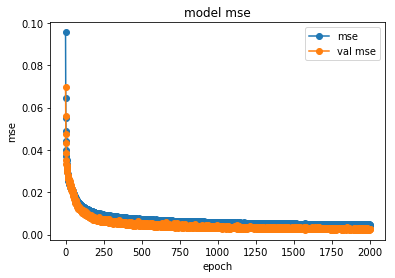

save the model


In [4]:
# -*- coding: utf-8 -*-
"""
Created on Tue Mar  7 15:43:18 2017

@author: hanar
"""
import time
import numpy as np
import os
from keras.utils import np_utils
from keras.models import Sequential
from keras.layers import Dense, Activation, Dropout
from keras.optimizers import SGD
from keras.optimizers import RMSprop
from keras.optimizers import Adagrad
from keras.optimizers import Adadelta
from keras.optimizers import Adam
from keras.optimizers import Adamax
from keras.optimizers import Nadam
from keras.callbacks import ModelCheckpoint
from keras.callbacks import EarlyStopping
from keras.callbacks import TensorBoard
from keras.models import load_model
#from keras.utils.visualize_util import plot
import matplotlib.pyplot as plt
import keras.callbacks
import keras.backend.tensorflow_backend as KTF
import tensorflow as tf

#Global variables for normalizing parameters
max_x = 1.0
min_x = 0.0
max_y = 1.0
min_y = 0.0


def deep_learning_tsunami(resdir, X_train_raw, y_train_raw, X_test_raw, y_test_raw,
                            _lr=0.02, _decay=0,
                            _validation_split=0.2, _batch_size=32,
                            _momentum=0.9, _nesterov=True,
                            num_layers=4, dropout=0.5,
                            node_num = 2500,
                            _epochs=2000):
    """
    Creating the inversion model of turbidity currents by deep learning
    """
    #Normalizing dataset
    X_train = get_normalized_data(X_train_raw, min_x, max_x)
    X_test = get_normalized_data(X_test_raw, min_x, max_x)
    y_train = get_normalized_data(y_train_raw, min_y, max_y)
    y_test = get_normalized_data(y_test_raw, min_y, max_y)
    
    #Generation of neural network model
    model = Sequential()
    model.add(Dense(node_num, input_dim=X_train.shape[1], activation='relu', kernel_initializer ='glorot_uniform'))#1st layer
    model.add(Dropout(dropout))
    for i in range(num_layers - 2):
        model.add(Dense(node_num, activation='relu', kernel_initializer ='glorot_uniform'))#2nd layer
        model.add(Dropout(dropout))
    model.add(Dense(y_train.shape[1], activation = 'relu', kernel_initializer ='glorot_uniform')) #last layer
    
    #Compiling the model
    model.compile(loss="mean_squared_error", 
              optimizer=SGD(lr=_lr, decay=_decay, momentum=_momentum, nesterov=_nesterov),
              #optimizer=Adadelta(),
              metrics=["mean_squared_error"])    
    
    #Perform learning
    t = time.time()
    check = ModelCheckpoint("model3.hdf5")
    #es_cb = EarlyStopping(monitor='val_loss', patience=5, verbose=0, mode='auto')
    #tb_cb = TensorBoard(log_dir=resdir, histogram_freq=2, write_graph=True, write_images=True)
    history = model.fit(X_train, y_train, epochs=_epochs, 
                    validation_split=_validation_split, batch_size=_batch_size,
                    callbacks=[check])
    
    #Evaluate learning result
    loss_and_metrics = model.evaluate(X_test,y_test)
    print("\nloss:{} mse:{}".format(loss_and_metrics[0],loss_and_metrics[1]))
    
    print("Elapsed time: {:.1f} sec.".format(time.time()-t))
    
    #Visualize learning result   
    #plot(model, to_file="model.png", show_shapes=True, show_layer_names=True)

    # model The state of change when letting you learnplot
    plot_history(history)
    
    return model, history

def apply_model(model, X, min_x, max_x, min_y, max_y):
    """
    Apply model
    Maximum and minimum values ​​of X and Y are required to normalize
    """
    X_norm =  (X - min_x) / (max_x - min_x)
    Y_norm = model.predict(X_norm)
    Y = Y_norm*(max_y - min_y)+min_y
    return Y

def plot_history(history):
    # Plot accuracy history
    plt.plot(history.history['mean_squared_error'],"o-",label="mse")
    plt.plot(history.history['val_mean_squared_error'],"o-",label="val mse")
    plt.title('model mse')
    plt.xlabel('epoch')
    plt.ylabel('mse')
    plt.legend(loc="upper right")
    plt.show()

#    # 損失の履歴をプロット
#    plt.plot(history.history['loss'],"o-",label="loss",)
#    plt.plot(history.history['val_loss'],"o-",label="val_loss")
#    plt.title('model loss')
#    plt.xlabel('epoch')
#    plt.ylabel('loss')
#    plt.legend(loc='upper right')
#    plt.show()

def test_model(model, x_test):
    #Test the results
    
    x_test_norm = get_normalized_data(x_test, min_x, max_x)
    test_result_norm = model.predict(x_test_norm)
    test_result = get_raw_data(test_result_norm, min_y, max_y)
    
    return test_result


def save_result(savedir, model, history, test_result):
    
    
    np.savetxt(savedir + 'test_result.txt',test_result,delimiter=',')
    np.savetxt(savedir+'loss.txt',history.history.get('loss'),delimiter=',')
    np.savetxt(savedir+'val_loss.txt',history.history.get('val_loss'),delimiter=',')
    
    #Serialize model and save
    print('save the model')
    model.save(savedir + 'model3.hdf5')

def load_data(datadir):
    """
    This function load training and test data sets, and returns variables
    """
    global min_x, max_x, min_y, max_y
    
    x_train = np.loadtxt(datadir + 'x_train.txt',delimiter=',')
    x_test = np.loadtxt(datadir + 'x_test.txt',delimiter=',')
    y_train = np.loadtxt(datadir + 'icond_train.txt',delimiter=',')
    y_test = np.loadtxt(datadir + 'icond_test.txt',delimiter=',')
    min_y = np.loadtxt(datadir + 'icond_min.txt',delimiter=',')
    max_y = np.loadtxt(datadir + 'icond_max.txt',delimiter=',')
    [min_x, max_x] = np.loadtxt(datadir + 'x_minmax.txt',delimiter=',')
    
    return x_train, y_train, x_test, y_test

def set_minmax_data(_min_x, _max_x, _min_y, _max_y):
    global min_x, max_x, min_y, max_y
    
    min_x, max_x, min_y, max_y = _min_x, _max_x, _min_y, _max_y
    return
    


def get_normalized_data(x, min_val, max_val):
    """
    Normalizing the training and test dataset
    """
    x_norm = (x - min_val) / (max_val - min_val)
    
    return x_norm

def get_raw_data(x_norm, min_val, max_val):
    """
    Get raw data from the normalized dataset
    """
    x = x_norm * (max_val - min_val) + min_val
    
    return x

if __name__ == "__main__":
    
    #Reading data  
    datadir = '/home/rimali2009/FITTNUSS-forward_training_DNN/data_g6_300grid_H_5000_20_11_roi1000/'
    resdir = '/home/rimali2009/FITTNUSS-forward_training_DNN/result_g6_300grid_H_5000_20_11_roi1000/'
    if not os.path.exists(resdir):
        os.mkdir(resdir)
    
    x_train, y_train, x_test, y_test = load_data(datadir)
    
     
    #Execution of learning
    testcases = [4500]
    for i in range(len(testcases)):
        resdir_case = resdir + '{}/'.format(testcases[i])        
        if not os.path.exists(resdir_case):
            os.mkdir(resdir_case)
        x_train_sub = x_train[0:testcases[i],:]
        y_train_sub = y_train[0:testcases[i],:]
        model, history = deep_learning_tsunami(resdir_case, x_train_sub, y_train_sub, x_test, y_test, num_layers=5)
        #Verify and save results
        result = test_model(model, x_test)
        save_result(resdir_case,model,history,result)




(500, 9)


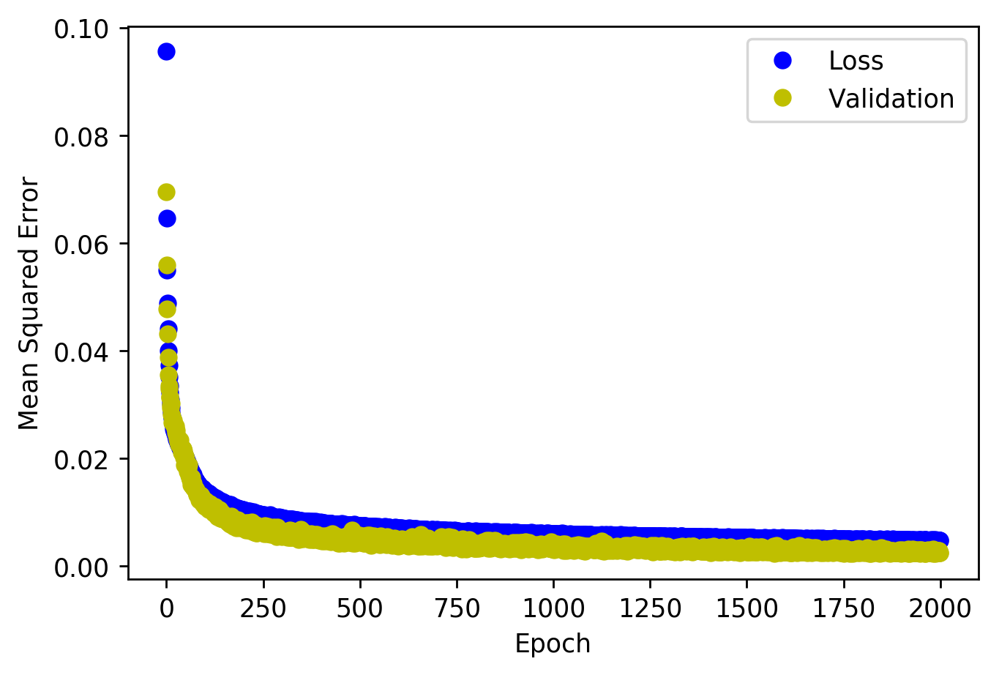

/home/rimali2009/anaconda3/envs/test3/lib/python3.6/site-packages/matplotlib/font_manager.py:1241: UserWarning: findfont: Font family ['Century Gothic'] not found. Falling back to DejaVu Sans.
  (prop.get_family(), self.defaultFamily[fontext]))


<Figure size 432x288 with 0 Axes>

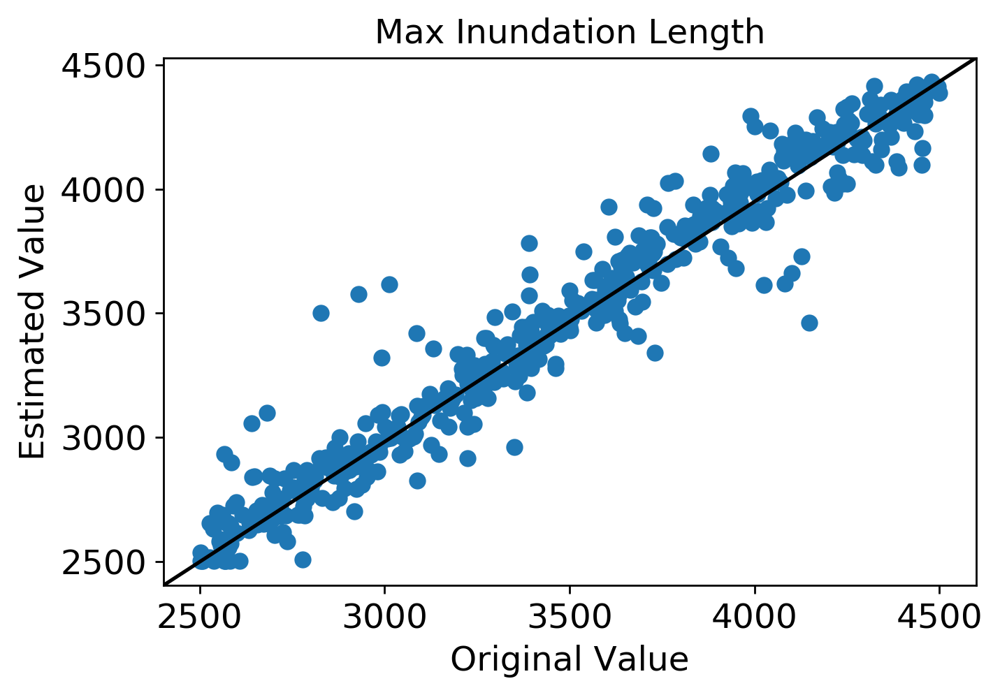

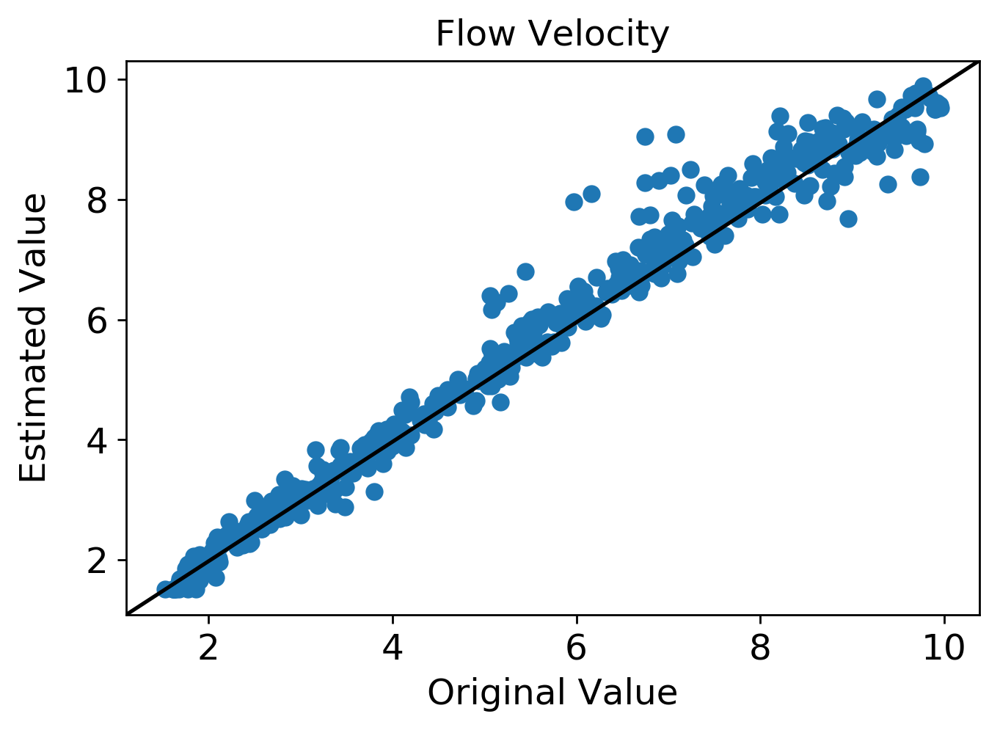

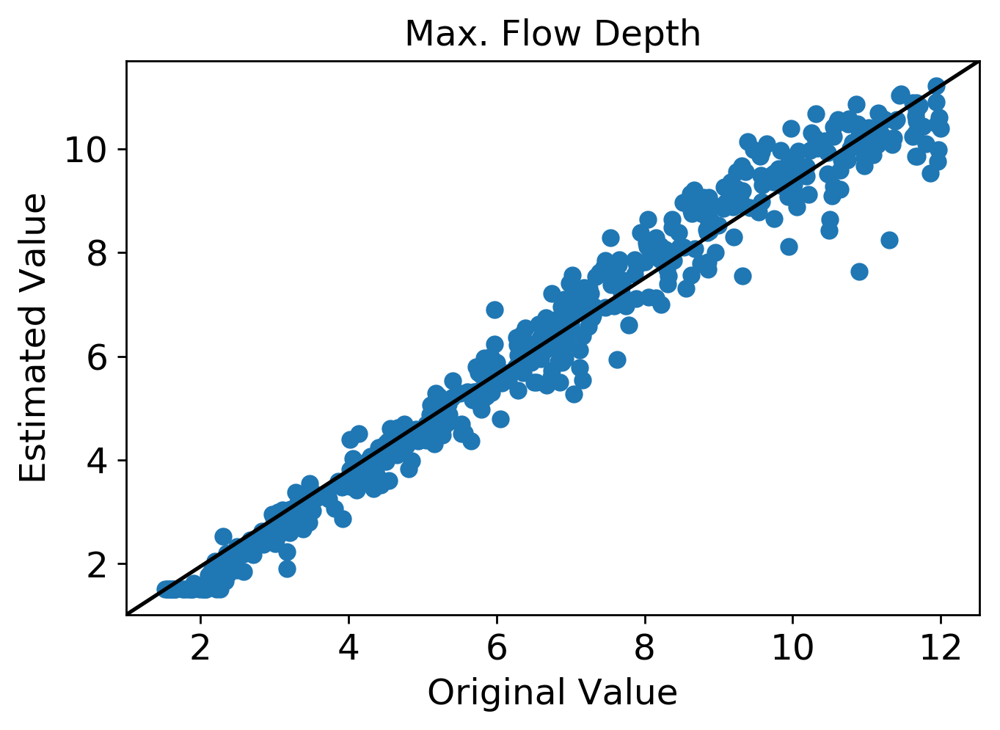

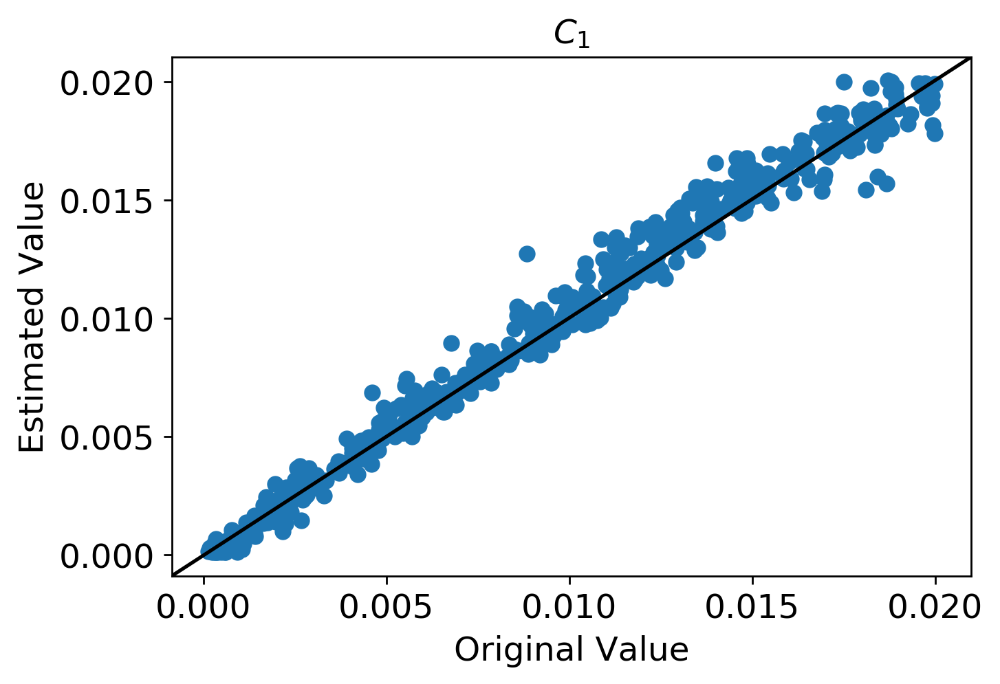

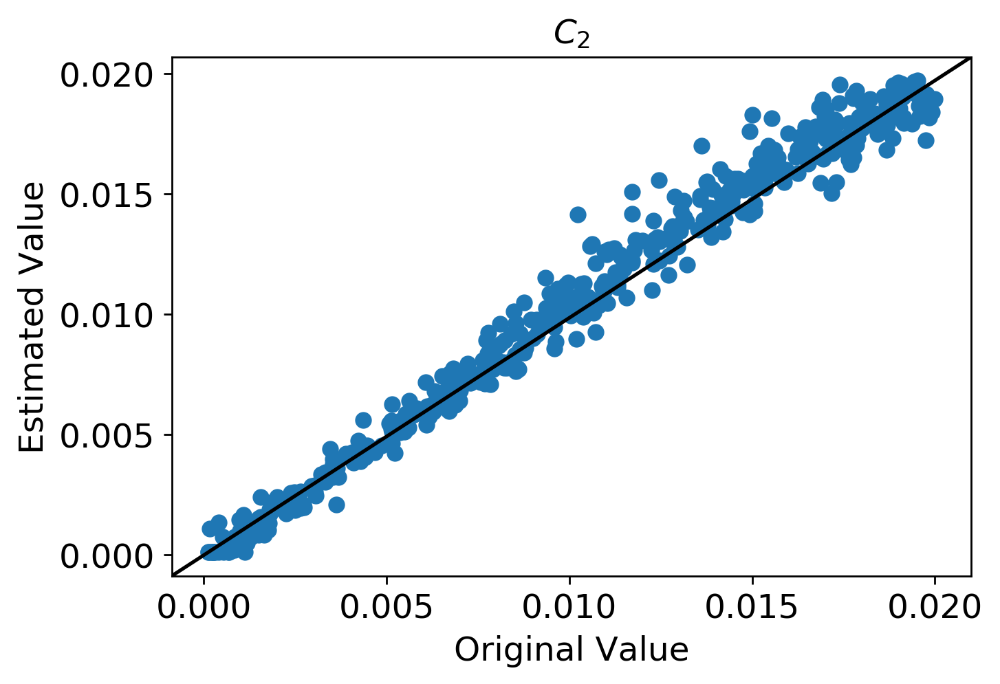

...

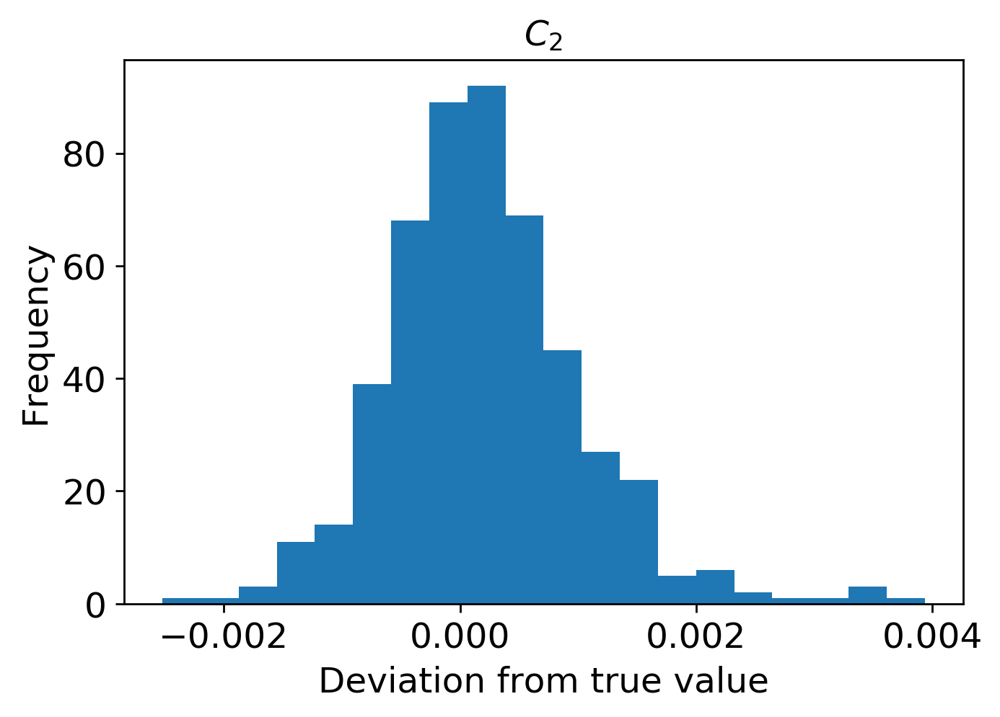

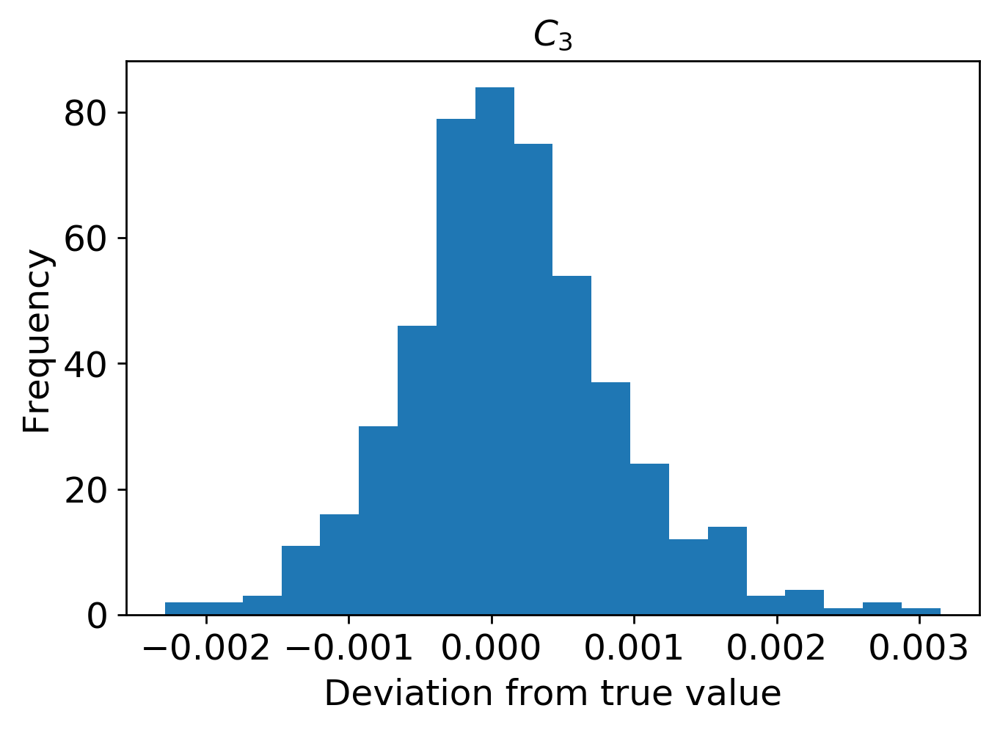

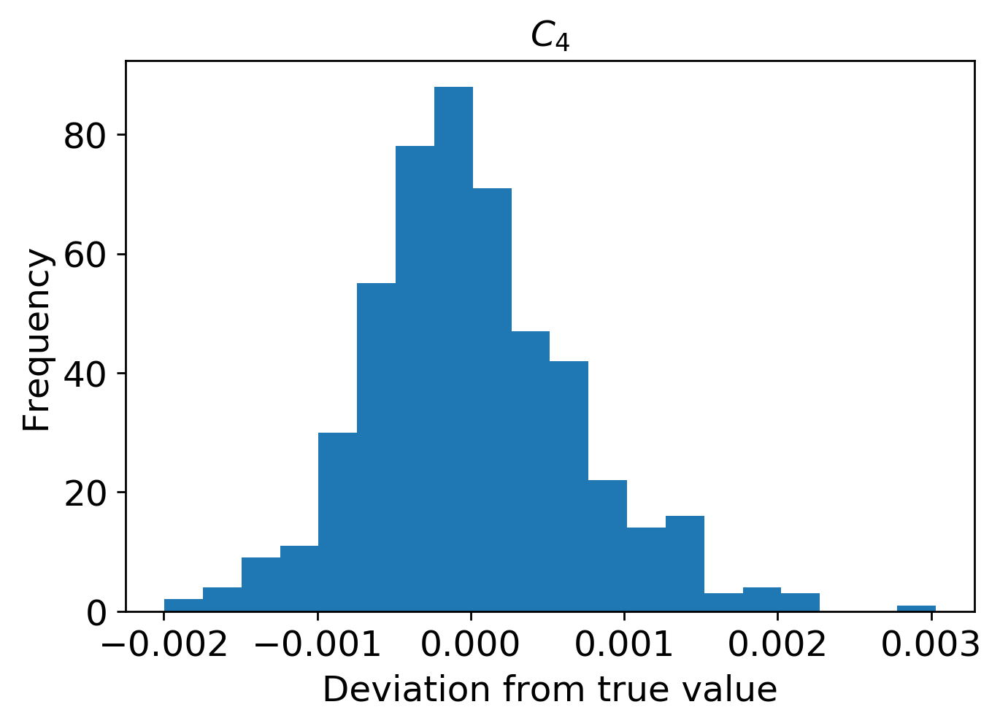

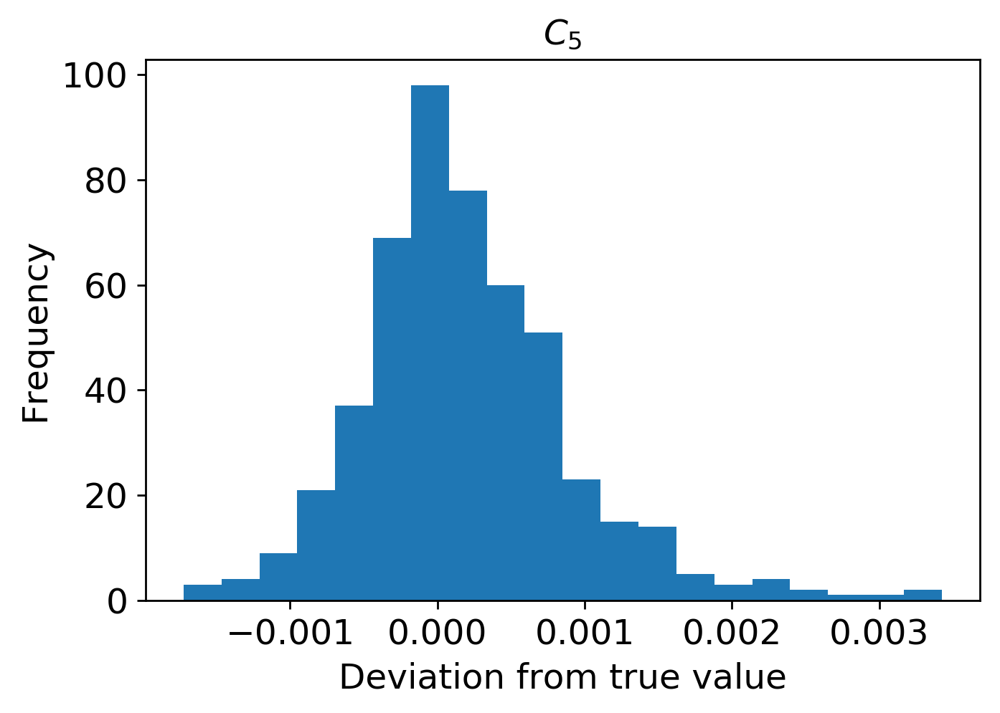

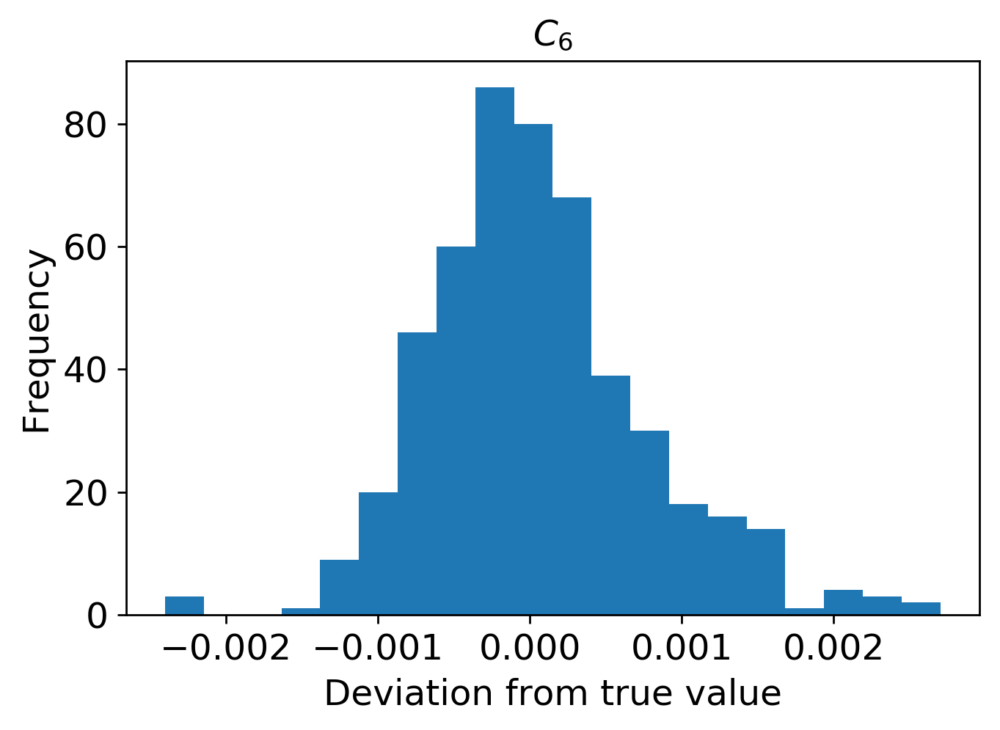

In [5]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

datadir = '/home/rimali2009/FITTNUSS-forward_training_DNN/data_g6_300grid_H_5000_20_11_roi1000/'
resdir = '/home/rimali2009/FITTNUSS-forward_training_DNN/result_g6_300grid_H_5000_20_11_roi1000/4500/'

test_result = np.loadtxt(resdir + 'test_result.txt',delimiter=',')
icond = np.loadtxt(datadir + 'icond_test.txt',delimiter=',')
print(icond.shape)
loss = np.loadtxt(resdir+'loss.txt',delimiter=',')
epoch = range(0,2000)
vloss = np.loadtxt(resdir+'val_loss.txt',delimiter=',')
resi = test_result - icond

fig = plt.figure(num=None,dpi=250, facecolor='w', edgecolor='k')
plt.plot(epoch, loss, 'bo',label='Loss')
plt.plot(epoch, vloss, 'yo',label='Validation')
plt.xlabel('Epoch')
plt.ylabel('Mean Squared Error')
plt.legend(loc="upper right")
plt.savefig(resdir+ 'mse.eps')
plt.show()

fig2 = plt.figure()
hfont = {'fontname':'Century Gothic'}
textcol = 'k'
titlelabel = ['Max Inundation Length','Flow Velocity', 'Max. Flow Depth', '$C_1$', '$C_2$', '$C_3$', '$C_4$','$C_5$','$C_6$']


    
for i in range(len(titlelabel)):
    plt.figure(num=None,dpi=250, facecolor='w', edgecolor='k')
    plt.plot(icond[:,i],test_result[:,i],"o")
    x=icond[:,i]
    y=test_result[:,i]
    y_lim = plt.ylim()
    x_lim = plt.xlim()
    plt.plot(x_lim, y_lim, 'k-', color = 'k')
    plt.ylim(y_lim)
    plt.xlim(x_lim)
    plt.xlabel('Original Value',color=textcol,size=14,**hfont)
    plt.ylabel('Estimated Value',color=textcol,size=14,**hfont)
    plt.title(titlelabel[i],color=textcol,size=14,**hfont)
    plt.tick_params(labelsize=14,colors=textcol)
    plt.savefig(resdir+titlelabel[i] + '.eps')
    #plt.show()

for i in range(len(titlelabel)):
    plt.figure(num=None,dpi=250, facecolor='w', edgecolor='k')
    plt.hist(resi[:,i],bins=20)
    plt.title(titlelabel[i],color=textcol,size=14,**hfont)
    plt.xlabel('Deviation from true value',color=textcol,size=14,**hfont)
    plt.ylabel('Frequency',color=textcol,size=14,**hfont)
    plt.tick_params(labelsize=14,colors=textcol)
    plt.savefig(resdir+titlelabel[i] + 'hist' + '.eps')
    plt.show()

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model
from scipy import stats
from scipy.interpolate import interp1d 
import pandas as pd
from pykrige import OrdinaryKriging as OK
import ipdb


datadir = '/home/rimali2009/FITTNUSS-forward_training_DNN/data_g6_300grid_H_5000_20_11_roi1000/'
resdir = '/home/rimali2009/FITTNUSS-forward_training_DNN/result_g6_300grid_H_5000_20_11_roi1000/4500/'
#Initial setting
if not "model" in locals(): 
    model = load_model(resdir+'model3.hdf5')
#gclass = 3
#gclass_label = ["500 $\mu$m","125 $\mu$m","63 $\mu$m"]
gclass = 6
gclass_label = ["615 ${\mu}m$","406 ${\mu}m$","268 ${\mu}m$","177 ${\mu}m$", "117 ${\mu}m$","77 ${\mu}m$"]
topodx = 15.0
coord_num = int(model.layers[0].input_shape[1]/gclass)

#Acquires a value for normalizing input data to [0, 1]
min_x, max_x = np.loadtxt(datadir + 'x_minmax.txt',delimiter=',')
y_min = np.loadtxt(datadir + 'icond_min.txt',delimiter=',')
y_max = np.loadtxt(datadir + 'icond_max.txt',delimiter=',')

#Read outcrop data
#dist_max = 22000. #Distance of distal end of learning data
outcrop = pd.read_csv('../FITTNUSS-forward_training_DNN/sendai_increased_class_edit.csv')
#outcrop = pd.read_csv('../DeepLearningTurbidite_Fukuda/GA_naruse_v2.csv')
#outcrop = outcrop.append(pd.DataFrame([[0,'Loc0',0,0,0],[dist_max,'LocE',0,0,0]], columns=outcrop.columns))
outcrop = outcrop.sort_values('distance')
outcrop['distance'] = outcrop['distance'] - 0
#d = pd.DataFrame(np.zeros((1, 7)),columns=['distance', 'g1','g2','g3','g4','g5','g6'])
#print(d)
#v=np.concatenate((outcrop, d))
#print(v)
#outcrop=pd.DataFrame(v,columns=['distance', 'g1','g2','g3','g4','g5','g6'])
#outcrop['distance'].iloc[-1]=4000
#outcrop = outcrop.append(pd.DataFrame([[0,'Loc0',0,0,0,0]], columns=outcrop.columns))
print(outcrop)

#Preparation under interpolation
thick_interp = np.zeros([1,coord_num*gclass])#補間されたサンプル厚さデータ
outcrop_x_id = np.round(outcrop['distance']/topodx).astype(np.int32) #逆解析システムでのサンプリング地点のindex番号
x = np.arange(0,coord_num*topodx,topodx)

#Complement data
for j in range(gclass):
    f = interp1d(outcrop['distance'],outcrop.iloc[:,j+1], kind="linear",bounds_error=False,fill_value='extrapolate')
    #f = interp1d(outcrop['distance'],outcrop.iloc[:,j+2], kind="linear",bounds_error=False,fill_value='extrapolate') 
    #Interpolation function of jth granularity level
    thick_interp[0,coord_num*j:coord_num*(j+1)] = f(x) #Supplemented data

#ipdb.set_trace()
#Kriging Interpolation by
#vparams = np.array([[0.035, 10000., 0.001],[0.006, 10000., 0.002],[0.005, 10000., 0.002],[0.035, 10000., 0.001]])
#for j in range(gclass):
    #okip = OK(outcrop['distance'],np.zeros(outcrop['distance'].shape),outcrop.iloc[:,j+1],variogram_model='power',)
    #okip.display_variogram_model()
    #ipdata, ipstd = okip.execute('grid',x,np.array([0.]))
    #ipdata = np.squeeze(ipdata)
    #thick_interp[0,coord_num*j:coord_num*(j+1)] = ipdata #Assign complemented d

#Normalize data
thick_interp[thick_interp < 0] = 0
thick_interp_norm =  (thick_interp - min_x) / (max_x - min_x)

#Perform inverse analysis
test_result_outcrop = model.predict(thick_interp_norm)
test_result_outcrop = test_result_outcrop * (y_max - y_min) + y_min
print(test_result_outcrop)
#add=np.array(3000)
#test_result_outcrop_add=np.concatenate((add,test_result_outcrop), axis=None)
#Output results
#print(test_result_outcrop_add)
np.savetxt('outcrop_result_g6_g300_H_5000_20_11_roi1000.txt',test_result_outcrop, delimiter=',')
for i in range(len(gclass_label)):
    plt.plot(x,thick_interp[0,coord_num * i:coord_num * (i+1)],label=gclass_label[i])
plt.legend()
plt.show()



       distance        g1        g2        g3        g4        g5        g6
0      0.000000  0.036771  0.167260  0.114845  0.008449  0.002190  0.005161
1    103.794102  0.000000  0.075200  0.153283  0.013753  0.001885  0.000442
2    171.620654  0.002130  0.051171  0.084309  0.006218  0.001867  0.002843
3    397.112167  0.003115  0.016359  0.078858  0.011466  0.000597  0.000054
4    595.912969  0.000732  0.016896  0.028720  0.002661  0.000914  0.000000
5    707.625749  0.000143  0.002228  0.005502  0.000900  0.000187  0.000104
6    796.435078  0.000236  0.004337  0.021204  0.003169  0.000309  0.000080
7    895.065500  0.001688  0.016059  0.081413  0.020284  0.006824  0.004628
8    988.394177  0.004567  0.008166  0.074658  0.016913  0.002424  0.001580
9   1081.819325  0.001567  0.016305  0.060234  0.011086  0.004165  0.001994
10  1195.756993  0.001022  0.002370  0.017565  0.004194  0.000567  0.000142
11  1290.372534  0.000000  0.004121  0.057974  0.014565  0.000426  0.000213
12  1400.896

<Figure size 640x480 with 1 Axes>

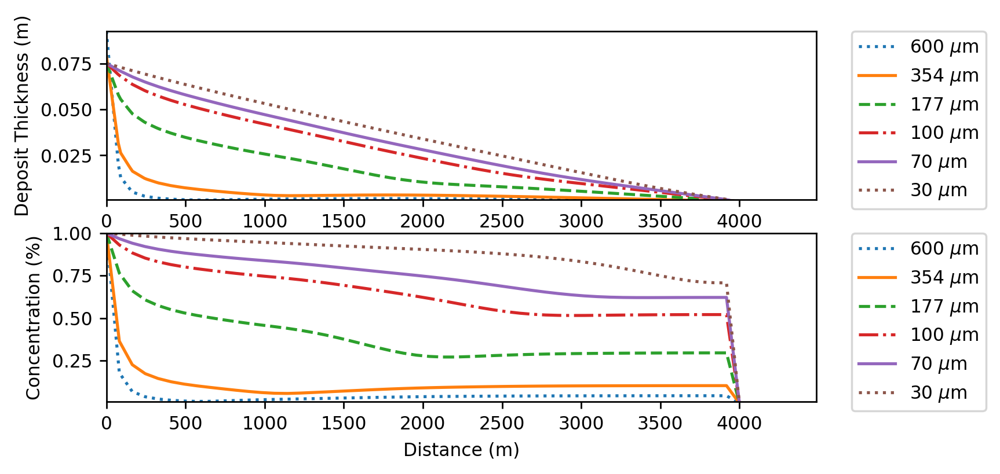

(5000, 9)
(5000, 1800)


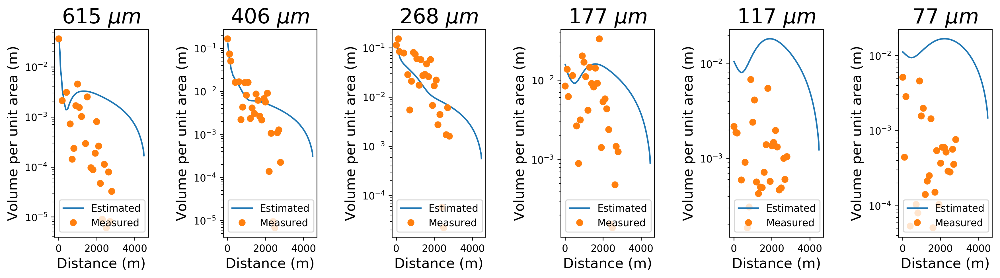

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import Forward_model_modified_FITTNUSS_5000_g6_300grid_19_11_case2 as fmodel
import time
import ipdb
%matplotlib inline

#Basic setting

#dist_max = 3000.
gclass = 6
topodx=15.0
gclass_name = ['615microm','406microm','268microm','177microm','117microm','77microm']
#gclass_name = ['500micron', '125micron', '63micron']
gname_tex = ["615 ${\mu}m$","406 ${\mu}m$","268 ${\mu}m$","177 ${\mu}m$", "117 ${\mu}m$","77 ${\mu}m$"]
#gname_tex = ['500 $\mu$m','125 $\mu$m','63 $\mu$m']
#calcdir = 'home/rimali2009/FITTNUSS-forward_training_DNN/'
#calcdir = '/home/naruse/Documents/Documents/MATLAB/TCtrainData_forML/TCModel_for_MLTEST/test_output_otadai07/'

#Load estimate
#H1 = np.loadtxt(calcdir + 'H1.txt',delimiter=',')
#H2 = np.loadtxt(calcdir + 'H2.txt',delimiter=',')
#H3 = np.loadtxt(calcdir + 'H3.txt',delimiter=',')
#H4 = np.loadtxt(calcdir + 'H4.txt',delimiter=',')
#Ht = np.loadtxt(calcdir + 'Ht.txt',delimiter=',')
#U = np.loadtxt(calcdir + 'U.txt',delimiter=',')
#xi = np.loadtxt(calcdir + 'xi.txt',delimiter=',')
#x = np.loadtxt(calcdir + 'x.txt',delimiter=',')
#x_bed = np.loadtxt(calcdir + 'x_init.txt',delimiter=',')
#eta_init = np.loadtxt(calcdir + 'eta_init.txt',delimiter=',')
#Ct = np.loadtxt(calcdir + 'Ct.txt',delimiter=',')
#time = np.loadtxt(calcdir + 'time.txt',delimiter=',')
estimated_icond=np.loadtxt('outcrop_result_g6_g300_H_5000_20_11_roi1000.txt', delimiter=',')
start = time.time()
fmodel.read_setfile("config_g6_300grid_19_11_case2.ini")
(x,C,x_dep,deposit) = fmodel.forward(estimated_icond)
np.savetxt('eta_estimated_thickness_5K_g6_TC4_Rwcnst_H_5000_20_11_roi1000.csv', deposit, delimiter=',')
np.savetxt('eta_estimated_Distance_5K_g6_TC4_Rwcnst_H_5000_20_11_roi1000.csv', x_dep,delimiter=',')
estimated_dep_thickness_5000=np.transpose(np.loadtxt('/home/rimali2009/FITTNUSS-forward_training_DNN/'+'eta_estimated_thickness_5K_g6_TC4_Rwcnst_H_5000_20_11_roi1000.csv', delimiter=','))
estimated_dep_thickness_5000=pd.DataFrame(estimated_dep_thickness_5000,columns=['615microm','406microm','268microm','177microm','117microm','77microm'])
estimated_dep_distance_5000=np.transpose(np.loadtxt('/home/rimali2009/FITTNUSS-forward_training_DNN/'+'eta_estimated_Distance_5K_g6_TC4_Rwcnst_H_5000_20_11_roi1000.csv', delimiter=','))
estimated_dep_distance_5000=pd.DataFrame(estimated_dep_distance_5000,columns=['distance'])
estimated_dep_5000=pd.concat([estimated_dep_distance_5000,estimated_dep_thickness_5000],axis=1)
np.savetxt('estimated_dep_5K_g6_TC4_Rwcnst_H_5000_20_11_roi1000.csv',estimated_dep_5000,delimiter=',')
#data_estim=pd.DataFrame(estimated_dep_5000,columns=['distance','1.5phi','2.5phi','3.5phi','4.5phi'])

#Formatting the loaded data
#estimated_dep_df = pd.DataFrame(estimated_dep,columns=['distance','1.5phi','2.5phi','3.5phi','4.5phi'])
#estimated_dep = pd.DataFrame(np.array([x_bed - dist_offset,H1[-1,:],H2[-1,:],H3[-1,:]]).T,columns=['distance','500micron','125micron','63micron'])
estimated_dep_5000= estimated_dep_5000.query('distance > 0')
#estimated_dep_5000 = estimated_dep_5000.query('distance < {}'.format(dist_max))

#Read original data
outcrop = pd.read_csv('../FITTNUSS-forward_training_DNN/sendai_increased_class.csv')
outcrop= pd.DataFrame(outcrop,columns=['distance','615microm','406microm','268microm','177microm','117microm','77microm'])
#outcrop = pd.read_csv('../DeepLearningTurbidite_Fukuda/GA_naruse_v2.csv')
#outcrop = outcrop.append(pd.DataFrame([[0,'Loc0',0,0,0],[dist_max,'LocE',0,0,0]], columns=outcrop.columns))
#outcrop = outcrop.sort_values('distance')
#outcrop['distance'] = outcrop['distance'] - 1000

#Plot
plt.figure(num=None, figsize=(17, 4), dpi=250, facecolor='w', edgecolor='g')
hfont = {'fontname':'Sans'}
plt.subplots_adjust(bottom=0.15, wspace=0.8)

for i in range(gclass):
    plt.subplot(1,gclass,i+1)
    plt.plot(estimated_dep_5000['distance'],estimated_dep_5000[gclass_name[i]],'-', label='Estimated')
    plt.plot(outcrop['distance'], outcrop[gclass_name[i]],'o', label='Measured')
    plt.yscale('log')
    plt.title(gname_tex[i], size=21,**hfont)
    plt.xlabel('Distance (m)', size = 14, **hfont)
    plt.ylabel('Volume per unit area (m)', size = 14, **hfont)
    plt.legend(fontsize=10)
    plt.savefig("thickness_distance_curve_5000_g6_300grid_H_5000_20_11_roi1000.png")
    plt.savefig("thickness_distance_curve_5000_g6_300grid_H_5000_20_11_roi1000.eps")
plt.show()



Using TensorFlow backend.


       distance        g1        g2        g3        g4        g5        g6
0      0.000000  0.036771  0.167260  0.114845  0.008449  0.002190  0.005161
1    103.794102  0.000000  0.075200  0.153283  0.013753  0.001885  0.000442
2    171.620654  0.002130  0.051171  0.084309  0.006218  0.001867  0.002843
3    397.112167  0.003115  0.016359  0.078858  0.011466  0.000597  0.000054
4    595.912969  0.000732  0.016896  0.028720  0.002661  0.000914  0.000000
5    707.625749  0.000143  0.002228  0.005502  0.000900  0.000187  0.000104
6    796.435078  0.000236  0.004337  0.021204  0.003169  0.000309  0.000080
7    895.065500  0.001688  0.016059  0.081413  0.020284  0.006824  0.004628
8    988.394177  0.004567  0.008166  0.074658  0.016913  0.002424  0.001580
9   1081.819325  0.001567  0.016305  0.060234  0.011086  0.004165  0.001994
10  1195.756993  0.001022  0.002370  0.017565  0.004194  0.000567  0.000142
11  1290.372534  0.000000  0.004121  0.057974  0.014565  0.000426  0.000213
12  1400.896

(1, 9)
[[4.66473946e+03 4.58134350e+00 3.88565503e+00 5.80849991e-03
  2.15595467e-02 2.05063860e-02 2.48756168e-03 1.65299061e-03
  1.74405640e-03]]
       distance        g1        g2        g3        g4        g5        g6
0      0.000000  0.036771  0.167260  0.114845  0.008449  0.002190  0.005161
1    103.794102  0.000000  0.075200  0.153283  0.013753  0.001885  0.000442
2    171.620654  0.002130  0.051171  0.084309  0.006218  0.001867  0.002843
3    397.112167  0.003115  0.016359  0.078858  0.011466  0.000597  0.000054
4    595.912969  0.000732  0.016896  0.028720  0.002661  0.000914  0.000000
5    707.625749  0.000143  0.002228  0.005502  0.000900  0.000187  0.000104
6    796.435078  0.000236  0.004337  0.021204  0.003169  0.000309  0.000080
7    895.065500  0.001688  0.016059  0.081413  0.020284  0.006824  0.004628
8    988.394177  0.004567  0.008166  0.074658  0.016913  0.002424  0.001580
9   1081.819325  0.001567  0.016305  0.060234  0.011086  0.004165  0.001994
10  1195.75699

/home/rimali2009/anaconda3/envs/test3/lib/python3.6/site-packages/matplotlib/font_manager.py:1241: UserWarning: findfont: Font family ['Century Gothic'] not found. Falling back to DejaVu Sans.
  (prop.get_family(), self.defaultFamily[fontext]))


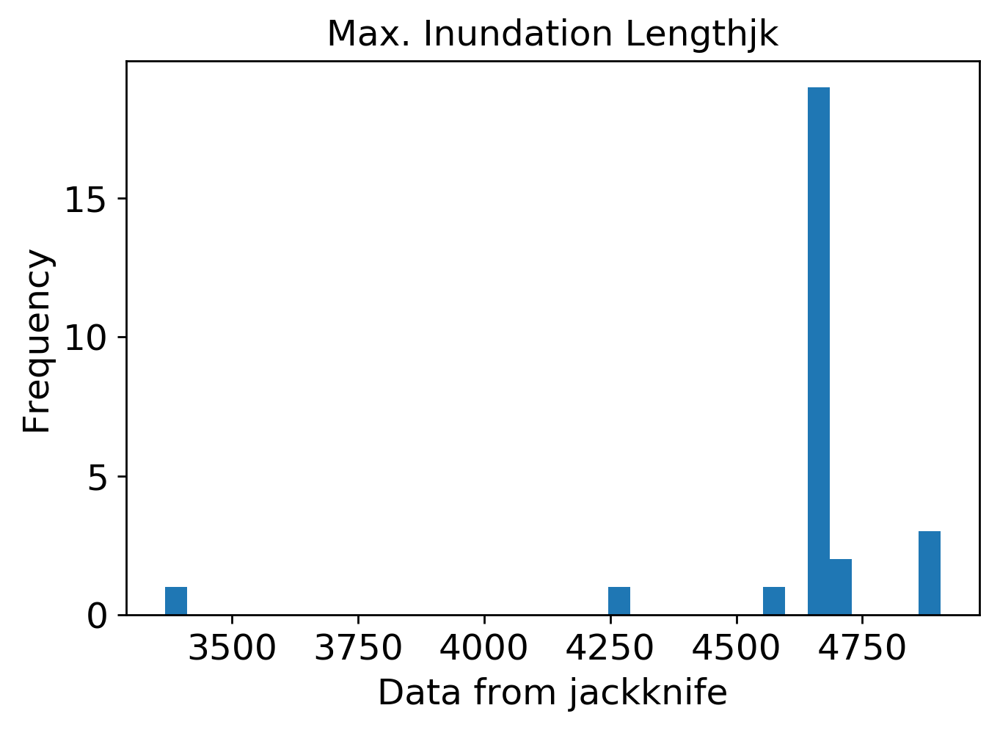

mean: 4.632367741462179
jk_e: 0.09726463761143497


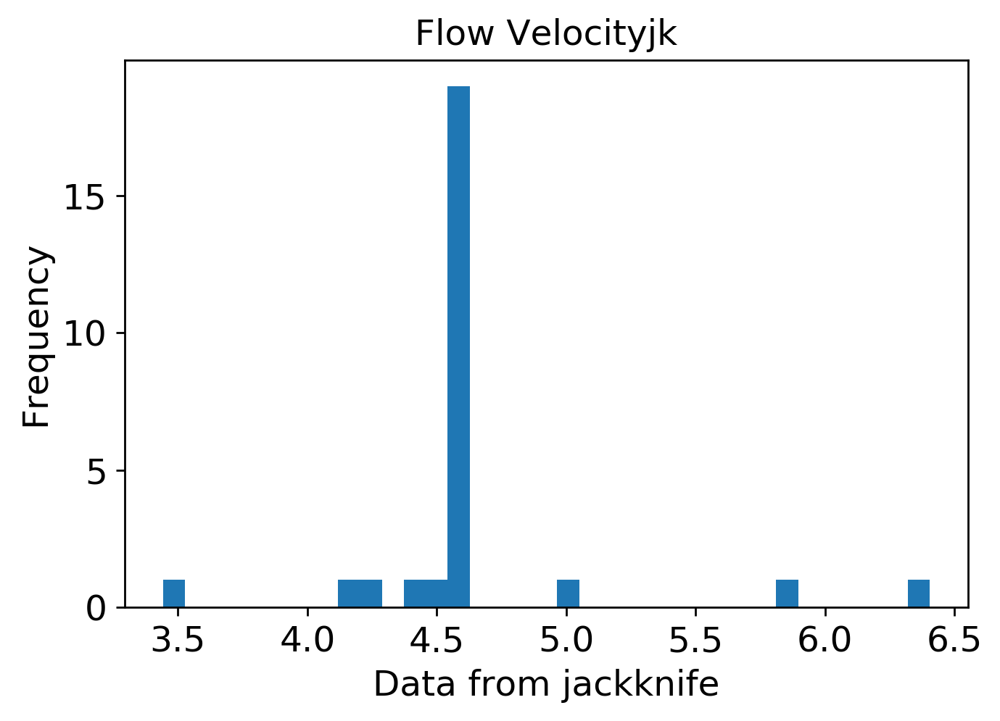

mean: 3.959687127795363
jk_e: 0.06982669494610858


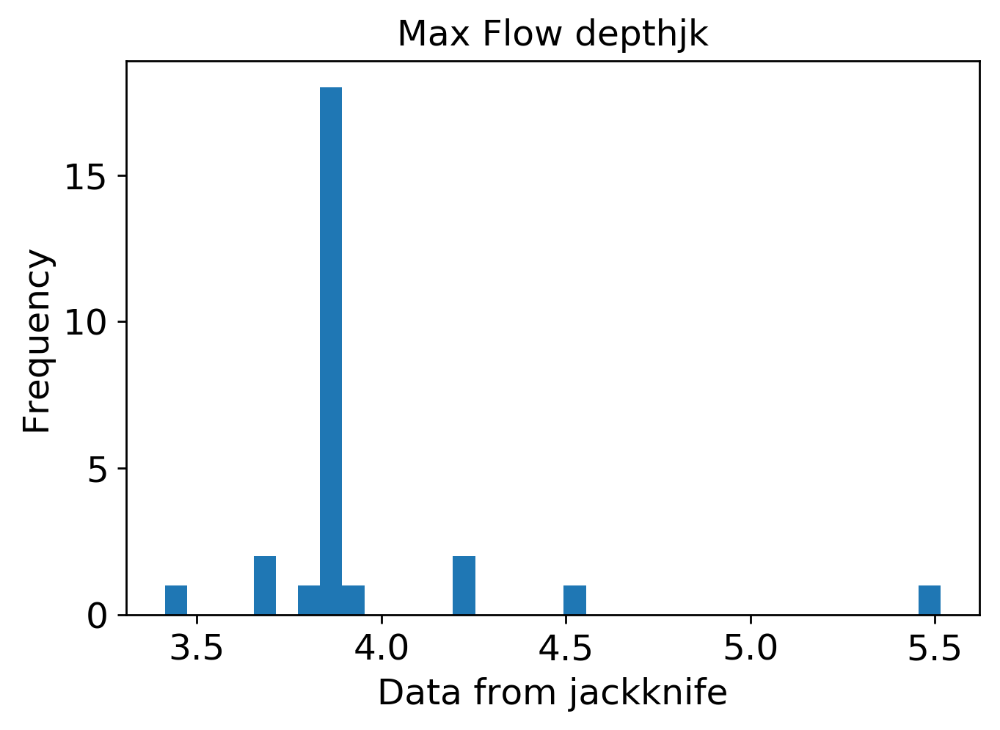

mean: 0.0056595308734662154
jk_e: 0.00020660014630739337


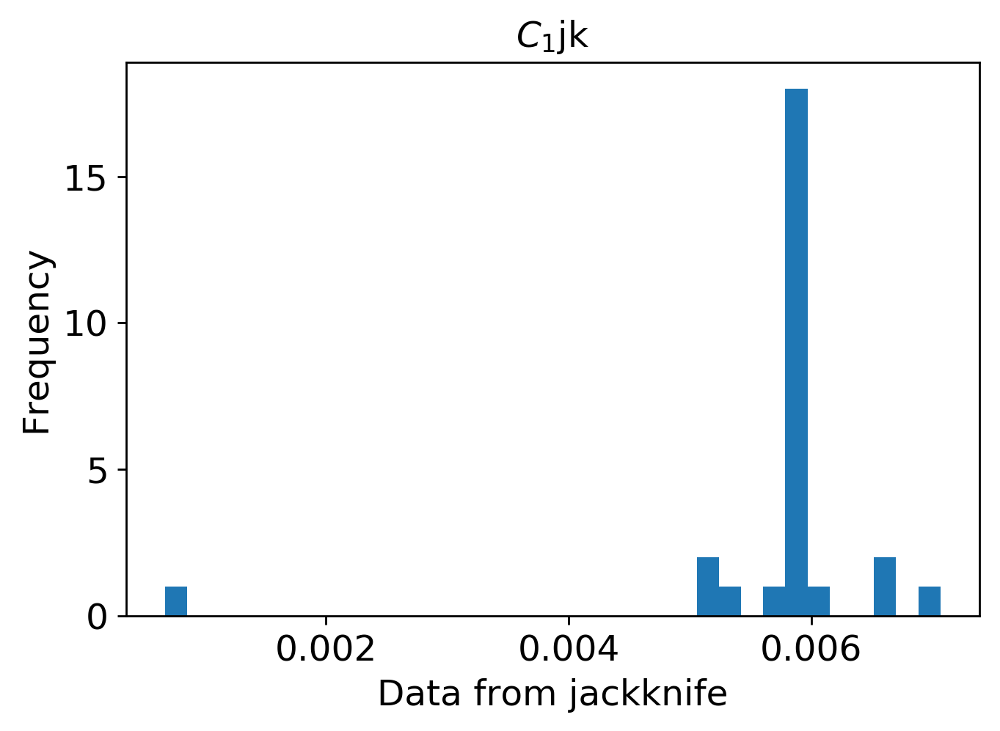

mean: 0.02141550796006772
jk_e: 0.0003089187979795735


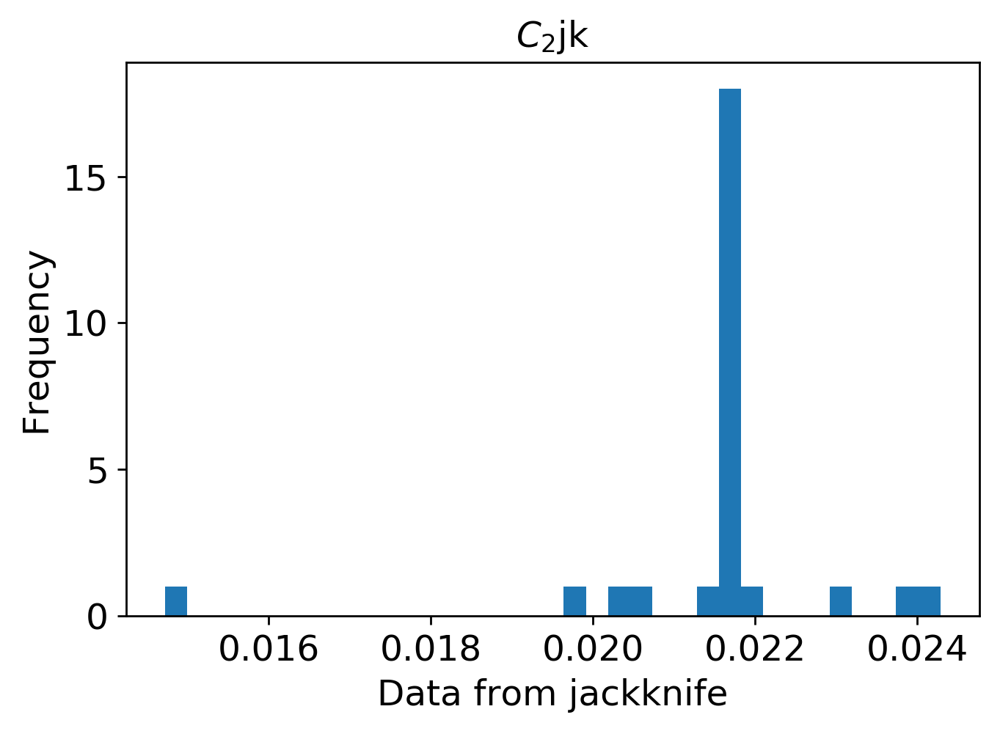

mean: 0.020712294141837166
jk_e: 0.0002902248197683816


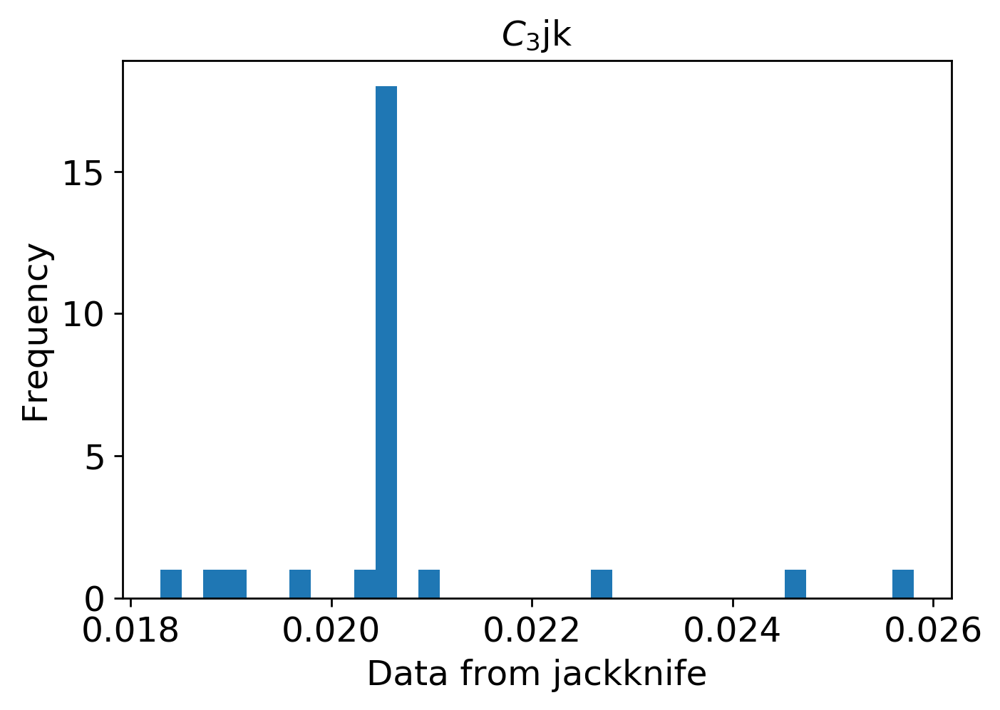

mean: 0.002543737091674224
jk_e: 7.930672409470999e-05


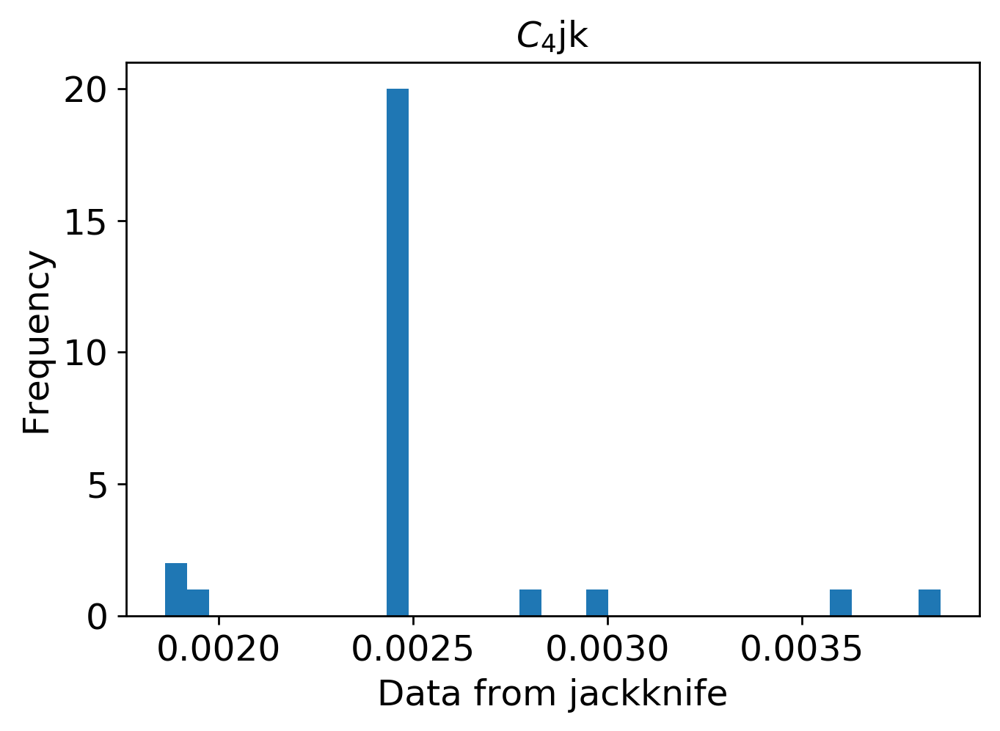

mean: 0.0016559922320875105
jk_e: 8.325165910057671e-05


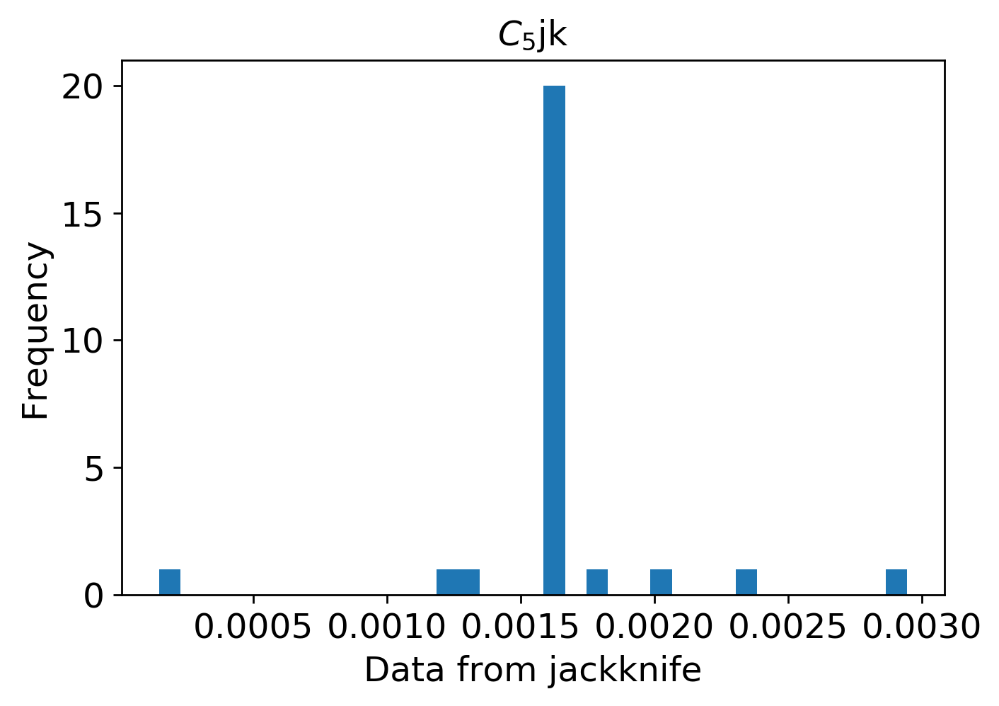

mean: 0.0018010467569325615
jk_e: 7.528056916479759e-05


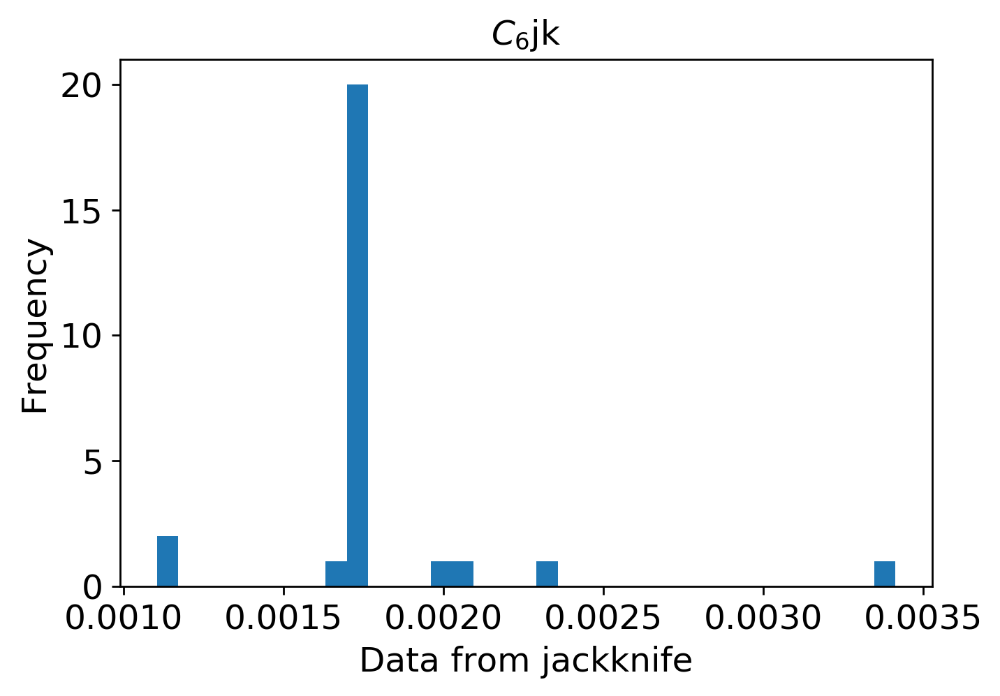

In [3]:
# Jackknife Method
import csv
import numpy as np
import pandas as pd
import math
from keras.models import load_model
from scipy.interpolate import interp1d
import matplotlib.pyplot as plt
%matplotlib inline

datadir = '/home/rimali2009/FITTNUSS-forward_training_DNN/data_g6_300grid_H_5000_20_11_roi1000/'
resdir = '/home/rimali2009/FITTNUSS-forward_training_DNN/result_g6_300grid_H_5000_20_11_roi1000/4500/'
# Initial setting
if not "model" in locals():
    model = load_model(resdir+'model3.hdf5')
gclass = 6
gclass_label = ["615 ${\mu}m$", "406 ${\mu}m$", "268 ${\mu}m$",
                "177 ${\mu}m$", "117 ${\mu}m$", "77 ${\mu}m$"]
topodx = 15.0
coord_num = int(model.layers[0].input_shape[1]/gclass)
min_x, max_x = np.loadtxt(datadir + 'x_minmax.txt', delimiter=',')
y_min = np.loadtxt(datadir + 'icond_min.txt', delimiter=',')
y_max = np.loadtxt(datadir + 'icond_max.txt', delimiter=',')


a = pd.read_csv(
    '../FITTNUSS-forward_training_DNN/sendai_increased_class_edit.csv', delimiter=',')
print(a)
y = pd.DataFrame()
output = []

with open('output_final_20_11_roi1000.csv', 'w') as outfile:

    # x=[]
    for index in range(len(a)):
        df = y.append(pd.read_csv(
            '../FITTNUSS-forward_training_DNN/sendai_increased_class_edit.csv', skiprows=[index+1]))
        print(df)
        df = df.sort_values('distance')
        thick_interp = np.zeros([1, coord_num*gclass])
        x = np.arange(0, coord_num*topodx, topodx)
        for j in range(gclass):
            # Interpolation function of jth granularity level
            f = interp1d(df['distance'], df.iloc[:, j+1],
                         kind="linear", bounds_error=False,fill_value='extrapolate')
            thick_interp[0, coord_num*j:coord_num*(j+1)] = f(x)
        thick_interp[thick_interp < 0] = 0
        thick_interp_norm = (thick_interp - min_x) / (max_x - min_x)
        test_result_outcrop = model.predict(thick_interp_norm)
        test_result_outcrop = test_result_outcrop * (y_max - y_min) + y_min
        print(test_result_outcrop.shape)
        print(test_result_outcrop)
    # output.append(test_result_outcrop)
        np.savetxt(outfile,test_result_outcrop, delimiter=',')
        # outfile.write('# New iteration\n')
hfont = {'fontname': 'Century Gothic'}
textcol = 'k'
resi = np.loadtxt('output_final_20_11_roi1000.csv', delimiter=',')
titlelabel = ['Max. Inundation Lengthjk','Flow Velocityjk', 'Max Flow depthjk',
              '$C_1$jk', '$C_2$jk', '$C_3$jk', '$C_4$jk', '$C_5$jk', '$C_6$jk']
jk_er=[]
with open('jk_e_roi1000.txt','wb') as ftext:
    for i in range(len(titlelabel)):
        plt.figure(num=None, dpi=250, facecolor='w', edgecolor='k')
        plt.hist(resi[:, i], bins=35)
        mean = sum(resi[:,i]) / len(resi[:,i])
        print("mean:",mean)
        var_jk  = sum(pow(x-mean,2) for x in resi[:,i]) / ((len(resi[:,i])-1)*(len(resi[:,i])))
        jk_e= math.sqrt(var_jk)
        print("jk_e:",jk_e)
        e=np.append(jk_e,jk_er)
        np.savetxt(ftext,e,delimiter=',')
        plt.title(titlelabel[i], color=textcol, size=14, **hfont)
        plt.xlabel('Data from jackknife', color=textcol, size=14, **hfont)
        plt.ylabel('Frequency', color=textcol, size=14, **hfont)
        plt.tick_params(labelsize=14, colors=textcol)
        plt.savefig(resdir+titlelabel[i] + 'jkhist' + '.eps')
        plt.show()


# ROI 500

In [8]:
import numpy as np
import os
#import ipdb

def connect_dataset(file_list, icond_file_list, outputdir,
                    topodx=15, roi=2500, offset=5000,gclass_num=6,test_data_num=500):
    """
    複数のデータセットを連結する
    """
    #ipdb.set_trace()
    
    #Reading and combining files Decide start and end points of the learning area and convert them to grid numbers
    H = np.loadtxt(file_list[0], delimiter = ',')
    icond = np.loadtxt(icond_file_list[0], delimiter = ',')
    
    #Reading and combining files
    if len(file_list) > 1:
        for i in range(1, len(file_list)):
            H_temp = np.loadtxt(file_list[i], delimiter = ',')
            icond_temp = np.loadtxt(icond_file_list[i], delimiter = ',')
            H = np.concatenate((H,H_temp),axis=0)
            icond = np.concatenate((icond,icond_temp),axis = 0)
    
    roi_grids = int(roi / topodx)
    num_grids = int(H.shape[1] / gclass_num)
    H_subset = np.zeros([H.shape[0], roi_grids * gclass_num])
    for i in range(gclass_num):
        H_subset[:, i*roi_grids:(i+1)*roi_grids] = H[:, i*num_grids:(i*num_grids+roi_grids)]
    
    #Obtain the maximum and minimum values of data
    max_x = np.max(H_subset)
    min_x = np.min(H_subset)
    icond_max = np.max(icond, axis=0)
    icond_min = np.min(icond, axis=0)
    
    #Split the data into tests and training
    H_train = H_subset[0:-test_data_num,:]
    H_test = H_subset[H_subset.shape[0] - test_data_num:,:]
    icond_train = icond[0:-test_data_num,:]
    icond_test = icond[H.shape[0] - test_data_num:,:]
    
    #Save the data
    if not os.path.exists(outputdir):
        os.mkdir(outputdir)
    np.savetxt(outputdir + '/x_train.txt',H_train,delimiter = ',')
    np.savetxt(outputdir + '/x_test.txt',H_test,delimiter = ',')
    np.savetxt(outputdir + '/icond_train.txt',icond_train,delimiter = ',')
    np.savetxt(outputdir + '/icond_test.txt',icond_test,delimiter = ',')
    np.savetxt(outputdir + '/icond_min.txt',icond_min,delimiter = ',')
    np.savetxt(outputdir + '/icond_max.txt',icond_max,delimiter = ',')
    np.savetxt(outputdir + '/x_minmax.txt',[min_x, max_x],delimiter = ',')
    
    
if __name__=="__main__":
    original_data_dir = "/home/rimali2009/FITTNUSS-forward_training_DNN"
    parent_dir = "/home/rimali2009/FITTNUSS-forward_training_DNN"
    if not os.path.exists(parent_dir):
        os.mkdir(parent_dir)
    outputdir = parent_dir + "/data_g6_300grid_H_5000_20_11_roi500"
    file_list = ['/home/rimali2009/FITTNUSS-forward_training_DNN/eta_5000_g6_300grid_19_11.csv']
    initial_conditions = ['/home/rimali2009/FITTNUSS-forward_training_DNN/start_param_random_5000_g6_300grid_19_11.csv']
connect_dataset(file_list, initial_conditions, outputdir, test_data_num=500, gclass_num=6, topodx=15., roi=500)
        
        
    

Train on 3600 samples, validate on 900 samples
Epoch 1/2000
3600/3600 [==============================] - 2s 472us/step - loss: 0.0972 - mean_squared_error: 0.0972 - val_loss: 0.0723 - val_mean_squared_error: 0.0723
Epoch 2/2000
3600/3600 [==============================] - 1s 320us/step - loss: 0.0664 - mean_squared_error: 0.0664 - val_loss: 0.0582 - val_mean_squared_error: 0.0582
Epoch 3/2000
3600/3600 [==============================] - 1s 320us/step - loss: 0.0557 - mean_squared_error: 0.0557 - val_loss: 0.0478 - val_mean_squared_error: 0.0478
Epoch 4/2000
3600/3600 [==============================] - 1s 320us/step - loss: 0.0482 - mean_squared_error: 0.0482 - val_loss: 0.0418 - val_mean_squared_error: 0.0418
Epoch 5/2000
3600/3600 [==============================] - 1s 320us/step - loss: 0.0434 - mean_squared_error: 0.0434 - val_loss: 0.0387 - val_mean_squared_error: 0.0387
Epoch 6/2000
3600/3600 [==============================] - 1s 319us/step - loss: 0.0397 - mean_squared_error: 0.03

3600/3600 [==============================] - 1s 319us/step - loss: 0.0196 - mean_squared_error: 0.0196 - val_loss: 0.0192 - val_mean_squared_error: 0.0192
Epoch 98/2000
3600/3600 [==============================] - 1s 320us/step - loss: 0.0197 - mean_squared_error: 0.0197 - val_loss: 0.0197 - val_mean_squared_error: 0.0197
Epoch 99/2000
3600/3600 [==============================] - 1s 319us/step - loss: 0.0197 - mean_squared_error: 0.0197 - val_loss: 0.0191 - val_mean_squared_error: 0.0191
Epoch 100/2000
3600/3600 [==============================] - 1s 319us/step - loss: 0.0197 - mean_squared_error: 0.0197 - val_loss: 0.0194 - val_mean_squared_error: 0.0194
Epoch 101/2000
3600/3600 [==============================] - 1s 319us/step - loss: 0.0195 - mean_squared_error: 0.0195 - val_loss: 0.0188 - val_mean_squared_error: 0.0188
Epoch 102/2000
3600/3600 [==============================] - 1s 320us/step - loss: 0.0195 - mean_squared_error: 0.0195 - val_loss: 0.0192 - val_mean_squared_error: 0.01

3600/3600 [==============================] - 1s 319us/step - loss: 0.0172 - mean_squared_error: 0.0172 - val_loss: 0.0158 - val_mean_squared_error: 0.0158
Epoch 194/2000
3600/3600 [==============================] - 1s 318us/step - loss: 0.0170 - mean_squared_error: 0.0170 - val_loss: 0.0161 - val_mean_squared_error: 0.0161
Epoch 195/2000
3600/3600 [==============================] - 1s 321us/step - loss: 0.0169 - mean_squared_error: 0.0169 - val_loss: 0.0159 - val_mean_squared_error: 0.0159
Epoch 196/2000
3600/3600 [==============================] - 1s 318us/step - loss: 0.0168 - mean_squared_error: 0.0168 - val_loss: 0.0158 - val_mean_squared_error: 0.0158
Epoch 197/2000
3600/3600 [==============================] - 1s 318us/step - loss: 0.0168 - mean_squared_error: 0.0168 - val_loss: 0.0157 - val_mean_squared_error: 0.0157
Epoch 198/2000
3600/3600 [==============================] - 1s 318us/step - loss: 0.0168 - mean_squared_error: 0.0168 - val_loss: 0.0156 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 319us/step - loss: 0.0128 - mean_squared_error: 0.0128 - val_loss: 0.0103 - val_mean_squared_error: 0.0103
Epoch 290/2000
3600/3600 [==============================] - 1s 319us/step - loss: 0.0127 - mean_squared_error: 0.0127 - val_loss: 0.0095 - val_mean_squared_error: 0.0095
Epoch 291/2000
3600/3600 [==============================] - 1s 318us/step - loss: 0.0127 - mean_squared_error: 0.0127 - val_loss: 0.0103 - val_mean_squared_error: 0.0103
Epoch 292/2000
3600/3600 [==============================] - 1s 318us/step - loss: 0.0126 - mean_squared_error: 0.0126 - val_loss: 0.0098 - val_mean_squared_error: 0.0098
Epoch 293/2000
3600/3600 [==============================] - 1s 318us/step - loss: 0.0128 - mean_squared_error: 0.0128 - val_loss: 0.0100 - val_mean_squared_error: 0.0100
Epoch 294/2000
3600/3600 [==============================] - 1s 319us/step - loss: 0.0127 - mean_squared_error: 0.0127 - val_loss: 0.0102 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 320us/step - loss: 0.0109 - mean_squared_error: 0.0109 - val_loss: 0.0083 - val_mean_squared_error: 0.0083
Epoch 386/2000
3600/3600 [==============================] - 1s 320us/step - loss: 0.0107 - mean_squared_error: 0.0107 - val_loss: 0.0073 - val_mean_squared_error: 0.0073
Epoch 387/2000
3600/3600 [==============================] - 1s 319us/step - loss: 0.0108 - mean_squared_error: 0.0108 - val_loss: 0.0079 - val_mean_squared_error: 0.0079
Epoch 388/2000
3600/3600 [==============================] - 1s 319us/step - loss: 0.0108 - mean_squared_error: 0.0108 - val_loss: 0.0099 - val_mean_squared_error: 0.0099
Epoch 389/2000
3600/3600 [==============================] - 1s 319us/step - loss: 0.0107 - mean_squared_error: 0.0107 - val_loss: 0.0076 - val_mean_squared_error: 0.0076
Epoch 390/2000
3600/3600 [==============================] - 1s 317us/step - loss: 0.0105 - mean_squared_error: 0.0105 - val_loss: 0.0077 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 318us/step - loss: 0.0099 - mean_squared_error: 0.0099 - val_loss: 0.0077 - val_mean_squared_error: 0.0077
Epoch 482/2000
3600/3600 [==============================] - 1s 319us/step - loss: 0.0098 - mean_squared_error: 0.0098 - val_loss: 0.0077 - val_mean_squared_error: 0.0077
Epoch 483/2000
3600/3600 [==============================] - 1s 319us/step - loss: 0.0097 - mean_squared_error: 0.0097 - val_loss: 0.0083 - val_mean_squared_error: 0.0083
Epoch 484/2000
3600/3600 [==============================] - 1s 319us/step - loss: 0.0099 - mean_squared_error: 0.0099 - val_loss: 0.0080 - val_mean_squared_error: 0.0080
Epoch 485/2000
3600/3600 [==============================] - 1s 318us/step - loss: 0.0099 - mean_squared_error: 0.0099 - val_loss: 0.0066 - val_mean_squared_error: 0.0066
Epoch 486/2000
3600/3600 [==============================] - 1s 318us/step - loss: 0.0099 - mean_squared_error: 0.0099 - val_loss: 0.0069 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 318us/step - loss: 0.0092 - mean_squared_error: 0.0092 - val_loss: 0.0065 - val_mean_squared_error: 0.0065
Epoch 578/2000
3600/3600 [==============================] - 1s 320us/step - loss: 0.0091 - mean_squared_error: 0.0091 - val_loss: 0.0071 - val_mean_squared_error: 0.0071
Epoch 579/2000
3600/3600 [==============================] - 1s 319us/step - loss: 0.0091 - mean_squared_error: 0.0091 - val_loss: 0.0068 - val_mean_squared_error: 0.0068
Epoch 580/2000
3600/3600 [==============================] - 1s 319us/step - loss: 0.0091 - mean_squared_error: 0.0091 - val_loss: 0.0061 - val_mean_squared_error: 0.0061
Epoch 581/2000
3600/3600 [==============================] - 1s 320us/step - loss: 0.0092 - mean_squared_error: 0.0092 - val_loss: 0.0065 - val_mean_squared_error: 0.0065
Epoch 582/2000
3600/3600 [==============================] - 1s 318us/step - loss: 0.0094 - mean_squared_error: 0.0094 - val_loss: 0.0064 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 321us/step - loss: 0.0087 - mean_squared_error: 0.0087 - val_loss: 0.0068 - val_mean_squared_error: 0.0068
Epoch 674/2000
3600/3600 [==============================] - 1s 319us/step - loss: 0.0089 - mean_squared_error: 0.0089 - val_loss: 0.0071 - val_mean_squared_error: 0.0071
Epoch 675/2000
3600/3600 [==============================] - 1s 320us/step - loss: 0.0086 - mean_squared_error: 0.0086 - val_loss: 0.0064 - val_mean_squared_error: 0.0064
Epoch 676/2000
3600/3600 [==============================] - 1s 319us/step - loss: 0.0085 - mean_squared_error: 0.0085 - val_loss: 0.0061 - val_mean_squared_error: 0.0061
Epoch 677/2000
3600/3600 [==============================] - 1s 322us/step - loss: 0.0087 - mean_squared_error: 0.0087 - val_loss: 0.0066 - val_mean_squared_error: 0.0066
Epoch 678/2000
3600/3600 [==============================] - 1s 319us/step - loss: 0.0088 - mean_squared_error: 0.0088 - val_loss: 0.0061 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 320us/step - loss: 0.0083 - mean_squared_error: 0.0083 - val_loss: 0.0061 - val_mean_squared_error: 0.0061
Epoch 770/2000
3600/3600 [==============================] - 1s 319us/step - loss: 0.0083 - mean_squared_error: 0.0083 - val_loss: 0.0060 - val_mean_squared_error: 0.0060
Epoch 771/2000
3600/3600 [==============================] - 1s 319us/step - loss: 0.0084 - mean_squared_error: 0.0084 - val_loss: 0.0050 - val_mean_squared_error: 0.0050
Epoch 772/2000
3600/3600 [==============================] - 1s 321us/step - loss: 0.0084 - mean_squared_error: 0.0084 - val_loss: 0.0067 - val_mean_squared_error: 0.0067
Epoch 773/2000
3600/3600 [==============================] - 1s 319us/step - loss: 0.0083 - mean_squared_error: 0.0083 - val_loss: 0.0049 - val_mean_squared_error: 0.0049
Epoch 774/2000
3600/3600 [==============================] - 1s 319us/step - loss: 0.0084 - mean_squared_error: 0.0084 - val_loss: 0.0049 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 319us/step - loss: 0.0081 - mean_squared_error: 0.0081 - val_loss: 0.0065 - val_mean_squared_error: 0.0065
Epoch 866/2000
3600/3600 [==============================] - 1s 319us/step - loss: 0.0080 - mean_squared_error: 0.0080 - val_loss: 0.0057 - val_mean_squared_error: 0.0057
Epoch 867/2000
3600/3600 [==============================] - 1s 319us/step - loss: 0.0081 - mean_squared_error: 0.0081 - val_loss: 0.0055 - val_mean_squared_error: 0.0055
Epoch 868/2000
3600/3600 [==============================] - 1s 319us/step - loss: 0.0081 - mean_squared_error: 0.0081 - val_loss: 0.0051 - val_mean_squared_error: 0.0051
Epoch 869/2000
3600/3600 [==============================] - 1s 320us/step - loss: 0.0080 - mean_squared_error: 0.0080 - val_loss: 0.0062 - val_mean_squared_error: 0.0062
Epoch 870/2000
3600/3600 [==============================] - 1s 321us/step - loss: 0.0082 - mean_squared_error: 0.0082 - val_loss: 0.0054 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 320us/step - loss: 0.0078 - mean_squared_error: 0.0078 - val_loss: 0.0051 - val_mean_squared_error: 0.0051
Epoch 962/2000
3600/3600 [==============================] - 1s 319us/step - loss: 0.0078 - mean_squared_error: 0.0078 - val_loss: 0.0060 - val_mean_squared_error: 0.0060
Epoch 963/2000
3600/3600 [==============================] - 1s 319us/step - loss: 0.0078 - mean_squared_error: 0.0078 - val_loss: 0.0045 - val_mean_squared_error: 0.0045
Epoch 964/2000
3600/3600 [==============================] - 1s 319us/step - loss: 0.0077 - mean_squared_error: 0.0077 - val_loss: 0.0045 - val_mean_squared_error: 0.0045
Epoch 965/2000
3600/3600 [==============================] - 1s 319us/step - loss: 0.0078 - mean_squared_error: 0.0078 - val_loss: 0.0060 - val_mean_squared_error: 0.0060
Epoch 966/2000
3600/3600 [==============================] - 1s 319us/step - loss: 0.0078 - mean_squared_error: 0.0078 - val_loss: 0.0058 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 318us/step - loss: 0.0075 - mean_squared_error: 0.0075 - val_loss: 0.0048 - val_mean_squared_error: 0.0048
Epoch 1058/2000
3600/3600 [==============================] - 1s 318us/step - loss: 0.0074 - mean_squared_error: 0.0074 - val_loss: 0.0054 - val_mean_squared_error: 0.0054
Epoch 1059/2000
3600/3600 [==============================] - 1s 320us/step - loss: 0.0075 - mean_squared_error: 0.0075 - val_loss: 0.0055 - val_mean_squared_error: 0.0055
Epoch 1060/2000
3600/3600 [==============================] - 1s 319us/step - loss: 0.0075 - mean_squared_error: 0.0075 - val_loss: 0.0049 - val_mean_squared_error: 0.0049
Epoch 1061/2000
3600/3600 [==============================] - 1s 319us/step - loss: 0.0075 - mean_squared_error: 0.0075 - val_loss: 0.0055 - val_mean_squared_error: 0.0055
Epoch 1062/2000
3600/3600 [==============================] - 1s 320us/step - loss: 0.0075 - mean_squared_error: 0.0075 - val_loss: 0.0059 - val_mean_squared_erro

3600/3600 [==============================] - 1s 318us/step - loss: 0.0074 - mean_squared_error: 0.0074 - val_loss: 0.0053 - val_mean_squared_error: 0.0053
Epoch 1106/2000
3600/3600 [==============================] - 1s 319us/step - loss: 0.0075 - mean_squared_error: 0.0075 - val_loss: 0.0051 - val_mean_squared_error: 0.0051
Epoch 1107/2000
3600/3600 [==============================] - 1s 318us/step - loss: 0.0074 - mean_squared_error: 0.0074 - val_loss: 0.0059 - val_mean_squared_error: 0.0059
Epoch 1108/2000
3600/3600 [==============================] - 1s 318us/step - loss: 0.0074 - mean_squared_error: 0.0074 - val_loss: 0.0049 - val_mean_squared_error: 0.0049
Epoch 1109/2000
3600/3600 [==============================] - 1s 320us/step - loss: 0.0071 - mean_squared_error: 0.0071 - val_loss: 0.0044 - val_mean_squared_error: 0.0044
Epoch 1110/2000
3600/3600 [==============================] - 1s 319us/step - loss: 0.0074 - mean_squared_error: 0.0074 - val_loss: 0.0051 - val_mean_squared_erro

3600/3600 [==============================] - 1s 318us/step - loss: 0.0072 - mean_squared_error: 0.0072 - val_loss: 0.0046 - val_mean_squared_error: 0.0046
Epoch 1154/2000
3600/3600 [==============================] - 1s 318us/step - loss: 0.0072 - mean_squared_error: 0.0072 - val_loss: 0.0045 - val_mean_squared_error: 0.0045
Epoch 1155/2000
3600/3600 [==============================] - 1s 319us/step - loss: 0.0073 - mean_squared_error: 0.0073 - val_loss: 0.0044 - val_mean_squared_error: 0.0044
Epoch 1156/2000
3600/3600 [==============================] - 1s 319us/step - loss: 0.0071 - mean_squared_error: 0.0071 - val_loss: 0.0047 - val_mean_squared_error: 0.0047
Epoch 1157/2000
3600/3600 [==============================] - 1s 319us/step - loss: 0.0072 - mean_squared_error: 0.0072 - val_loss: 0.0056 - val_mean_squared_error: 0.0056
Epoch 1158/2000
3600/3600 [==============================] - 1s 319us/step - loss: 0.0072 - mean_squared_error: 0.0072 - val_loss: 0.0046 - val_mean_squared_erro

3600/3600 [==============================] - 1s 319us/step - loss: 0.0071 - mean_squared_error: 0.0071 - val_loss: 0.0040 - val_mean_squared_error: 0.0040
Epoch 1202/2000
3600/3600 [==============================] - 1s 319us/step - loss: 0.0072 - mean_squared_error: 0.0072 - val_loss: 0.0052 - val_mean_squared_error: 0.0052
Epoch 1203/2000
3600/3600 [==============================] - 1s 319us/step - loss: 0.0070 - mean_squared_error: 0.0070 - val_loss: 0.0054 - val_mean_squared_error: 0.0054
Epoch 1204/2000
3600/3600 [==============================] - 1s 319us/step - loss: 0.0073 - mean_squared_error: 0.0073 - val_loss: 0.0049 - val_mean_squared_error: 0.0049
Epoch 1205/2000
3600/3600 [==============================] - 1s 319us/step - loss: 0.0073 - mean_squared_error: 0.0073 - val_loss: 0.0059 - val_mean_squared_error: 0.0059
Epoch 1206/2000
3600/3600 [==============================] - 1s 320us/step - loss: 0.0073 - mean_squared_error: 0.0073 - val_loss: 0.0051 - val_mean_squared_erro

3600/3600 [==============================] - 1s 320us/step - loss: 0.0072 - mean_squared_error: 0.0072 - val_loss: 0.0048 - val_mean_squared_error: 0.0048
Epoch 1250/2000
3600/3600 [==============================] - 1s 319us/step - loss: 0.0070 - mean_squared_error: 0.0070 - val_loss: 0.0042 - val_mean_squared_error: 0.0042
Epoch 1251/2000
3600/3600 [==============================] - 1s 319us/step - loss: 0.0070 - mean_squared_error: 0.0070 - val_loss: 0.0045 - val_mean_squared_error: 0.0045
Epoch 1252/2000
3600/3600 [==============================] - 1s 319us/step - loss: 0.0070 - mean_squared_error: 0.0070 - val_loss: 0.0053 - val_mean_squared_error: 0.0053
Epoch 1253/2000
3600/3600 [==============================] - 1s 320us/step - loss: 0.0071 - mean_squared_error: 0.0071 - val_loss: 0.0049 - val_mean_squared_error: 0.0049
Epoch 1254/2000
3600/3600 [==============================] - 1s 319us/step - loss: 0.0070 - mean_squared_error: 0.0070 - val_loss: 0.0052 - val_mean_squared_erro

3600/3600 [==============================] - 1s 321us/step - loss: 0.0069 - mean_squared_error: 0.0069 - val_loss: 0.0049 - val_mean_squared_error: 0.0049
Epoch 1298/2000
3600/3600 [==============================] - 1s 320us/step - loss: 0.0070 - mean_squared_error: 0.0070 - val_loss: 0.0047 - val_mean_squared_error: 0.0047
Epoch 1299/2000
3600/3600 [==============================] - 1s 320us/step - loss: 0.0070 - mean_squared_error: 0.0070 - val_loss: 0.0046 - val_mean_squared_error: 0.0046
Epoch 1300/2000
3600/3600 [==============================] - 1s 319us/step - loss: 0.0070 - mean_squared_error: 0.0070 - val_loss: 0.0050 - val_mean_squared_error: 0.0050
Epoch 1301/2000
3600/3600 [==============================] - 1s 318us/step - loss: 0.0069 - mean_squared_error: 0.0069 - val_loss: 0.0046 - val_mean_squared_error: 0.0046
Epoch 1302/2000
3600/3600 [==============================] - 1s 320us/step - loss: 0.0070 - mean_squared_error: 0.0070 - val_loss: 0.0050 - val_mean_squared_erro

3600/3600 [==============================] - 1s 318us/step - loss: 0.0070 - mean_squared_error: 0.0070 - val_loss: 0.0040 - val_mean_squared_error: 0.0040
Epoch 1346/2000
3600/3600 [==============================] - 1s 321us/step - loss: 0.0070 - mean_squared_error: 0.0070 - val_loss: 0.0043 - val_mean_squared_error: 0.0043
Epoch 1347/2000
3600/3600 [==============================] - 1s 318us/step - loss: 0.0070 - mean_squared_error: 0.0070 - val_loss: 0.0048 - val_mean_squared_error: 0.0048
Epoch 1348/2000
3600/3600 [==============================] - 1s 319us/step - loss: 0.0070 - mean_squared_error: 0.0070 - val_loss: 0.0051 - val_mean_squared_error: 0.0051
Epoch 1349/2000
3600/3600 [==============================] - 1s 319us/step - loss: 0.0068 - mean_squared_error: 0.0068 - val_loss: 0.0047 - val_mean_squared_error: 0.0047
Epoch 1350/2000
3600/3600 [==============================] - 1s 319us/step - loss: 0.0069 - mean_squared_error: 0.0069 - val_loss: 0.0044 - val_mean_squared_erro

3600/3600 [==============================] - 1s 318us/step - loss: 0.0068 - mean_squared_error: 0.0068 - val_loss: 0.0040 - val_mean_squared_error: 0.0040
Epoch 1394/2000
3600/3600 [==============================] - 1s 318us/step - loss: 0.0068 - mean_squared_error: 0.0068 - val_loss: 0.0046 - val_mean_squared_error: 0.0046
Epoch 1395/2000
3600/3600 [==============================] - 1s 319us/step - loss: 0.0069 - mean_squared_error: 0.0069 - val_loss: 0.0047 - val_mean_squared_error: 0.0047
Epoch 1396/2000
3600/3600 [==============================] - 1s 318us/step - loss: 0.0069 - mean_squared_error: 0.0069 - val_loss: 0.0046 - val_mean_squared_error: 0.0046
Epoch 1397/2000
3600/3600 [==============================] - 1s 319us/step - loss: 0.0068 - mean_squared_error: 0.0068 - val_loss: 0.0039 - val_mean_squared_error: 0.0039
Epoch 1398/2000
3600/3600 [==============================] - 1s 319us/step - loss: 0.0070 - mean_squared_error: 0.0070 - val_loss: 0.0045 - val_mean_squared_erro

3600/3600 [==============================] - 1s 319us/step - loss: 0.0068 - mean_squared_error: 0.0068 - val_loss: 0.0042 - val_mean_squared_error: 0.0042
Epoch 1442/2000
3600/3600 [==============================] - 1s 321us/step - loss: 0.0067 - mean_squared_error: 0.0067 - val_loss: 0.0047 - val_mean_squared_error: 0.0047
Epoch 1443/2000
3600/3600 [==============================] - 1s 318us/step - loss: 0.0067 - mean_squared_error: 0.0067 - val_loss: 0.0053 - val_mean_squared_error: 0.0053
Epoch 1444/2000
3600/3600 [==============================] - 1s 321us/step - loss: 0.0067 - mean_squared_error: 0.0067 - val_loss: 0.0049 - val_mean_squared_error: 0.0049
Epoch 1445/2000
3600/3600 [==============================] - 1s 322us/step - loss: 0.0067 - mean_squared_error: 0.0067 - val_loss: 0.0044 - val_mean_squared_error: 0.0044
Epoch 1446/2000
3600/3600 [==============================] - 1s 318us/step - loss: 0.0067 - mean_squared_error: 0.0067 - val_loss: 0.0047 - val_mean_squared_erro

3600/3600 [==============================] - 1s 319us/step - loss: 0.0067 - mean_squared_error: 0.0067 - val_loss: 0.0039 - val_mean_squared_error: 0.0039
Epoch 1490/2000
3600/3600 [==============================] - 1s 319us/step - loss: 0.0067 - mean_squared_error: 0.0067 - val_loss: 0.0044 - val_mean_squared_error: 0.0044
Epoch 1491/2000
3600/3600 [==============================] - 1s 319us/step - loss: 0.0068 - mean_squared_error: 0.0068 - val_loss: 0.0045 - val_mean_squared_error: 0.0045
Epoch 1492/2000
3600/3600 [==============================] - 1s 318us/step - loss: 0.0065 - mean_squared_error: 0.0065 - val_loss: 0.0043 - val_mean_squared_error: 0.0043
Epoch 1493/2000
3600/3600 [==============================] - 1s 320us/step - loss: 0.0067 - mean_squared_error: 0.0067 - val_loss: 0.0043 - val_mean_squared_error: 0.0043
Epoch 1494/2000
3600/3600 [==============================] - 1s 319us/step - loss: 0.0067 - mean_squared_error: 0.0067 - val_loss: 0.0047 - val_mean_squared_erro

3600/3600 [==============================] - 1s 318us/step - loss: 0.0065 - mean_squared_error: 0.0065 - val_loss: 0.0043 - val_mean_squared_error: 0.0043
Epoch 1538/2000
3600/3600 [==============================] - 1s 319us/step - loss: 0.0065 - mean_squared_error: 0.0065 - val_loss: 0.0044 - val_mean_squared_error: 0.0044
Epoch 1539/2000
3600/3600 [==============================] - 1s 318us/step - loss: 0.0067 - mean_squared_error: 0.0067 - val_loss: 0.0039 - val_mean_squared_error: 0.0039
Epoch 1540/2000
3600/3600 [==============================] - 1s 319us/step - loss: 0.0065 - mean_squared_error: 0.0065 - val_loss: 0.0043 - val_mean_squared_error: 0.0043
Epoch 1541/2000
3600/3600 [==============================] - 1s 320us/step - loss: 0.0066 - mean_squared_error: 0.0066 - val_loss: 0.0038 - val_mean_squared_error: 0.0038
Epoch 1542/2000
3600/3600 [==============================] - 1s 320us/step - loss: 0.0065 - mean_squared_error: 0.0065 - val_loss: 0.0045 - val_mean_squared_erro

3600/3600 [==============================] - 1s 319us/step - loss: 0.0065 - mean_squared_error: 0.0065 - val_loss: 0.0038 - val_mean_squared_error: 0.0038
Epoch 1586/2000
3600/3600 [==============================] - 1s 318us/step - loss: 0.0066 - mean_squared_error: 0.0066 - val_loss: 0.0042 - val_mean_squared_error: 0.0042
Epoch 1587/2000
3600/3600 [==============================] - 1s 318us/step - loss: 0.0065 - mean_squared_error: 0.0065 - val_loss: 0.0040 - val_mean_squared_error: 0.0040
Epoch 1588/2000
3600/3600 [==============================] - 1s 318us/step - loss: 0.0065 - mean_squared_error: 0.0065 - val_loss: 0.0051 - val_mean_squared_error: 0.0051
Epoch 1589/2000
3600/3600 [==============================] - 1s 319us/step - loss: 0.0064 - mean_squared_error: 0.0064 - val_loss: 0.0041 - val_mean_squared_error: 0.0041
Epoch 1590/2000
3600/3600 [==============================] - 1s 322us/step - loss: 0.0064 - mean_squared_error: 0.0064 - val_loss: 0.0047 - val_mean_squared_erro

3600/3600 [==============================] - 1s 319us/step - loss: 0.0064 - mean_squared_error: 0.0064 - val_loss: 0.0037 - val_mean_squared_error: 0.0037
Epoch 1634/2000
3600/3600 [==============================] - 1s 320us/step - loss: 0.0066 - mean_squared_error: 0.0066 - val_loss: 0.0040 - val_mean_squared_error: 0.0040
Epoch 1635/2000
3600/3600 [==============================] - 1s 319us/step - loss: 0.0065 - mean_squared_error: 0.0065 - val_loss: 0.0040 - val_mean_squared_error: 0.0040
Epoch 1636/2000
3600/3600 [==============================] - 1s 319us/step - loss: 0.0063 - mean_squared_error: 0.0063 - val_loss: 0.0043 - val_mean_squared_error: 0.0043
Epoch 1637/2000
3600/3600 [==============================] - 1s 319us/step - loss: 0.0065 - mean_squared_error: 0.0065 - val_loss: 0.0042 - val_mean_squared_error: 0.0042
Epoch 1638/2000
3600/3600 [==============================] - 1s 320us/step - loss: 0.0063 - mean_squared_error: 0.0063 - val_loss: 0.0039 - val_mean_squared_erro

3600/3600 [==============================] - 1s 323us/step - loss: 0.0063 - mean_squared_error: 0.0063 - val_loss: 0.0043 - val_mean_squared_error: 0.0043
Epoch 1682/2000
3600/3600 [==============================] - 1s 321us/step - loss: 0.0064 - mean_squared_error: 0.0064 - val_loss: 0.0041 - val_mean_squared_error: 0.0041
Epoch 1683/2000
3600/3600 [==============================] - 1s 321us/step - loss: 0.0064 - mean_squared_error: 0.0064 - val_loss: 0.0038 - val_mean_squared_error: 0.0038
Epoch 1684/2000
3600/3600 [==============================] - 1s 320us/step - loss: 0.0064 - mean_squared_error: 0.0064 - val_loss: 0.0044 - val_mean_squared_error: 0.0044
Epoch 1685/2000
3600/3600 [==============================] - 1s 320us/step - loss: 0.0063 - mean_squared_error: 0.0063 - val_loss: 0.0045 - val_mean_squared_error: 0.0045
Epoch 1686/2000
3600/3600 [==============================] - 1s 321us/step - loss: 0.0063 - mean_squared_error: 0.0063 - val_loss: 0.0044 - val_mean_squared_erro

3600/3600 [==============================] - 1s 318us/step - loss: 0.0063 - mean_squared_error: 0.0063 - val_loss: 0.0045 - val_mean_squared_error: 0.0045
Epoch 1730/2000
3600/3600 [==============================] - 1s 318us/step - loss: 0.0063 - mean_squared_error: 0.0063 - val_loss: 0.0050 - val_mean_squared_error: 0.0050
Epoch 1731/2000
3600/3600 [==============================] - 1s 318us/step - loss: 0.0063 - mean_squared_error: 0.0063 - val_loss: 0.0039 - val_mean_squared_error: 0.0039
Epoch 1732/2000
3600/3600 [==============================] - 1s 318us/step - loss: 0.0062 - mean_squared_error: 0.0062 - val_loss: 0.0040 - val_mean_squared_error: 0.0040
Epoch 1733/2000
3600/3600 [==============================] - 1s 318us/step - loss: 0.0062 - mean_squared_error: 0.0062 - val_loss: 0.0037 - val_mean_squared_error: 0.0037
Epoch 1734/2000
3600/3600 [==============================] - 1s 318us/step - loss: 0.0062 - mean_squared_error: 0.0062 - val_loss: 0.0041 - val_mean_squared_erro

3600/3600 [==============================] - 1s 318us/step - loss: 0.0063 - mean_squared_error: 0.0063 - val_loss: 0.0039 - val_mean_squared_error: 0.0039
Epoch 1778/2000
3600/3600 [==============================] - 1s 320us/step - loss: 0.0062 - mean_squared_error: 0.0062 - val_loss: 0.0038 - val_mean_squared_error: 0.0038
Epoch 1779/2000
3600/3600 [==============================] - 1s 318us/step - loss: 0.0062 - mean_squared_error: 0.0062 - val_loss: 0.0044 - val_mean_squared_error: 0.0044
Epoch 1780/2000
3600/3600 [==============================] - 1s 321us/step - loss: 0.0063 - mean_squared_error: 0.0063 - val_loss: 0.0045 - val_mean_squared_error: 0.0045
Epoch 1781/2000
3600/3600 [==============================] - 1s 318us/step - loss: 0.0063 - mean_squared_error: 0.0063 - val_loss: 0.0035 - val_mean_squared_error: 0.0035
Epoch 1782/2000
3600/3600 [==============================] - 1s 319us/step - loss: 0.0062 - mean_squared_error: 0.0062 - val_loss: 0.0038 - val_mean_squared_erro

3600/3600 [==============================] - 1s 319us/step - loss: 0.0062 - mean_squared_error: 0.0062 - val_loss: 0.0041 - val_mean_squared_error: 0.0041
Epoch 1826/2000
3600/3600 [==============================] - 1s 320us/step - loss: 0.0062 - mean_squared_error: 0.0062 - val_loss: 0.0036 - val_mean_squared_error: 0.0036
Epoch 1827/2000
3600/3600 [==============================] - 1s 320us/step - loss: 0.0062 - mean_squared_error: 0.0062 - val_loss: 0.0039 - val_mean_squared_error: 0.0039
Epoch 1828/2000
3600/3600 [==============================] - 1s 318us/step - loss: 0.0061 - mean_squared_error: 0.0061 - val_loss: 0.0039 - val_mean_squared_error: 0.0039
Epoch 1829/2000
3600/3600 [==============================] - 1s 319us/step - loss: 0.0062 - mean_squared_error: 0.0062 - val_loss: 0.0036 - val_mean_squared_error: 0.0036
Epoch 1830/2000
3600/3600 [==============================] - 1s 318us/step - loss: 0.0061 - mean_squared_error: 0.0061 - val_loss: 0.0045 - val_mean_squared_erro

3600/3600 [==============================] - 1s 318us/step - loss: 0.0060 - mean_squared_error: 0.0060 - val_loss: 0.0041 - val_mean_squared_error: 0.0041
Epoch 1874/2000
3600/3600 [==============================] - 1s 317us/step - loss: 0.0061 - mean_squared_error: 0.0061 - val_loss: 0.0039 - val_mean_squared_error: 0.0039
Epoch 1875/2000
3600/3600 [==============================] - 1s 318us/step - loss: 0.0061 - mean_squared_error: 0.0061 - val_loss: 0.0041 - val_mean_squared_error: 0.0041
Epoch 1876/2000
3600/3600 [==============================] - 1s 319us/step - loss: 0.0060 - mean_squared_error: 0.0060 - val_loss: 0.0038 - val_mean_squared_error: 0.0038
Epoch 1877/2000
3600/3600 [==============================] - 1s 321us/step - loss: 0.0061 - mean_squared_error: 0.0061 - val_loss: 0.0037 - val_mean_squared_error: 0.0037
Epoch 1878/2000
3600/3600 [==============================] - 1s 319us/step - loss: 0.0060 - mean_squared_error: 0.0060 - val_loss: 0.0046 - val_mean_squared_erro

3600/3600 [==============================] - 1s 319us/step - loss: 0.0060 - mean_squared_error: 0.0060 - val_loss: 0.0038 - val_mean_squared_error: 0.0038
Epoch 1922/2000
3600/3600 [==============================] - 1s 320us/step - loss: 0.0060 - mean_squared_error: 0.0060 - val_loss: 0.0040 - val_mean_squared_error: 0.0040
Epoch 1923/2000
3600/3600 [==============================] - 1s 319us/step - loss: 0.0060 - mean_squared_error: 0.0060 - val_loss: 0.0036 - val_mean_squared_error: 0.0036
Epoch 1924/2000
3600/3600 [==============================] - 1s 319us/step - loss: 0.0059 - mean_squared_error: 0.0059 - val_loss: 0.0042 - val_mean_squared_error: 0.0042
Epoch 1925/2000
3600/3600 [==============================] - 1s 318us/step - loss: 0.0060 - mean_squared_error: 0.0060 - val_loss: 0.0041 - val_mean_squared_error: 0.0041
Epoch 1926/2000
3600/3600 [==============================] - 1s 318us/step - loss: 0.0059 - mean_squared_error: 0.0059 - val_loss: 0.0034 - val_mean_squared_erro

3600/3600 [==============================] - 1s 319us/step - loss: 0.0059 - mean_squared_error: 0.0059 - val_loss: 0.0043 - val_mean_squared_error: 0.0043
Epoch 1970/2000
3600/3600 [==============================] - 1s 319us/step - loss: 0.0059 - mean_squared_error: 0.0059 - val_loss: 0.0037 - val_mean_squared_error: 0.0037
Epoch 1971/2000
3600/3600 [==============================] - 1s 319us/step - loss: 0.0059 - mean_squared_error: 0.0059 - val_loss: 0.0040 - val_mean_squared_error: 0.0040
Epoch 1972/2000
3600/3600 [==============================] - 1s 319us/step - loss: 0.0060 - mean_squared_error: 0.0060 - val_loss: 0.0043 - val_mean_squared_error: 0.0043
Epoch 1973/2000
3600/3600 [==============================] - 1s 319us/step - loss: 0.0060 - mean_squared_error: 0.0060 - val_loss: 0.0034 - val_mean_squared_error: 0.0034
Epoch 1974/2000
3600/3600 [==============================] - 1s 318us/step - loss: 0.0060 - mean_squared_error: 0.0060 - val_loss: 0.0037 - val_mean_squared_erro

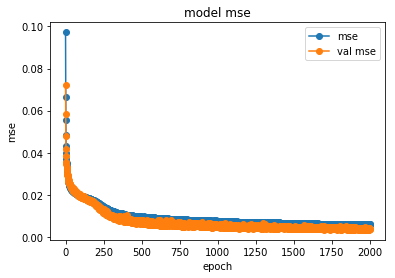

save the model


In [9]:
# -*- coding: utf-8 -*-
"""
Created on Tue Mar  7 15:43:18 2017

@author: hanar
"""
import time
import numpy as np
import os
from keras.utils import np_utils
from keras.models import Sequential
from keras.layers import Dense, Activation, Dropout
from keras.optimizers import SGD
from keras.optimizers import RMSprop
from keras.optimizers import Adagrad
from keras.optimizers import Adadelta
from keras.optimizers import Adam
from keras.optimizers import Adamax
from keras.optimizers import Nadam
from keras.callbacks import ModelCheckpoint
from keras.callbacks import EarlyStopping
from keras.callbacks import TensorBoard
from keras.models import load_model
#from keras.utils.visualize_util import plot
import matplotlib.pyplot as plt
import keras.callbacks
import keras.backend.tensorflow_backend as KTF
import tensorflow as tf

#Global variables for normalizing parameters
max_x = 1.0
min_x = 0.0
max_y = 1.0
min_y = 0.0


def deep_learning_tsunami(resdir, X_train_raw, y_train_raw, X_test_raw, y_test_raw,
                            _lr=0.02, _decay=0,
                            _validation_split=0.2, _batch_size=32,
                            _momentum=0.9, _nesterov=True,
                            num_layers=4, dropout=0.5,
                            node_num = 2500,
                            _epochs=2000):
    """
    Creating the inversion model of turbidity currents by deep learning
    """
    #Normalizing dataset
    X_train = get_normalized_data(X_train_raw, min_x, max_x)
    X_test = get_normalized_data(X_test_raw, min_x, max_x)
    y_train = get_normalized_data(y_train_raw, min_y, max_y)
    y_test = get_normalized_data(y_test_raw, min_y, max_y)
    
    #Generation of neural network model
    model = Sequential()
    model.add(Dense(node_num, input_dim=X_train.shape[1], activation='relu', kernel_initializer ='glorot_uniform'))#1st layer
    model.add(Dropout(dropout))
    for i in range(num_layers - 2):
        model.add(Dense(node_num, activation='relu', kernel_initializer ='glorot_uniform'))#2nd layer
        model.add(Dropout(dropout))
    model.add(Dense(y_train.shape[1], activation = 'relu', kernel_initializer ='glorot_uniform')) #last layer
    
    #Compiling the model
    model.compile(loss="mean_squared_error", 
              optimizer=SGD(lr=_lr, decay=_decay, momentum=_momentum, nesterov=_nesterov),
              #optimizer=Adadelta(),
              metrics=["mean_squared_error"])    
    
    #Perform learning
    t = time.time()
    check = ModelCheckpoint("model3.hdf5")
    #es_cb = EarlyStopping(monitor='val_loss', patience=5, verbose=0, mode='auto')
    #tb_cb = TensorBoard(log_dir=resdir, histogram_freq=2, write_graph=True, write_images=True)
    history = model.fit(X_train, y_train, epochs=_epochs, 
                    validation_split=_validation_split, batch_size=_batch_size,
                    callbacks=[check])
    
    #Evaluate learning result
    loss_and_metrics = model.evaluate(X_test,y_test)
    print("\nloss:{} mse:{}".format(loss_and_metrics[0],loss_and_metrics[1]))
    
    print("Elapsed time: {:.1f} sec.".format(time.time()-t))
    
    #Visualize learning result   
    #plot(model, to_file="model.png", show_shapes=True, show_layer_names=True)

    # model The state of change when letting you learnplot
    plot_history(history)
    
    return model, history

def apply_model(model, X, min_x, max_x, min_y, max_y):
    """
    Apply model
    Maximum and minimum values ​​of X and Y are required to normalize
    """
    X_norm =  (X - min_x) / (max_x - min_x)
    Y_norm = model.predict(X_norm)
    Y = Y_norm*(max_y - min_y)+min_y
    return Y

def plot_history(history):
    # Plot accuracy history
    plt.plot(history.history['mean_squared_error'],"o-",label="mse")
    plt.plot(history.history['val_mean_squared_error'],"o-",label="val mse")
    plt.title('model mse')
    plt.xlabel('epoch')
    plt.ylabel('mse')
    plt.legend(loc="upper right")
    plt.show()

#    # 損失の履歴をプロット
#    plt.plot(history.history['loss'],"o-",label="loss",)
#    plt.plot(history.history['val_loss'],"o-",label="val_loss")
#    plt.title('model loss')
#    plt.xlabel('epoch')
#    plt.ylabel('loss')
#    plt.legend(loc='upper right')
#    plt.show()

def test_model(model, x_test):
    #Test the results
    
    x_test_norm = get_normalized_data(x_test, min_x, max_x)
    test_result_norm = model.predict(x_test_norm)
    test_result = get_raw_data(test_result_norm, min_y, max_y)
    
    return test_result


def save_result(savedir, model, history, test_result):
    
    
    np.savetxt(savedir + 'test_result.txt',test_result,delimiter=',')
    np.savetxt(savedir+'loss.txt',history.history.get('loss'),delimiter=',')
    np.savetxt(savedir+'val_loss.txt',history.history.get('val_loss'),delimiter=',')
    
    #Serialize model and save
    print('save the model')
    model.save(savedir + 'model3.hdf5')

def load_data(datadir):
    """
    This function load training and test data sets, and returns variables
    """
    global min_x, max_x, min_y, max_y
    
    x_train = np.loadtxt(datadir + 'x_train.txt',delimiter=',')
    x_test = np.loadtxt(datadir + 'x_test.txt',delimiter=',')
    y_train = np.loadtxt(datadir + 'icond_train.txt',delimiter=',')
    y_test = np.loadtxt(datadir + 'icond_test.txt',delimiter=',')
    min_y = np.loadtxt(datadir + 'icond_min.txt',delimiter=',')
    max_y = np.loadtxt(datadir + 'icond_max.txt',delimiter=',')
    [min_x, max_x] = np.loadtxt(datadir + 'x_minmax.txt',delimiter=',')
    
    return x_train, y_train, x_test, y_test

def set_minmax_data(_min_x, _max_x, _min_y, _max_y):
    global min_x, max_x, min_y, max_y
    
    min_x, max_x, min_y, max_y = _min_x, _max_x, _min_y, _max_y
    return
    


def get_normalized_data(x, min_val, max_val):
    """
    Normalizing the training and test dataset
    """
    x_norm = (x - min_val) / (max_val - min_val)
    
    return x_norm

def get_raw_data(x_norm, min_val, max_val):
    """
    Get raw data from the normalized dataset
    """
    x = x_norm * (max_val - min_val) + min_val
    
    return x

if __name__ == "__main__":
    
    #Reading data  
    datadir = '/home/rimali2009/FITTNUSS-forward_training_DNN/data_g6_300grid_H_5000_20_11_roi500/'
    resdir = '/home/rimali2009/FITTNUSS-forward_training_DNN/result_g6_300grid_H_5000_20_11_roi500/'
    if not os.path.exists(resdir):
        os.mkdir(resdir)
    
    x_train, y_train, x_test, y_test = load_data(datadir)
    
     
    #Execution of learning
    testcases = [4500]
    for i in range(len(testcases)):
        resdir_case = resdir + '{}/'.format(testcases[i])        
        if not os.path.exists(resdir_case):
            os.mkdir(resdir_case)
        x_train_sub = x_train[0:testcases[i],:]
        y_train_sub = y_train[0:testcases[i],:]
        model, history = deep_learning_tsunami(resdir_case, x_train_sub, y_train_sub, x_test, y_test, num_layers=5)
        #Verify and save results
        result = test_model(model, x_test)
        save_result(resdir_case,model,history,result)




(500, 9)


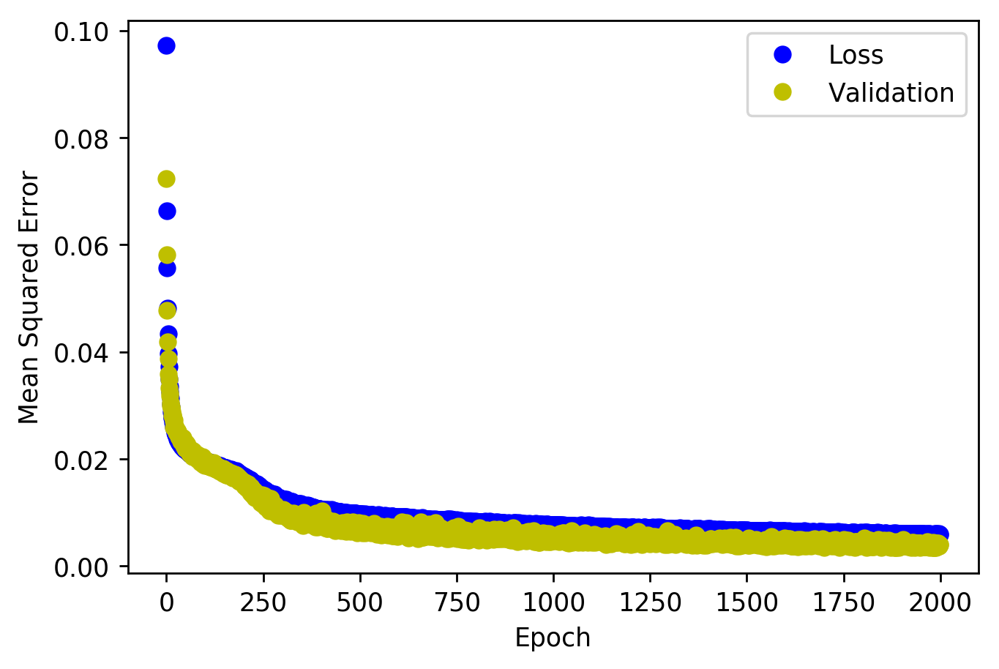

<Figure size 432x288 with 0 Axes>

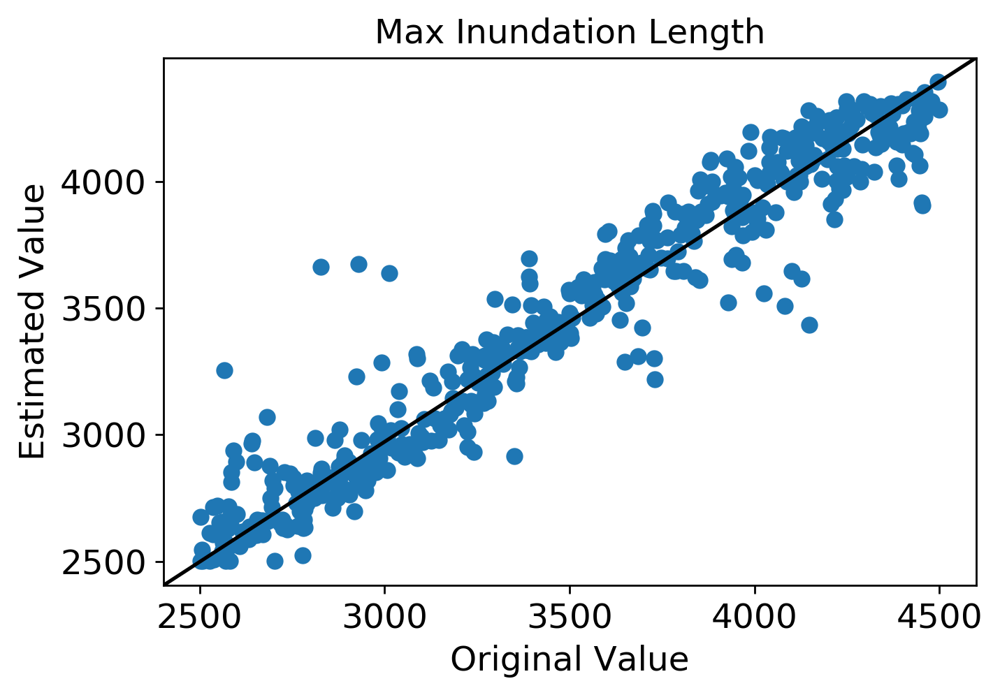

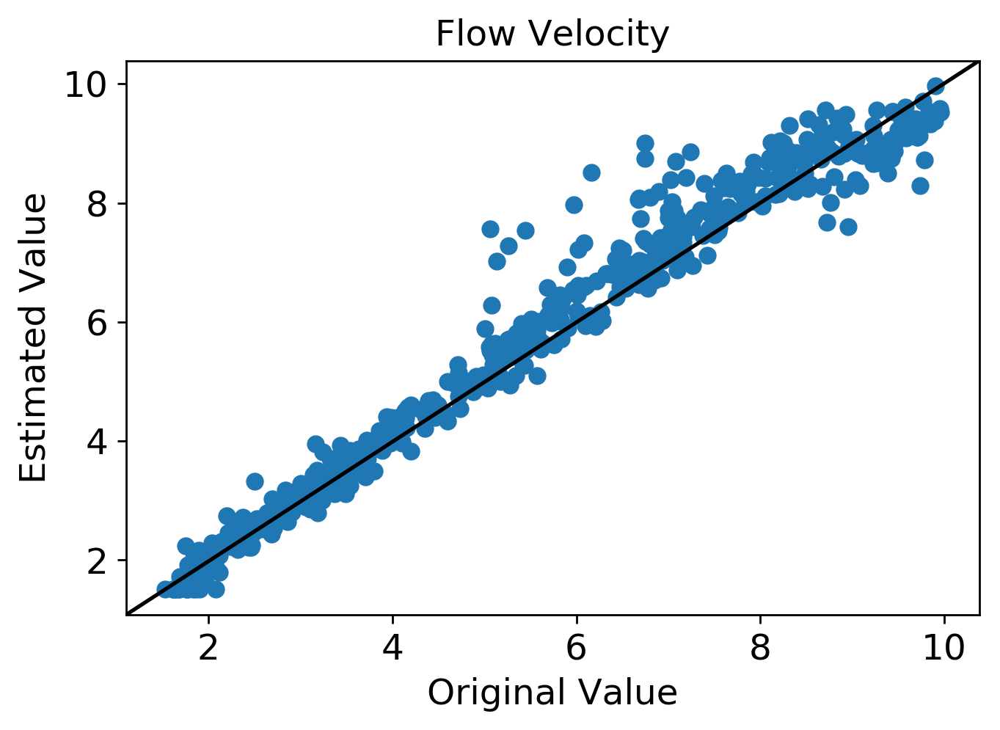

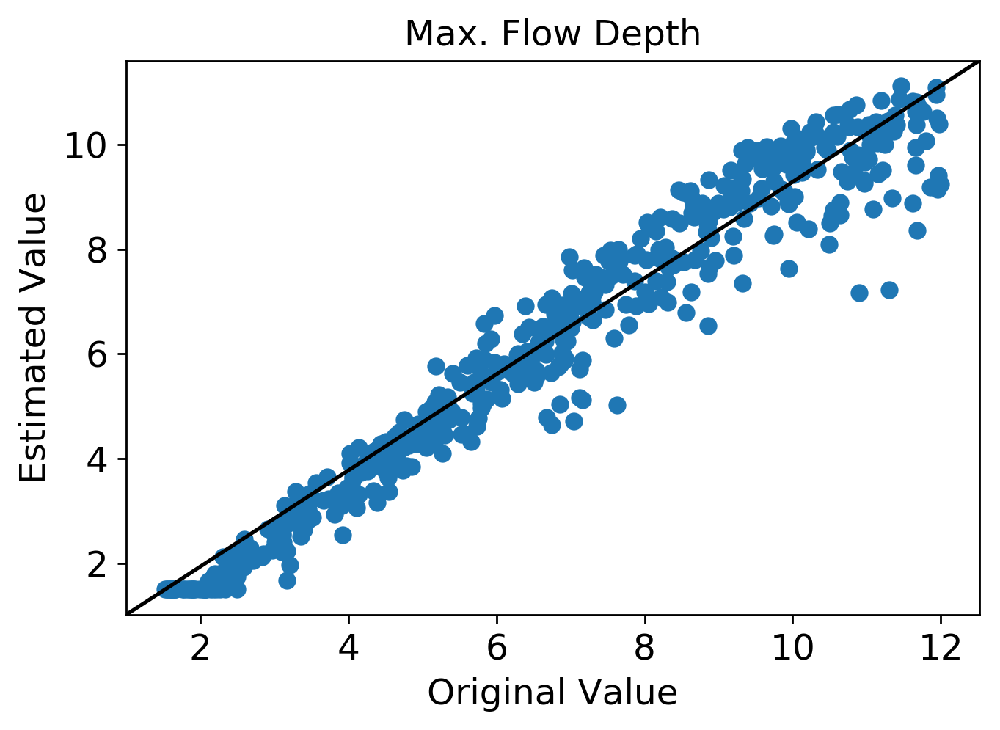

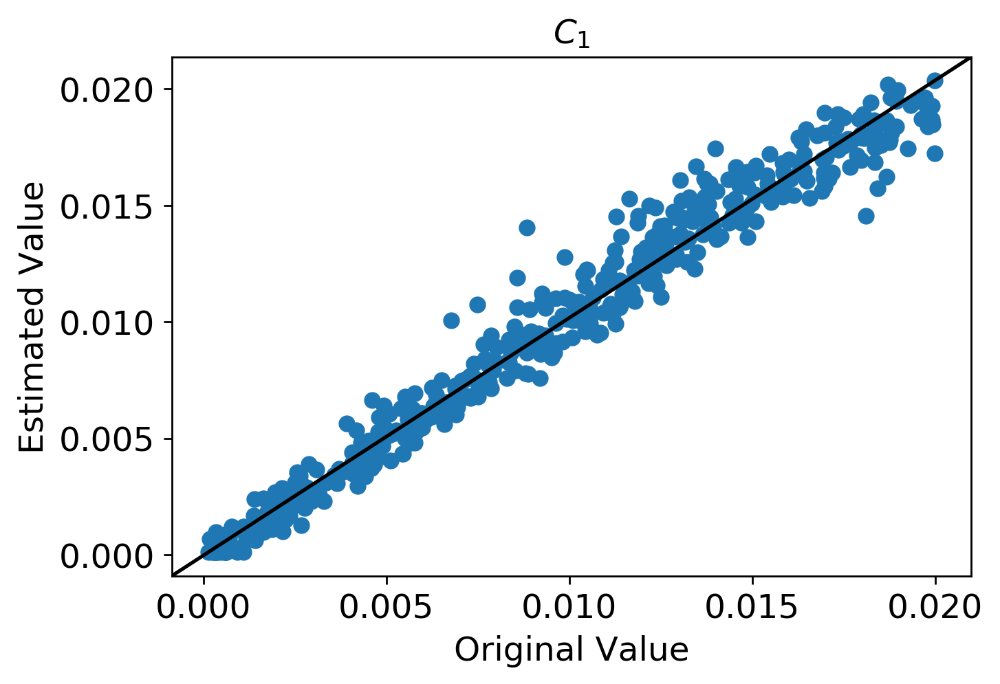

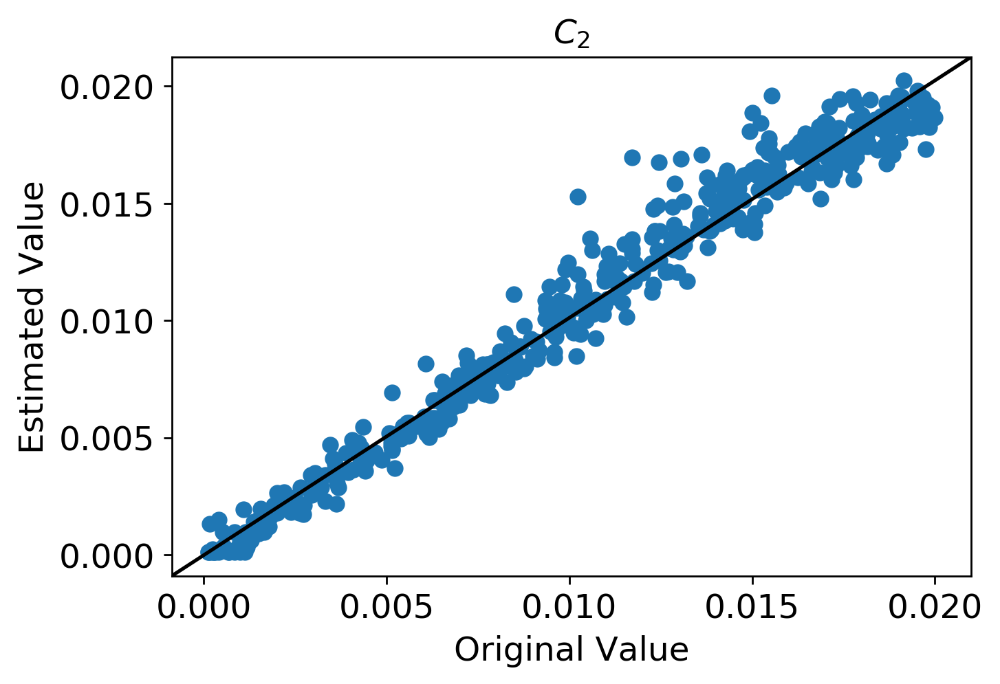

...

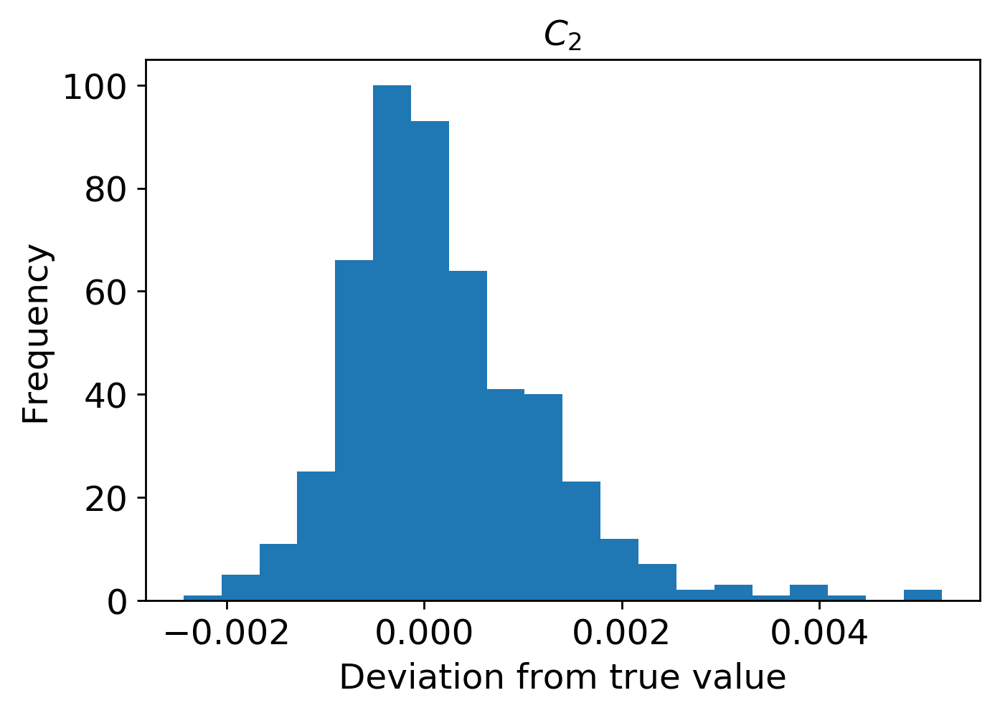

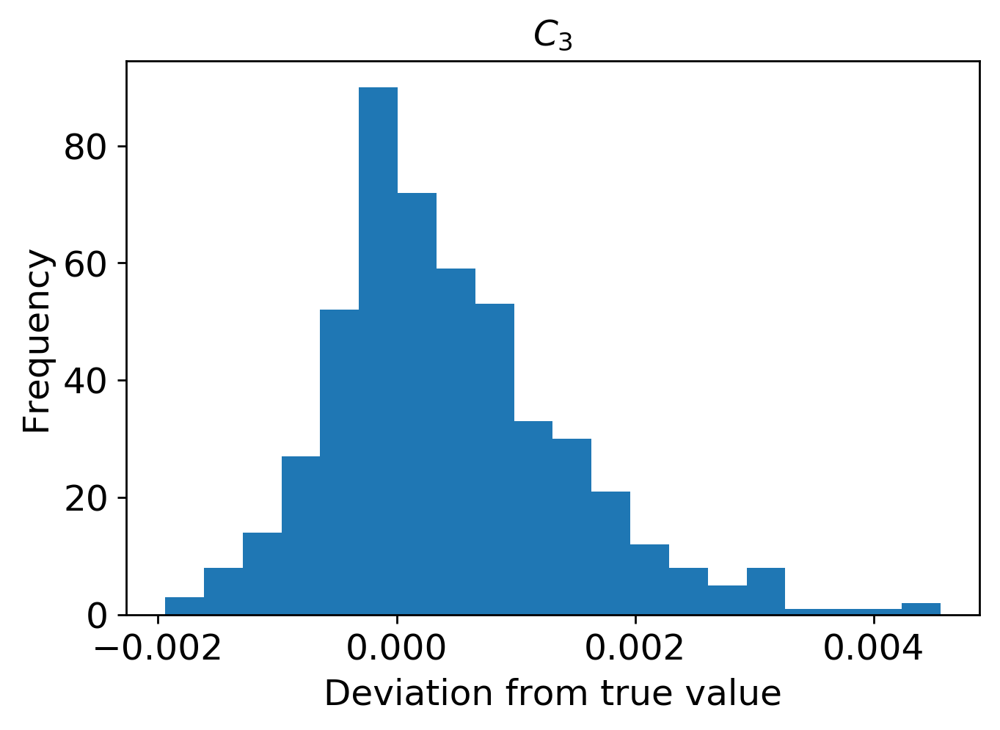

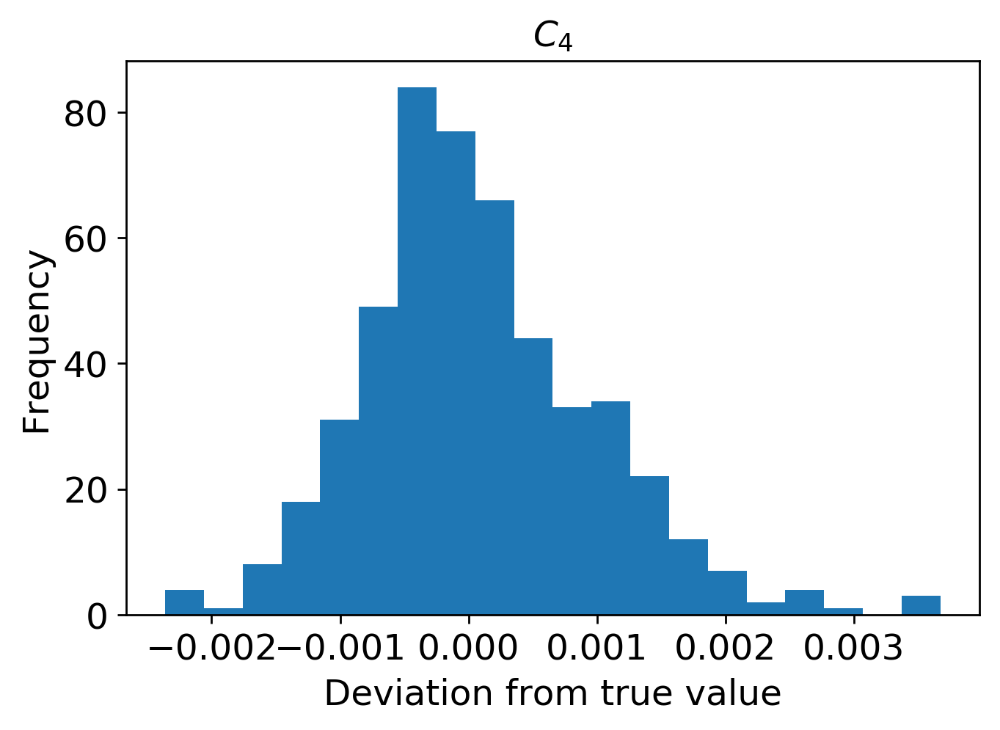

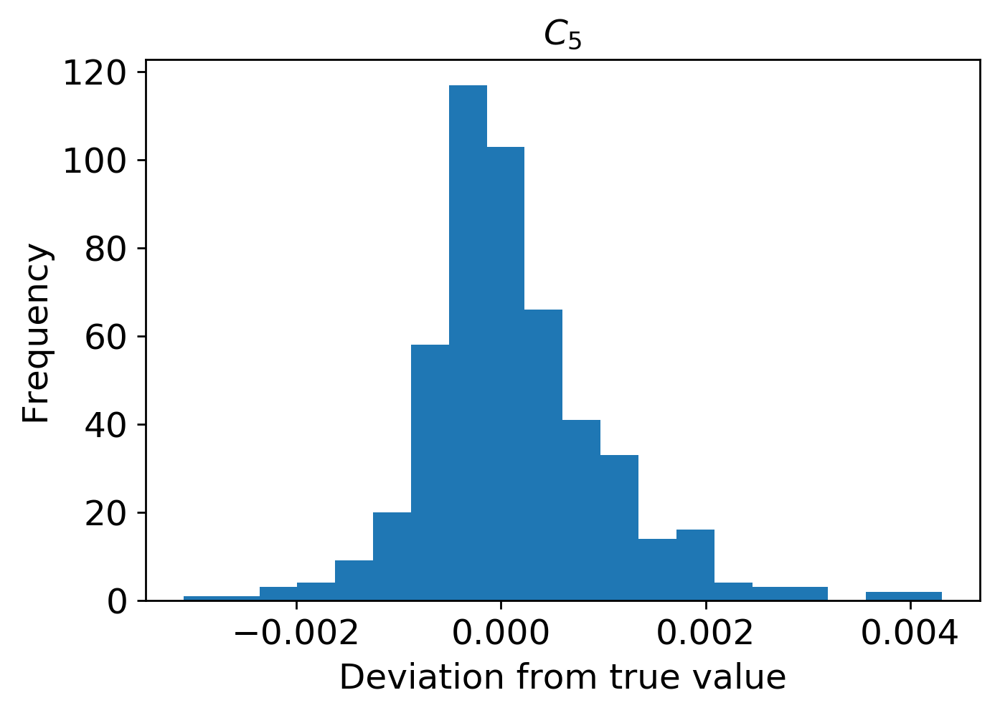

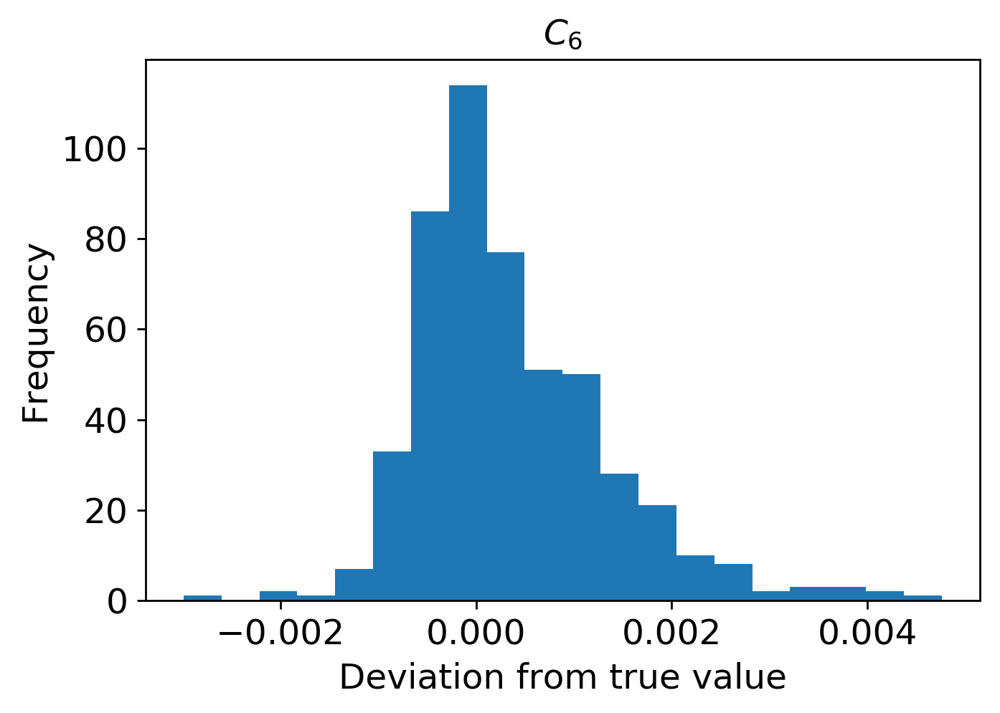

In [10]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

datadir = '/home/rimali2009/FITTNUSS-forward_training_DNN/data_g6_300grid_H_5000_20_11_roi500/'
resdir = '/home/rimali2009/FITTNUSS-forward_training_DNN/result_g6_300grid_H_5000_20_11_roi500/4500/'

test_result = np.loadtxt(resdir + 'test_result.txt',delimiter=',')
icond = np.loadtxt(datadir + 'icond_test.txt',delimiter=',')
print(icond.shape)
loss = np.loadtxt(resdir+'loss.txt',delimiter=',')
epoch = range(0,2000)
vloss = np.loadtxt(resdir+'val_loss.txt',delimiter=',')
resi = test_result - icond

fig = plt.figure(num=None,dpi=250, facecolor='w', edgecolor='k')
plt.plot(epoch, loss, 'bo',label='Loss')
plt.plot(epoch, vloss, 'yo',label='Validation')
plt.xlabel('Epoch')
plt.ylabel('Mean Squared Error')
plt.legend(loc="upper right")
plt.savefig(resdir+ 'mse.eps')
plt.show()

fig2 = plt.figure()
hfont = {'fontname':'Century Gothic'}
textcol = 'k'
titlelabel = ['Max Inundation Length','Flow Velocity', 'Max. Flow Depth', '$C_1$', '$C_2$', '$C_3$', '$C_4$','$C_5$','$C_6$']


    
for i in range(len(titlelabel)):
    plt.figure(num=None,dpi=250, facecolor='w', edgecolor='k')
    plt.plot(icond[:,i],test_result[:,i],"o")
    x=icond[:,i]
    y=test_result[:,i]
    y_lim = plt.ylim()
    x_lim = plt.xlim()
    plt.plot(x_lim, y_lim, 'k-', color = 'k')
    plt.ylim(y_lim)
    plt.xlim(x_lim)
    plt.xlabel('Original Value',color=textcol,size=14,**hfont)
    plt.ylabel('Estimated Value',color=textcol,size=14,**hfont)
    plt.title(titlelabel[i],color=textcol,size=14,**hfont)
    plt.tick_params(labelsize=14,colors=textcol)
    plt.savefig(resdir+titlelabel[i] + '.eps')
    #plt.show()

for i in range(len(titlelabel)):
    plt.figure(num=None,dpi=250, facecolor='w', edgecolor='k')
    plt.hist(resi[:,i],bins=20)
    plt.title(titlelabel[i],color=textcol,size=14,**hfont)
    plt.xlabel('Deviation from true value',color=textcol,size=14,**hfont)
    plt.ylabel('Frequency',color=textcol,size=14,**hfont)
    plt.tick_params(labelsize=14,colors=textcol)
    plt.savefig(resdir+titlelabel[i] + 'hist' + '.eps')
    plt.show()

       distance        g1        g2        g3        g4        g5        g6
0      0.000000  0.036771  0.167260  0.114845  0.008449  0.002190  0.005161
1    103.794102  0.000000  0.075200  0.153283  0.013753  0.001885  0.000442
2    171.620654  0.002130  0.051171  0.084309  0.006218  0.001867  0.002843
3    397.112167  0.003115  0.016359  0.078858  0.011466  0.000597  0.000054
4    595.912969  0.000732  0.016896  0.028720  0.002661  0.000914  0.000000
5    707.625749  0.000143  0.002228  0.005502  0.000900  0.000187  0.000104
6    796.435078  0.000236  0.004337  0.021204  0.003169  0.000309  0.000080
7    895.065500  0.001688  0.016059  0.081413  0.020284  0.006824  0.004628
8    988.394177  0.004567  0.008166  0.074658  0.016913  0.002424  0.001580
9   1081.819325  0.001567  0.016305  0.060234  0.011086  0.004165  0.001994
10  1195.756993  0.001022  0.002370  0.017565  0.004194  0.000567  0.000142
11  1290.372534  0.000000  0.004121  0.057974  0.014565  0.000426  0.000213
12  1400.896

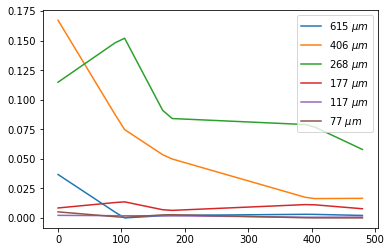

In [11]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model
from scipy import stats
from scipy.interpolate import interp1d 
import pandas as pd
from pykrige import OrdinaryKriging as OK
import ipdb


datadir = '/home/rimali2009/FITTNUSS-forward_training_DNN/data_g6_300grid_H_5000_20_11_roi500/'
resdir = '/home/rimali2009/FITTNUSS-forward_training_DNN/result_g6_300grid_H_5000_20_11_roi500/4500/'
#Initial setting
if not "model" in locals(): 
    model = load_model(resdir+'model3.hdf5')
#gclass = 3
#gclass_label = ["500 $\mu$m","125 $\mu$m","63 $\mu$m"]
gclass = 6
gclass_label = ["615 ${\mu}m$","406 ${\mu}m$","268 ${\mu}m$","177 ${\mu}m$", "117 ${\mu}m$","77 ${\mu}m$"]
topodx = 15.0
coord_num = int(model.layers[0].input_shape[1]/gclass)

#Acquires a value for normalizing input data to [0, 1]
min_x, max_x = np.loadtxt(datadir + 'x_minmax.txt',delimiter=',')
y_min = np.loadtxt(datadir + 'icond_min.txt',delimiter=',')
y_max = np.loadtxt(datadir + 'icond_max.txt',delimiter=',')

#Read outcrop data
#dist_max = 22000. #Distance of distal end of learning data
outcrop = pd.read_csv('../FITTNUSS-forward_training_DNN/sendai_increased_class_edit.csv')
#outcrop = pd.read_csv('../DeepLearningTurbidite_Fukuda/GA_naruse_v2.csv')
#outcrop = outcrop.append(pd.DataFrame([[0,'Loc0',0,0,0],[dist_max,'LocE',0,0,0]], columns=outcrop.columns))
outcrop = outcrop.sort_values('distance')
outcrop['distance'] = outcrop['distance'] - 0
#d = pd.DataFrame(np.zeros((1, 7)),columns=['distance', 'g1','g2','g3','g4','g5','g6'])
#print(d)
#v=np.concatenate((outcrop, d))
#print(v)
#outcrop=pd.DataFrame(v,columns=['distance', 'g1','g2','g3','g4','g5','g6'])
#outcrop['distance'].iloc[-1]=4000
#outcrop = outcrop.append(pd.DataFrame([[0,'Loc0',0,0,0,0]], columns=outcrop.columns))
print(outcrop)

#Preparation under interpolation
thick_interp = np.zeros([1,coord_num*gclass])#補間されたサンプル厚さデータ
outcrop_x_id = np.round(outcrop['distance']/topodx).astype(np.int32) #逆解析システムでのサンプリング地点のindex番号
x = np.arange(0,coord_num*topodx,topodx)

#Complement data
for j in range(gclass):
    f = interp1d(outcrop['distance'],outcrop.iloc[:,j+1], kind="linear",bounds_error=False,fill_value='extrapolate')
    #f = interp1d(outcrop['distance'],outcrop.iloc[:,j+2], kind="linear",bounds_error=False,fill_value='extrapolate') 
    #Interpolation function of jth granularity level
    thick_interp[0,coord_num*j:coord_num*(j+1)] = f(x) #Supplemented data

#ipdb.set_trace()
#Kriging Interpolation by
#vparams = np.array([[0.035, 10000., 0.001],[0.006, 10000., 0.002],[0.005, 10000., 0.002],[0.035, 10000., 0.001]])
#for j in range(gclass):
    #okip = OK(outcrop['distance'],np.zeros(outcrop['distance'].shape),outcrop.iloc[:,j+1],variogram_model='linear',)
    #okip.display_variogram_model()
    #ipdata, ipstd = okip.execute('grid',x,np.array([0.]))
    #ipdata = np.squeeze(ipdata)
    #thick_interp[0,coord_num*j:coord_num*(j+1)] = ipdata #Assign complemented d

#Normalize data
thick_interp[thick_interp < 0] = 0
thick_interp_norm =  (thick_interp - min_x) / (max_x - min_x)

#Perform inverse analysis
test_result_outcrop = model.predict(thick_interp_norm)
test_result_outcrop = test_result_outcrop * (y_max - y_min) + y_min
print(test_result_outcrop)
#add=np.array(3000)
#test_result_outcrop_add=np.concatenate((add,test_result_outcrop), axis=None)
#Output results
#print(test_result_outcrop_add)
np.savetxt('outcrop_result_g6_g300_H_5000_20_11_roi500.txt',test_result_outcrop, delimiter=',')
for i in range(len(gclass_label)):
    plt.plot(x,thick_interp[0,coord_num * i:coord_num * (i+1)],label=gclass_label[i])
plt.legend()
plt.show()



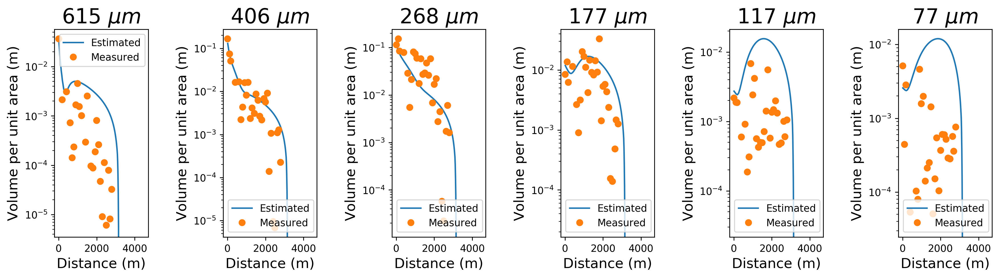

In [12]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import Forward_model_modified_FITTNUSS_5000_g6_300grid_19_11_case2 as fmodel
import time
import ipdb
%matplotlib inline

#Basic setting

#dist_max = 3000.
gclass = 6
topodx=15.0
gclass_name = ['615microm','406microm','268microm','177microm','117microm','77microm']
#gclass_name = ['500micron', '125micron', '63micron']
gname_tex = ["615 ${\mu}m$","406 ${\mu}m$","268 ${\mu}m$","177 ${\mu}m$", "117 ${\mu}m$","77 ${\mu}m$"]
#gname_tex = ['500 $\mu$m','125 $\mu$m','63 $\mu$m']
#calcdir = 'home/rimali2009/FITTNUSS-forward_training_DNN/'
#calcdir = '/home/naruse/Documents/Documents/MATLAB/TCtrainData_forML/TCModel_for_MLTEST/test_output_otadai07/'

#Load estimate
#H1 = np.loadtxt(calcdir + 'H1.txt',delimiter=',')
#H2 = np.loadtxt(calcdir + 'H2.txt',delimiter=',')
#H3 = np.loadtxt(calcdir + 'H3.txt',delimiter=',')
#H4 = np.loadtxt(calcdir + 'H4.txt',delimiter=',')
#Ht = np.loadtxt(calcdir + 'Ht.txt',delimiter=',')
#U = np.loadtxt(calcdir + 'U.txt',delimiter=',')
#xi = np.loadtxt(calcdir + 'xi.txt',delimiter=',')
#x = np.loadtxt(calcdir + 'x.txt',delimiter=',')
#x_bed = np.loadtxt(calcdir + 'x_init.txt',delimiter=',')
#eta_init = np.loadtxt(calcdir + 'eta_init.txt',delimiter=',')
#Ct = np.loadtxt(calcdir + 'Ct.txt',delimiter=',')
#time = np.loadtxt(calcdir + 'time.txt',delimiter=',')
estimated_icond=np.loadtxt('outcrop_result_g6_g300_H_5000_20_11_roi500.txt', delimiter=',')
start = time.time()
fmodel.read_setfile("config_g6_300grid_19_11_case2.ini")
(x,C,x_dep,deposit) = fmodel.forward(estimated_icond)
np.savetxt('eta_estimated_thickness_5K_g6_TC4_Rwcnst_H_5000_20_11_roi500.csv', deposit, delimiter=',')
np.savetxt('eta_estimated_Distance_5K_g6_TC4_Rwcnst_H_5000_20_11_roi500.csv', x_dep,delimiter=',')
estimated_dep_thickness_5000=np.transpose(np.loadtxt('/home/rimali2009/FITTNUSS-forward_training_DNN/'+'eta_estimated_thickness_5K_g6_TC4_Rwcnst_H_5000_20_11_roi500.csv', delimiter=','))
estimated_dep_thickness_5000=pd.DataFrame(estimated_dep_thickness_5000,columns=['615microm','406microm','268microm','177microm','117microm','77microm'])
estimated_dep_distance_5000=np.transpose(np.loadtxt('/home/rimali2009/FITTNUSS-forward_training_DNN/'+'eta_estimated_Distance_5K_g6_TC4_Rwcnst_H_5000_20_11_roi500.csv', delimiter=','))
estimated_dep_distance_5000=pd.DataFrame(estimated_dep_distance_5000,columns=['distance'])
estimated_dep_5000=pd.concat([estimated_dep_distance_5000,estimated_dep_thickness_5000],axis=1)
np.savetxt('estimated_dep_5K_g6_TC4_Rwcnst_H_5000_20_11_roi500.csv',estimated_dep_5000,delimiter=',')
#data_estim=pd.DataFrame(estimated_dep_5000,columns=['distance','1.5phi','2.5phi','3.5phi','4.5phi'])

#Formatting the loaded data
#estimated_dep_df = pd.DataFrame(estimated_dep,columns=['distance','1.5phi','2.5phi','3.5phi','4.5phi'])
#estimated_dep = pd.DataFrame(np.array([x_bed - dist_offset,H1[-1,:],H2[-1,:],H3[-1,:]]).T,columns=['distance','500micron','125micron','63micron'])
estimated_dep_5000= estimated_dep_5000.query('distance > 0')
#estimated_dep_5000 = estimated_dep_5000.query('distance < {}'.format(dist_max))

#Read original data
outcrop = pd.read_csv('../FITTNUSS-forward_training_DNN/sendai_increased_class.csv')
outcrop= pd.DataFrame(outcrop,columns=['distance','615microm','406microm','268microm','177microm','117microm','77microm'])
#outcrop = pd.read_csv('../DeepLearningTurbidite_Fukuda/GA_naruse_v2.csv')
#outcrop = outcrop.append(pd.DataFrame([[0,'Loc0',0,0,0],[dist_max,'LocE',0,0,0]], columns=outcrop.columns))
#outcrop = outcrop.sort_values('distance')
#outcrop['distance'] = outcrop['distance'] - 1000

#Plot
plt.figure(num=None, figsize=(17, 4), dpi=250, facecolor='w', edgecolor='g')
hfont = {'fontname':'Sans'}
plt.subplots_adjust(bottom=0.15, wspace=0.8)

for i in range(gclass):
    plt.subplot(1,gclass,i+1)
    plt.plot(estimated_dep_5000['distance'],estimated_dep_5000[gclass_name[i]],'-', label='Estimated')
    plt.plot(outcrop['distance'], outcrop[gclass_name[i]],'o', label='Measured')
    plt.yscale('log')
    plt.title(gname_tex[i], size=21,**hfont)
    plt.xlabel('Distance (m)', size = 14, **hfont)
    plt.ylabel('Volume per unit area (m)', size = 14, **hfont)
    plt.legend(fontsize=10)
    plt.savefig("thickness_distance_curve_5000_g6_300grid_H_5000_20_11_roi500.png")
    plt.savefig("thickness_distance_curve_5000_g6_300grid_H_5000_20_11_roi500.eps")
plt.show()



Using TensorFlow backend.


       distance        g1        g2        g3        g4        g5        g6
0      0.000000  0.036771  0.167260  0.114845  0.008449  0.002190  0.005161
1    103.794102  0.000000  0.075200  0.153283  0.013753  0.001885  0.000442
2    171.620654  0.002130  0.051171  0.084309  0.006218  0.001867  0.002843
3    397.112167  0.003115  0.016359  0.078858  0.011466  0.000597  0.000054
4    595.912969  0.000732  0.016896  0.028720  0.002661  0.000914  0.000000
5    707.625749  0.000143  0.002228  0.005502  0.000900  0.000187  0.000104
6    796.435078  0.000236  0.004337  0.021204  0.003169  0.000309  0.000080
7    895.065500  0.001688  0.016059  0.081413  0.020284  0.006824  0.004628
8    988.394177  0.004567  0.008166  0.074658  0.016913  0.002424  0.001580
9   1081.819325  0.001567  0.016305  0.060234  0.011086  0.004165  0.001994
10  1195.756993  0.001022  0.002370  0.017565  0.004194  0.000567  0.000142
11  1290.372534  0.000000  0.004121  0.057974  0.014565  0.000426  0.000213
12  1400.896

       distance        g1        g2        g3        g4        g5        g6
0      0.000000  0.036771  0.167260  0.114845  0.008449  0.002190  0.005161
1    103.794102  0.000000  0.075200  0.153283  0.013753  0.001885  0.000442
2    171.620654  0.002130  0.051171  0.084309  0.006218  0.001867  0.002843
3    397.112167  0.003115  0.016359  0.078858  0.011466  0.000597  0.000054
4    595.912969  0.000732  0.016896  0.028720  0.002661  0.000914  0.000000
5    707.625749  0.000143  0.002228  0.005502  0.000900  0.000187  0.000104
6    796.435078  0.000236  0.004337  0.021204  0.003169  0.000309  0.000080
7    988.394177  0.004567  0.008166  0.074658  0.016913  0.002424  0.001580
8   1081.819325  0.001567  0.016305  0.060234  0.011086  0.004165  0.001994
9   1195.756993  0.001022  0.002370  0.017565  0.004194  0.000567  0.000142
10  1290.372534  0.000000  0.004121  0.057974  0.014565  0.000426  0.000213
11  1400.896519  0.000295  0.003096  0.027406  0.009121  0.000502  0.000251
12  1495.352

/home/rimali2009/anaconda3/envs/test3/lib/python3.6/site-packages/matplotlib/font_manager.py:1241: UserWarning: findfont: Font family ['Century Gothic'] not found. Falling back to DejaVu Sans.
  (prop.get_family(), self.defaultFamily[fontext]))


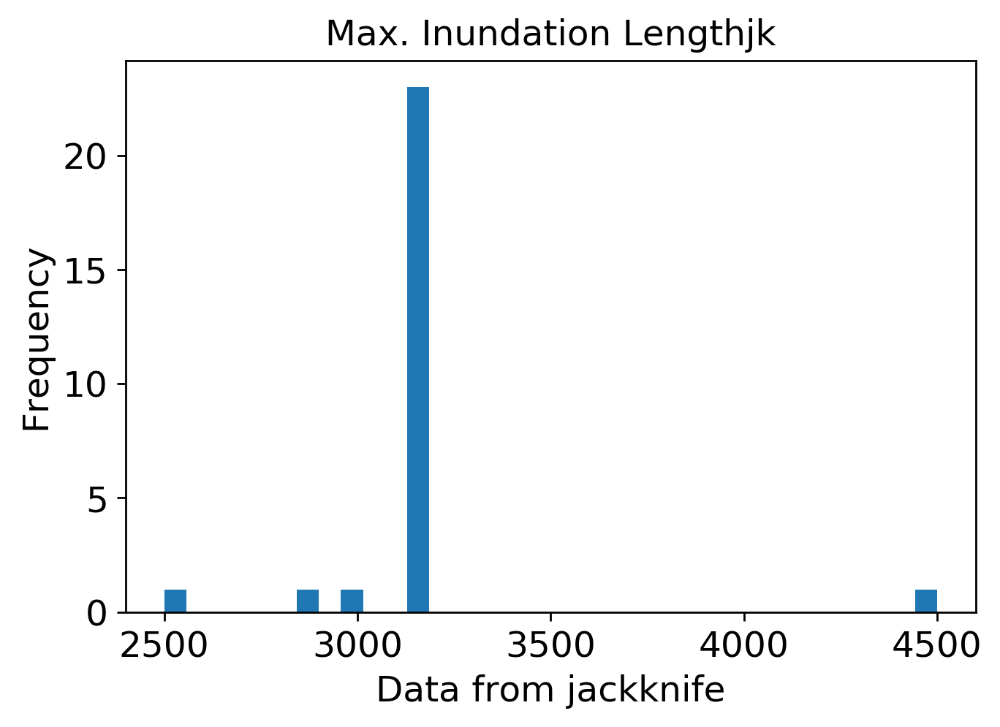

mean: 6.171081314189486
jk_e: 0.15014479952715437


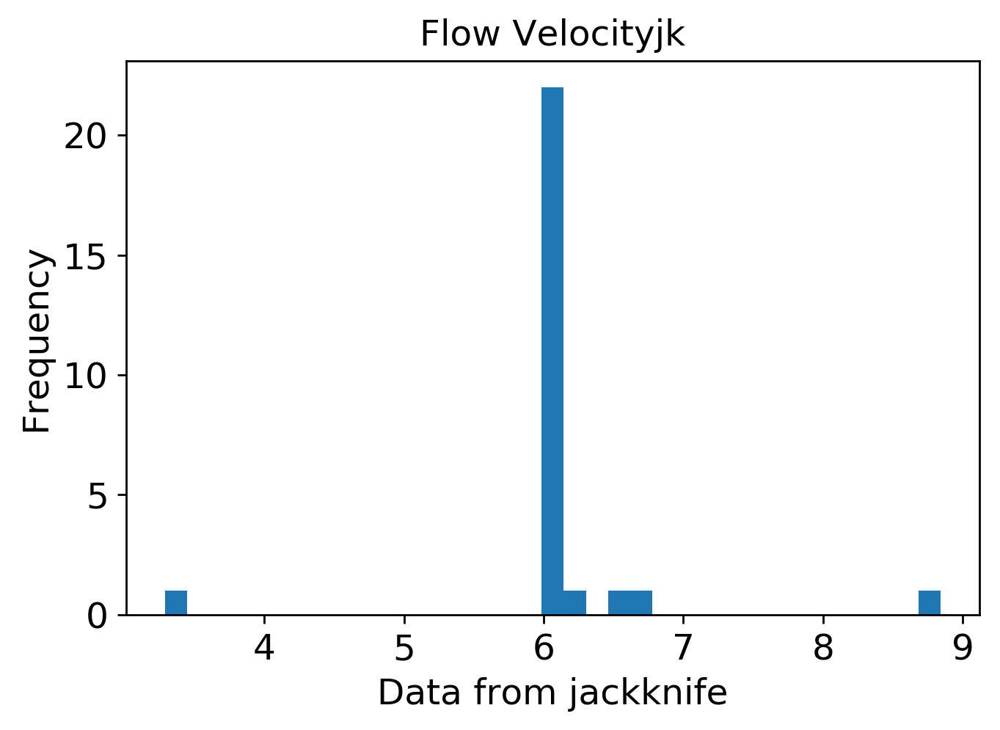

mean: 4.074293832241509
jk_e: 0.08622917798692901


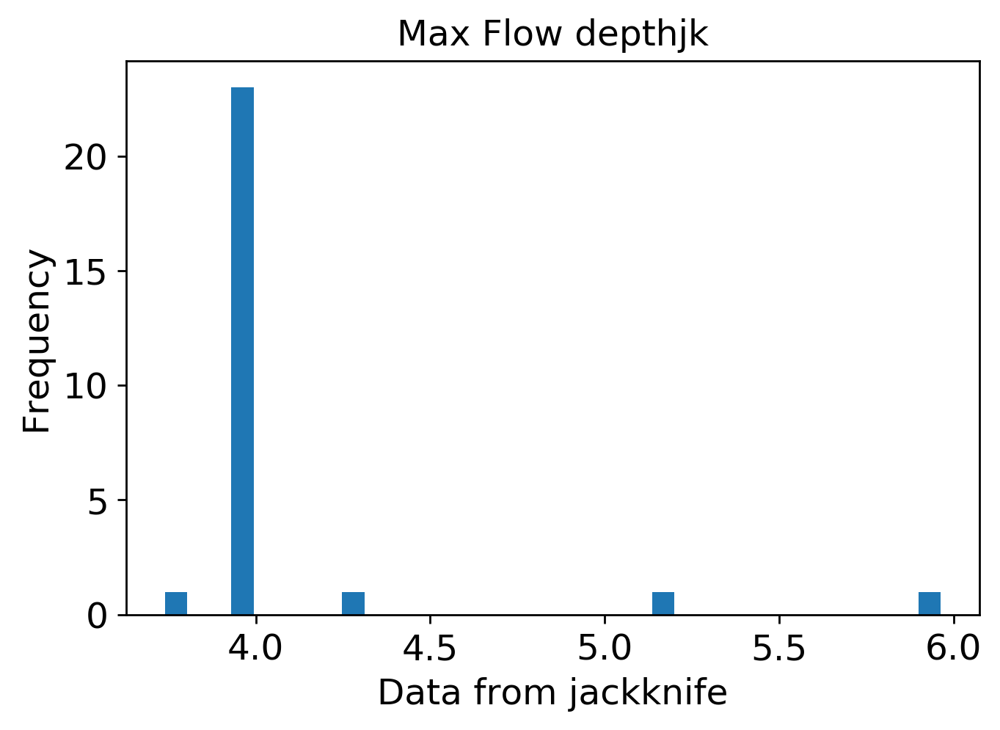

mean: 0.005137103873795194
jk_e: 0.00020391723628984364


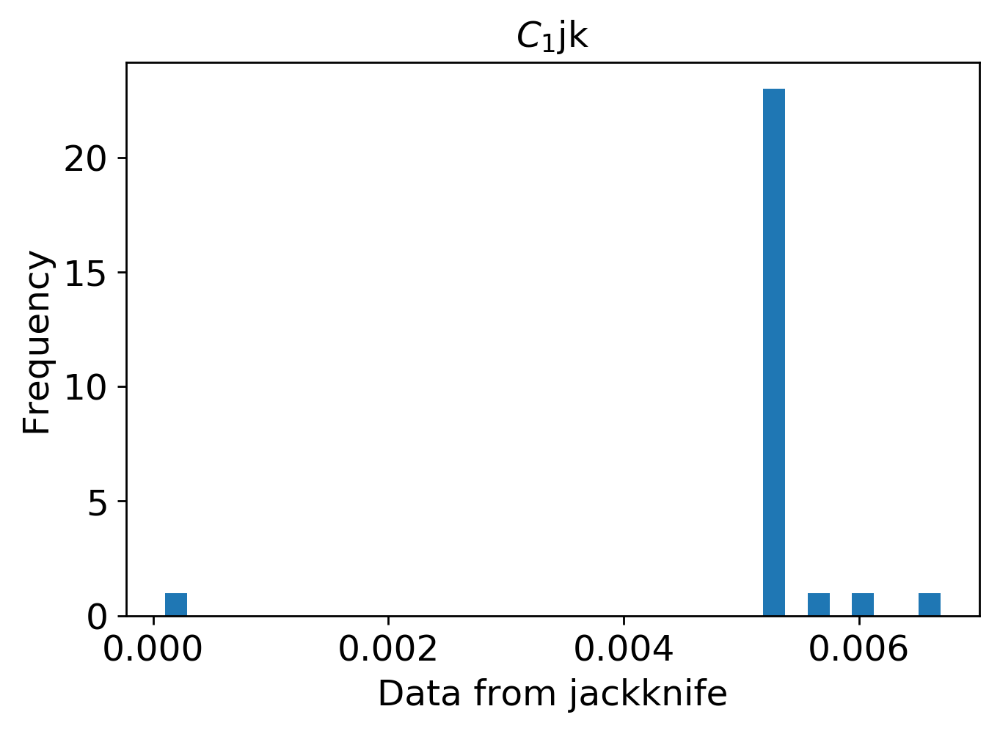

mean: 0.020974842013308726
jk_e: 0.00032444668434066654


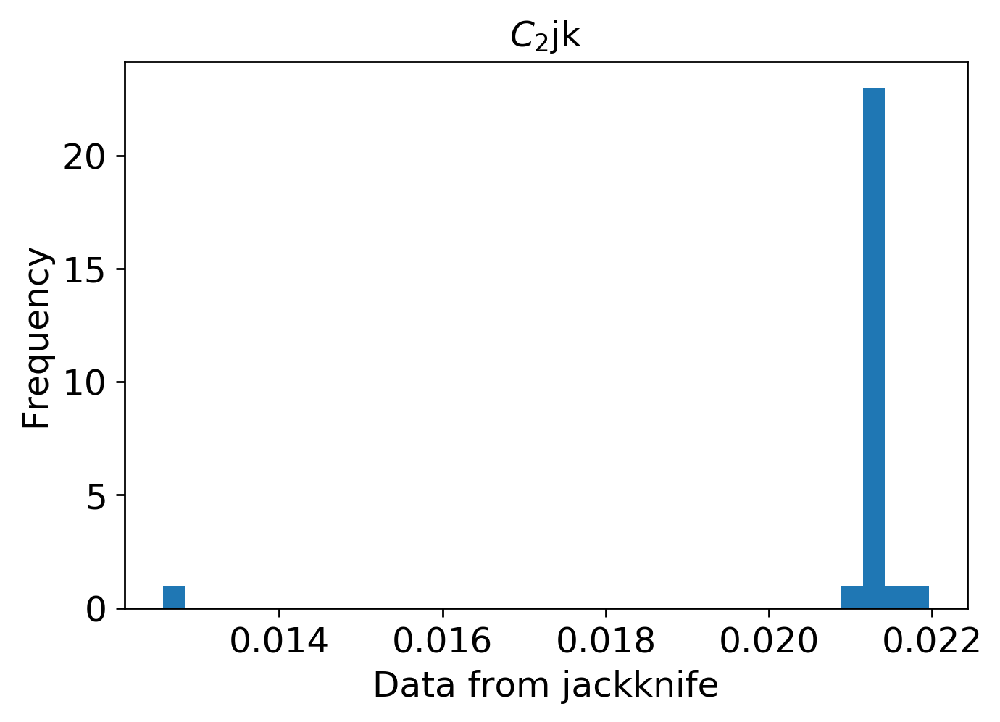

mean: 0.01800979872704034
jk_e: 0.00021382389096756028


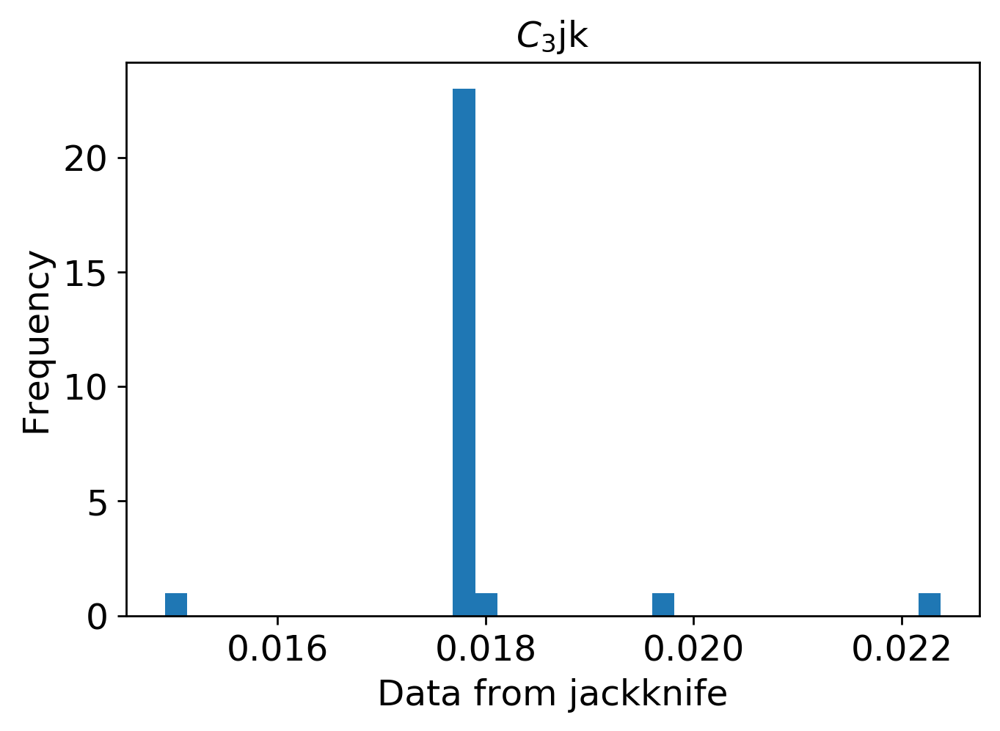

mean: 0.0019310678486742425
jk_e: 5.7482312768351836e-05


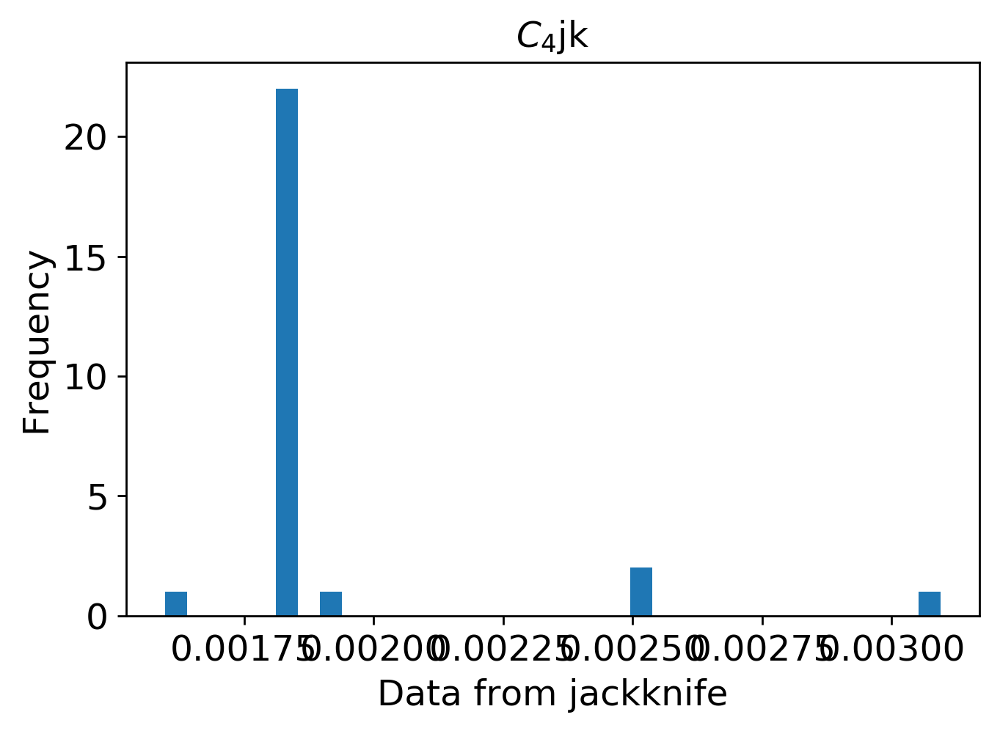

mean: 0.0004911254978319706
jk_e: 6.930647655148237e-05


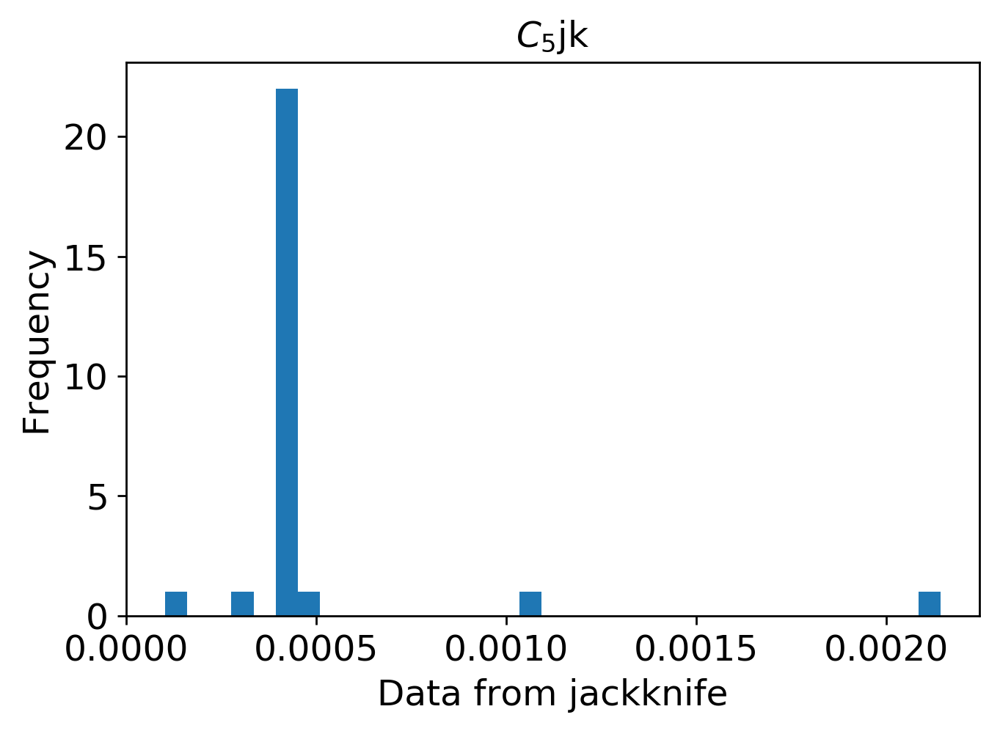

mean: 0.0005153817946084371
jk_e: 8.386327016609534e-05


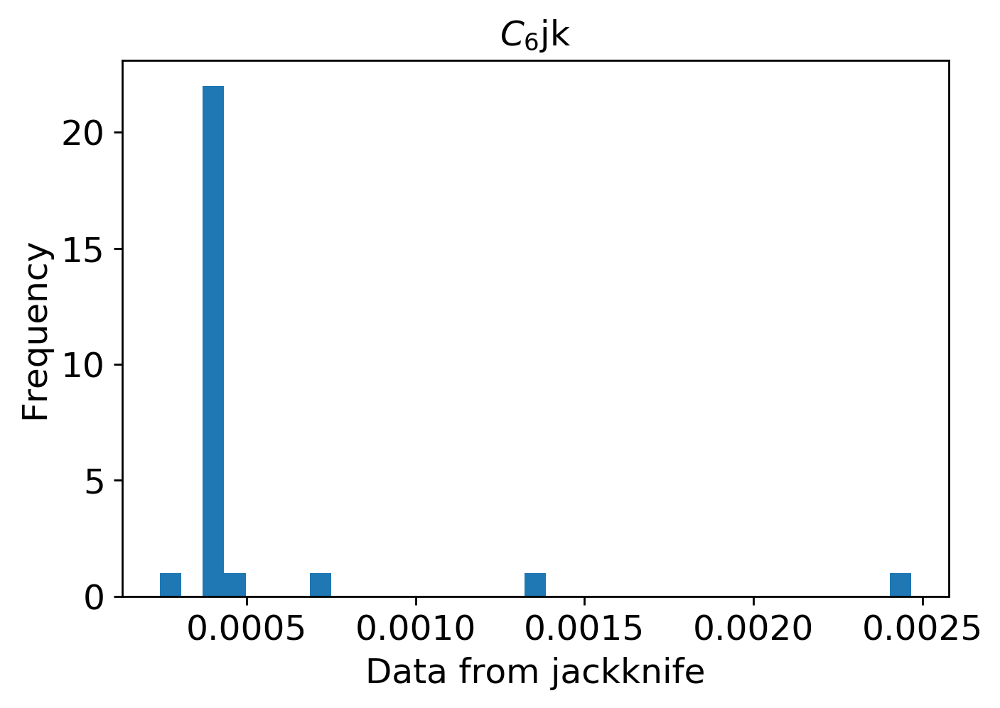

In [1]:
# Jackknife Method
import csv
import numpy as np
import pandas as pd
import math
from keras.models import load_model
from scipy.interpolate import interp1d
import matplotlib.pyplot as plt
%matplotlib inline

datadir = '/home/rimali2009/FITTNUSS-forward_training_DNN/data_g6_300grid_H_5000_20_11_roi500/'
resdir = '/home/rimali2009/FITTNUSS-forward_training_DNN/result_g6_300grid_H_5000_20_11_roi500/4500/'
# Initial setting
if not "model" in locals():
    model = load_model(resdir+'model3.hdf5')
gclass = 6
gclass_label = ["615 ${\mu}m$", "406 ${\mu}m$", "268 ${\mu}m$",
                "177 ${\mu}m$", "117 ${\mu}m$", "77 ${\mu}m$"]
topodx = 15.0
coord_num = int(model.layers[0].input_shape[1]/gclass)
min_x, max_x = np.loadtxt(datadir + 'x_minmax.txt', delimiter=',')
y_min = np.loadtxt(datadir + 'icond_min.txt', delimiter=',')
y_max = np.loadtxt(datadir + 'icond_max.txt', delimiter=',')


a = pd.read_csv(
    '../FITTNUSS-forward_training_DNN/sendai_increased_class_edit.csv', delimiter=',')
print(a)
y = pd.DataFrame()
output = []

with open('output_final_20_11_roi500.csv', 'w') as outfile:

    # x=[]
    for index in range(len(a)):
        df = y.append(pd.read_csv(
            '../FITTNUSS-forward_training_DNN/sendai_increased_class_edit.csv', skiprows=[index+1]))
        print(df)
        df = df.sort_values('distance')
        thick_interp = np.zeros([1, coord_num*gclass])
        x = np.arange(0, coord_num*topodx, topodx)
        for j in range(gclass):
            # Interpolation function of jth granularity level
            f = interp1d(df['distance'], df.iloc[:, j+1],
                         kind="linear", bounds_error=False,fill_value='extrapolate')
            thick_interp[0, coord_num*j:coord_num*(j+1)] = f(x)
        thick_interp[thick_interp < 0] = 0
        thick_interp_norm = (thick_interp - min_x) / (max_x - min_x)
        test_result_outcrop = model.predict(thick_interp_norm)
        test_result_outcrop = test_result_outcrop * (y_max - y_min) + y_min
        print(test_result_outcrop.shape)
        print(test_result_outcrop)
    # output.append(test_result_outcrop)
        np.savetxt(outfile,test_result_outcrop, delimiter=',')
        # outfile.write('# New iteration\n')
hfont = {'fontname': 'Century Gothic'}
textcol = 'k'
resi = np.loadtxt('output_final_20_11_roi500.csv', delimiter=',')
titlelabel = ['Max. Inundation Lengthjk','Flow Velocityjk', 'Max Flow depthjk',
              '$C_1$jk', '$C_2$jk', '$C_3$jk', '$C_4$jk', '$C_5$jk', '$C_6$jk']
jk_er=[]
with open('jk_e_roi500.txt','wb') as ftext:
    for i in range(len(titlelabel)):
        plt.figure(num=None, dpi=250, facecolor='w', edgecolor='k')
        plt.hist(resi[:, i], bins=35)
        mean = sum(resi[:,i]) / len(resi[:,i])
        print("mean:",mean)
        var_jk  = sum(pow(x-mean,2) for x in resi[:,i]) / ((len(resi[:,i])-1)*(len(resi[:,i])))
        jk_e= math.sqrt(var_jk)
        print("jk_e:",jk_e)
        e=np.append(jk_e,jk_er)
        np.savetxt(ftext,e,delimiter=',')
        plt.title(titlelabel[i], color=textcol, size=14, **hfont)
        plt.xlabel('Data from jackknife', color=textcol, size=14, **hfont)
        plt.ylabel('Frequency', color=textcol, size=14, **hfont)
        plt.tick_params(labelsize=14, colors=textcol)
        plt.savefig(resdir+titlelabel[i] + 'jkhist' + '.eps')
        plt.show()


# ROI 100

In [13]:
import numpy as np
import os
#import ipdb

def connect_dataset(file_list, icond_file_list, outputdir,
                    topodx=15, roi=2500, offset=5000,gclass_num=6,test_data_num=500):
    """
    複数のデータセットを連結する
    """
    #ipdb.set_trace()
    
    #Reading and combining files Decide start and end points of the learning area and convert them to grid numbers
    H = np.loadtxt(file_list[0], delimiter = ',')
    icond = np.loadtxt(icond_file_list[0], delimiter = ',')
    
    #Reading and combining files
    if len(file_list) > 1:
        for i in range(1, len(file_list)):
            H_temp = np.loadtxt(file_list[i], delimiter = ',')
            icond_temp = np.loadtxt(icond_file_list[i], delimiter = ',')
            H = np.concatenate((H,H_temp),axis=0)
            icond = np.concatenate((icond,icond_temp),axis = 0)
    
    roi_grids = int(roi / topodx)
    num_grids = int(H.shape[1] / gclass_num)
    H_subset = np.zeros([H.shape[0], roi_grids * gclass_num])
    for i in range(gclass_num):
        H_subset[:, i*roi_grids:(i+1)*roi_grids] = H[:, i*num_grids:(i*num_grids+roi_grids)]
    
    #Obtain the maximum and minimum values of data
    max_x = np.max(H_subset)
    min_x = np.min(H_subset)
    icond_max = np.max(icond, axis=0)
    icond_min = np.min(icond, axis=0)
    
    #Split the data into tests and training
    H_train = H_subset[0:-test_data_num,:]
    H_test = H_subset[H_subset.shape[0] - test_data_num:,:]
    icond_train = icond[0:-test_data_num,:]
    icond_test = icond[H.shape[0] - test_data_num:,:]
    
    #Save the data
    if not os.path.exists(outputdir):
        os.mkdir(outputdir)
    np.savetxt(outputdir + '/x_train.txt',H_train,delimiter = ',')
    np.savetxt(outputdir + '/x_test.txt',H_test,delimiter = ',')
    np.savetxt(outputdir + '/icond_train.txt',icond_train,delimiter = ',')
    np.savetxt(outputdir + '/icond_test.txt',icond_test,delimiter = ',')
    np.savetxt(outputdir + '/icond_min.txt',icond_min,delimiter = ',')
    np.savetxt(outputdir + '/icond_max.txt',icond_max,delimiter = ',')
    np.savetxt(outputdir + '/x_minmax.txt',[min_x, max_x],delimiter = ',')
    
    
if __name__=="__main__":
    original_data_dir = "/home/rimali2009/FITTNUSS-forward_training_DNN"
    parent_dir = "/home/rimali2009/FITTNUSS-forward_training_DNN"
    if not os.path.exists(parent_dir):
        os.mkdir(parent_dir)
    outputdir = parent_dir + "/data_g6_300grid_H_5000_20_11_roi100"
    file_list = ['/home/rimali2009/FITTNUSS-forward_training_DNN/eta_5000_g6_300grid_19_11.csv']
    initial_conditions = ['/home/rimali2009/FITTNUSS-forward_training_DNN/start_param_random_5000_g6_300grid_19_11.csv']
connect_dataset(file_list, initial_conditions, outputdir, test_data_num=500, gclass_num=6, topodx=15., roi=100)
        
        
    

Train on 3600 samples, validate on 900 samples
Epoch 1/2000
3600/3600 [==============================] - 2s 479us/step - loss: 0.0993 - mean_squared_error: 0.0993 - val_loss: 0.0740 - val_mean_squared_error: 0.0740
Epoch 2/2000
3600/3600 [==============================] - 1s 315us/step - loss: 0.0715 - mean_squared_error: 0.0715 - val_loss: 0.0662 - val_mean_squared_error: 0.0662
Epoch 3/2000
3600/3600 [==============================] - 1s 313us/step - loss: 0.0644 - mean_squared_error: 0.0644 - val_loss: 0.0545 - val_mean_squared_error: 0.0545
Epoch 4/2000
3600/3600 [==============================] - 1s 313us/step - loss: 0.0554 - mean_squared_error: 0.0554 - val_loss: 0.0434 - val_mean_squared_error: 0.0434
Epoch 5/2000
3600/3600 [==============================] - 1s 314us/step - loss: 0.0473 - mean_squared_error: 0.0473 - val_loss: 0.0388 - val_mean_squared_error: 0.0388
Epoch 6/2000
3600/3600 [==============================] - 1s 314us/step - loss: 0.0428 - mean_squared_error: 0.04

3600/3600 [==============================] - 1s 312us/step - loss: 0.0206 - mean_squared_error: 0.0206 - val_loss: 0.0200 - val_mean_squared_error: 0.0200
Epoch 98/2000
3600/3600 [==============================] - 1s 312us/step - loss: 0.0205 - mean_squared_error: 0.0205 - val_loss: 0.0204 - val_mean_squared_error: 0.0204
Epoch 99/2000
3600/3600 [==============================] - 1s 316us/step - loss: 0.0204 - mean_squared_error: 0.0204 - val_loss: 0.0203 - val_mean_squared_error: 0.0203
Epoch 100/2000
3600/3600 [==============================] - 1s 313us/step - loss: 0.0205 - mean_squared_error: 0.0205 - val_loss: 0.0196 - val_mean_squared_error: 0.0196
Epoch 101/2000
3600/3600 [==============================] - 1s 313us/step - loss: 0.0204 - mean_squared_error: 0.0204 - val_loss: 0.0195 - val_mean_squared_error: 0.0195
Epoch 102/2000
3600/3600 [==============================] - 1s 314us/step - loss: 0.0204 - mean_squared_error: 0.0204 - val_loss: 0.0197 - val_mean_squared_error: 0.01

3600/3600 [==============================] - 1s 313us/step - loss: 0.0187 - mean_squared_error: 0.0187 - val_loss: 0.0180 - val_mean_squared_error: 0.0180
Epoch 194/2000
3600/3600 [==============================] - 1s 313us/step - loss: 0.0189 - mean_squared_error: 0.0189 - val_loss: 0.0177 - val_mean_squared_error: 0.0177
Epoch 195/2000
3600/3600 [==============================] - 1s 312us/step - loss: 0.0188 - mean_squared_error: 0.0188 - val_loss: 0.0179 - val_mean_squared_error: 0.0179
Epoch 196/2000
3600/3600 [==============================] - 1s 312us/step - loss: 0.0187 - mean_squared_error: 0.0187 - val_loss: 0.0183 - val_mean_squared_error: 0.0183
Epoch 197/2000
3600/3600 [==============================] - 1s 313us/step - loss: 0.0187 - mean_squared_error: 0.0187 - val_loss: 0.0179 - val_mean_squared_error: 0.0179
Epoch 198/2000
3600/3600 [==============================] - 1s 313us/step - loss: 0.0188 - mean_squared_error: 0.0188 - val_loss: 0.0181 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 315us/step - loss: 0.0179 - mean_squared_error: 0.0179 - val_loss: 0.0168 - val_mean_squared_error: 0.0168
Epoch 290/2000
3600/3600 [==============================] - 1s 313us/step - loss: 0.0179 - mean_squared_error: 0.0179 - val_loss: 0.0170 - val_mean_squared_error: 0.0170
Epoch 291/2000
3600/3600 [==============================] - 1s 313us/step - loss: 0.0179 - mean_squared_error: 0.0179 - val_loss: 0.0168 - val_mean_squared_error: 0.0168
Epoch 292/2000
3600/3600 [==============================] - 1s 312us/step - loss: 0.0179 - mean_squared_error: 0.0179 - val_loss: 0.0167 - val_mean_squared_error: 0.0167
Epoch 293/2000
3600/3600 [==============================] - 1s 312us/step - loss: 0.0180 - mean_squared_error: 0.0180 - val_loss: 0.0171 - val_mean_squared_error: 0.0171
Epoch 294/2000
3600/3600 [==============================] - 1s 315us/step - loss: 0.0177 - mean_squared_error: 0.0177 - val_loss: 0.0169 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 313us/step - loss: 0.0170 - mean_squared_error: 0.0170 - val_loss: 0.0155 - val_mean_squared_error: 0.0155
Epoch 386/2000
3600/3600 [==============================] - 1s 314us/step - loss: 0.0168 - mean_squared_error: 0.0168 - val_loss: 0.0156 - val_mean_squared_error: 0.0156
Epoch 387/2000
3600/3600 [==============================] - 1s 313us/step - loss: 0.0168 - mean_squared_error: 0.0168 - val_loss: 0.0158 - val_mean_squared_error: 0.0158
Epoch 388/2000
3600/3600 [==============================] - 1s 313us/step - loss: 0.0169 - mean_squared_error: 0.0169 - val_loss: 0.0157 - val_mean_squared_error: 0.0157
Epoch 389/2000
3600/3600 [==============================] - 1s 313us/step - loss: 0.0169 - mean_squared_error: 0.0169 - val_loss: 0.0158 - val_mean_squared_error: 0.0158
Epoch 390/2000
3600/3600 [==============================] - 1s 313us/step - loss: 0.0168 - mean_squared_error: 0.0168 - val_loss: 0.0156 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 314us/step - loss: 0.0158 - mean_squared_error: 0.0158 - val_loss: 0.0144 - val_mean_squared_error: 0.0144
Epoch 482/2000
3600/3600 [==============================] - 1s 313us/step - loss: 0.0158 - mean_squared_error: 0.0158 - val_loss: 0.0146 - val_mean_squared_error: 0.0146
Epoch 483/2000
3600/3600 [==============================] - 1s 313us/step - loss: 0.0158 - mean_squared_error: 0.0158 - val_loss: 0.0142 - val_mean_squared_error: 0.0142
Epoch 484/2000
3600/3600 [==============================] - 1s 316us/step - loss: 0.0157 - mean_squared_error: 0.0157 - val_loss: 0.0144 - val_mean_squared_error: 0.0144
Epoch 485/2000
3600/3600 [==============================] - 1s 314us/step - loss: 0.0159 - mean_squared_error: 0.0159 - val_loss: 0.0144 - val_mean_squared_error: 0.0144
Epoch 486/2000
3600/3600 [==============================] - 1s 316us/step - loss: 0.0158 - mean_squared_error: 0.0158 - val_loss: 0.0144 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 315us/step - loss: 0.0149 - mean_squared_error: 0.0149 - val_loss: 0.0137 - val_mean_squared_error: 0.0137
Epoch 578/2000
3600/3600 [==============================] - 1s 313us/step - loss: 0.0150 - mean_squared_error: 0.0150 - val_loss: 0.0138 - val_mean_squared_error: 0.0138
Epoch 579/2000
3600/3600 [==============================] - 1s 313us/step - loss: 0.0149 - mean_squared_error: 0.0149 - val_loss: 0.0138 - val_mean_squared_error: 0.0138
Epoch 580/2000
3600/3600 [==============================] - 1s 314us/step - loss: 0.0150 - mean_squared_error: 0.0150 - val_loss: 0.0135 - val_mean_squared_error: 0.0135
Epoch 581/2000
3600/3600 [==============================] - 1s 314us/step - loss: 0.0149 - mean_squared_error: 0.0149 - val_loss: 0.0138 - val_mean_squared_error: 0.0138
Epoch 582/2000
3600/3600 [==============================] - 1s 313us/step - loss: 0.0151 - mean_squared_error: 0.0151 - val_loss: 0.0141 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 313us/step - loss: 0.0142 - mean_squared_error: 0.0142 - val_loss: 0.0133 - val_mean_squared_error: 0.0133
Epoch 674/2000
3600/3600 [==============================] - 1s 313us/step - loss: 0.0144 - mean_squared_error: 0.0144 - val_loss: 0.0131 - val_mean_squared_error: 0.0131
Epoch 675/2000
3600/3600 [==============================] - 1s 312us/step - loss: 0.0145 - mean_squared_error: 0.0145 - val_loss: 0.0135 - val_mean_squared_error: 0.0135
Epoch 676/2000
3600/3600 [==============================] - 1s 315us/step - loss: 0.0144 - mean_squared_error: 0.0144 - val_loss: 0.0133 - val_mean_squared_error: 0.0133
Epoch 677/2000
3600/3600 [==============================] - 1s 314us/step - loss: 0.0144 - mean_squared_error: 0.0144 - val_loss: 0.0132 - val_mean_squared_error: 0.0132
Epoch 678/2000
3600/3600 [==============================] - 1s 314us/step - loss: 0.0144 - mean_squared_error: 0.0144 - val_loss: 0.0130 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 312us/step - loss: 0.0139 - mean_squared_error: 0.0139 - val_loss: 0.0127 - val_mean_squared_error: 0.0127
Epoch 770/2000
3600/3600 [==============================] - 1s 313us/step - loss: 0.0140 - mean_squared_error: 0.0140 - val_loss: 0.0126 - val_mean_squared_error: 0.0126
Epoch 771/2000
3600/3600 [==============================] - 1s 314us/step - loss: 0.0138 - mean_squared_error: 0.0138 - val_loss: 0.0126 - val_mean_squared_error: 0.0126
Epoch 772/2000
3600/3600 [==============================] - 1s 313us/step - loss: 0.0141 - mean_squared_error: 0.0141 - val_loss: 0.0127 - val_mean_squared_error: 0.0127
Epoch 773/2000
3600/3600 [==============================] - 1s 313us/step - loss: 0.0138 - mean_squared_error: 0.0138 - val_loss: 0.0128 - val_mean_squared_error: 0.0128
Epoch 774/2000
3600/3600 [==============================] - 1s 313us/step - loss: 0.0140 - mean_squared_error: 0.0140 - val_loss: 0.0126 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 314us/step - loss: 0.0136 - mean_squared_error: 0.0136 - val_loss: 0.0120 - val_mean_squared_error: 0.0120
Epoch 866/2000
3600/3600 [==============================] - 1s 312us/step - loss: 0.0136 - mean_squared_error: 0.0136 - val_loss: 0.0119 - val_mean_squared_error: 0.0119
Epoch 867/2000
3600/3600 [==============================] - 1s 314us/step - loss: 0.0136 - mean_squared_error: 0.0136 - val_loss: 0.0122 - val_mean_squared_error: 0.0122
Epoch 868/2000
3600/3600 [==============================] - 1s 315us/step - loss: 0.0137 - mean_squared_error: 0.0137 - val_loss: 0.0125 - val_mean_squared_error: 0.0125
Epoch 869/2000
3600/3600 [==============================] - 1s 313us/step - loss: 0.0137 - mean_squared_error: 0.0137 - val_loss: 0.0122 - val_mean_squared_error: 0.0122
Epoch 870/2000
3600/3600 [==============================] - 1s 312us/step - loss: 0.0134 - mean_squared_error: 0.0134 - val_loss: 0.0128 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 314us/step - loss: 0.0133 - mean_squared_error: 0.0133 - val_loss: 0.0120 - val_mean_squared_error: 0.0120
Epoch 962/2000
3600/3600 [==============================] - 1s 314us/step - loss: 0.0133 - mean_squared_error: 0.0133 - val_loss: 0.0114 - val_mean_squared_error: 0.0114
Epoch 963/2000
3600/3600 [==============================] - 1s 315us/step - loss: 0.0132 - mean_squared_error: 0.0132 - val_loss: 0.0120 - val_mean_squared_error: 0.0120
Epoch 964/2000
3600/3600 [==============================] - 1s 315us/step - loss: 0.0133 - mean_squared_error: 0.0133 - val_loss: 0.0117 - val_mean_squared_error: 0.0117
Epoch 965/2000
3600/3600 [==============================] - 1s 316us/step - loss: 0.0134 - mean_squared_error: 0.0134 - val_loss: 0.0120 - val_mean_squared_error: 0.0120
Epoch 966/2000
3600/3600 [==============================] - 1s 315us/step - loss: 0.0133 - mean_squared_error: 0.0133 - val_loss: 0.0124 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 313us/step - loss: 0.0129 - mean_squared_error: 0.0129 - val_loss: 0.0116 - val_mean_squared_error: 0.0116
Epoch 1058/2000
3600/3600 [==============================] - 1s 311us/step - loss: 0.0128 - mean_squared_error: 0.0128 - val_loss: 0.0117 - val_mean_squared_error: 0.0117
Epoch 1059/2000
3600/3600 [==============================] - 1s 312us/step - loss: 0.0130 - mean_squared_error: 0.0130 - val_loss: 0.0118 - val_mean_squared_error: 0.0118
Epoch 1060/2000
3600/3600 [==============================] - 1s 312us/step - loss: 0.0129 - mean_squared_error: 0.0129 - val_loss: 0.0120 - val_mean_squared_error: 0.0120
Epoch 1061/2000
3600/3600 [==============================] - 1s 312us/step - loss: 0.0130 - mean_squared_error: 0.0130 - val_loss: 0.0122 - val_mean_squared_error: 0.0122
Epoch 1062/2000
3600/3600 [==============================] - 1s 314us/step - loss: 0.0131 - mean_squared_error: 0.0131 - val_loss: 0.0116 - val_mean_squared_erro

3600/3600 [==============================] - 1s 315us/step - loss: 0.0127 - mean_squared_error: 0.0127 - val_loss: 0.0122 - val_mean_squared_error: 0.0122
Epoch 1106/2000
3600/3600 [==============================] - 1s 312us/step - loss: 0.0128 - mean_squared_error: 0.0128 - val_loss: 0.0116 - val_mean_squared_error: 0.0116
Epoch 1107/2000
3600/3600 [==============================] - 1s 315us/step - loss: 0.0129 - mean_squared_error: 0.0129 - val_loss: 0.0114 - val_mean_squared_error: 0.0114
Epoch 1108/2000
3600/3600 [==============================] - 1s 315us/step - loss: 0.0127 - mean_squared_error: 0.0127 - val_loss: 0.0114 - val_mean_squared_error: 0.0114
Epoch 1109/2000
3600/3600 [==============================] - 1s 314us/step - loss: 0.0128 - mean_squared_error: 0.0128 - val_loss: 0.0117 - val_mean_squared_error: 0.0117
Epoch 1110/2000
3600/3600 [==============================] - 1s 313us/step - loss: 0.0127 - mean_squared_error: 0.0127 - val_loss: 0.0116 - val_mean_squared_erro

3600/3600 [==============================] - 1s 315us/step - loss: 0.0128 - mean_squared_error: 0.0128 - val_loss: 0.0120 - val_mean_squared_error: 0.0120
Epoch 1154/2000
3600/3600 [==============================] - 1s 314us/step - loss: 0.0127 - mean_squared_error: 0.0127 - val_loss: 0.0114 - val_mean_squared_error: 0.0114
Epoch 1155/2000
3600/3600 [==============================] - 1s 313us/step - loss: 0.0127 - mean_squared_error: 0.0127 - val_loss: 0.0120 - val_mean_squared_error: 0.0120
Epoch 1156/2000
3600/3600 [==============================] - 1s 313us/step - loss: 0.0129 - mean_squared_error: 0.0129 - val_loss: 0.0123 - val_mean_squared_error: 0.0123
Epoch 1157/2000
3600/3600 [==============================] - 1s 314us/step - loss: 0.0127 - mean_squared_error: 0.0127 - val_loss: 0.0114 - val_mean_squared_error: 0.0114
Epoch 1158/2000
3600/3600 [==============================] - 1s 314us/step - loss: 0.0125 - mean_squared_error: 0.0125 - val_loss: 0.0116 - val_mean_squared_erro

3600/3600 [==============================] - 1s 313us/step - loss: 0.0126 - mean_squared_error: 0.0126 - val_loss: 0.0118 - val_mean_squared_error: 0.0118
Epoch 1202/2000
3600/3600 [==============================] - 1s 312us/step - loss: 0.0125 - mean_squared_error: 0.0125 - val_loss: 0.0114 - val_mean_squared_error: 0.0114
Epoch 1203/2000
3600/3600 [==============================] - 1s 313us/step - loss: 0.0126 - mean_squared_error: 0.0126 - val_loss: 0.0120 - val_mean_squared_error: 0.0120
Epoch 1204/2000
3600/3600 [==============================] - 1s 313us/step - loss: 0.0126 - mean_squared_error: 0.0126 - val_loss: 0.0112 - val_mean_squared_error: 0.0112
Epoch 1205/2000
3600/3600 [==============================] - 1s 313us/step - loss: 0.0126 - mean_squared_error: 0.0126 - val_loss: 0.0114 - val_mean_squared_error: 0.0114
Epoch 1206/2000
3600/3600 [==============================] - 1s 312us/step - loss: 0.0126 - mean_squared_error: 0.0126 - val_loss: 0.0116 - val_mean_squared_erro

3600/3600 [==============================] - 1s 317us/step - loss: 0.0125 - mean_squared_error: 0.0125 - val_loss: 0.0117 - val_mean_squared_error: 0.0117
Epoch 1250/2000
3600/3600 [==============================] - 1s 317us/step - loss: 0.0126 - mean_squared_error: 0.0126 - val_loss: 0.0110 - val_mean_squared_error: 0.0110
Epoch 1251/2000
3600/3600 [==============================] - 1s 315us/step - loss: 0.0126 - mean_squared_error: 0.0126 - val_loss: 0.0112 - val_mean_squared_error: 0.0112
Epoch 1252/2000
3600/3600 [==============================] - 1s 314us/step - loss: 0.0126 - mean_squared_error: 0.0126 - val_loss: 0.0114 - val_mean_squared_error: 0.0114
Epoch 1253/2000
3600/3600 [==============================] - 1s 314us/step - loss: 0.0125 - mean_squared_error: 0.0125 - val_loss: 0.0115 - val_mean_squared_error: 0.0115
Epoch 1254/2000
3600/3600 [==============================] - 1s 313us/step - loss: 0.0124 - mean_squared_error: 0.0124 - val_loss: 0.0115 - val_mean_squared_erro

3600/3600 [==============================] - 1s 314us/step - loss: 0.0124 - mean_squared_error: 0.0124 - val_loss: 0.0114 - val_mean_squared_error: 0.0114
Epoch 1298/2000
3600/3600 [==============================] - 1s 315us/step - loss: 0.0125 - mean_squared_error: 0.0125 - val_loss: 0.0113 - val_mean_squared_error: 0.0113
Epoch 1299/2000
3600/3600 [==============================] - 1s 312us/step - loss: 0.0123 - mean_squared_error: 0.0123 - val_loss: 0.0116 - val_mean_squared_error: 0.0116
Epoch 1300/2000
3600/3600 [==============================] - 1s 312us/step - loss: 0.0126 - mean_squared_error: 0.0126 - val_loss: 0.0112 - val_mean_squared_error: 0.0112
Epoch 1301/2000
3600/3600 [==============================] - 1s 313us/step - loss: 0.0124 - mean_squared_error: 0.0124 - val_loss: 0.0113 - val_mean_squared_error: 0.0113
Epoch 1302/2000
3600/3600 [==============================] - 1s 315us/step - loss: 0.0123 - mean_squared_error: 0.0123 - val_loss: 0.0114 - val_mean_squared_erro

3600/3600 [==============================] - 1s 315us/step - loss: 0.0122 - mean_squared_error: 0.0122 - val_loss: 0.0112 - val_mean_squared_error: 0.0112
Epoch 1346/2000
3600/3600 [==============================] - 1s 312us/step - loss: 0.0123 - mean_squared_error: 0.0123 - val_loss: 0.0111 - val_mean_squared_error: 0.0111
Epoch 1347/2000
3600/3600 [==============================] - 1s 314us/step - loss: 0.0121 - mean_squared_error: 0.0121 - val_loss: 0.0117 - val_mean_squared_error: 0.0117
Epoch 1348/2000
3600/3600 [==============================] - 1s 314us/step - loss: 0.0122 - mean_squared_error: 0.0122 - val_loss: 0.0112 - val_mean_squared_error: 0.0112
Epoch 1349/2000
3600/3600 [==============================] - 1s 313us/step - loss: 0.0123 - mean_squared_error: 0.0123 - val_loss: 0.0119 - val_mean_squared_error: 0.0119
Epoch 1350/2000
3600/3600 [==============================] - 1s 313us/step - loss: 0.0125 - mean_squared_error: 0.0125 - val_loss: 0.0112 - val_mean_squared_erro

3600/3600 [==============================] - 1s 313us/step - loss: 0.0123 - mean_squared_error: 0.0123 - val_loss: 0.0114 - val_mean_squared_error: 0.0114
Epoch 1394/2000
3600/3600 [==============================] - 1s 314us/step - loss: 0.0122 - mean_squared_error: 0.0122 - val_loss: 0.0117 - val_mean_squared_error: 0.0117
Epoch 1395/2000
3600/3600 [==============================] - 1s 313us/step - loss: 0.0122 - mean_squared_error: 0.0122 - val_loss: 0.0113 - val_mean_squared_error: 0.0113
Epoch 1396/2000
3600/3600 [==============================] - 1s 313us/step - loss: 0.0123 - mean_squared_error: 0.0123 - val_loss: 0.0116 - val_mean_squared_error: 0.0116
Epoch 1397/2000
3600/3600 [==============================] - 1s 313us/step - loss: 0.0123 - mean_squared_error: 0.0123 - val_loss: 0.0127 - val_mean_squared_error: 0.0127
Epoch 1398/2000
3600/3600 [==============================] - 1s 313us/step - loss: 0.0123 - mean_squared_error: 0.0123 - val_loss: 0.0115 - val_mean_squared_erro

3600/3600 [==============================] - 1s 314us/step - loss: 0.0120 - mean_squared_error: 0.0120 - val_loss: 0.0114 - val_mean_squared_error: 0.0114
Epoch 1442/2000
3600/3600 [==============================] - 1s 312us/step - loss: 0.0120 - mean_squared_error: 0.0120 - val_loss: 0.0118 - val_mean_squared_error: 0.0118
Epoch 1443/2000
3600/3600 [==============================] - 1s 313us/step - loss: 0.0120 - mean_squared_error: 0.0120 - val_loss: 0.0111 - val_mean_squared_error: 0.0111
Epoch 1444/2000
3600/3600 [==============================] - 1s 313us/step - loss: 0.0122 - mean_squared_error: 0.0122 - val_loss: 0.0112 - val_mean_squared_error: 0.0112
Epoch 1445/2000
3600/3600 [==============================] - 1s 313us/step - loss: 0.0121 - mean_squared_error: 0.0121 - val_loss: 0.0114 - val_mean_squared_error: 0.0114
Epoch 1446/2000
3600/3600 [==============================] - 1s 313us/step - loss: 0.0120 - mean_squared_error: 0.0120 - val_loss: 0.0112 - val_mean_squared_erro

3600/3600 [==============================] - 1s 314us/step - loss: 0.0123 - mean_squared_error: 0.0123 - val_loss: 0.0111 - val_mean_squared_error: 0.0111
Epoch 1490/2000
3600/3600 [==============================] - 1s 313us/step - loss: 0.0121 - mean_squared_error: 0.0121 - val_loss: 0.0113 - val_mean_squared_error: 0.0113
Epoch 1491/2000
3600/3600 [==============================] - 1s 312us/step - loss: 0.0120 - mean_squared_error: 0.0120 - val_loss: 0.0112 - val_mean_squared_error: 0.0112
Epoch 1492/2000
3600/3600 [==============================] - 1s 313us/step - loss: 0.0121 - mean_squared_error: 0.0121 - val_loss: 0.0111 - val_mean_squared_error: 0.0111
Epoch 1493/2000
3600/3600 [==============================] - 1s 316us/step - loss: 0.0119 - mean_squared_error: 0.0119 - val_loss: 0.0117 - val_mean_squared_error: 0.0117
Epoch 1494/2000
3600/3600 [==============================] - 1s 314us/step - loss: 0.0121 - mean_squared_error: 0.0121 - val_loss: 0.0115 - val_mean_squared_erro

3600/3600 [==============================] - 1s 316us/step - loss: 0.0119 - mean_squared_error: 0.0119 - val_loss: 0.0111 - val_mean_squared_error: 0.0111
Epoch 1538/2000
3600/3600 [==============================] - 1s 316us/step - loss: 0.0118 - mean_squared_error: 0.0118 - val_loss: 0.0113 - val_mean_squared_error: 0.0113
Epoch 1539/2000
3600/3600 [==============================] - 1s 317us/step - loss: 0.0120 - mean_squared_error: 0.0120 - val_loss: 0.0113 - val_mean_squared_error: 0.0113
Epoch 1540/2000
3600/3600 [==============================] - 1s 314us/step - loss: 0.0119 - mean_squared_error: 0.0119 - val_loss: 0.0112 - val_mean_squared_error: 0.0112
Epoch 1541/2000
3600/3600 [==============================] - 1s 317us/step - loss: 0.0120 - mean_squared_error: 0.0120 - val_loss: 0.0112 - val_mean_squared_error: 0.0112
Epoch 1542/2000
3600/3600 [==============================] - 1s 313us/step - loss: 0.0120 - mean_squared_error: 0.0120 - val_loss: 0.0112 - val_mean_squared_erro

3600/3600 [==============================] - 1s 315us/step - loss: 0.0119 - mean_squared_error: 0.0119 - val_loss: 0.0114 - val_mean_squared_error: 0.0114
Epoch 1586/2000
3600/3600 [==============================] - 1s 313us/step - loss: 0.0120 - mean_squared_error: 0.0120 - val_loss: 0.0115 - val_mean_squared_error: 0.0115
Epoch 1587/2000
3600/3600 [==============================] - 1s 313us/step - loss: 0.0118 - mean_squared_error: 0.0118 - val_loss: 0.0115 - val_mean_squared_error: 0.0115
Epoch 1588/2000
3600/3600 [==============================] - 1s 316us/step - loss: 0.0120 - mean_squared_error: 0.0120 - val_loss: 0.0116 - val_mean_squared_error: 0.0116
Epoch 1589/2000
3600/3600 [==============================] - 1s 313us/step - loss: 0.0119 - mean_squared_error: 0.0119 - val_loss: 0.0111 - val_mean_squared_error: 0.0111
Epoch 1590/2000
3600/3600 [==============================] - 1s 313us/step - loss: 0.0119 - mean_squared_error: 0.0119 - val_loss: 0.0107 - val_mean_squared_erro

3600/3600 [==============================] - 1s 314us/step - loss: 0.0119 - mean_squared_error: 0.0119 - val_loss: 0.0110 - val_mean_squared_error: 0.0110
Epoch 1634/2000
3600/3600 [==============================] - 1s 314us/step - loss: 0.0119 - mean_squared_error: 0.0119 - val_loss: 0.0111 - val_mean_squared_error: 0.0111
Epoch 1635/2000
3600/3600 [==============================] - 1s 317us/step - loss: 0.0117 - mean_squared_error: 0.0117 - val_loss: 0.0112 - val_mean_squared_error: 0.0112
Epoch 1636/2000
3600/3600 [==============================] - 1s 313us/step - loss: 0.0118 - mean_squared_error: 0.0118 - val_loss: 0.0117 - val_mean_squared_error: 0.0117
Epoch 1637/2000
3600/3600 [==============================] - 1s 312us/step - loss: 0.0118 - mean_squared_error: 0.0118 - val_loss: 0.0110 - val_mean_squared_error: 0.0110
Epoch 1638/2000
3600/3600 [==============================] - 1s 314us/step - loss: 0.0119 - mean_squared_error: 0.0119 - val_loss: 0.0110 - val_mean_squared_erro

3600/3600 [==============================] - 1s 313us/step - loss: 0.0119 - mean_squared_error: 0.0119 - val_loss: 0.0110 - val_mean_squared_error: 0.0110
Epoch 1682/2000
3600/3600 [==============================] - 1s 313us/step - loss: 0.0118 - mean_squared_error: 0.0118 - val_loss: 0.0108 - val_mean_squared_error: 0.0108
Epoch 1683/2000
3600/3600 [==============================] - 1s 313us/step - loss: 0.0117 - mean_squared_error: 0.0117 - val_loss: 0.0111 - val_mean_squared_error: 0.0111
Epoch 1684/2000
3600/3600 [==============================] - 1s 313us/step - loss: 0.0117 - mean_squared_error: 0.0117 - val_loss: 0.0114 - val_mean_squared_error: 0.0114
Epoch 1685/2000
3600/3600 [==============================] - 1s 315us/step - loss: 0.0116 - mean_squared_error: 0.0116 - val_loss: 0.0110 - val_mean_squared_error: 0.0110
Epoch 1686/2000
3600/3600 [==============================] - 1s 315us/step - loss: 0.0118 - mean_squared_error: 0.0118 - val_loss: 0.0110 - val_mean_squared_erro

3600/3600 [==============================] - 1s 312us/step - loss: 0.0115 - mean_squared_error: 0.0115 - val_loss: 0.0112 - val_mean_squared_error: 0.0112
Epoch 1730/2000
3600/3600 [==============================] - 1s 312us/step - loss: 0.0116 - mean_squared_error: 0.0116 - val_loss: 0.0108 - val_mean_squared_error: 0.0108
Epoch 1731/2000
3600/3600 [==============================] - 1s 316us/step - loss: 0.0117 - mean_squared_error: 0.0117 - val_loss: 0.0118 - val_mean_squared_error: 0.0118
Epoch 1732/2000
3600/3600 [==============================] - 1s 314us/step - loss: 0.0115 - mean_squared_error: 0.0115 - val_loss: 0.0110 - val_mean_squared_error: 0.0110
Epoch 1733/2000
3600/3600 [==============================] - 1s 314us/step - loss: 0.0115 - mean_squared_error: 0.0115 - val_loss: 0.0110 - val_mean_squared_error: 0.0110
Epoch 1734/2000
3600/3600 [==============================] - 1s 312us/step - loss: 0.0117 - mean_squared_error: 0.0117 - val_loss: 0.0108 - val_mean_squared_erro

3600/3600 [==============================] - 1s 313us/step - loss: 0.0116 - mean_squared_error: 0.0116 - val_loss: 0.0110 - val_mean_squared_error: 0.0110
Epoch 1778/2000
3600/3600 [==============================] - 1s 312us/step - loss: 0.0116 - mean_squared_error: 0.0116 - val_loss: 0.0110 - val_mean_squared_error: 0.0110
Epoch 1779/2000
3600/3600 [==============================] - 1s 316us/step - loss: 0.0115 - mean_squared_error: 0.0115 - val_loss: 0.0109 - val_mean_squared_error: 0.0109
Epoch 1780/2000
3600/3600 [==============================] - 1s 313us/step - loss: 0.0115 - mean_squared_error: 0.0115 - val_loss: 0.0109 - val_mean_squared_error: 0.0109
Epoch 1781/2000
3600/3600 [==============================] - 1s 313us/step - loss: 0.0116 - mean_squared_error: 0.0116 - val_loss: 0.0118 - val_mean_squared_error: 0.0118
Epoch 1782/2000
3600/3600 [==============================] - 1s 314us/step - loss: 0.0115 - mean_squared_error: 0.0115 - val_loss: 0.0109 - val_mean_squared_erro

3600/3600 [==============================] - 1s 316us/step - loss: 0.0116 - mean_squared_error: 0.0116 - val_loss: 0.0108 - val_mean_squared_error: 0.0108
Epoch 1826/2000
3600/3600 [==============================] - 1s 319us/step - loss: 0.0115 - mean_squared_error: 0.0115 - val_loss: 0.0108 - val_mean_squared_error: 0.0108
Epoch 1827/2000
3600/3600 [==============================] - 1s 316us/step - loss: 0.0115 - mean_squared_error: 0.0115 - val_loss: 0.0106 - val_mean_squared_error: 0.0106
Epoch 1828/2000
3600/3600 [==============================] - 1s 312us/step - loss: 0.0115 - mean_squared_error: 0.0115 - val_loss: 0.0114 - val_mean_squared_error: 0.0114
Epoch 1829/2000
3600/3600 [==============================] - 1s 313us/step - loss: 0.0115 - mean_squared_error: 0.0115 - val_loss: 0.0118 - val_mean_squared_error: 0.0118
Epoch 1830/2000
3600/3600 [==============================] - 1s 317us/step - loss: 0.0114 - mean_squared_error: 0.0114 - val_loss: 0.0114 - val_mean_squared_erro

3600/3600 [==============================] - 1s 314us/step - loss: 0.0114 - mean_squared_error: 0.0114 - val_loss: 0.0118 - val_mean_squared_error: 0.0118
Epoch 1874/2000
3600/3600 [==============================] - 1s 314us/step - loss: 0.0115 - mean_squared_error: 0.0115 - val_loss: 0.0110 - val_mean_squared_error: 0.0110
Epoch 1875/2000
3600/3600 [==============================] - 1s 313us/step - loss: 0.0115 - mean_squared_error: 0.0115 - val_loss: 0.0111 - val_mean_squared_error: 0.0111
Epoch 1876/2000
3600/3600 [==============================] - 1s 314us/step - loss: 0.0114 - mean_squared_error: 0.0114 - val_loss: 0.0108 - val_mean_squared_error: 0.0108
Epoch 1877/2000
3600/3600 [==============================] - 1s 313us/step - loss: 0.0116 - mean_squared_error: 0.0116 - val_loss: 0.0116 - val_mean_squared_error: 0.0116
Epoch 1878/2000
3600/3600 [==============================] - 1s 312us/step - loss: 0.0114 - mean_squared_error: 0.0114 - val_loss: 0.0112 - val_mean_squared_erro

3600/3600 [==============================] - 1s 313us/step - loss: 0.0113 - mean_squared_error: 0.0113 - val_loss: 0.0109 - val_mean_squared_error: 0.0109
Epoch 1922/2000
3600/3600 [==============================] - 1s 313us/step - loss: 0.0114 - mean_squared_error: 0.0114 - val_loss: 0.0108 - val_mean_squared_error: 0.0108
Epoch 1923/2000
3600/3600 [==============================] - 1s 312us/step - loss: 0.0115 - mean_squared_error: 0.0115 - val_loss: 0.0106 - val_mean_squared_error: 0.0106
Epoch 1924/2000
3600/3600 [==============================] - 1s 313us/step - loss: 0.0116 - mean_squared_error: 0.0116 - val_loss: 0.0113 - val_mean_squared_error: 0.0113
Epoch 1925/2000
3600/3600 [==============================] - 1s 313us/step - loss: 0.0115 - mean_squared_error: 0.0115 - val_loss: 0.0111 - val_mean_squared_error: 0.0111
Epoch 1926/2000
3600/3600 [==============================] - 1s 313us/step - loss: 0.0113 - mean_squared_error: 0.0113 - val_loss: 0.0109 - val_mean_squared_erro

3600/3600 [==============================] - 1s 314us/step - loss: 0.0115 - mean_squared_error: 0.0115 - val_loss: 0.0123 - val_mean_squared_error: 0.0123
Epoch 1970/2000
3600/3600 [==============================] - 1s 312us/step - loss: 0.0114 - mean_squared_error: 0.0114 - val_loss: 0.0118 - val_mean_squared_error: 0.0118
Epoch 1971/2000
3600/3600 [==============================] - 1s 314us/step - loss: 0.0113 - mean_squared_error: 0.0113 - val_loss: 0.0108 - val_mean_squared_error: 0.0108
Epoch 1972/2000
3600/3600 [==============================] - 1s 312us/step - loss: 0.0113 - mean_squared_error: 0.0113 - val_loss: 0.0116 - val_mean_squared_error: 0.0116
Epoch 1973/2000
3600/3600 [==============================] - 1s 314us/step - loss: 0.0112 - mean_squared_error: 0.0112 - val_loss: 0.0109 - val_mean_squared_error: 0.0109
Epoch 1974/2000
3600/3600 [==============================] - 1s 314us/step - loss: 0.0115 - mean_squared_error: 0.0115 - val_loss: 0.0113 - val_mean_squared_erro

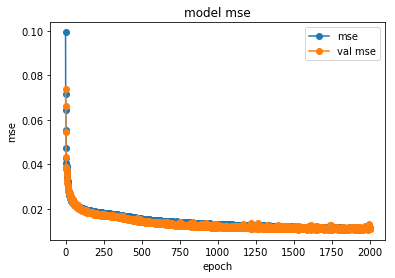

save the model


In [14]:
# -*- coding: utf-8 -*-
"""
Created on Tue Mar  7 15:43:18 2017

@author: hanar
"""
import time
import numpy as np
import os
from keras.utils import np_utils
from keras.models import Sequential
from keras.layers import Dense, Activation, Dropout
from keras.optimizers import SGD
from keras.optimizers import RMSprop
from keras.optimizers import Adagrad
from keras.optimizers import Adadelta
from keras.optimizers import Adam
from keras.optimizers import Adamax
from keras.optimizers import Nadam
from keras.callbacks import ModelCheckpoint
from keras.callbacks import EarlyStopping
from keras.callbacks import TensorBoard
from keras.models import load_model
#from keras.utils.visualize_util import plot
import matplotlib.pyplot as plt
import keras.callbacks
import keras.backend.tensorflow_backend as KTF
import tensorflow as tf

#Global variables for normalizing parameters
max_x = 1.0
min_x = 0.0
max_y = 1.0
min_y = 0.0


def deep_learning_tsunami(resdir, X_train_raw, y_train_raw, X_test_raw, y_test_raw,
                            _lr=0.02, _decay=0,
                            _validation_split=0.2, _batch_size=32,
                            _momentum=0.9, _nesterov=True,
                            num_layers=4, dropout=0.5,
                            node_num = 2500,
                            _epochs=2000):
    """
    Creating the inversion model of turbidity currents by deep learning
    """
    #Normalizing dataset
    X_train = get_normalized_data(X_train_raw, min_x, max_x)
    X_test = get_normalized_data(X_test_raw, min_x, max_x)
    y_train = get_normalized_data(y_train_raw, min_y, max_y)
    y_test = get_normalized_data(y_test_raw, min_y, max_y)
    
    #Generation of neural network model
    model = Sequential()
    model.add(Dense(node_num, input_dim=X_train.shape[1], activation='relu', kernel_initializer ='glorot_uniform'))#1st layer
    model.add(Dropout(dropout))
    for i in range(num_layers - 2):
        model.add(Dense(node_num, activation='relu', kernel_initializer ='glorot_uniform'))#2nd layer
        model.add(Dropout(dropout))
    model.add(Dense(y_train.shape[1], activation = 'relu', kernel_initializer ='glorot_uniform')) #last layer
    
    #Compiling the model
    model.compile(loss="mean_squared_error", 
              optimizer=SGD(lr=_lr, decay=_decay, momentum=_momentum, nesterov=_nesterov),
              #optimizer=Adadelta(),
              metrics=["mean_squared_error"])    
    
    #Perform learning
    t = time.time()
    check = ModelCheckpoint("model3.hdf5")
    #es_cb = EarlyStopping(monitor='val_loss', patience=5, verbose=0, mode='auto')
    #tb_cb = TensorBoard(log_dir=resdir, histogram_freq=2, write_graph=True, write_images=True)
    history = model.fit(X_train, y_train, epochs=_epochs, 
                    validation_split=_validation_split, batch_size=_batch_size,
                    callbacks=[check])
    
    #Evaluate learning result
    loss_and_metrics = model.evaluate(X_test,y_test)
    print("\nloss:{} mse:{}".format(loss_and_metrics[0],loss_and_metrics[1]))
    
    print("Elapsed time: {:.1f} sec.".format(time.time()-t))
    
    #Visualize learning result   
    #plot(model, to_file="model.png", show_shapes=True, show_layer_names=True)

    # model The state of change when letting you learnplot
    plot_history(history)
    
    return model, history

def apply_model(model, X, min_x, max_x, min_y, max_y):
    """
    Apply model
    Maximum and minimum values ​​of X and Y are required to normalize
    """
    X_norm =  (X - min_x) / (max_x - min_x)
    Y_norm = model.predict(X_norm)
    Y = Y_norm*(max_y - min_y)+min_y
    return Y

def plot_history(history):
    # Plot accuracy history
    plt.plot(history.history['mean_squared_error'],"o-",label="mse")
    plt.plot(history.history['val_mean_squared_error'],"o-",label="val mse")
    plt.title('model mse')
    plt.xlabel('epoch')
    plt.ylabel('mse')
    plt.legend(loc="upper right")
    plt.show()

#    # 損失の履歴をプロット
#    plt.plot(history.history['loss'],"o-",label="loss",)
#    plt.plot(history.history['val_loss'],"o-",label="val_loss")
#    plt.title('model loss')
#    plt.xlabel('epoch')
#    plt.ylabel('loss')
#    plt.legend(loc='upper right')
#    plt.show()

def test_model(model, x_test):
    #Test the results
    
    x_test_norm = get_normalized_data(x_test, min_x, max_x)
    test_result_norm = model.predict(x_test_norm)
    test_result = get_raw_data(test_result_norm, min_y, max_y)
    
    return test_result


def save_result(savedir, model, history, test_result):
    
    
    np.savetxt(savedir + 'test_result.txt',test_result,delimiter=',')
    np.savetxt(savedir+'loss.txt',history.history.get('loss'),delimiter=',')
    np.savetxt(savedir+'val_loss.txt',history.history.get('val_loss'),delimiter=',')
    
    #Serialize model and save
    print('save the model')
    model.save(savedir + 'model3.hdf5')

def load_data(datadir):
    """
    This function load training and test data sets, and returns variables
    """
    global min_x, max_x, min_y, max_y
    
    x_train = np.loadtxt(datadir + 'x_train.txt',delimiter=',')
    x_test = np.loadtxt(datadir + 'x_test.txt',delimiter=',')
    y_train = np.loadtxt(datadir + 'icond_train.txt',delimiter=',')
    y_test = np.loadtxt(datadir + 'icond_test.txt',delimiter=',')
    min_y = np.loadtxt(datadir + 'icond_min.txt',delimiter=',')
    max_y = np.loadtxt(datadir + 'icond_max.txt',delimiter=',')
    [min_x, max_x] = np.loadtxt(datadir + 'x_minmax.txt',delimiter=',')
    
    return x_train, y_train, x_test, y_test

def set_minmax_data(_min_x, _max_x, _min_y, _max_y):
    global min_x, max_x, min_y, max_y
    
    min_x, max_x, min_y, max_y = _min_x, _max_x, _min_y, _max_y
    return
    


def get_normalized_data(x, min_val, max_val):
    """
    Normalizing the training and test dataset
    """
    x_norm = (x - min_val) / (max_val - min_val)
    
    return x_norm

def get_raw_data(x_norm, min_val, max_val):
    """
    Get raw data from the normalized dataset
    """
    x = x_norm * (max_val - min_val) + min_val
    
    return x

if __name__ == "__main__":
    
    #Reading data  
    datadir = '/home/rimali2009/FITTNUSS-forward_training_DNN/data_g6_300grid_H_5000_20_11_roi100/'
    resdir = '/home/rimali2009/FITTNUSS-forward_training_DNN/result_g6_300grid_H_5000_20_11_roi100/'
    if not os.path.exists(resdir):
        os.mkdir(resdir)
    
    x_train, y_train, x_test, y_test = load_data(datadir)
    
     
    #Execution of learning
    testcases = [4500]
    for i in range(len(testcases)):
        resdir_case = resdir + '{}/'.format(testcases[i])        
        if not os.path.exists(resdir_case):
            os.mkdir(resdir_case)
        x_train_sub = x_train[0:testcases[i],:]
        y_train_sub = y_train[0:testcases[i],:]
        model, history = deep_learning_tsunami(resdir_case, x_train_sub, y_train_sub, x_test, y_test, num_layers=5)
        #Verify and save results
        result = test_model(model, x_test)
        save_result(resdir_case,model,history,result)




(500, 9)


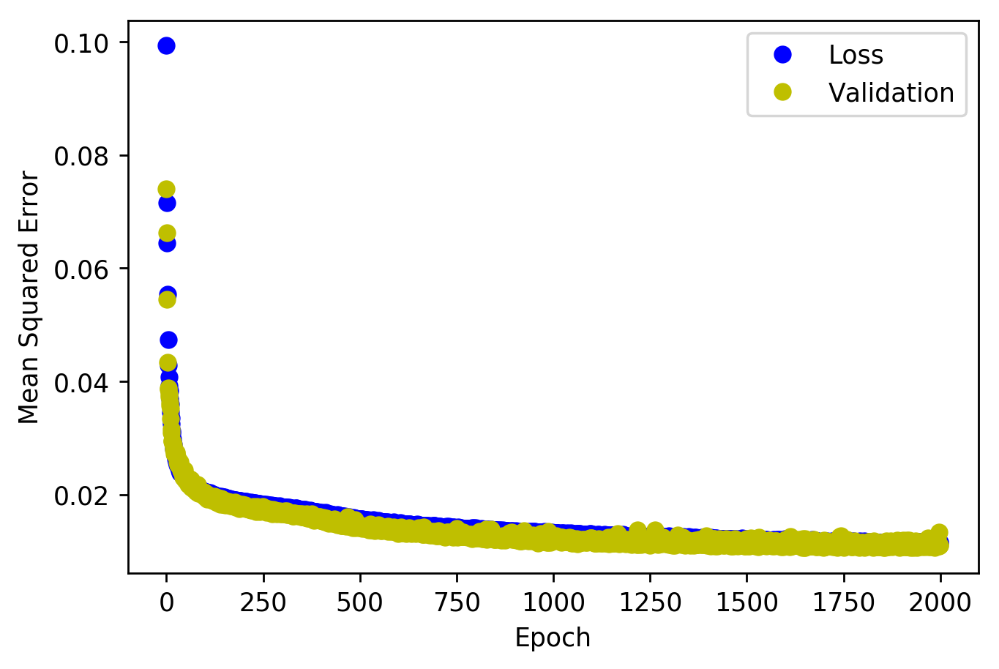

<Figure size 432x288 with 0 Axes>

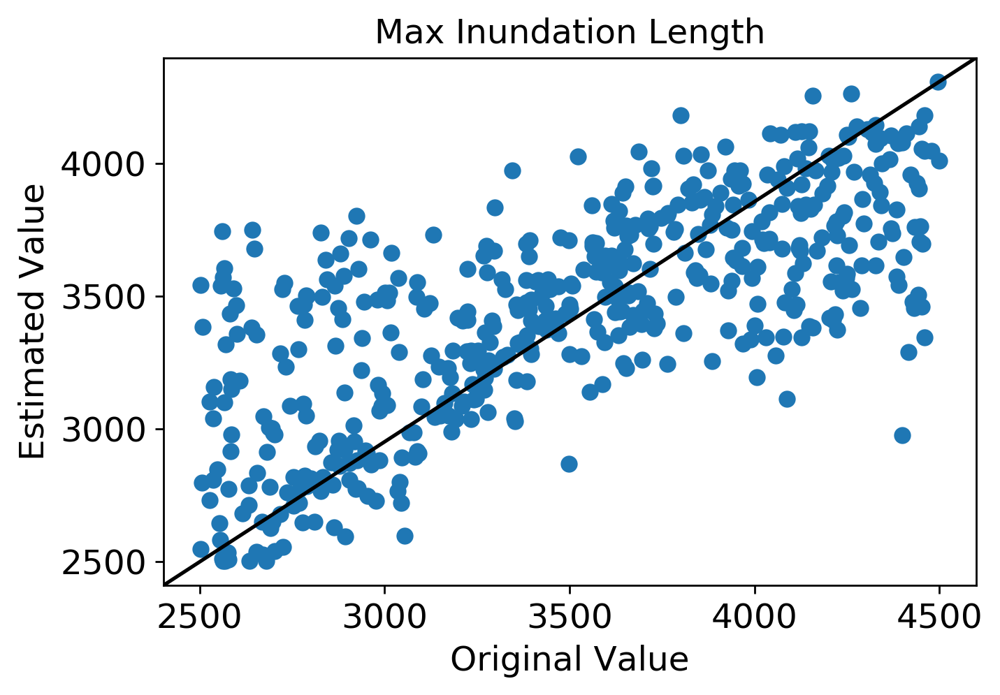

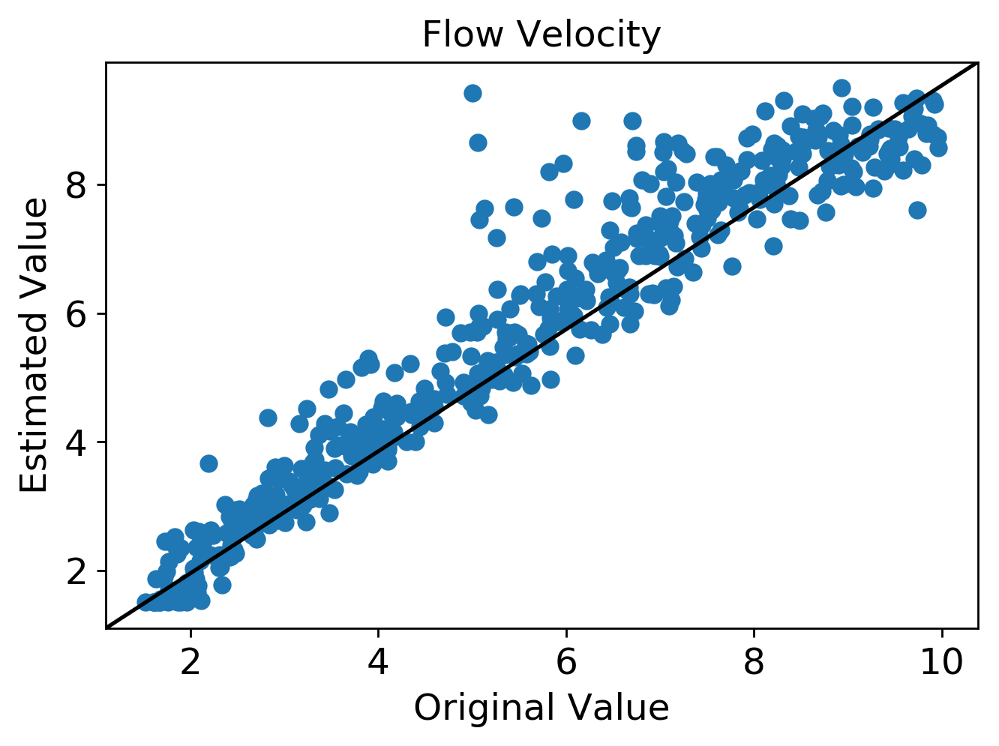

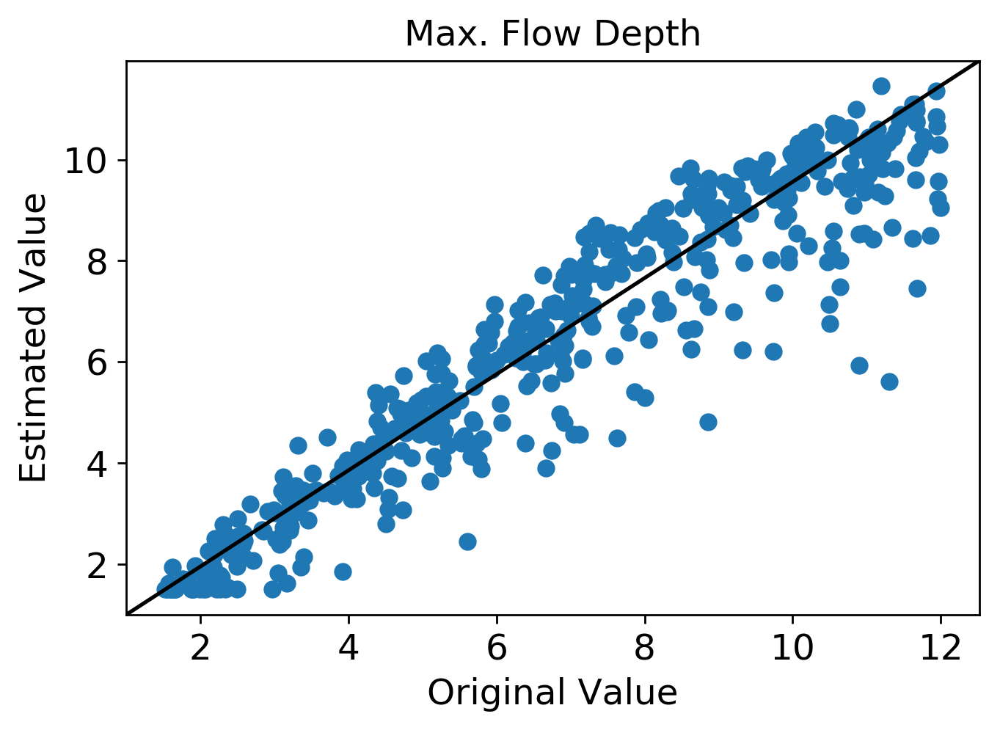

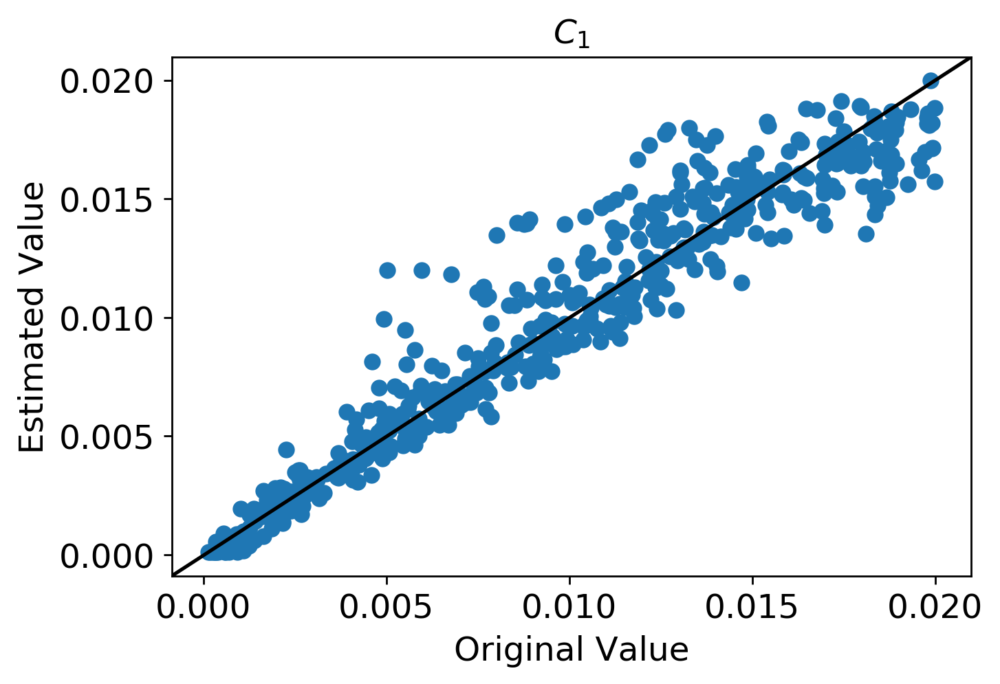

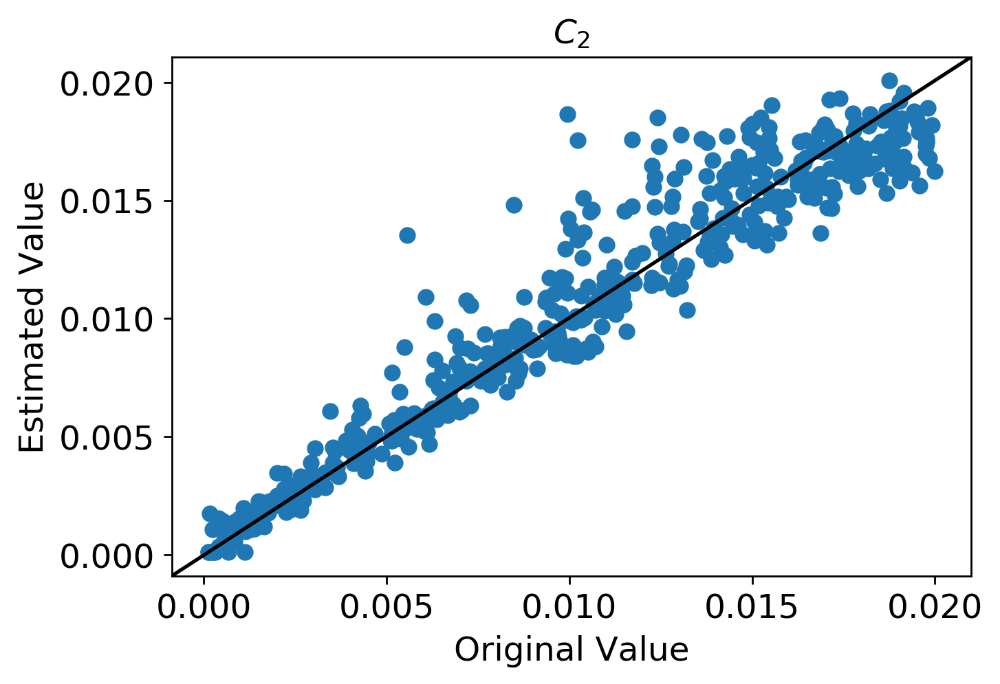

...

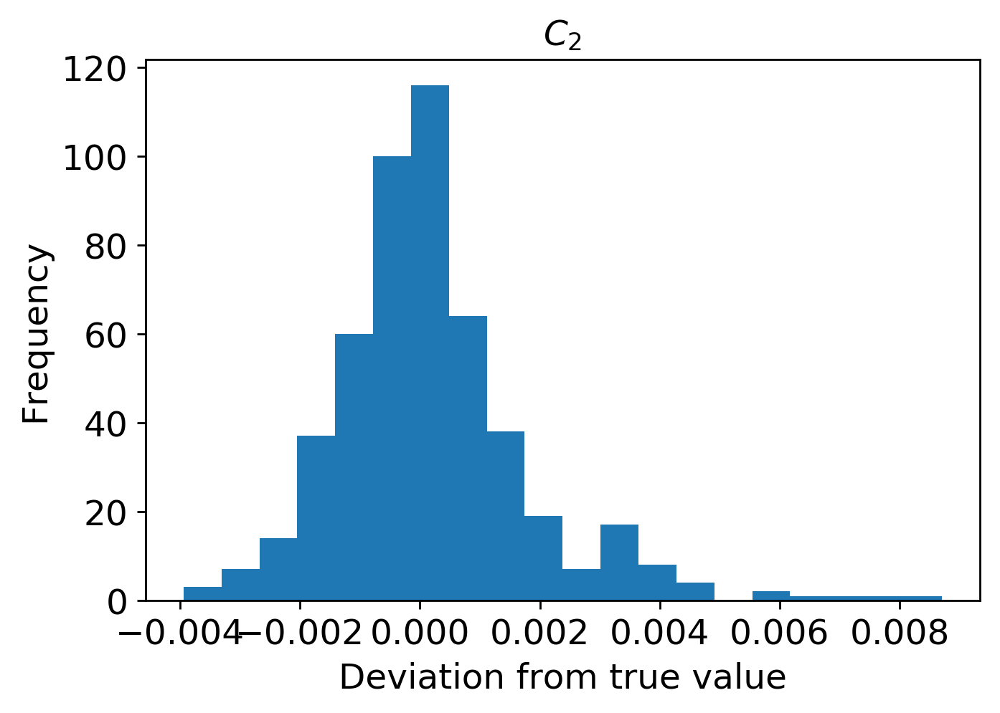

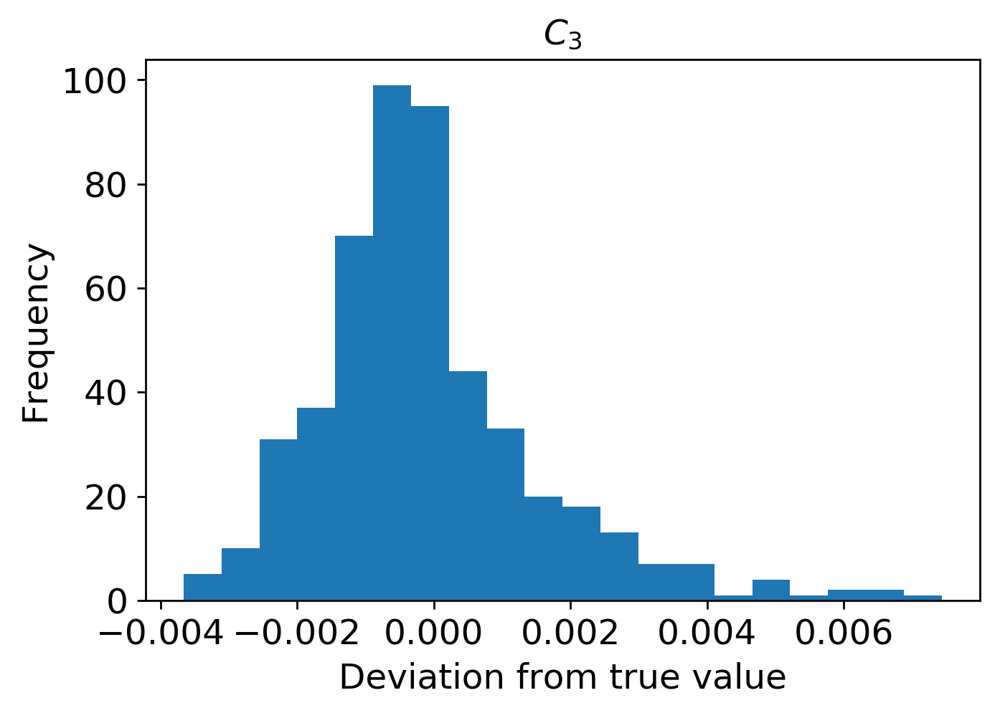

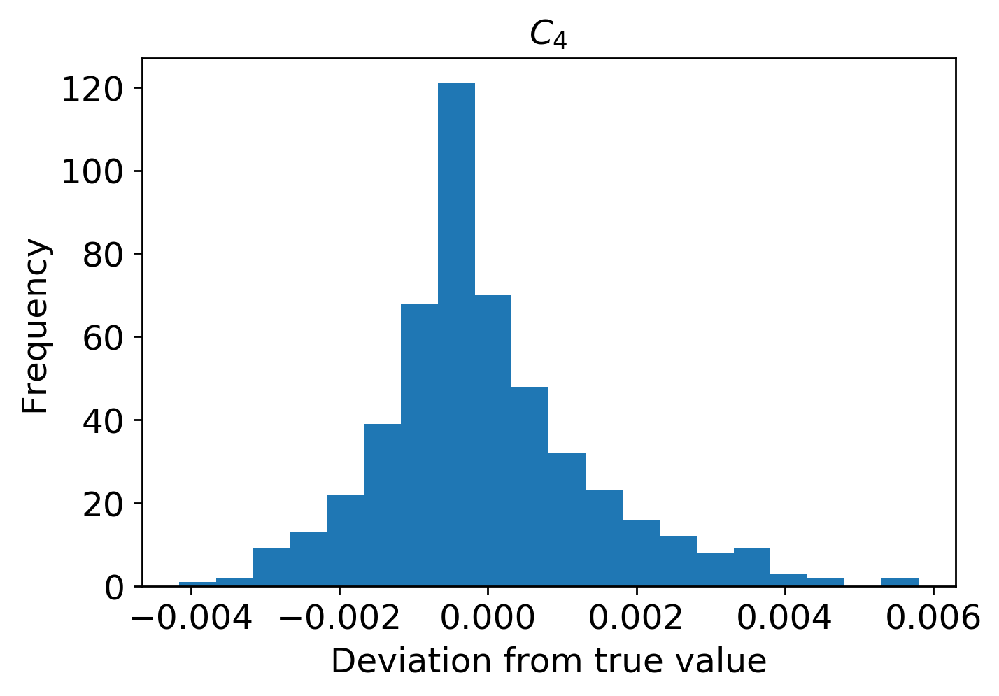

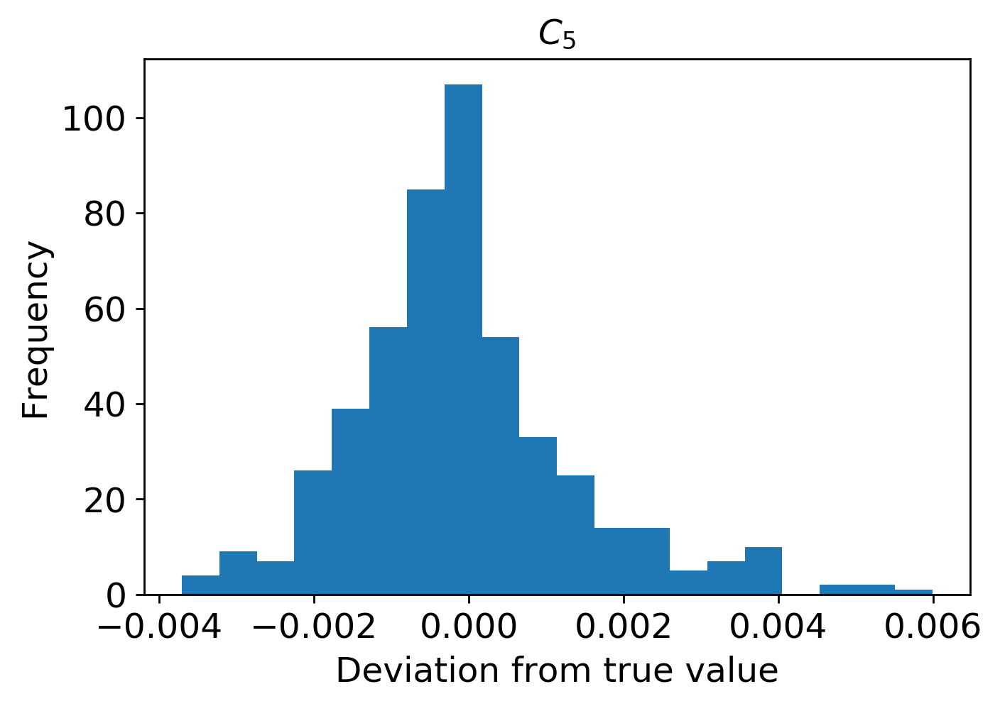

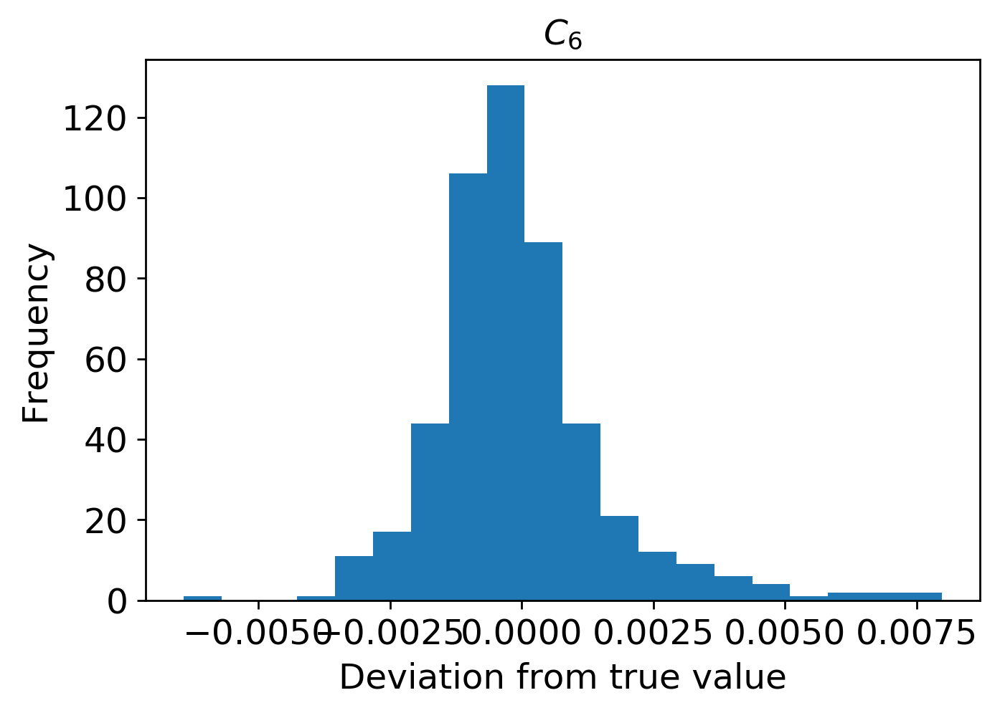

In [15]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

datadir = '/home/rimali2009/FITTNUSS-forward_training_DNN/data_g6_300grid_H_5000_20_11_roi100/'
resdir = '/home/rimali2009/FITTNUSS-forward_training_DNN/result_g6_300grid_H_5000_20_11_roi100/4500/'

test_result = np.loadtxt(resdir + 'test_result.txt',delimiter=',')
icond = np.loadtxt(datadir + 'icond_test.txt',delimiter=',')
print(icond.shape)
loss = np.loadtxt(resdir+'loss.txt',delimiter=',')
epoch = range(0,2000)
vloss = np.loadtxt(resdir+'val_loss.txt',delimiter=',')
resi = test_result - icond

fig = plt.figure(num=None,dpi=250, facecolor='w', edgecolor='k')
plt.plot(epoch, loss, 'bo',label='Loss')
plt.plot(epoch, vloss, 'yo',label='Validation')
plt.xlabel('Epoch')
plt.ylabel('Mean Squared Error')
plt.legend(loc="upper right")
plt.savefig(resdir+ 'mse.eps')
plt.show()

fig2 = plt.figure()
hfont = {'fontname':'Century Gothic'}
textcol = 'k'
titlelabel = ['Max Inundation Length','Flow Velocity', 'Max. Flow Depth', '$C_1$', '$C_2$', '$C_3$', '$C_4$','$C_5$','$C_6$']


    
for i in range(len(titlelabel)):
    plt.figure(num=None,dpi=250, facecolor='w', edgecolor='k')
    plt.plot(icond[:,i],test_result[:,i],"o")
    x=icond[:,i]
    y=test_result[:,i]
    y_lim = plt.ylim()
    x_lim = plt.xlim()
    plt.plot(x_lim, y_lim, 'k-', color = 'k')
    plt.ylim(y_lim)
    plt.xlim(x_lim)
    plt.xlabel('Original Value',color=textcol,size=14,**hfont)
    plt.ylabel('Estimated Value',color=textcol,size=14,**hfont)
    plt.title(titlelabel[i],color=textcol,size=14,**hfont)
    plt.tick_params(labelsize=14,colors=textcol)
    plt.savefig(resdir+titlelabel[i] + '.eps')
    #plt.show()

for i in range(len(titlelabel)):
    plt.figure(num=None,dpi=250, facecolor='w', edgecolor='k')
    plt.hist(resi[:,i],bins=20)
    plt.title(titlelabel[i],color=textcol,size=14,**hfont)
    plt.xlabel('Deviation from true value',color=textcol,size=14,**hfont)
    plt.ylabel('Frequency',color=textcol,size=14,**hfont)
    plt.tick_params(labelsize=14,colors=textcol)
    plt.savefig(resdir+titlelabel[i] + 'hist' + '.eps')
    plt.show()

       distance        g1        g2        g3        g4        g5        g6
0      0.000000  0.036771  0.167260  0.114845  0.008449  0.002190  0.005161
1    103.794102  0.000000  0.075200  0.153283  0.013753  0.001885  0.000442
2    171.620654  0.002130  0.051171  0.084309  0.006218  0.001867  0.002843
3    397.112167  0.003115  0.016359  0.078858  0.011466  0.000597  0.000054
4    595.912969  0.000732  0.016896  0.028720  0.002661  0.000914  0.000000
5    707.625749  0.000143  0.002228  0.005502  0.000900  0.000187  0.000104
6    796.435078  0.000236  0.004337  0.021204  0.003169  0.000309  0.000080
7    895.065500  0.001688  0.016059  0.081413  0.020284  0.006824  0.004628
8    988.394177  0.004567  0.008166  0.074658  0.016913  0.002424  0.001580
9   1081.819325  0.001567  0.016305  0.060234  0.011086  0.004165  0.001994
10  1195.756993  0.001022  0.002370  0.017565  0.004194  0.000567  0.000142
11  1290.372534  0.000000  0.004121  0.057974  0.014565  0.000426  0.000213
12  1400.896

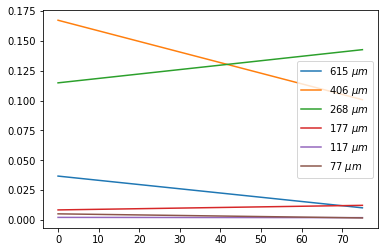

In [16]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model
from scipy import stats
from scipy.interpolate import interp1d 
import pandas as pd
from pykrige import OrdinaryKriging as OK
import ipdb


datadir = '/home/rimali2009/FITTNUSS-forward_training_DNN/data_g6_300grid_H_5000_20_11_roi100/'
resdir = '/home/rimali2009/FITTNUSS-forward_training_DNN/result_g6_300grid_H_5000_20_11_roi100/4500/'
#Initial setting
if not "model" in locals(): 
    model = load_model(resdir+'model3.hdf5')
#gclass = 3
#gclass_label = ["500 $\mu$m","125 $\mu$m","63 $\mu$m"]
gclass = 6
gclass_label = ["615 ${\mu}m$","406 ${\mu}m$","268 ${\mu}m$","177 ${\mu}m$", "117 ${\mu}m$","77 ${\mu}m$"]
topodx = 15.0
coord_num = int(model.layers[0].input_shape[1]/gclass)

#Acquires a value for normalizing input data to [0, 1]
min_x, max_x = np.loadtxt(datadir + 'x_minmax.txt',delimiter=',')
y_min = np.loadtxt(datadir + 'icond_min.txt',delimiter=',')
y_max = np.loadtxt(datadir + 'icond_max.txt',delimiter=',')

#Read outcrop data
#dist_max = 22000. #Distance of distal end of learning data
outcrop = pd.read_csv('../FITTNUSS-forward_training_DNN/sendai_increased_class_edit.csv')
#outcrop = pd.read_csv('../DeepLearningTurbidite_Fukuda/GA_naruse_v2.csv')
#outcrop = outcrop.append(pd.DataFrame([[0,'Loc0',0,0,0],[dist_max,'LocE',0,0,0]], columns=outcrop.columns))
outcrop = outcrop.sort_values('distance')
outcrop['distance'] = outcrop['distance'] - 0
#d = pd.DataFrame(np.zeros((1, 7)),columns=['distance', 'g1','g2','g3','g4','g5','g6'])
#print(d)
#v=np.concatenate((outcrop, d))
#print(v)
#outcrop=pd.DataFrame(v,columns=['distance', 'g1','g2','g3','g4','g5','g6'])
#outcrop['distance'].iloc[-1]=4000
#outcrop = outcrop.append(pd.DataFrame([[0,'Loc0',0,0,0,0]], columns=outcrop.columns))
print(outcrop)

#Preparation under interpolation
thick_interp = np.zeros([1,coord_num*gclass])#補間されたサンプル厚さデータ
outcrop_x_id = np.round(outcrop['distance']/topodx).astype(np.int32) #逆解析システムでのサンプリング地点のindex番号
x = np.arange(0,coord_num*topodx,topodx)

#Complement data
for j in range(gclass):
    f = interp1d(outcrop['distance'],outcrop.iloc[:,j+1], kind="linear",bounds_error=False,fill_value='extrapolate')
    #f = interp1d(outcrop['distance'],outcrop.iloc[:,j+2], kind="linear",bounds_error=False,fill_value='extrapolate') 
    #Interpolation function of jth granularity level
    thick_interp[0,coord_num*j:coord_num*(j+1)] = f(x) #Supplemented data

#ipdb.set_trace()
#Kriging Interpolation by
#vparams = np.array([[0.035, 10000., 0.001],[0.006, 10000., 0.002],[0.005, 10000., 0.002],[0.035, 10000., 0.001]])
#for j in range(gclass):
    #okip = OK(outcrop['distance'],np.zeros(outcrop['distance'].shape),outcrop.iloc[:,j+1],variogram_model='linear',)
    #okip.display_variogram_model()
    #ipdata, ipstd = okip.execute('grid',x,np.array([0.]))
    #ipdata = np.squeeze(ipdata)
    #thick_interp[0,coord_num*j:coord_num*(j+1)] = ipdata #Assign complemented d

#Normalize data
thick_interp[thick_interp < 0] = 0
thick_interp_norm =  (thick_interp - min_x) / (max_x - min_x)

#Perform inverse analysis
test_result_outcrop = model.predict(thick_interp_norm)
test_result_outcrop = test_result_outcrop * (y_max - y_min) + y_min
print(test_result_outcrop)
#add=np.array(3000)
#test_result_outcrop_add=np.concatenate((add,test_result_outcrop), axis=None)
#Output results
#print(test_result_outcrop_add)
np.savetxt('outcrop_result_g6_g300_H_5000_20_11_roi100.txt',test_result_outcrop, delimiter=',')
for i in range(len(gclass_label)):
    plt.plot(x,thick_interp[0,coord_num * i:coord_num * (i+1)],label=gclass_label[i])
plt.legend()
plt.show()



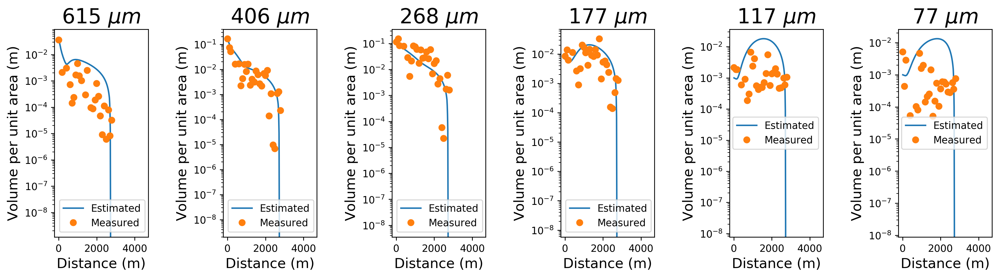

In [17]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import Forward_model_modified_FITTNUSS_5000_g6_300grid_19_11_case2 as fmodel
import time
import ipdb
%matplotlib inline

#Basic setting

#dist_max = 3000.
gclass = 6
topodx=15.0
gclass_name = ['615microm','406microm','268microm','177microm','117microm','77microm']
#gclass_name = ['500micron', '125micron', '63micron']
gname_tex = ["615 ${\mu}m$","406 ${\mu}m$","268 ${\mu}m$","177 ${\mu}m$", "117 ${\mu}m$","77 ${\mu}m$"]
#gname_tex = ['500 $\mu$m','125 $\mu$m','63 $\mu$m']
#calcdir = 'home/rimali2009/FITTNUSS-forward_training_DNN/'
#calcdir = '/home/naruse/Documents/Documents/MATLAB/TCtrainData_forML/TCModel_for_MLTEST/test_output_otadai07/'

#Load estimate
#H1 = np.loadtxt(calcdir + 'H1.txt',delimiter=',')
#H2 = np.loadtxt(calcdir + 'H2.txt',delimiter=',')
#H3 = np.loadtxt(calcdir + 'H3.txt',delimiter=',')
#H4 = np.loadtxt(calcdir + 'H4.txt',delimiter=',')
#Ht = np.loadtxt(calcdir + 'Ht.txt',delimiter=',')
#U = np.loadtxt(calcdir + 'U.txt',delimiter=',')
#xi = np.loadtxt(calcdir + 'xi.txt',delimiter=',')
#x = np.loadtxt(calcdir + 'x.txt',delimiter=',')
#x_bed = np.loadtxt(calcdir + 'x_init.txt',delimiter=',')
#eta_init = np.loadtxt(calcdir + 'eta_init.txt',delimiter=',')
#Ct = np.loadtxt(calcdir + 'Ct.txt',delimiter=',')
#time = np.loadtxt(calcdir + 'time.txt',delimiter=',')
estimated_icond=np.loadtxt('outcrop_result_g6_g300_H_5000_20_11_roi100.txt', delimiter=',')
start = time.time()
fmodel.read_setfile("config_g6_300grid_19_11_case2.ini")
(x,C,x_dep,deposit) = fmodel.forward(estimated_icond)
np.savetxt('eta_estimated_thickness_5K_g6_TC4_Rwcnst_H_5000_20_11_roi100.csv', deposit, delimiter=',')
np.savetxt('eta_estimated_Distance_5K_g6_TC4_Rwcnst_H_5000_20_11_roi100.csv', x_dep,delimiter=',')
estimated_dep_thickness_5000=np.transpose(np.loadtxt('/home/rimali2009/FITTNUSS-forward_training_DNN/'+'eta_estimated_thickness_5K_g6_TC4_Rwcnst_H_5000_20_11_roi100.csv', delimiter=','))
estimated_dep_thickness_5000=pd.DataFrame(estimated_dep_thickness_5000,columns=['615microm','406microm','268microm','177microm','117microm','77microm'])
estimated_dep_distance_5000=np.transpose(np.loadtxt('/home/rimali2009/FITTNUSS-forward_training_DNN/'+'eta_estimated_Distance_5K_g6_TC4_Rwcnst_H_5000_20_11_roi100.csv', delimiter=','))
estimated_dep_distance_5000=pd.DataFrame(estimated_dep_distance_5000,columns=['distance'])
estimated_dep_5000=pd.concat([estimated_dep_distance_5000,estimated_dep_thickness_5000],axis=1)
np.savetxt('estimated_dep_5K_g6_TC4_Rwcnst_H_5000_20_11_roi100.csv',estimated_dep_5000,delimiter=',')
#data_estim=pd.DataFrame(estimated_dep_5000,columns=['distance','1.5phi','2.5phi','3.5phi','4.5phi'])

#Formatting the loaded data
#estimated_dep_df = pd.DataFrame(estimated_dep,columns=['distance','1.5phi','2.5phi','3.5phi','4.5phi'])
#estimated_dep = pd.DataFrame(np.array([x_bed - dist_offset,H1[-1,:],H2[-1,:],H3[-1,:]]).T,columns=['distance','500micron','125micron','63micron'])
estimated_dep_5000= estimated_dep_5000.query('distance > 0')
#estimated_dep_5000 = estimated_dep_5000.query('distance < {}'.format(dist_max))

#Read original data
outcrop = pd.read_csv('../FITTNUSS-forward_training_DNN/sendai_increased_class.csv')
outcrop= pd.DataFrame(outcrop,columns=['distance','615microm','406microm','268microm','177microm','117microm','77microm'])
#outcrop = pd.read_csv('../DeepLearningTurbidite_Fukuda/GA_naruse_v2.csv')
#outcrop = outcrop.append(pd.DataFrame([[0,'Loc0',0,0,0],[dist_max,'LocE',0,0,0]], columns=outcrop.columns))
#outcrop = outcrop.sort_values('distance')
#outcrop['distance'] = outcrop['distance'] - 1000

#Plot
plt.figure(num=None, figsize=(17, 4), dpi=250, facecolor='w', edgecolor='g')
hfont = {'fontname':'Sans'}
plt.subplots_adjust(bottom=0.15, wspace=0.8)

for i in range(gclass):
    plt.subplot(1,gclass,i+1)
    plt.plot(estimated_dep_5000['distance'],estimated_dep_5000[gclass_name[i]],'-', label='Estimated')
    plt.plot(outcrop['distance'], outcrop[gclass_name[i]],'o', label='Measured')
    plt.yscale('log')
    plt.title(gname_tex[i], size=21,**hfont)
    plt.xlabel('Distance (m)', size = 14, **hfont)
    plt.ylabel('Volume per unit area (m)', size = 14, **hfont)
    plt.legend(fontsize=10)
    plt.savefig("thickness_distance_curve_5000_g6_300grid_H_5000_20_11_roi100.png")
    plt.savefig("thickness_distance_curve_5000_g6_300grid_H_5000_20_11_roi100.eps")
plt.show()



Using TensorFlow backend.


       distance        g1        g2        g3        g4        g5        g6
0      0.000000  0.036771  0.167260  0.114845  0.008449  0.002190  0.005161
1    103.794102  0.000000  0.075200  0.153283  0.013753  0.001885  0.000442
2    171.620654  0.002130  0.051171  0.084309  0.006218  0.001867  0.002843
3    397.112167  0.003115  0.016359  0.078858  0.011466  0.000597  0.000054
4    595.912969  0.000732  0.016896  0.028720  0.002661  0.000914  0.000000
5    707.625749  0.000143  0.002228  0.005502  0.000900  0.000187  0.000104
6    796.435078  0.000236  0.004337  0.021204  0.003169  0.000309  0.000080
7    895.065500  0.001688  0.016059  0.081413  0.020284  0.006824  0.004628
8    988.394177  0.004567  0.008166  0.074658  0.016913  0.002424  0.001580
9   1081.819325  0.001567  0.016305  0.060234  0.011086  0.004165  0.001994
10  1195.756993  0.001022  0.002370  0.017565  0.004194  0.000567  0.000142
11  1290.372534  0.000000  0.004121  0.057974  0.014565  0.000426  0.000213
12  1400.896

       distance        g1        g2        g3        g4        g5        g6
0      0.000000  0.036771  0.167260  0.114845  0.008449  0.002190  0.005161
1    103.794102  0.000000  0.075200  0.153283  0.013753  0.001885  0.000442
2    171.620654  0.002130  0.051171  0.084309  0.006218  0.001867  0.002843
3    397.112167  0.003115  0.016359  0.078858  0.011466  0.000597  0.000054
4    595.912969  0.000732  0.016896  0.028720  0.002661  0.000914  0.000000
5    796.435078  0.000236  0.004337  0.021204  0.003169  0.000309  0.000080
6    895.065500  0.001688  0.016059  0.081413  0.020284  0.006824  0.004628
7    988.394177  0.004567  0.008166  0.074658  0.016913  0.002424  0.001580
8   1081.819325  0.001567  0.016305  0.060234  0.011086  0.004165  0.001994
9   1195.756993  0.001022  0.002370  0.017565  0.004194  0.000567  0.000142
10  1290.372534  0.000000  0.004121  0.057974  0.014565  0.000426  0.000213
11  1400.896519  0.000295  0.003096  0.027406  0.009121  0.000502  0.000251
12  1495.352

/home/rimali2009/anaconda3/envs/test3/lib/python3.6/site-packages/matplotlib/font_manager.py:1241: UserWarning: findfont: Font family ['Century Gothic'] not found. Falling back to DejaVu Sans.
  (prop.get_family(), self.defaultFamily[fontext]))


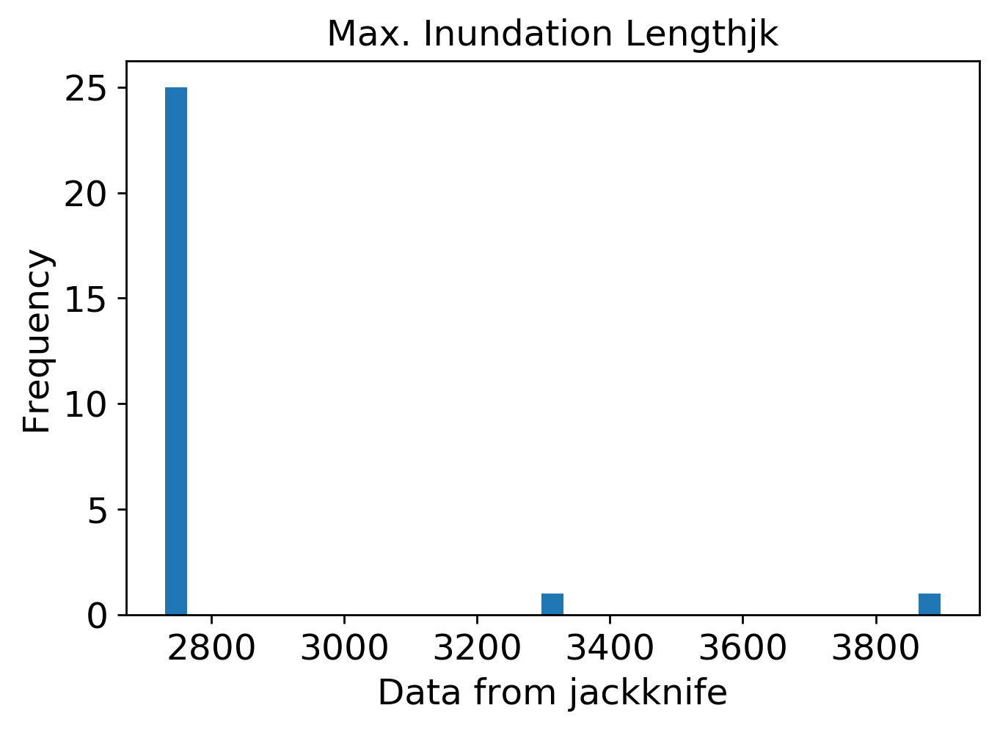

mean: 5.6642721382205385
jk_e: 0.07764753369998464


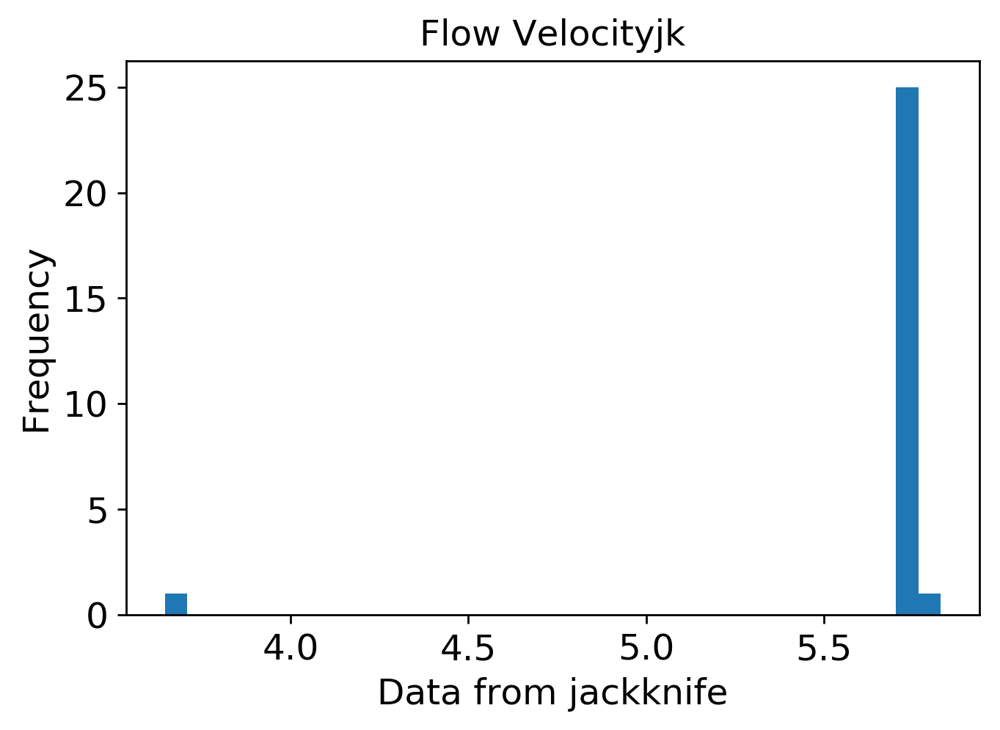

mean: 6.02740386187054
jk_e: 0.07781896404103894


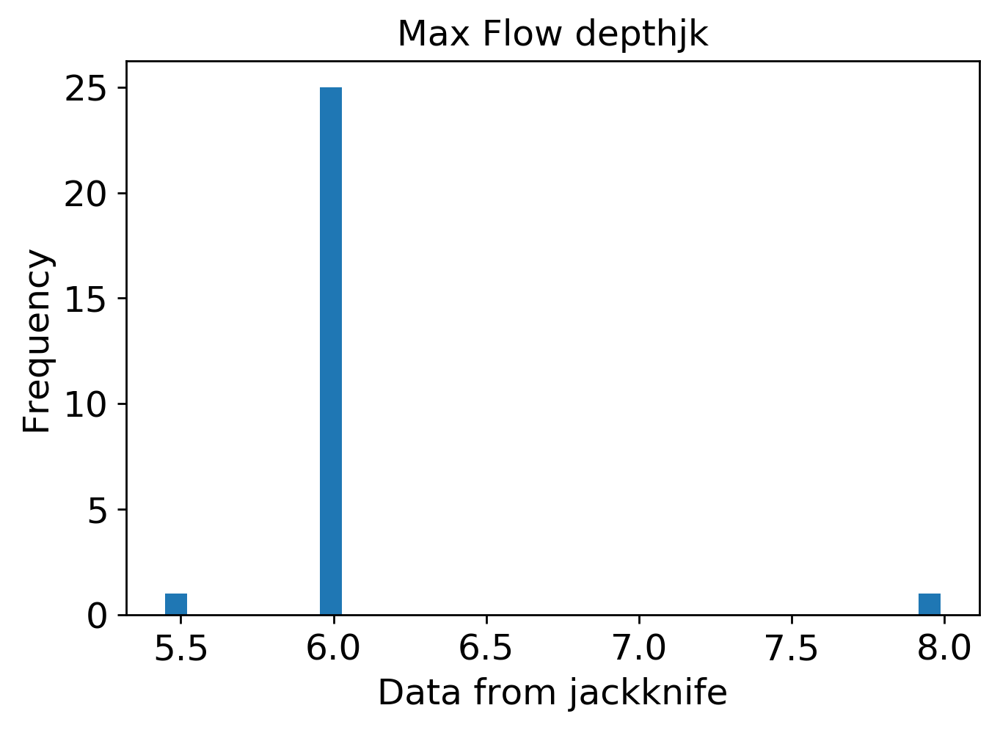

mean: 0.004305504797491877
jk_e: 0.00016788742310753192


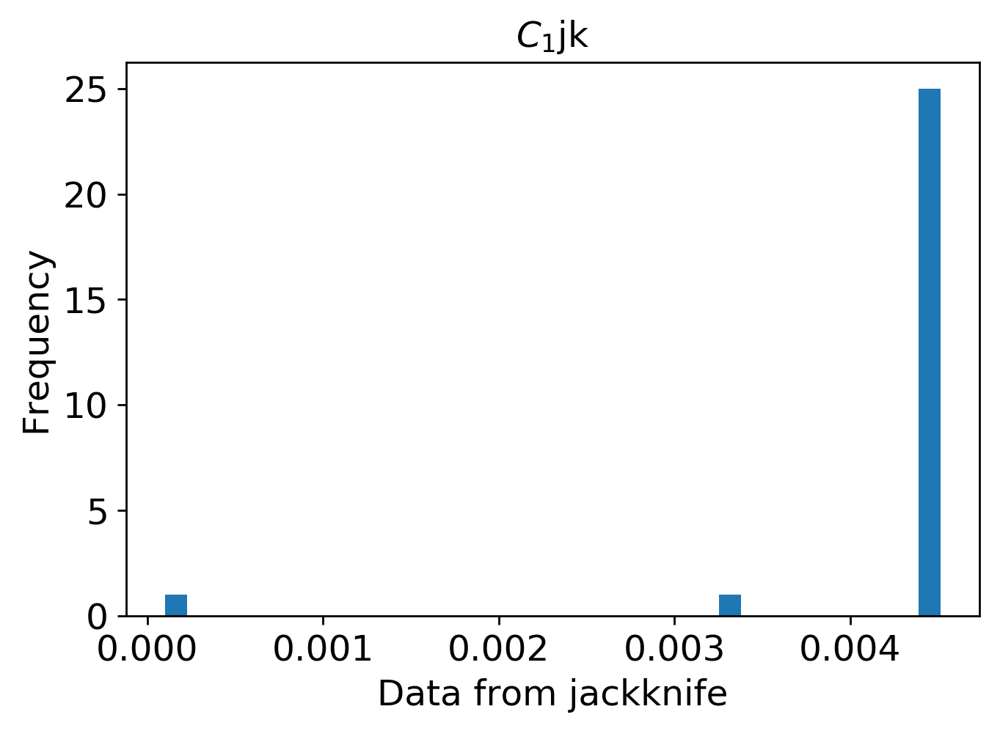

mean: 0.016315887357788945
jk_e: 0.000291206789955815


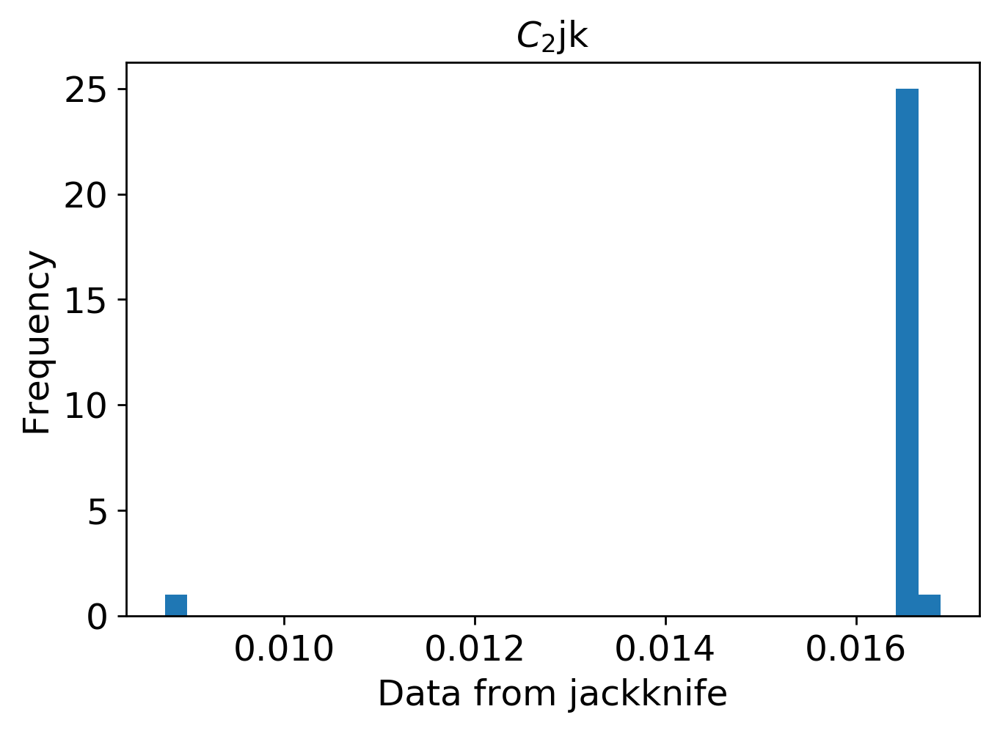

mean: 0.01249312210609798
jk_e: 0.0002106092900842716


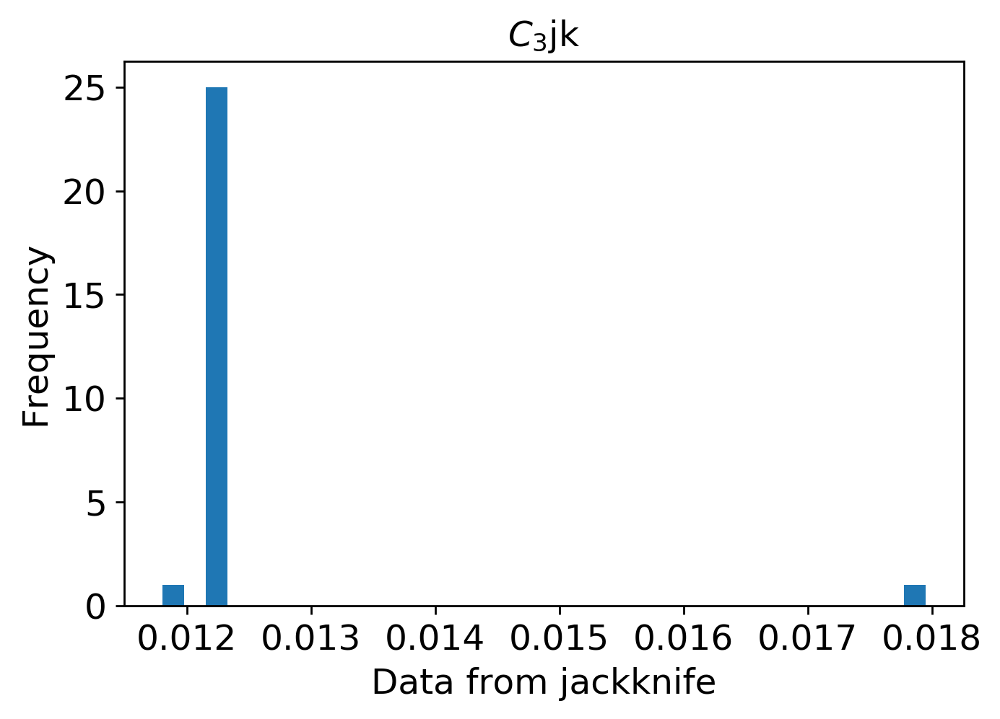

mean: 0.0006617570977905256
jk_e: 2.7463238952089074e-05


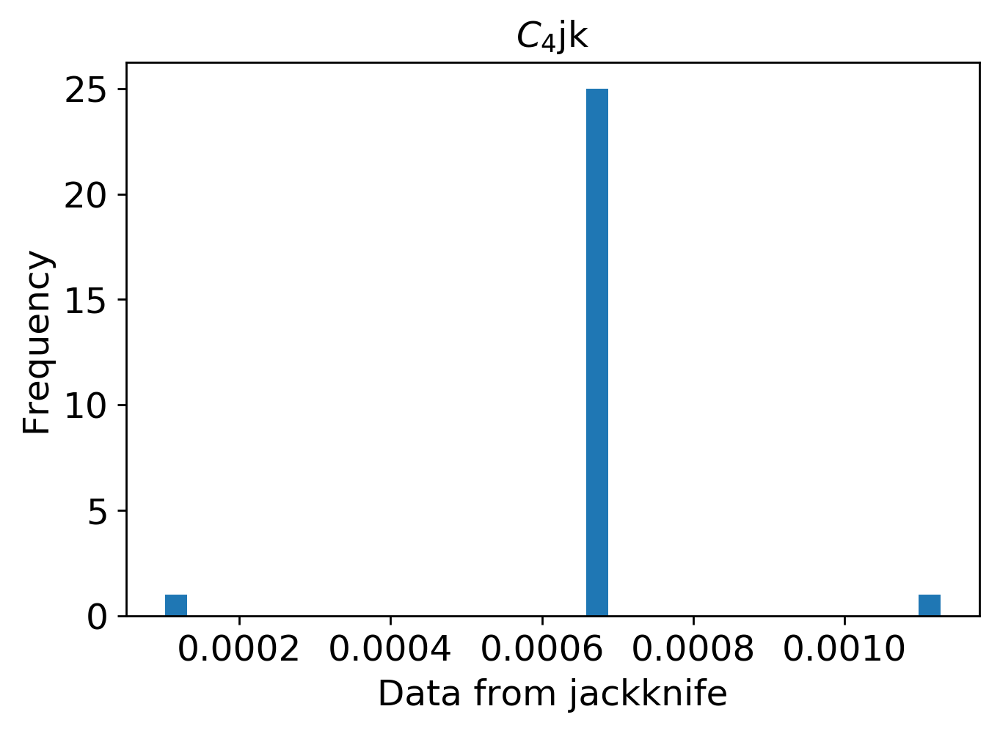

mean: 0.00010136096021857652
jk_e: 0.0


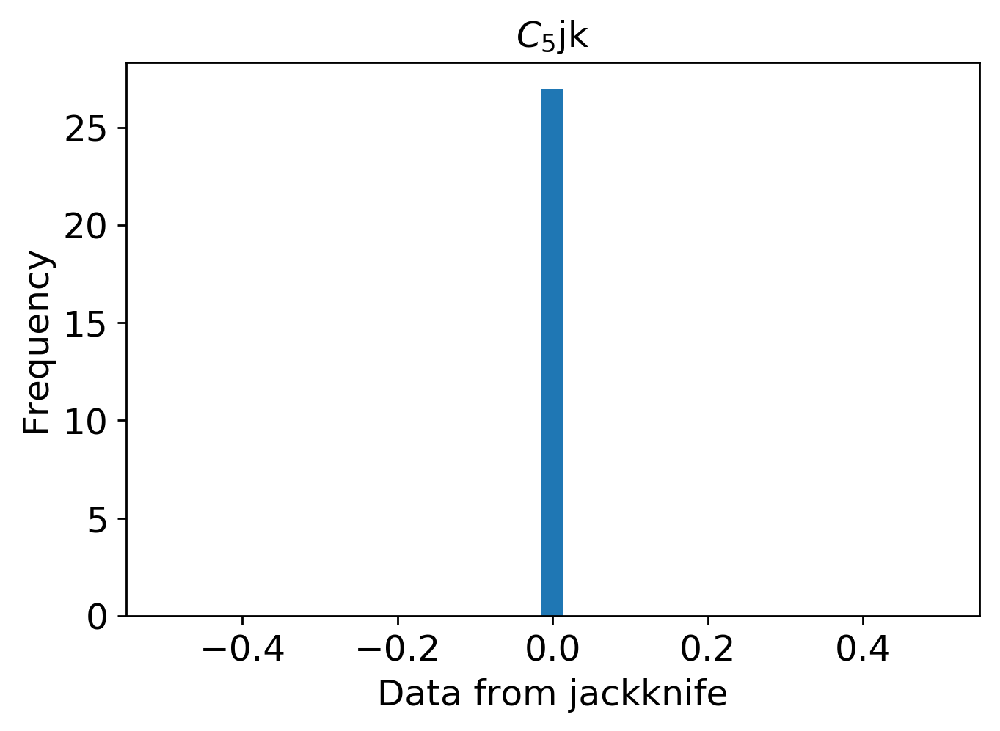

mean: 0.00010077369382058624
jk_e: 0.0


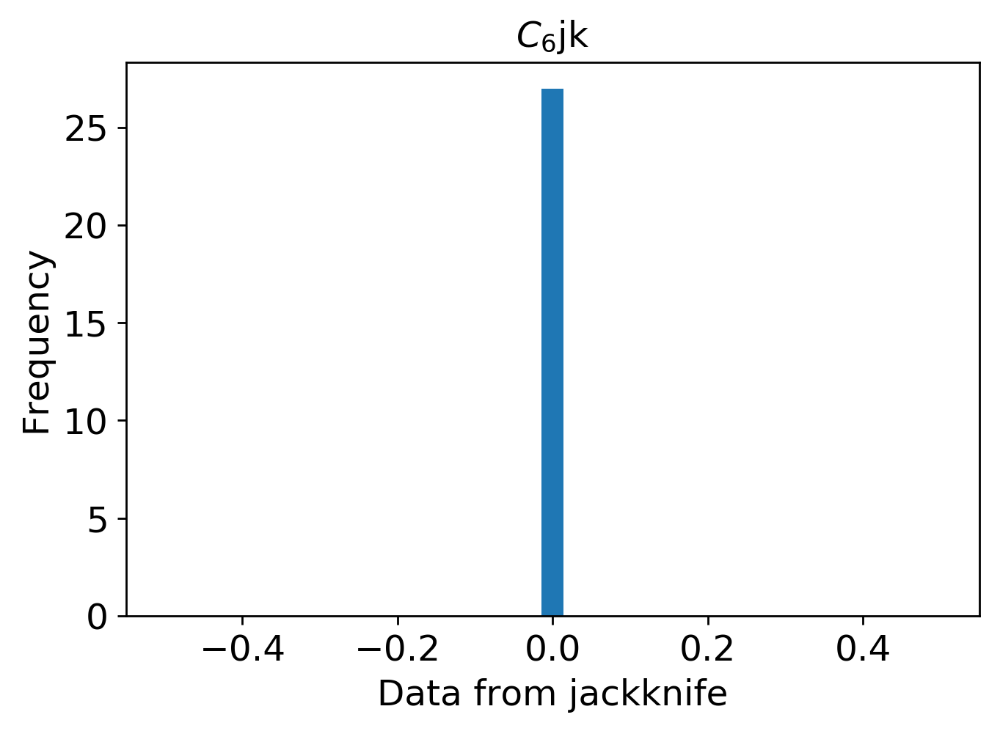

In [1]:
# Jackknife Method
import csv
import numpy as np
import pandas as pd
import math
from keras.models import load_model
from scipy.interpolate import interp1d
import matplotlib.pyplot as plt
%matplotlib inline

datadir = '/home/rimali2009/FITTNUSS-forward_training_DNN/data_g6_300grid_H_5000_20_11_roi100/'
resdir = '/home/rimali2009/FITTNUSS-forward_training_DNN/result_g6_300grid_H_5000_20_11_roi100/4500/'
# Initial setting
if not "model" in locals():
    model = load_model(resdir+'model3.hdf5')
gclass = 6
gclass_label = ["615 ${\mu}m$", "406 ${\mu}m$", "268 ${\mu}m$",
                "177 ${\mu}m$", "117 ${\mu}m$", "77 ${\mu}m$"]
topodx = 15.0
coord_num = int(model.layers[0].input_shape[1]/gclass)
min_x, max_x = np.loadtxt(datadir + 'x_minmax.txt', delimiter=',')
y_min = np.loadtxt(datadir + 'icond_min.txt', delimiter=',')
y_max = np.loadtxt(datadir + 'icond_max.txt', delimiter=',')


a = pd.read_csv(
    '../FITTNUSS-forward_training_DNN/sendai_increased_class_edit.csv', delimiter=',')
print(a)
y = pd.DataFrame()
output = []

with open('output_final_20_11_roi100.csv', 'w') as outfile:

    # x=[]
    for index in range(len(a)):
        df = y.append(pd.read_csv(
            '../FITTNUSS-forward_training_DNN/sendai_increased_class_edit.csv', skiprows=[index+1]))
        print(df)
        df = df.sort_values('distance')
        thick_interp = np.zeros([1, coord_num*gclass])
        x = np.arange(0, coord_num*topodx, topodx)
        for j in range(gclass):
            # Interpolation function of jth granularity level
            f = interp1d(df['distance'], df.iloc[:, j+1],
                         kind="linear", bounds_error=False,fill_value='extrapolate')
            thick_interp[0, coord_num*j:coord_num*(j+1)] = f(x)
        thick_interp[thick_interp < 0] = 0
        thick_interp_norm = (thick_interp - min_x) / (max_x - min_x)
        test_result_outcrop = model.predict(thick_interp_norm)
        test_result_outcrop = test_result_outcrop * (y_max - y_min) + y_min
        print(test_result_outcrop.shape)
        print(test_result_outcrop)
    # output.append(test_result_outcrop)
        np.savetxt(outfile,test_result_outcrop, delimiter=',')
        # outfile.write('# New iteration\n')
hfont = {'fontname': 'Century Gothic'}
textcol = 'k'
resi = np.loadtxt('output_final_20_11_roi100.csv', delimiter=',')
titlelabel = ['Max. Inundation Lengthjk','Flow Velocityjk', 'Max Flow depthjk',
              '$C_1$jk', '$C_2$jk', '$C_3$jk', '$C_4$jk', '$C_5$jk', '$C_6$jk']
jk_er=[]
with open('jk_e_roi100.txt','wb') as ftext:
    for i in range(len(titlelabel)):
        plt.figure(num=None, dpi=250, facecolor='w', edgecolor='k')
        plt.hist(resi[:, i], bins=35)
        mean = sum(resi[:,i]) / len(resi[:,i])
        print("mean:",mean)
        var_jk  = sum(pow(x-mean,2) for x in resi[:,i]) / ((len(resi[:,i])-1)*(len(resi[:,i])))
        jk_e= math.sqrt(var_jk)
        print("jk_e:",jk_e)
        e=np.append(jk_e,jk_er)
        np.savetxt(ftext,e,delimiter=',')
        plt.title(titlelabel[i], color=textcol, size=14, **hfont)
        plt.xlabel('Data from jackknife', color=textcol, size=14, **hfont)
        plt.ylabel('Frequency', color=textcol, size=14, **hfont)
        plt.tick_params(labelsize=14, colors=textcol)
        plt.savefig(resdir+titlelabel[i] + 'jkhist' + '.eps')
        plt.show()

# ROI 1200

In [18]:
import numpy as np
import os
#import ipdb

def connect_dataset(file_list, icond_file_list, outputdir,
                    topodx=15, roi=2500, offset=5000,gclass_num=6,test_data_num=500):
    """
    複数のデータセットを連結する
    """
    #ipdb.set_trace()
    
    #Reading and combining files Decide start and end points of the learning area and convert them to grid numbers
    H = np.loadtxt(file_list[0], delimiter = ',')
    icond = np.loadtxt(icond_file_list[0], delimiter = ',')
    
    #Reading and combining files
    if len(file_list) > 1:
        for i in range(1, len(file_list)):
            H_temp = np.loadtxt(file_list[i], delimiter = ',')
            icond_temp = np.loadtxt(icond_file_list[i], delimiter = ',')
            H = np.concatenate((H,H_temp),axis=0)
            icond = np.concatenate((icond,icond_temp),axis = 0)
    
    roi_grids = int(roi / topodx)
    num_grids = int(H.shape[1] / gclass_num)
    H_subset = np.zeros([H.shape[0], roi_grids * gclass_num])
    for i in range(gclass_num):
        H_subset[:, i*roi_grids:(i+1)*roi_grids] = H[:, i*num_grids:(i*num_grids+roi_grids)]
    
    #Obtain the maximum and minimum values of data
    max_x = np.max(H_subset)
    min_x = np.min(H_subset)
    icond_max = np.max(icond, axis=0)
    icond_min = np.min(icond, axis=0)
    
    #Split the data into tests and training
    H_train = H_subset[0:-test_data_num,:]
    H_test = H_subset[H_subset.shape[0] - test_data_num:,:]
    icond_train = icond[0:-test_data_num,:]
    icond_test = icond[H.shape[0] - test_data_num:,:]
    
    #Save the data
    if not os.path.exists(outputdir):
        os.mkdir(outputdir)
    np.savetxt(outputdir + '/x_train.txt',H_train,delimiter = ',')
    np.savetxt(outputdir + '/x_test.txt',H_test,delimiter = ',')
    np.savetxt(outputdir + '/icond_train.txt',icond_train,delimiter = ',')
    np.savetxt(outputdir + '/icond_test.txt',icond_test,delimiter = ',')
    np.savetxt(outputdir + '/icond_min.txt',icond_min,delimiter = ',')
    np.savetxt(outputdir + '/icond_max.txt',icond_max,delimiter = ',')
    np.savetxt(outputdir + '/x_minmax.txt',[min_x, max_x],delimiter = ',')
    
    
if __name__=="__main__":
    original_data_dir = "/home/rimali2009/FITTNUSS-forward_training_DNN"
    parent_dir = "/home/rimali2009/FITTNUSS-forward_training_DNN"
    if not os.path.exists(parent_dir):
        os.mkdir(parent_dir)
    outputdir = parent_dir + "/data_g6_300grid_H_5000_20_11_roi1200"
    file_list = ['/home/rimali2009/FITTNUSS-forward_training_DNN/eta_5000_g6_300grid_19_11.csv']
    initial_conditions = ['/home/rimali2009/FITTNUSS-forward_training_DNN/start_param_random_5000_g6_300grid_19_11.csv']
connect_dataset(file_list, initial_conditions, outputdir, test_data_num=500, gclass_num=6, topodx=15., roi=1200)
        
        
    

Train on 3600 samples, validate on 900 samples
Epoch 1/2000
3600/3600 [==============================] - 2s 515us/step - loss: 0.0951 - mean_squared_error: 0.0951 - val_loss: 0.0702 - val_mean_squared_error: 0.0702
Epoch 2/2000
3600/3600 [==============================] - 1s 329us/step - loss: 0.0647 - mean_squared_error: 0.0647 - val_loss: 0.0574 - val_mean_squared_error: 0.0574
Epoch 3/2000
3600/3600 [==============================] - 1s 330us/step - loss: 0.0556 - mean_squared_error: 0.0556 - val_loss: 0.0500 - val_mean_squared_error: 0.0500
Epoch 4/2000
3600/3600 [==============================] - 1s 332us/step - loss: 0.0501 - mean_squared_error: 0.0501 - val_loss: 0.0449 - val_mean_squared_error: 0.0449
Epoch 5/2000
3600/3600 [==============================] - 1s 329us/step - loss: 0.0453 - mean_squared_error: 0.0453 - val_loss: 0.0401 - val_mean_squared_error: 0.0401
Epoch 6/2000
3600/3600 [==============================] - 1s 329us/step - loss: 0.0415 - mean_squared_error: 0.04

3600/3600 [==============================] - 1s 331us/step - loss: 0.0130 - mean_squared_error: 0.0130 - val_loss: 0.0104 - val_mean_squared_error: 0.0104
Epoch 98/2000
3600/3600 [==============================] - 1s 332us/step - loss: 0.0128 - mean_squared_error: 0.0128 - val_loss: 0.0104 - val_mean_squared_error: 0.0104
Epoch 99/2000
3600/3600 [==============================] - 1s 330us/step - loss: 0.0129 - mean_squared_error: 0.0129 - val_loss: 0.0108 - val_mean_squared_error: 0.0108
Epoch 100/2000
3600/3600 [==============================] - 1s 330us/step - loss: 0.0129 - mean_squared_error: 0.0129 - val_loss: 0.0109 - val_mean_squared_error: 0.0109
Epoch 101/2000
3600/3600 [==============================] - 1s 330us/step - loss: 0.0130 - mean_squared_error: 0.0130 - val_loss: 0.0109 - val_mean_squared_error: 0.0109
Epoch 102/2000
3600/3600 [==============================] - 1s 329us/step - loss: 0.0129 - mean_squared_error: 0.0129 - val_loss: 0.0109 - val_mean_squared_error: 0.01

3600/3600 [==============================] - 1s 330us/step - loss: 0.0098 - mean_squared_error: 0.0098 - val_loss: 0.0069 - val_mean_squared_error: 0.0069
Epoch 194/2000
3600/3600 [==============================] - 1s 332us/step - loss: 0.0100 - mean_squared_error: 0.0100 - val_loss: 0.0072 - val_mean_squared_error: 0.0072
Epoch 195/2000
3600/3600 [==============================] - 1s 329us/step - loss: 0.0097 - mean_squared_error: 0.0097 - val_loss: 0.0068 - val_mean_squared_error: 0.0068
Epoch 196/2000
3600/3600 [==============================] - 1s 329us/step - loss: 0.0098 - mean_squared_error: 0.0098 - val_loss: 0.0067 - val_mean_squared_error: 0.0067
Epoch 197/2000
3600/3600 [==============================] - 1s 331us/step - loss: 0.0098 - mean_squared_error: 0.0098 - val_loss: 0.0074 - val_mean_squared_error: 0.0074
Epoch 198/2000
3600/3600 [==============================] - 1s 330us/step - loss: 0.0099 - mean_squared_error: 0.0099 - val_loss: 0.0067 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 331us/step - loss: 0.0085 - mean_squared_error: 0.0085 - val_loss: 0.0070 - val_mean_squared_error: 0.0070
Epoch 290/2000
3600/3600 [==============================] - 1s 332us/step - loss: 0.0084 - mean_squared_error: 0.0084 - val_loss: 0.0049 - val_mean_squared_error: 0.0049
Epoch 291/2000
3600/3600 [==============================] - 1s 330us/step - loss: 0.0085 - mean_squared_error: 0.0085 - val_loss: 0.0058 - val_mean_squared_error: 0.0058
Epoch 292/2000
3600/3600 [==============================] - 1s 332us/step - loss: 0.0085 - mean_squared_error: 0.0085 - val_loss: 0.0058 - val_mean_squared_error: 0.0058
Epoch 293/2000
3600/3600 [==============================] - 1s 330us/step - loss: 0.0084 - mean_squared_error: 0.0084 - val_loss: 0.0063 - val_mean_squared_error: 0.0063
Epoch 294/2000
3600/3600 [==============================] - 1s 330us/step - loss: 0.0087 - mean_squared_error: 0.0087 - val_loss: 0.0058 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 330us/step - loss: 0.0077 - mean_squared_error: 0.0077 - val_loss: 0.0048 - val_mean_squared_error: 0.0048
Epoch 386/2000
3600/3600 [==============================] - 1s 330us/step - loss: 0.0076 - mean_squared_error: 0.0076 - val_loss: 0.0048 - val_mean_squared_error: 0.0048
Epoch 387/2000
3600/3600 [==============================] - 1s 330us/step - loss: 0.0076 - mean_squared_error: 0.0076 - val_loss: 0.0046 - val_mean_squared_error: 0.0046
Epoch 388/2000
3600/3600 [==============================] - 1s 329us/step - loss: 0.0076 - mean_squared_error: 0.0076 - val_loss: 0.0051 - val_mean_squared_error: 0.0051
Epoch 389/2000
3600/3600 [==============================] - 1s 331us/step - loss: 0.0077 - mean_squared_error: 0.0077 - val_loss: 0.0049 - val_mean_squared_error: 0.0049
Epoch 390/2000
3600/3600 [==============================] - 1s 330us/step - loss: 0.0076 - mean_squared_error: 0.0076 - val_loss: 0.0048 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 331us/step - loss: 0.0071 - mean_squared_error: 0.0071 - val_loss: 0.0042 - val_mean_squared_error: 0.0042
Epoch 482/2000
3600/3600 [==============================] - 1s 332us/step - loss: 0.0072 - mean_squared_error: 0.0072 - val_loss: 0.0042 - val_mean_squared_error: 0.0042
Epoch 483/2000
3600/3600 [==============================] - 1s 332us/step - loss: 0.0072 - mean_squared_error: 0.0072 - val_loss: 0.0044 - val_mean_squared_error: 0.0044
Epoch 484/2000
3600/3600 [==============================] - 1s 333us/step - loss: 0.0071 - mean_squared_error: 0.0071 - val_loss: 0.0044 - val_mean_squared_error: 0.0044
Epoch 485/2000
3600/3600 [==============================] - 1s 331us/step - loss: 0.0072 - mean_squared_error: 0.0072 - val_loss: 0.0046 - val_mean_squared_error: 0.0046
Epoch 486/2000
3600/3600 [==============================] - 1s 331us/step - loss: 0.0071 - mean_squared_error: 0.0071 - val_loss: 0.0047 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 330us/step - loss: 0.0067 - mean_squared_error: 0.0067 - val_loss: 0.0037 - val_mean_squared_error: 0.0037
Epoch 578/2000
3600/3600 [==============================] - 1s 330us/step - loss: 0.0068 - mean_squared_error: 0.0068 - val_loss: 0.0039 - val_mean_squared_error: 0.0039
Epoch 579/2000
3600/3600 [==============================] - 1s 330us/step - loss: 0.0067 - mean_squared_error: 0.0067 - val_loss: 0.0042 - val_mean_squared_error: 0.0042
Epoch 580/2000
3600/3600 [==============================] - 1s 329us/step - loss: 0.0068 - mean_squared_error: 0.0068 - val_loss: 0.0042 - val_mean_squared_error: 0.0042
Epoch 581/2000
3600/3600 [==============================] - 1s 332us/step - loss: 0.0068 - mean_squared_error: 0.0068 - val_loss: 0.0043 - val_mean_squared_error: 0.0043
Epoch 582/2000
3600/3600 [==============================] - 1s 330us/step - loss: 0.0067 - mean_squared_error: 0.0067 - val_loss: 0.0039 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 330us/step - loss: 0.0063 - mean_squared_error: 0.0063 - val_loss: 0.0038 - val_mean_squared_error: 0.0038
Epoch 674/2000
3600/3600 [==============================] - 1s 333us/step - loss: 0.0065 - mean_squared_error: 0.0065 - val_loss: 0.0041 - val_mean_squared_error: 0.0041
Epoch 675/2000
3600/3600 [==============================] - 1s 330us/step - loss: 0.0065 - mean_squared_error: 0.0065 - val_loss: 0.0037 - val_mean_squared_error: 0.0037
Epoch 676/2000
3600/3600 [==============================] - 1s 330us/step - loss: 0.0062 - mean_squared_error: 0.0062 - val_loss: 0.0034 - val_mean_squared_error: 0.0034
Epoch 677/2000
3600/3600 [==============================] - 1s 330us/step - loss: 0.0064 - mean_squared_error: 0.0064 - val_loss: 0.0038 - val_mean_squared_error: 0.0038
Epoch 678/2000
3600/3600 [==============================] - 1s 330us/step - loss: 0.0064 - mean_squared_error: 0.0064 - val_loss: 0.0036 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 330us/step - loss: 0.0061 - mean_squared_error: 0.0061 - val_loss: 0.0037 - val_mean_squared_error: 0.0037
Epoch 770/2000
3600/3600 [==============================] - 1s 332us/step - loss: 0.0062 - mean_squared_error: 0.0062 - val_loss: 0.0033 - val_mean_squared_error: 0.0033
Epoch 771/2000
3600/3600 [==============================] - 1s 330us/step - loss: 0.0062 - mean_squared_error: 0.0062 - val_loss: 0.0032 - val_mean_squared_error: 0.0032
Epoch 772/2000
3600/3600 [==============================] - 1s 330us/step - loss: 0.0062 - mean_squared_error: 0.0062 - val_loss: 0.0034 - val_mean_squared_error: 0.0034
Epoch 773/2000
3600/3600 [==============================] - 1s 329us/step - loss: 0.0061 - mean_squared_error: 0.0061 - val_loss: 0.0032 - val_mean_squared_error: 0.0032
Epoch 774/2000
3600/3600 [==============================] - 1s 330us/step - loss: 0.0061 - mean_squared_error: 0.0061 - val_loss: 0.0038 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 332us/step - loss: 0.0059 - mean_squared_error: 0.0059 - val_loss: 0.0039 - val_mean_squared_error: 0.0039
Epoch 866/2000
3600/3600 [==============================] - 1s 331us/step - loss: 0.0059 - mean_squared_error: 0.0059 - val_loss: 0.0036 - val_mean_squared_error: 0.0036
Epoch 867/2000
3600/3600 [==============================] - 1s 331us/step - loss: 0.0058 - mean_squared_error: 0.0058 - val_loss: 0.0034 - val_mean_squared_error: 0.0034
Epoch 868/2000
3600/3600 [==============================] - 1s 329us/step - loss: 0.0058 - mean_squared_error: 0.0058 - val_loss: 0.0032 - val_mean_squared_error: 0.0032
Epoch 869/2000
3600/3600 [==============================] - 1s 329us/step - loss: 0.0059 - mean_squared_error: 0.0059 - val_loss: 0.0036 - val_mean_squared_error: 0.0036
Epoch 870/2000
3600/3600 [==============================] - 1s 329us/step - loss: 0.0058 - mean_squared_error: 0.0058 - val_loss: 0.0032 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 331us/step - loss: 0.0058 - mean_squared_error: 0.0058 - val_loss: 0.0038 - val_mean_squared_error: 0.0038
Epoch 962/2000
3600/3600 [==============================] - 1s 331us/step - loss: 0.0057 - mean_squared_error: 0.0057 - val_loss: 0.0035 - val_mean_squared_error: 0.0035
Epoch 963/2000
3600/3600 [==============================] - 1s 330us/step - loss: 0.0058 - mean_squared_error: 0.0058 - val_loss: 0.0034 - val_mean_squared_error: 0.0034
Epoch 964/2000
3600/3600 [==============================] - 1s 330us/step - loss: 0.0057 - mean_squared_error: 0.0057 - val_loss: 0.0034 - val_mean_squared_error: 0.0034
Epoch 965/2000
3600/3600 [==============================] - 1s 329us/step - loss: 0.0057 - mean_squared_error: 0.0057 - val_loss: 0.0036 - val_mean_squared_error: 0.0036
Epoch 966/2000
3600/3600 [==============================] - 1s 330us/step - loss: 0.0058 - mean_squared_error: 0.0058 - val_loss: 0.0030 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 329us/step - loss: 0.0054 - mean_squared_error: 0.0054 - val_loss: 0.0029 - val_mean_squared_error: 0.0029
Epoch 1058/2000
3600/3600 [==============================] - 1s 330us/step - loss: 0.0055 - mean_squared_error: 0.0055 - val_loss: 0.0029 - val_mean_squared_error: 0.0029
Epoch 1059/2000
3600/3600 [==============================] - 1s 329us/step - loss: 0.0055 - mean_squared_error: 0.0055 - val_loss: 0.0028 - val_mean_squared_error: 0.0028
Epoch 1060/2000
3600/3600 [==============================] - 1s 331us/step - loss: 0.0056 - mean_squared_error: 0.0056 - val_loss: 0.0031 - val_mean_squared_error: 0.0031
Epoch 1061/2000
3600/3600 [==============================] - 1s 329us/step - loss: 0.0056 - mean_squared_error: 0.0056 - val_loss: 0.0031 - val_mean_squared_error: 0.0031
Epoch 1062/2000
3600/3600 [==============================] - 1s 333us/step - loss: 0.0055 - mean_squared_error: 0.0055 - val_loss: 0.0033 - val_mean_squared_erro

3600/3600 [==============================] - 1s 331us/step - loss: 0.0055 - mean_squared_error: 0.0055 - val_loss: 0.0030 - val_mean_squared_error: 0.0030
Epoch 1106/2000
3600/3600 [==============================] - 1s 332us/step - loss: 0.0054 - mean_squared_error: 0.0054 - val_loss: 0.0030 - val_mean_squared_error: 0.0030
Epoch 1107/2000
3600/3600 [==============================] - 1s 330us/step - loss: 0.0057 - mean_squared_error: 0.0057 - val_loss: 0.0031 - val_mean_squared_error: 0.0031
Epoch 1108/2000
3600/3600 [==============================] - 1s 333us/step - loss: 0.0056 - mean_squared_error: 0.0056 - val_loss: 0.0030 - val_mean_squared_error: 0.0030
Epoch 1109/2000
3600/3600 [==============================] - 1s 330us/step - loss: 0.0054 - mean_squared_error: 0.0054 - val_loss: 0.0032 - val_mean_squared_error: 0.0032
Epoch 1110/2000
3600/3600 [==============================] - 1s 332us/step - loss: 0.0055 - mean_squared_error: 0.0055 - val_loss: 0.0030 - val_mean_squared_erro

3600/3600 [==============================] - 1s 330us/step - loss: 0.0054 - mean_squared_error: 0.0054 - val_loss: 0.0032 - val_mean_squared_error: 0.0032
Epoch 1154/2000
3600/3600 [==============================] - 1s 329us/step - loss: 0.0054 - mean_squared_error: 0.0054 - val_loss: 0.0030 - val_mean_squared_error: 0.0030
Epoch 1155/2000
3600/3600 [==============================] - 1s 329us/step - loss: 0.0054 - mean_squared_error: 0.0054 - val_loss: 0.0028 - val_mean_squared_error: 0.0028
Epoch 1156/2000
3600/3600 [==============================] - 1s 329us/step - loss: 0.0054 - mean_squared_error: 0.0054 - val_loss: 0.0034 - val_mean_squared_error: 0.0034
Epoch 1157/2000
3600/3600 [==============================] - 1s 330us/step - loss: 0.0054 - mean_squared_error: 0.0054 - val_loss: 0.0037 - val_mean_squared_error: 0.0037
Epoch 1158/2000
3600/3600 [==============================] - 1s 329us/step - loss: 0.0054 - mean_squared_error: 0.0054 - val_loss: 0.0030 - val_mean_squared_erro

3600/3600 [==============================] - 1s 334us/step - loss: 0.0053 - mean_squared_error: 0.0053 - val_loss: 0.0028 - val_mean_squared_error: 0.0028
Epoch 1202/2000
3600/3600 [==============================] - 1s 332us/step - loss: 0.0054 - mean_squared_error: 0.0054 - val_loss: 0.0032 - val_mean_squared_error: 0.0032
Epoch 1203/2000
3600/3600 [==============================] - 1s 331us/step - loss: 0.0054 - mean_squared_error: 0.0054 - val_loss: 0.0027 - val_mean_squared_error: 0.0027
Epoch 1204/2000
3600/3600 [==============================] - 1s 331us/step - loss: 0.0053 - mean_squared_error: 0.0053 - val_loss: 0.0033 - val_mean_squared_error: 0.0033
Epoch 1205/2000
3600/3600 [==============================] - 1s 330us/step - loss: 0.0053 - mean_squared_error: 0.0053 - val_loss: 0.0031 - val_mean_squared_error: 0.0031
Epoch 1206/2000
3600/3600 [==============================] - 1s 331us/step - loss: 0.0053 - mean_squared_error: 0.0053 - val_loss: 0.0031 - val_mean_squared_erro

3600/3600 [==============================] - 1s 330us/step - loss: 0.0053 - mean_squared_error: 0.0053 - val_loss: 0.0031 - val_mean_squared_error: 0.0031
Epoch 1250/2000
3600/3600 [==============================] - 1s 331us/step - loss: 0.0053 - mean_squared_error: 0.0053 - val_loss: 0.0032 - val_mean_squared_error: 0.0032
Epoch 1251/2000
3600/3600 [==============================] - 1s 331us/step - loss: 0.0053 - mean_squared_error: 0.0053 - val_loss: 0.0036 - val_mean_squared_error: 0.0036
Epoch 1252/2000
3600/3600 [==============================] - 1s 330us/step - loss: 0.0052 - mean_squared_error: 0.0052 - val_loss: 0.0029 - val_mean_squared_error: 0.0029
Epoch 1253/2000
3600/3600 [==============================] - 1s 332us/step - loss: 0.0053 - mean_squared_error: 0.0053 - val_loss: 0.0028 - val_mean_squared_error: 0.0028
Epoch 1254/2000
3600/3600 [==============================] - 1s 329us/step - loss: 0.0053 - mean_squared_error: 0.0053 - val_loss: 0.0029 - val_mean_squared_erro

3600/3600 [==============================] - 1s 331us/step - loss: 0.0052 - mean_squared_error: 0.0052 - val_loss: 0.0028 - val_mean_squared_error: 0.0028
Epoch 1298/2000
3600/3600 [==============================] - 1s 332us/step - loss: 0.0052 - mean_squared_error: 0.0052 - val_loss: 0.0031 - val_mean_squared_error: 0.0031
Epoch 1299/2000
3600/3600 [==============================] - 1s 332us/step - loss: 0.0053 - mean_squared_error: 0.0053 - val_loss: 0.0030 - val_mean_squared_error: 0.0030
Epoch 1300/2000
3600/3600 [==============================] - 1s 330us/step - loss: 0.0052 - mean_squared_error: 0.0052 - val_loss: 0.0030 - val_mean_squared_error: 0.0030
Epoch 1301/2000
3600/3600 [==============================] - 1s 330us/step - loss: 0.0053 - mean_squared_error: 0.0053 - val_loss: 0.0031 - val_mean_squared_error: 0.0031
Epoch 1302/2000
3600/3600 [==============================] - 1s 330us/step - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0032 - val_mean_squared_erro

3600/3600 [==============================] - 1s 331us/step - loss: 0.0053 - mean_squared_error: 0.0053 - val_loss: 0.0027 - val_mean_squared_error: 0.0027
Epoch 1346/2000
3600/3600 [==============================] - 1s 329us/step - loss: 0.0053 - mean_squared_error: 0.0053 - val_loss: 0.0026 - val_mean_squared_error: 0.0026
Epoch 1347/2000
3600/3600 [==============================] - 1s 329us/step - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0033 - val_mean_squared_error: 0.0033
Epoch 1348/2000
3600/3600 [==============================] - 1s 330us/step - loss: 0.0052 - mean_squared_error: 0.0052 - val_loss: 0.0030 - val_mean_squared_error: 0.0030
Epoch 1349/2000
3600/3600 [==============================] - 1s 333us/step - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0027 - val_mean_squared_error: 0.0027
Epoch 1350/2000
3600/3600 [==============================] - 1s 332us/step - loss: 0.0052 - mean_squared_error: 0.0052 - val_loss: 0.0027 - val_mean_squared_erro

3600/3600 [==============================] - 1s 332us/step - loss: 0.0052 - mean_squared_error: 0.0052 - val_loss: 0.0025 - val_mean_squared_error: 0.0025
Epoch 1394/2000
3600/3600 [==============================] - 1s 330us/step - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0026 - val_mean_squared_error: 0.0026
Epoch 1395/2000
3600/3600 [==============================] - 1s 330us/step - loss: 0.0052 - mean_squared_error: 0.0052 - val_loss: 0.0025 - val_mean_squared_error: 0.0025
Epoch 1396/2000
3600/3600 [==============================] - 1s 331us/step - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0036 - val_mean_squared_error: 0.0036
Epoch 1397/2000
3600/3600 [==============================] - 1s 330us/step - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0027 - val_mean_squared_error: 0.0027
Epoch 1398/2000
3600/3600 [==============================] - 1s 329us/step - loss: 0.0052 - mean_squared_error: 0.0052 - val_loss: 0.0029 - val_mean_squared_erro

3600/3600 [==============================] - 1s 330us/step - loss: 0.0050 - mean_squared_error: 0.0050 - val_loss: 0.0027 - val_mean_squared_error: 0.0027
Epoch 1442/2000
3600/3600 [==============================] - 1s 329us/step - loss: 0.0050 - mean_squared_error: 0.0050 - val_loss: 0.0033 - val_mean_squared_error: 0.0033
Epoch 1443/2000
3600/3600 [==============================] - 1s 331us/step - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0028 - val_mean_squared_error: 0.0028
Epoch 1444/2000
3600/3600 [==============================] - 1s 330us/step - loss: 0.0050 - mean_squared_error: 0.0050 - val_loss: 0.0026 - val_mean_squared_error: 0.0026
Epoch 1445/2000
3600/3600 [==============================] - 1s 331us/step - loss: 0.0050 - mean_squared_error: 0.0050 - val_loss: 0.0025 - val_mean_squared_error: 0.0025
Epoch 1446/2000
3600/3600 [==============================] - 1s 331us/step - loss: 0.0050 - mean_squared_error: 0.0050 - val_loss: 0.0029 - val_mean_squared_erro

3600/3600 [==============================] - 1s 341us/step - loss: 0.0050 - mean_squared_error: 0.0050 - val_loss: 0.0031 - val_mean_squared_error: 0.0031
Epoch 1490/2000
3600/3600 [==============================] - 1s 344us/step - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0026 - val_mean_squared_error: 0.0026
Epoch 1491/2000
3600/3600 [==============================] - 1s 354us/step - loss: 0.0050 - mean_squared_error: 0.0050 - val_loss: 0.0026 - val_mean_squared_error: 0.0026
Epoch 1492/2000
3600/3600 [==============================] - 1s 348us/step - loss: 0.0050 - mean_squared_error: 0.0050 - val_loss: 0.0025 - val_mean_squared_error: 0.0025
Epoch 1493/2000
3600/3600 [==============================] - 1s 339us/step - loss: 0.0050 - mean_squared_error: 0.0050 - val_loss: 0.0025 - val_mean_squared_error: 0.0025
Epoch 1494/2000
3600/3600 [==============================] - 1s 376us/step - loss: 0.0050 - mean_squared_error: 0.0050 - val_loss: 0.0025 - val_mean_squared_erro

3600/3600 [==============================] - 1s 378us/step - loss: 0.0050 - mean_squared_error: 0.0050 - val_loss: 0.0031 - val_mean_squared_error: 0.0031
Epoch 1538/2000
3600/3600 [==============================] - 1s 393us/step - loss: 0.0050 - mean_squared_error: 0.0050 - val_loss: 0.0026 - val_mean_squared_error: 0.0026
Epoch 1539/2000
3600/3600 [==============================] - 1s 351us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0026 - val_mean_squared_error: 0.0026
Epoch 1540/2000
3600/3600 [==============================] - 1s 346us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0029 - val_mean_squared_error: 0.0029
Epoch 1541/2000
3600/3600 [==============================] - 1s 360us/step - loss: 0.0050 - mean_squared_error: 0.0050 - val_loss: 0.0030 - val_mean_squared_error: 0.0030
Epoch 1542/2000
3600/3600 [==============================] - 1s 346us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0029 - val_mean_squared_erro

3600/3600 [==============================] - 1s 350us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0025 - val_mean_squared_error: 0.0025
Epoch 1586/2000
3600/3600 [==============================] - 1s 354us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0029 - val_mean_squared_error: 0.0029
Epoch 1587/2000
3600/3600 [==============================] - 1s 353us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0025 - val_mean_squared_error: 0.0025
Epoch 1588/2000
3600/3600 [==============================] - 1s 343us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0025 - val_mean_squared_error: 0.0025
Epoch 1589/2000
3600/3600 [==============================] - 1s 356us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0026 - val_mean_squared_error: 0.0026
Epoch 1590/2000
3600/3600 [==============================] - 1s 393us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0029 - val_mean_squared_erro

3600/3600 [==============================] - 1s 368us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0024 - val_mean_squared_error: 0.0024
Epoch 1634/2000
3600/3600 [==============================] - 1s 356us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0024 - val_mean_squared_error: 0.0024
Epoch 1635/2000
3600/3600 [==============================] - 1s 344us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0030 - val_mean_squared_error: 0.0030
Epoch 1636/2000
3600/3600 [==============================] - 1s 350us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0031 - val_mean_squared_error: 0.0031
Epoch 1637/2000
3600/3600 [==============================] - 1s 356us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0024 - val_mean_squared_error: 0.0024
Epoch 1638/2000
3600/3600 [==============================] - 1s 367us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0027 - val_mean_squared_erro

3600/3600 [==============================] - 1s 352us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0024 - val_mean_squared_error: 0.0024
Epoch 1682/2000
3600/3600 [==============================] - 1s 352us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 1683/2000
3600/3600 [==============================] - 1s 360us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0029 - val_mean_squared_error: 0.0029
Epoch 1684/2000
3600/3600 [==============================] - 1s 395us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0025 - val_mean_squared_error: 0.0025
Epoch 1685/2000
3600/3600 [==============================] - 1s 345us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0028 - val_mean_squared_error: 0.0028
Epoch 1686/2000
3600/3600 [==============================] - 1s 349us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0029 - val_mean_squared_erro

3600/3600 [==============================] - 1s 355us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0025 - val_mean_squared_error: 0.0025
Epoch 1730/2000
3600/3600 [==============================] - 1s 380us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 1731/2000
3600/3600 [==============================] - 1s 340us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0026 - val_mean_squared_error: 0.0026
Epoch 1732/2000
3600/3600 [==============================] - 1s 349us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 1733/2000
3600/3600 [==============================] - 1s 357us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0026 - val_mean_squared_error: 0.0026
Epoch 1734/2000
3600/3600 [==============================] - 1s 364us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0026 - val_mean_squared_erro

3600/3600 [==============================] - 1s 355us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0030 - val_mean_squared_error: 0.0030
Epoch 1778/2000
3600/3600 [==============================] - 1s 390us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0028 - val_mean_squared_error: 0.0028
Epoch 1779/2000
3600/3600 [==============================] - 1s 376us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0026 - val_mean_squared_error: 0.0026
Epoch 1780/2000
3600/3600 [==============================] - 1s 358us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0032 - val_mean_squared_error: 0.0032
Epoch 1781/2000
3600/3600 [==============================] - 1s 367us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0024 - val_mean_squared_error: 0.0024
Epoch 1782/2000
3600/3600 [==============================] - 1s 366us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0021 - val_mean_squared_erro

3600/3600 [==============================] - 1s 359us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 1826/2000
3600/3600 [==============================] - 1s 365us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0025 - val_mean_squared_error: 0.0025
Epoch 1827/2000
3600/3600 [==============================] - 1s 354us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 1828/2000
3600/3600 [==============================] - 1s 342us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0025 - val_mean_squared_error: 0.0025
Epoch 1829/2000
3600/3600 [==============================] - 1s 373us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0028 - val_mean_squared_error: 0.0028
Epoch 1830/2000
3600/3600 [==============================] - 1s 367us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0025 - val_mean_squared_erro

3600/3600 [==============================] - 1s 348us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 1874/2000
3600/3600 [==============================] - 1s 368us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0026 - val_mean_squared_error: 0.0026
Epoch 1875/2000
3600/3600 [==============================] - 1s 356us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0025 - val_mean_squared_error: 0.0025
Epoch 1876/2000
3600/3600 [==============================] - 1s 362us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0025 - val_mean_squared_error: 0.0025
Epoch 1877/2000
3600/3600 [==============================] - 1s 341us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 1878/2000
3600/3600 [==============================] - 1s 334us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0026 - val_mean_squared_erro

3600/3600 [==============================] - 1s 358us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0024 - val_mean_squared_error: 0.0024
Epoch 1922/2000
3600/3600 [==============================] - 1s 354us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 1923/2000
3600/3600 [==============================] - 1s 386us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0027 - val_mean_squared_error: 0.0027
Epoch 1924/2000
3600/3600 [==============================] - 1s 348us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0025 - val_mean_squared_error: 0.0025
Epoch 1925/2000
3600/3600 [==============================] - 1s 339us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0026 - val_mean_squared_error: 0.0026
Epoch 1926/2000
3600/3600 [==============================] - 1s 347us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0023 - val_mean_squared_erro

3600/3600 [==============================] - 1s 363us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0028 - val_mean_squared_error: 0.0028
Epoch 1970/2000
3600/3600 [==============================] - 1s 345us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 1971/2000
3600/3600 [==============================] - 1s 349us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0025 - val_mean_squared_error: 0.0025
Epoch 1972/2000
3600/3600 [==============================] - 1s 350us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 1973/2000
3600/3600 [==============================] - 1s 370us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 1974/2000
3600/3600 [==============================] - 1s 412us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0023 - val_mean_squared_erro

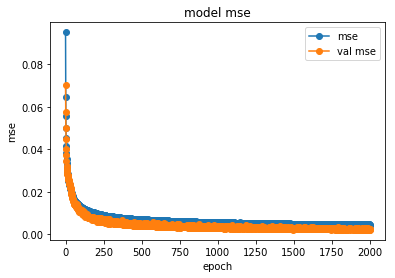

save the model


In [19]:
# -*- coding: utf-8 -*-
"""
Created on Tue Mar  7 15:43:18 2017

@author: hanar
"""
import time
import numpy as np
import os
from keras.utils import np_utils
from keras.models import Sequential
from keras.layers import Dense, Activation, Dropout
from keras.optimizers import SGD
from keras.optimizers import RMSprop
from keras.optimizers import Adagrad
from keras.optimizers import Adadelta
from keras.optimizers import Adam
from keras.optimizers import Adamax
from keras.optimizers import Nadam
from keras.callbacks import ModelCheckpoint
from keras.callbacks import EarlyStopping
from keras.callbacks import TensorBoard
from keras.models import load_model
#from keras.utils.visualize_util import plot
import matplotlib.pyplot as plt
import keras.callbacks
import keras.backend.tensorflow_backend as KTF
import tensorflow as tf

#Global variables for normalizing parameters
max_x = 1.0
min_x = 0.0
max_y = 1.0
min_y = 0.0


def deep_learning_tsunami(resdir, X_train_raw, y_train_raw, X_test_raw, y_test_raw,
                            _lr=0.02, _decay=0,
                            _validation_split=0.2, _batch_size=32,
                            _momentum=0.9, _nesterov=True,
                            num_layers=4, dropout=0.5,
                            node_num = 2500,
                            _epochs=2000):
    """
    Creating the inversion model of turbidity currents by deep learning
    """
    #Normalizing dataset
    X_train = get_normalized_data(X_train_raw, min_x, max_x)
    X_test = get_normalized_data(X_test_raw, min_x, max_x)
    y_train = get_normalized_data(y_train_raw, min_y, max_y)
    y_test = get_normalized_data(y_test_raw, min_y, max_y)
    
    #Generation of neural network model
    model = Sequential()
    model.add(Dense(node_num, input_dim=X_train.shape[1], activation='relu', kernel_initializer ='glorot_uniform'))#1st layer
    model.add(Dropout(dropout))
    for i in range(num_layers - 2):
        model.add(Dense(node_num, activation='relu', kernel_initializer ='glorot_uniform'))#2nd layer
        model.add(Dropout(dropout))
    model.add(Dense(y_train.shape[1], activation = 'relu', kernel_initializer ='glorot_uniform')) #last layer
    
    #Compiling the model
    model.compile(loss="mean_squared_error", 
              optimizer=SGD(lr=_lr, decay=_decay, momentum=_momentum, nesterov=_nesterov),
              #optimizer=Adadelta(),
              metrics=["mean_squared_error"])    
    
    #Perform learning
    t = time.time()
    check = ModelCheckpoint("model3.hdf5")
    #es_cb = EarlyStopping(monitor='val_loss', patience=5, verbose=0, mode='auto')
    #tb_cb = TensorBoard(log_dir=resdir, histogram_freq=2, write_graph=True, write_images=True)
    history = model.fit(X_train, y_train, epochs=_epochs, 
                    validation_split=_validation_split, batch_size=_batch_size,
                    callbacks=[check])
    
    #Evaluate learning result
    loss_and_metrics = model.evaluate(X_test,y_test)
    print("\nloss:{} mse:{}".format(loss_and_metrics[0],loss_and_metrics[1]))
    
    print("Elapsed time: {:.1f} sec.".format(time.time()-t))
    
    #Visualize learning result   
    #plot(model, to_file="model.png", show_shapes=True, show_layer_names=True)

    # model The state of change when letting you learnplot
    plot_history(history)
    
    return model, history

def apply_model(model, X, min_x, max_x, min_y, max_y):
    """
    Apply model
    Maximum and minimum values ​​of X and Y are required to normalize
    """
    X_norm =  (X - min_x) / (max_x - min_x)
    Y_norm = model.predict(X_norm)
    Y = Y_norm*(max_y - min_y)+min_y
    return Y

def plot_history(history):
    # Plot accuracy history
    plt.plot(history.history['mean_squared_error'],"o-",label="mse")
    plt.plot(history.history['val_mean_squared_error'],"o-",label="val mse")
    plt.title('model mse')
    plt.xlabel('epoch')
    plt.ylabel('mse')
    plt.legend(loc="upper right")
    plt.show()

#    # 損失の履歴をプロット
#    plt.plot(history.history['loss'],"o-",label="loss",)
#    plt.plot(history.history['val_loss'],"o-",label="val_loss")
#    plt.title('model loss')
#    plt.xlabel('epoch')
#    plt.ylabel('loss')
#    plt.legend(loc='upper right')
#    plt.show()

def test_model(model, x_test):
    #Test the results
    
    x_test_norm = get_normalized_data(x_test, min_x, max_x)
    test_result_norm = model.predict(x_test_norm)
    test_result = get_raw_data(test_result_norm, min_y, max_y)
    
    return test_result


def save_result(savedir, model, history, test_result):
    
    
    np.savetxt(savedir + 'test_result.txt',test_result,delimiter=',')
    np.savetxt(savedir+'loss.txt',history.history.get('loss'),delimiter=',')
    np.savetxt(savedir+'val_loss.txt',history.history.get('val_loss'),delimiter=',')
    
    #Serialize model and save
    print('save the model')
    model.save(savedir + 'model3.hdf5')

def load_data(datadir):
    """
    This function load training and test data sets, and returns variables
    """
    global min_x, max_x, min_y, max_y
    
    x_train = np.loadtxt(datadir + 'x_train.txt',delimiter=',')
    x_test = np.loadtxt(datadir + 'x_test.txt',delimiter=',')
    y_train = np.loadtxt(datadir + 'icond_train.txt',delimiter=',')
    y_test = np.loadtxt(datadir + 'icond_test.txt',delimiter=',')
    min_y = np.loadtxt(datadir + 'icond_min.txt',delimiter=',')
    max_y = np.loadtxt(datadir + 'icond_max.txt',delimiter=',')
    [min_x, max_x] = np.loadtxt(datadir + 'x_minmax.txt',delimiter=',')
    
    return x_train, y_train, x_test, y_test

def set_minmax_data(_min_x, _max_x, _min_y, _max_y):
    global min_x, max_x, min_y, max_y
    
    min_x, max_x, min_y, max_y = _min_x, _max_x, _min_y, _max_y
    return
    


def get_normalized_data(x, min_val, max_val):
    """
    Normalizing the training and test dataset
    """
    x_norm = (x - min_val) / (max_val - min_val)
    
    return x_norm

def get_raw_data(x_norm, min_val, max_val):
    """
    Get raw data from the normalized dataset
    """
    x = x_norm * (max_val - min_val) + min_val
    
    return x

if __name__ == "__main__":
    
    #Reading data  
    datadir = '/home/rimali2009/FITTNUSS-forward_training_DNN/data_g6_300grid_H_5000_20_11_roi1200/'
    resdir = '/home/rimali2009/FITTNUSS-forward_training_DNN/result_g6_300grid_H_5000_20_11_roi1200/'
    if not os.path.exists(resdir):
        os.mkdir(resdir)
    
    x_train, y_train, x_test, y_test = load_data(datadir)
    
     
    #Execution of learning
    testcases = [4500]
    for i in range(len(testcases)):
        resdir_case = resdir + '{}/'.format(testcases[i])        
        if not os.path.exists(resdir_case):
            os.mkdir(resdir_case)
        x_train_sub = x_train[0:testcases[i],:]
        y_train_sub = y_train[0:testcases[i],:]
        model, history = deep_learning_tsunami(resdir_case, x_train_sub, y_train_sub, x_test, y_test, num_layers=5)
        #Verify and save results
        result = test_model(model, x_test)
        save_result(resdir_case,model,history,result)




(500, 9)


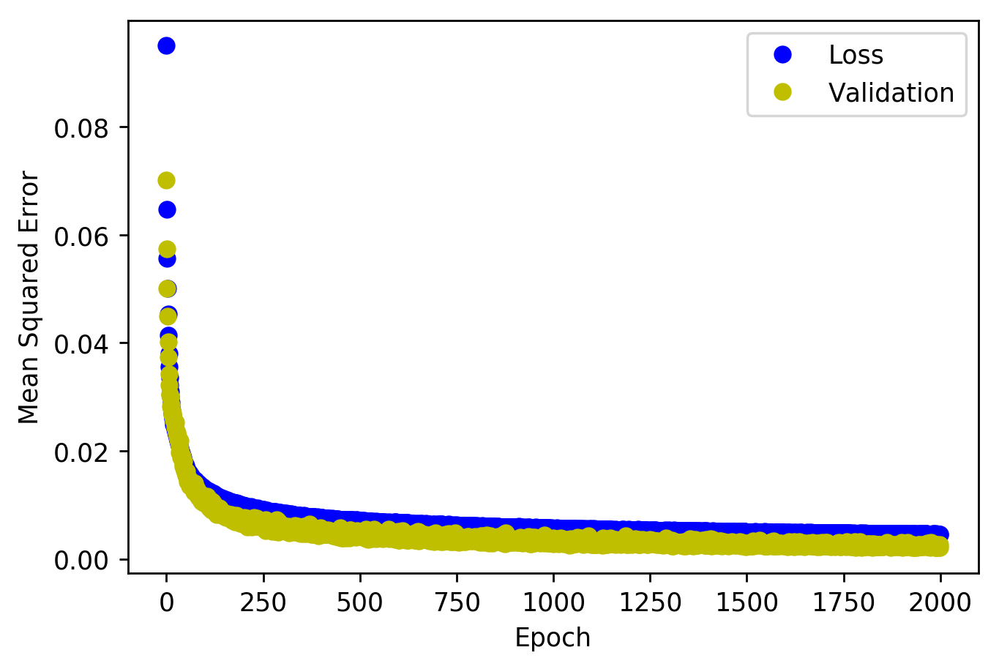

<Figure size 432x288 with 0 Axes>

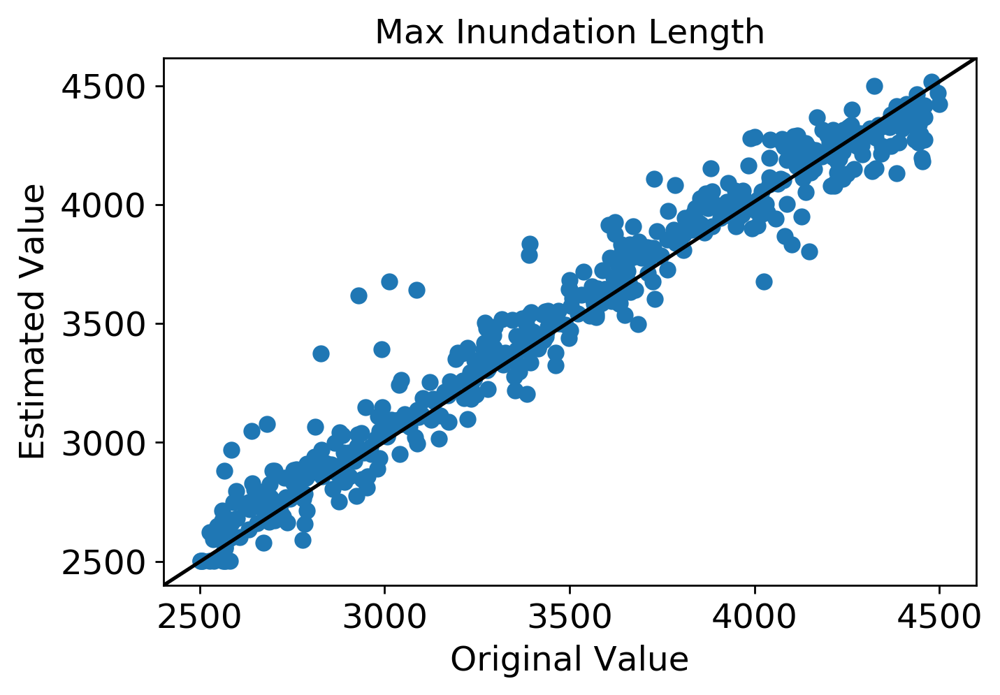

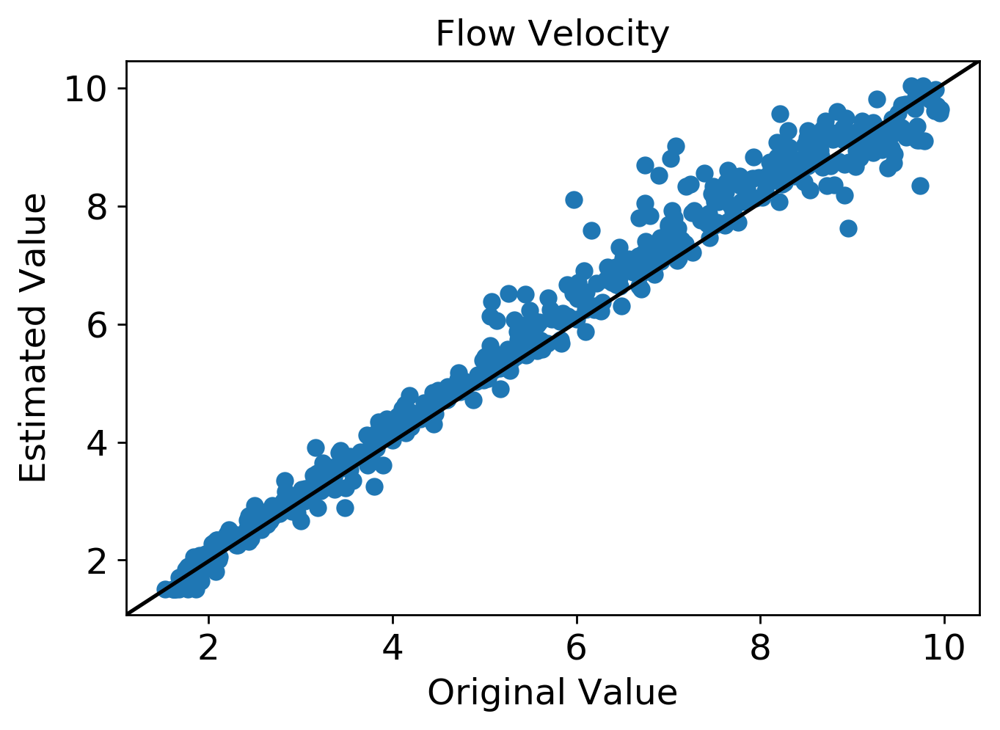

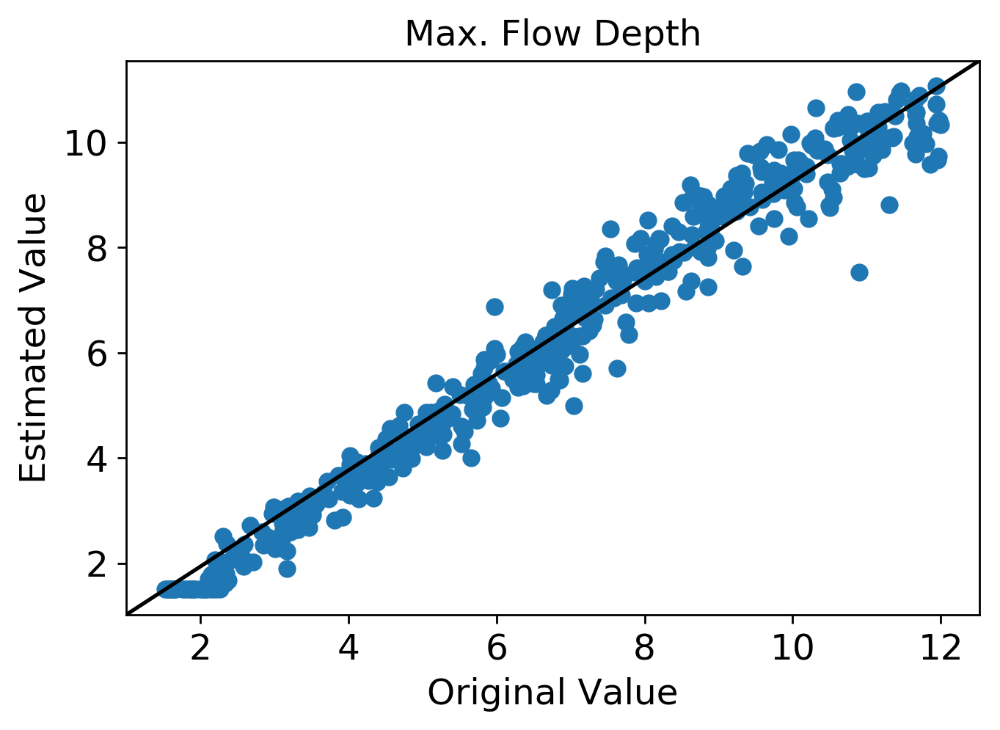

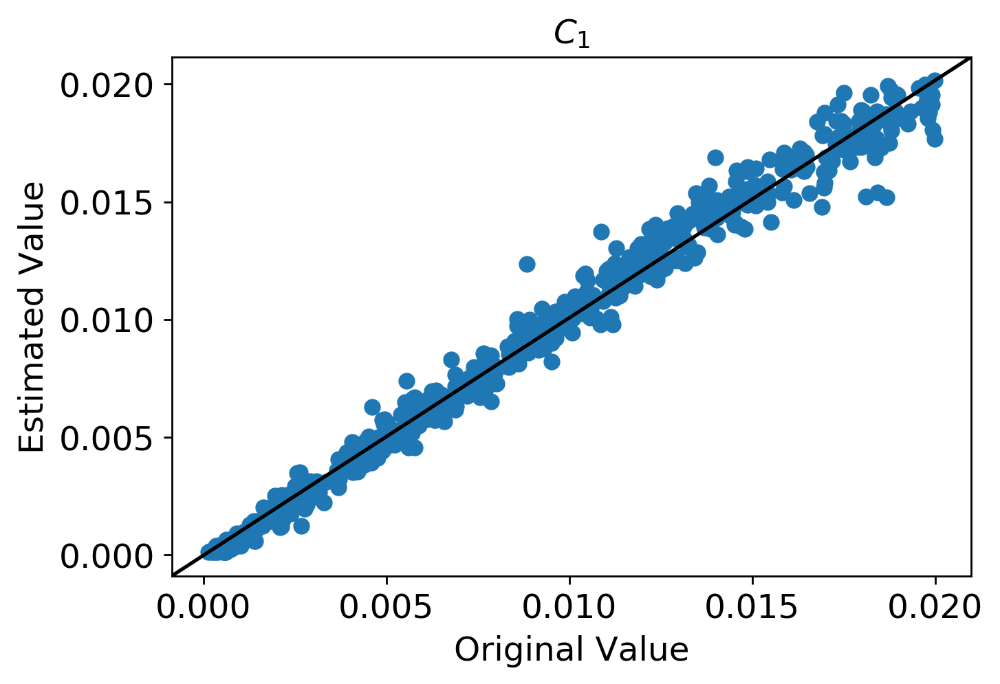

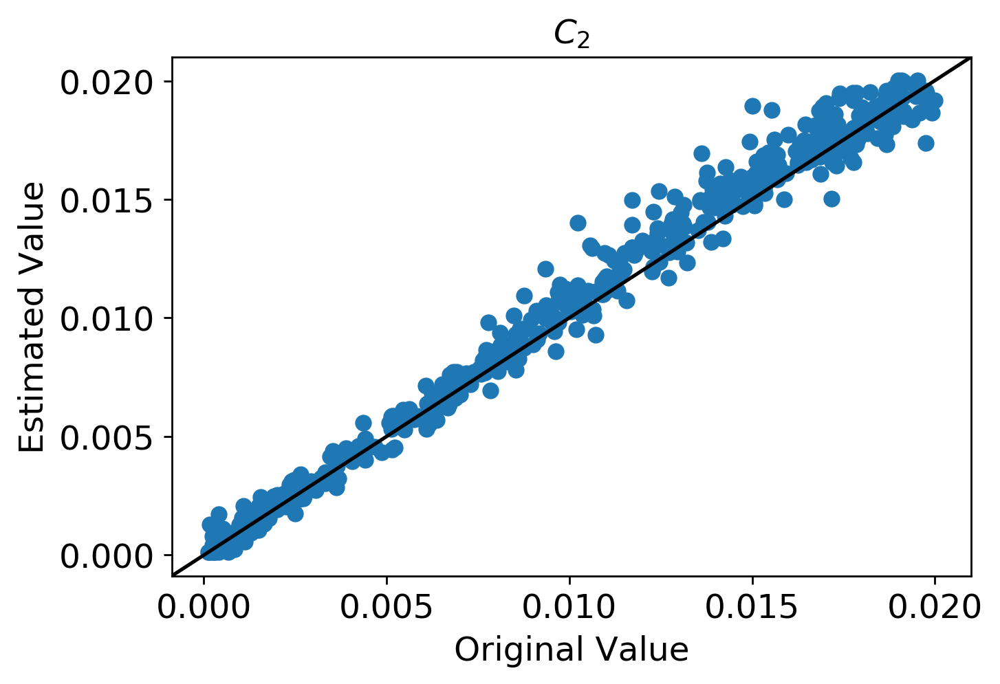

...

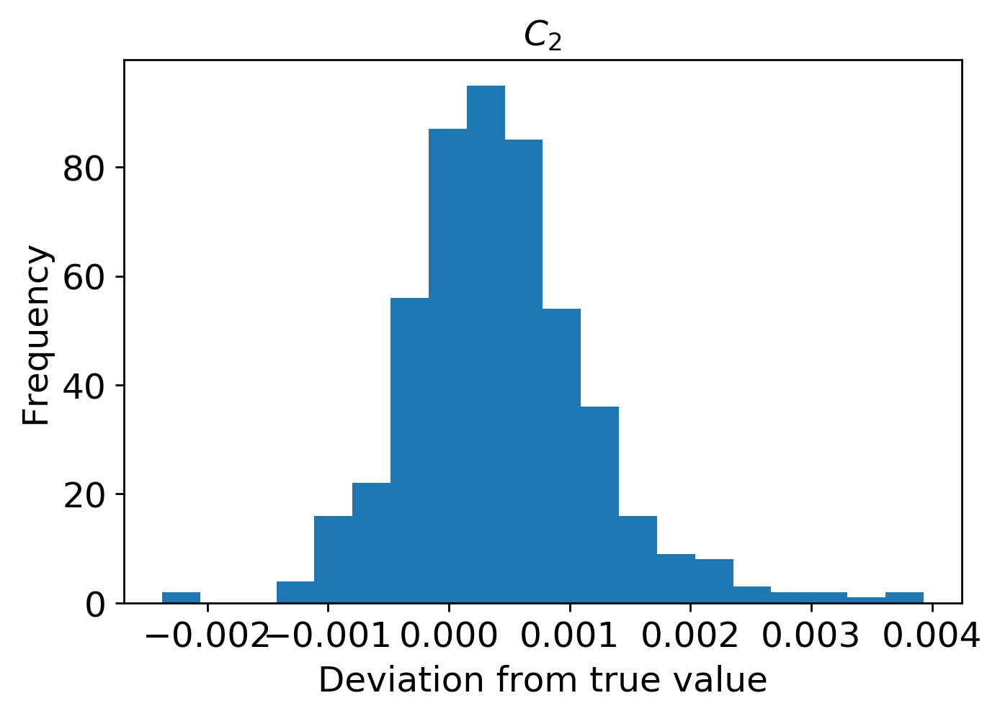

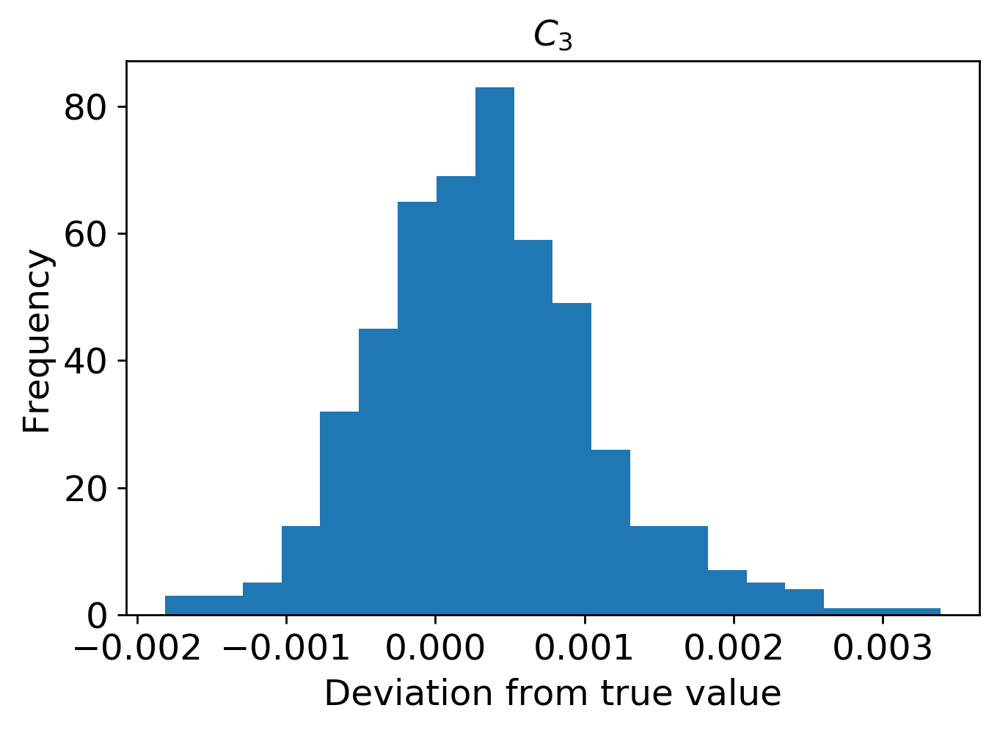

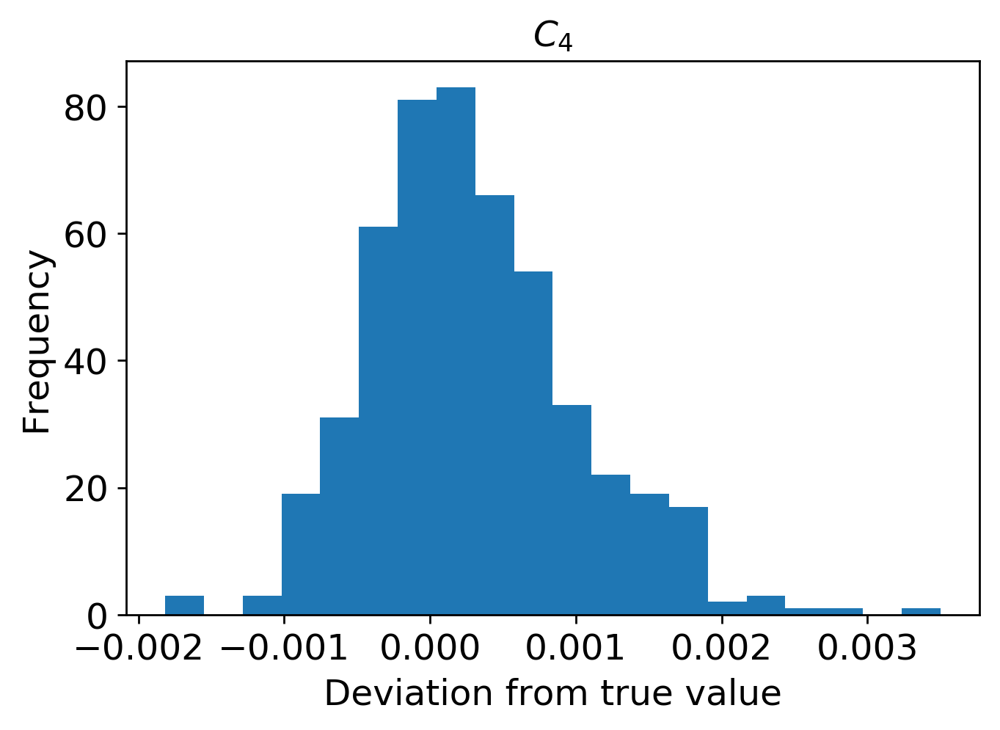

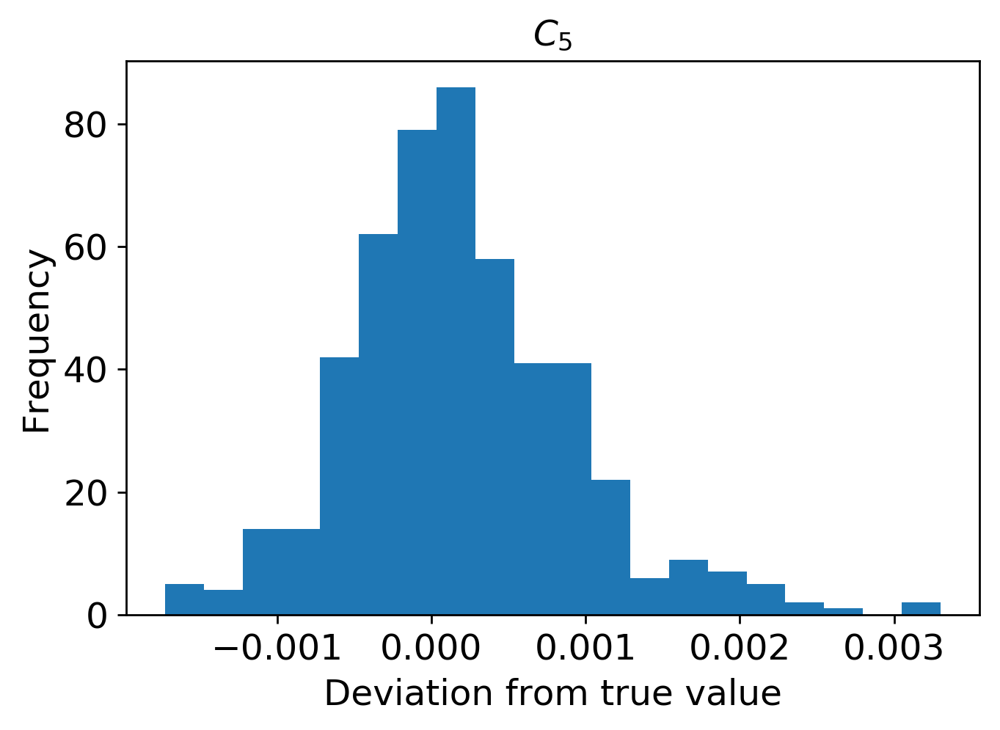

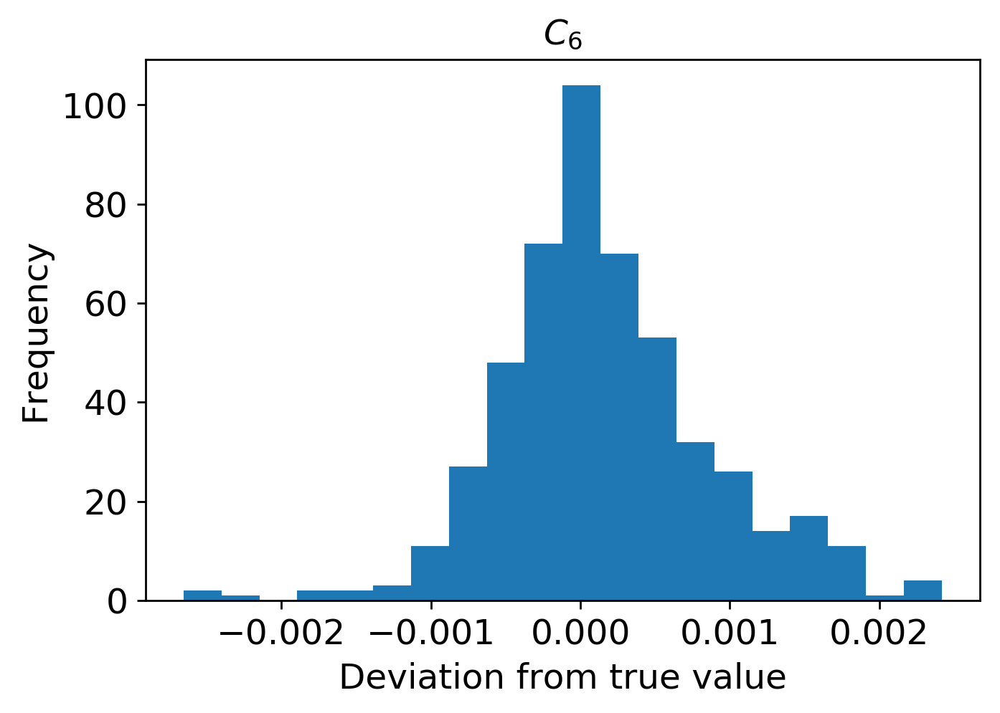

In [20]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

datadir = '/home/rimali2009/FITTNUSS-forward_training_DNN/data_g6_300grid_H_5000_20_11_roi1200/'
resdir = '/home/rimali2009/FITTNUSS-forward_training_DNN/result_g6_300grid_H_5000_20_11_roi1200/4500/'

test_result = np.loadtxt(resdir + 'test_result.txt',delimiter=',')
icond = np.loadtxt(datadir + 'icond_test.txt',delimiter=',')
print(icond.shape)
loss = np.loadtxt(resdir+'loss.txt',delimiter=',')
epoch = range(0,2000)
vloss = np.loadtxt(resdir+'val_loss.txt',delimiter=',')
resi = test_result - icond

fig = plt.figure(num=None,dpi=250, facecolor='w', edgecolor='k')
plt.plot(epoch, loss, 'bo',label='Loss')
plt.plot(epoch, vloss, 'yo',label='Validation')
plt.xlabel('Epoch')
plt.ylabel('Mean Squared Error')
plt.legend(loc="upper right")
plt.savefig(resdir+ 'mse.eps')
plt.show()

fig2 = plt.figure()
hfont = {'fontname':'Century Gothic'}
textcol = 'k'
titlelabel = ['Max Inundation Length','Flow Velocity', 'Max. Flow Depth', '$C_1$', '$C_2$', '$C_3$', '$C_4$','$C_5$','$C_6$']


    
for i in range(len(titlelabel)):
    plt.figure(num=None,dpi=250, facecolor='w', edgecolor='k')
    plt.plot(icond[:,i],test_result[:,i],"o")
    x=icond[:,i]
    y=test_result[:,i]
    y_lim = plt.ylim()
    x_lim = plt.xlim()
    plt.plot(x_lim, y_lim, 'k-', color = 'k')
    plt.ylim(y_lim)
    plt.xlim(x_lim)
    plt.xlabel('Original Value',color=textcol,size=14,**hfont)
    plt.ylabel('Estimated Value',color=textcol,size=14,**hfont)
    plt.title(titlelabel[i],color=textcol,size=14,**hfont)
    plt.tick_params(labelsize=14,colors=textcol)
    plt.savefig(resdir+titlelabel[i] + '.eps')
    #plt.show()

for i in range(len(titlelabel)):
    plt.figure(num=None,dpi=250, facecolor='w', edgecolor='k')
    plt.hist(resi[:,i],bins=20)
    plt.title(titlelabel[i],color=textcol,size=14,**hfont)
    plt.xlabel('Deviation from true value',color=textcol,size=14,**hfont)
    plt.ylabel('Frequency',color=textcol,size=14,**hfont)
    plt.tick_params(labelsize=14,colors=textcol)
    plt.savefig(resdir+titlelabel[i] + 'hist' + '.eps')
    plt.show()

       distance        g1        g2        g3        g4        g5        g6
0      0.000000  0.036771  0.167260  0.114845  0.008449  0.002190  0.005161
1    103.794102  0.000000  0.075200  0.153283  0.013753  0.001885  0.000442
2    171.620654  0.002130  0.051171  0.084309  0.006218  0.001867  0.002843
3    397.112167  0.003115  0.016359  0.078858  0.011466  0.000597  0.000054
4    595.912969  0.000732  0.016896  0.028720  0.002661  0.000914  0.000000
5    707.625749  0.000143  0.002228  0.005502  0.000900  0.000187  0.000104
6    796.435078  0.000236  0.004337  0.021204  0.003169  0.000309  0.000080
7    895.065500  0.001688  0.016059  0.081413  0.020284  0.006824  0.004628
8    988.394177  0.004567  0.008166  0.074658  0.016913  0.002424  0.001580
9   1081.819325  0.001567  0.016305  0.060234  0.011086  0.004165  0.001994
10  1195.756993  0.001022  0.002370  0.017565  0.004194  0.000567  0.000142
11  1290.372534  0.000000  0.004121  0.057974  0.014565  0.000426  0.000213
12  1400.896

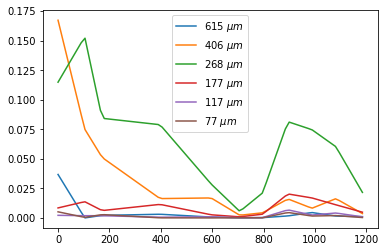

In [4]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model
from scipy import stats
from scipy.interpolate import interp1d 
import pandas as pd
from pykrige import OrdinaryKriging as OK
import ipdb


datadir = '/home/rimali2009/FITTNUSS-forward_training_DNN/data_g6_300grid_H_5000_20_11_roi1200/'
resdir = '/home/rimali2009/FITTNUSS-forward_training_DNN/result_g6_300grid_H_5000_20_11_roi1200/4500/'
#Initial setting
if not "model" in locals(): 
    model = load_model(resdir+'model3.hdf5')
#gclass = 3
#gclass_label = ["500 $\mu$m","125 $\mu$m","63 $\mu$m"]
gclass = 6
gclass_label = ["615 ${\mu}m$","406 ${\mu}m$","268 ${\mu}m$","177 ${\mu}m$", "117 ${\mu}m$","77 ${\mu}m$"]
topodx = 15.0
coord_num = int(model.layers[0].input_shape[1]/gclass)

#Acquires a value for normalizing input data to [0, 1]
min_x, max_x = np.loadtxt(datadir + 'x_minmax.txt',delimiter=',')
y_min = np.loadtxt(datadir + 'icond_min.txt',delimiter=',')
y_max = np.loadtxt(datadir + 'icond_max.txt',delimiter=',')

#Read outcrop data
#dist_max = 22000. #Distance of distal end of learning data
outcrop = pd.read_csv('../FITTNUSS-forward_training_DNN/sendai_increased_class_edit.csv')
#outcrop = pd.read_csv('../DeepLearningTurbidite_Fukuda/GA_naruse_v2.csv')
#outcrop = outcrop.append(pd.DataFrame([[0,'Loc0',0,0,0],[dist_max,'LocE',0,0,0]], columns=outcrop.columns))
outcrop = outcrop.sort_values('distance')
outcrop['distance'] = outcrop['distance'] - 0
#d = pd.DataFrame(np.zeros((1, 7)),columns=['distance', 'g1','g2','g3','g4','g5','g6'])
#print(d)
#v=np.concatenate((outcrop, d))
#print(v)
#outcrop=pd.DataFrame(v,columns=['distance', 'g1','g2','g3','g4','g5','g6'])
#outcrop['distance'].iloc[-1]=4000
#outcrop = outcrop.append(pd.DataFrame([[0,'Loc0',0,0,0,0]], columns=outcrop.columns))
print(outcrop)

#Preparation under interpolation
thick_interp = np.zeros([1,coord_num*gclass])#補間されたサンプル厚さデータ
outcrop_x_id = np.round(outcrop['distance']/topodx).astype(np.int32) #逆解析システムでのサンプリング地点のindex番号
x = np.arange(0,coord_num*topodx,topodx)

#Complement data
for j in range(gclass):
    f = interp1d(outcrop['distance'],outcrop.iloc[:,j+1], kind="linear",bounds_error=False,fill_value='extrapolate')
    #f = interp1d(outcrop['distance'],outcrop.iloc[:,j+2], kind="linear",bounds_error=False,fill_value='extrapolate') 
    #Interpolation function of jth granularity level
    thick_interp[0,coord_num*j:coord_num*(j+1)] = f(x) #Supplemented data

#ipdb.set_trace()
#Kriging Interpolation by
#vparams = np.array([[0.035, 10000., 0.001],[0.006, 10000., 0.002],[0.005, 10000., 0.002],[0.035, 10000., 0.001]])
#for j in range(gclass):
    #okip = OK(outcrop['distance'],np.zeros(outcrop['distance'].shape),outcrop.iloc[:,j+1],variogram_model='gaussian',)
    #okip.display_variogram_model()
    #ipdata, ipstd = okip.execute('grid',x,np.array([0.]))
    #ipdata = np.squeeze(ipdata)
    #thick_interp[0,coord_num*j:coord_num*(j+1)] = ipdata #Assign complemented d

#Normalize data
thick_interp[thick_interp < 0] = 0
thick_interp_norm =  (thick_interp - min_x) / (max_x - min_x)

#Perform inverse analysis
test_result_outcrop = model.predict(thick_interp_norm)
test_result_outcrop = test_result_outcrop * (y_max - y_min) + y_min
print(test_result_outcrop)
#add=np.array(3000)
#test_result_outcrop_add=np.concatenate((add,test_result_outcrop), axis=None)
#Output results
#print(test_result_outcrop_add)
np.savetxt('outcrop_result_g6_g300_H_5000_20_11_roi1200.txt',test_result_outcrop, delimiter=',')
for i in range(len(gclass_label)):
    plt.plot(x,thick_interp[0,coord_num * i:coord_num * (i+1)],label=gclass_label[i])
plt.legend()
plt.show()



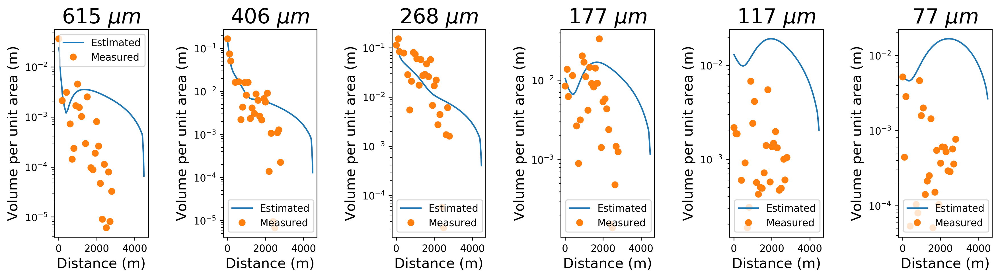

In [22]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import Forward_model_modified_FITTNUSS_5000_g6_300grid_19_11_case2 as fmodel
import time
import ipdb
%matplotlib inline

#Basic setting

#dist_max = 3000.
gclass = 6
topodx=15.0
gclass_name = ['615microm','406microm','268microm','177microm','117microm','77microm']
#gclass_name = ['500micron', '125micron', '63micron']
gname_tex = ["615 ${\mu}m$","406 ${\mu}m$","268 ${\mu}m$","177 ${\mu}m$", "117 ${\mu}m$","77 ${\mu}m$"]
#gname_tex = ['500 $\mu$m','125 $\mu$m','63 $\mu$m']
#calcdir = 'home/rimali2009/FITTNUSS-forward_training_DNN/'
#calcdir = '/home/naruse/Documents/Documents/MATLAB/TCtrainData_forML/TCModel_for_MLTEST/test_output_otadai07/'

#Load estimate
#H1 = np.loadtxt(calcdir + 'H1.txt',delimiter=',')
#H2 = np.loadtxt(calcdir + 'H2.txt',delimiter=',')
#H3 = np.loadtxt(calcdir + 'H3.txt',delimiter=',')
#H4 = np.loadtxt(calcdir + 'H4.txt',delimiter=',')
#Ht = np.loadtxt(calcdir + 'Ht.txt',delimiter=',')
#U = np.loadtxt(calcdir + 'U.txt',delimiter=',')
#xi = np.loadtxt(calcdir + 'xi.txt',delimiter=',')
#x = np.loadtxt(calcdir + 'x.txt',delimiter=',')
#x_bed = np.loadtxt(calcdir + 'x_init.txt',delimiter=',')
#eta_init = np.loadtxt(calcdir + 'eta_init.txt',delimiter=',')
#Ct = np.loadtxt(calcdir + 'Ct.txt',delimiter=',')
#time = np.loadtxt(calcdir + 'time.txt',delimiter=',')
estimated_icond=np.loadtxt('outcrop_result_g6_g300_H_5000_20_11_roi1200.txt', delimiter=',')
start = time.time()
fmodel.read_setfile("config_g6_300grid_19_11_case2.ini")
(x,C,x_dep,deposit) = fmodel.forward(estimated_icond)
np.savetxt('eta_estimated_thickness_5K_g6_TC4_Rwcnst_H_5000_20_11_roi1200.csv', deposit, delimiter=',')
np.savetxt('eta_estimated_Distance_5K_g6_TC4_Rwcnst_H_5000_20_11_roi1200.csv', x_dep,delimiter=',')
estimated_dep_thickness_5000=np.transpose(np.loadtxt('/home/rimali2009/FITTNUSS-forward_training_DNN/'+'eta_estimated_thickness_5K_g6_TC4_Rwcnst_H_5000_20_11_roi1200.csv', delimiter=','))
estimated_dep_thickness_5000=pd.DataFrame(estimated_dep_thickness_5000,columns=['615microm','406microm','268microm','177microm','117microm','77microm'])
estimated_dep_distance_5000=np.transpose(np.loadtxt('/home/rimali2009/FITTNUSS-forward_training_DNN/'+'eta_estimated_Distance_5K_g6_TC4_Rwcnst_H_5000_20_11_roi1200.csv', delimiter=','))
estimated_dep_distance_5000=pd.DataFrame(estimated_dep_distance_5000,columns=['distance'])
estimated_dep_5000=pd.concat([estimated_dep_distance_5000,estimated_dep_thickness_5000],axis=1)
np.savetxt('estimated_dep_5K_g6_TC4_Rwcnst_H_5000_20_11_roi1200.csv',estimated_dep_5000,delimiter=',')
#data_estim=pd.DataFrame(estimated_dep_5000,columns=['distance','1.5phi','2.5phi','3.5phi','4.5phi'])

#Formatting the loaded data
#estimated_dep_df = pd.DataFrame(estimated_dep,columns=['distance','1.5phi','2.5phi','3.5phi','4.5phi'])
#estimated_dep = pd.DataFrame(np.array([x_bed - dist_offset,H1[-1,:],H2[-1,:],H3[-1,:]]).T,columns=['distance','500micron','125micron','63micron'])
estimated_dep_5000= estimated_dep_5000.query('distance > 0')
#estimated_dep_5000 = estimated_dep_5000.query('distance < {}'.format(dist_max))

#Read original data
outcrop = pd.read_csv('../FITTNUSS-forward_training_DNN/sendai_increased_class.csv')
outcrop= pd.DataFrame(outcrop,columns=['distance','615microm','406microm','268microm','177microm','117microm','77microm'])
#outcrop = pd.read_csv('../DeepLearningTurbidite_Fukuda/GA_naruse_v2.csv')
#outcrop = outcrop.append(pd.DataFrame([[0,'Loc0',0,0,0],[dist_max,'LocE',0,0,0]], columns=outcrop.columns))
#outcrop = outcrop.sort_values('distance')
#outcrop['distance'] = outcrop['distance'] - 1000

#Plot
plt.figure(num=None, figsize=(17, 4), dpi=250, facecolor='w', edgecolor='g')
hfont = {'fontname':'Sans'}
plt.subplots_adjust(bottom=0.15, wspace=0.8)

for i in range(gclass):
    plt.subplot(1,gclass,i+1)
    plt.plot(estimated_dep_5000['distance'],estimated_dep_5000[gclass_name[i]],'-', label='Estimated')
    plt.plot(outcrop['distance'], outcrop[gclass_name[i]],'o', label='Measured')
    plt.yscale('log')
    plt.title(gname_tex[i], size=21,**hfont)
    plt.xlabel('Distance (m)', size = 14, **hfont)
    plt.ylabel('Volume per unit area (m)', size = 14, **hfont)
    plt.legend(fontsize=10)
    plt.savefig("thickness_distance_curve_5000_g6_300grid_H_5000_20_11_roi1200.png")
    plt.savefig("thickness_distance_curve_5000_g6_300grid_H_5000_20_11_roi1200.eps")
plt.show()



Using TensorFlow backend.


       distance        g1        g2        g3        g4        g5        g6
0      0.000000  0.036771  0.167260  0.114845  0.008449  0.002190  0.005161
1    103.794102  0.000000  0.075200  0.153283  0.013753  0.001885  0.000442
2    171.620654  0.002130  0.051171  0.084309  0.006218  0.001867  0.002843
3    397.112167  0.003115  0.016359  0.078858  0.011466  0.000597  0.000054
4    595.912969  0.000732  0.016896  0.028720  0.002661  0.000914  0.000000
5    707.625749  0.000143  0.002228  0.005502  0.000900  0.000187  0.000104
6    796.435078  0.000236  0.004337  0.021204  0.003169  0.000309  0.000080
7    895.065500  0.001688  0.016059  0.081413  0.020284  0.006824  0.004628
8    988.394177  0.004567  0.008166  0.074658  0.016913  0.002424  0.001580
9   1081.819325  0.001567  0.016305  0.060234  0.011086  0.004165  0.001994
10  1195.756993  0.001022  0.002370  0.017565  0.004194  0.000567  0.000142
11  1290.372534  0.000000  0.004121  0.057974  0.014565  0.000426  0.000213
12  1400.896

(1, 9)
[[4.62847389e+03 4.94184295e+00 3.45893251e+00 4.27900244e-03
  2.25926011e-02 2.13350703e-02 2.32382937e-03 2.48720976e-03
  1.20371615e-03]]
       distance        g1        g2        g3        g4        g5        g6
0      0.000000  0.036771  0.167260  0.114845  0.008449  0.002190  0.005161
1    103.794102  0.000000  0.075200  0.153283  0.013753  0.001885  0.000442
2    171.620654  0.002130  0.051171  0.084309  0.006218  0.001867  0.002843
3    397.112167  0.003115  0.016359  0.078858  0.011466  0.000597  0.000054
4    595.912969  0.000732  0.016896  0.028720  0.002661  0.000914  0.000000
5    707.625749  0.000143  0.002228  0.005502  0.000900  0.000187  0.000104
6    796.435078  0.000236  0.004337  0.021204  0.003169  0.000309  0.000080
7    895.065500  0.001688  0.016059  0.081413  0.020284  0.006824  0.004628
8   1081.819325  0.001567  0.016305  0.060234  0.011086  0.004165  0.001994
9   1195.756993  0.001022  0.002370  0.017565  0.004194  0.000567  0.000142
10  1290.37253

/home/rimali2009/anaconda3/envs/test3/lib/python3.6/site-packages/matplotlib/font_manager.py:1241: UserWarning: findfont: Font family ['Century Gothic'] not found. Falling back to DejaVu Sans.
  (prop.get_family(), self.defaultFamily[fontext]))


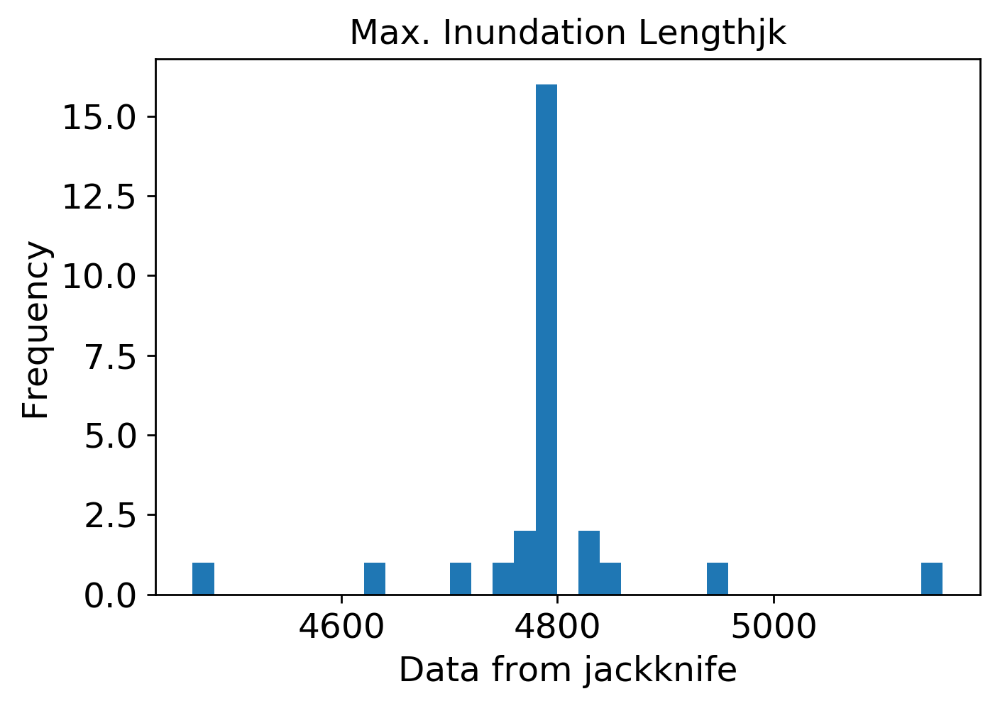

mean: 4.6572414271409075
jk_e: 0.06758020124302436


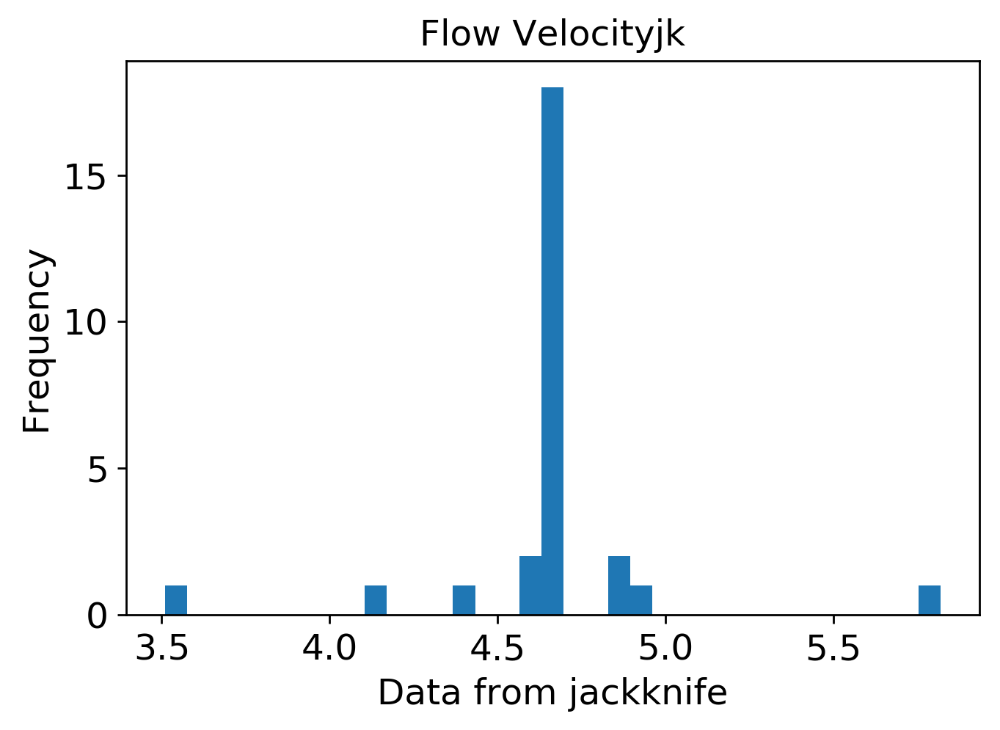

mean: 4.151724260542961
jk_e: 0.07398077210156725


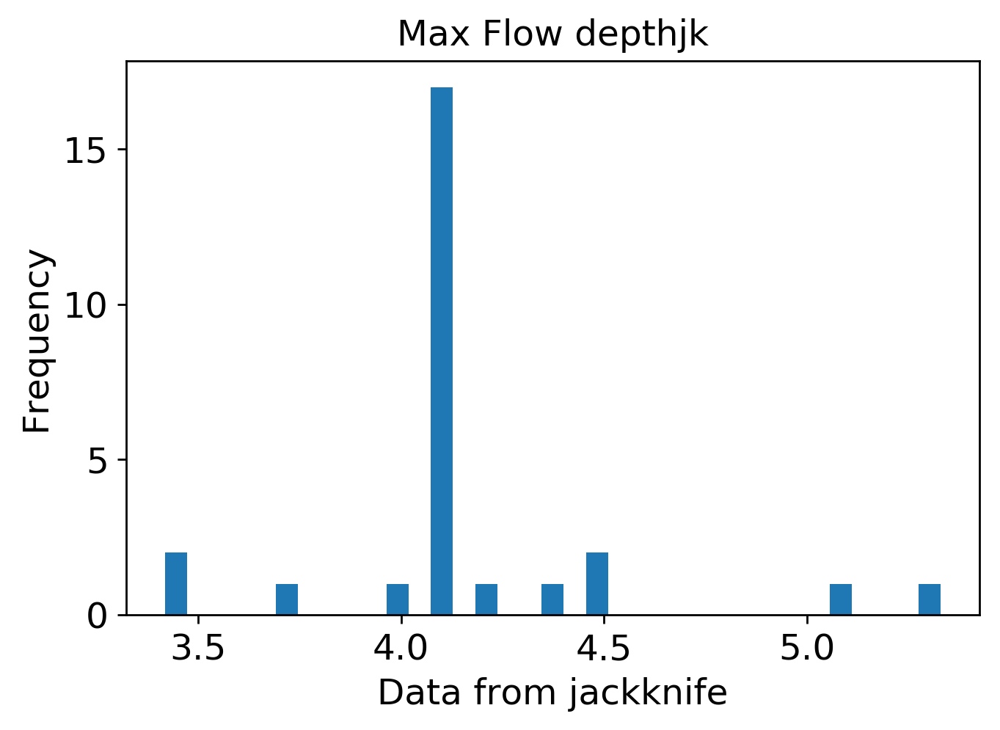

mean: 0.0035614237008535737
jk_e: 0.0001449094306948317


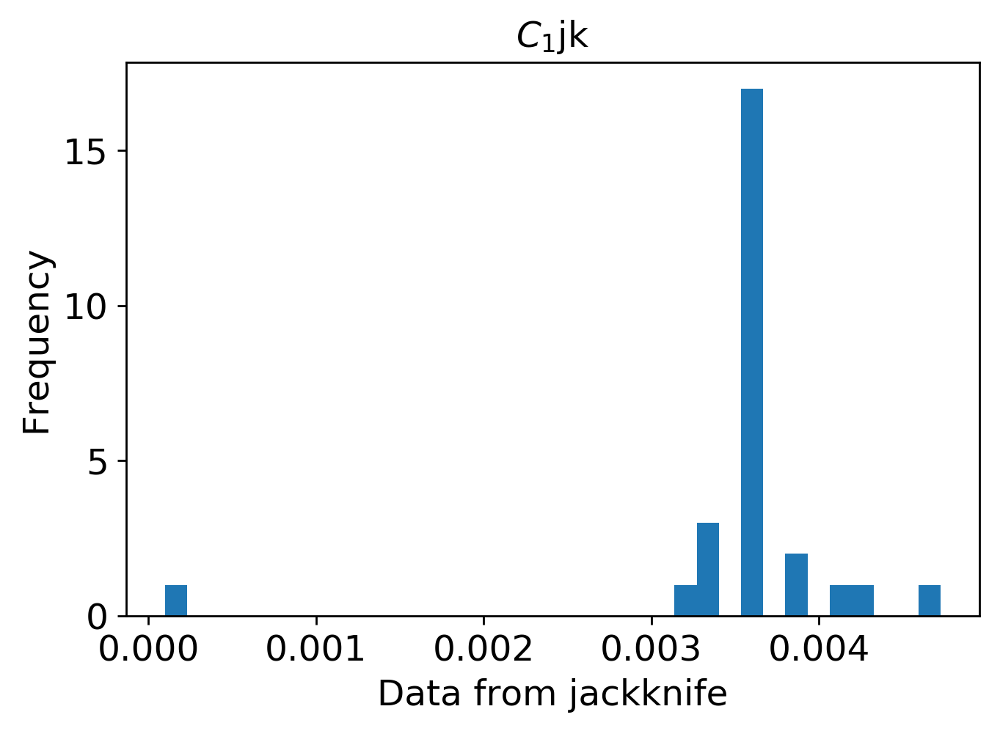

mean: 0.02069613770437892
jk_e: 0.0002854557143455263


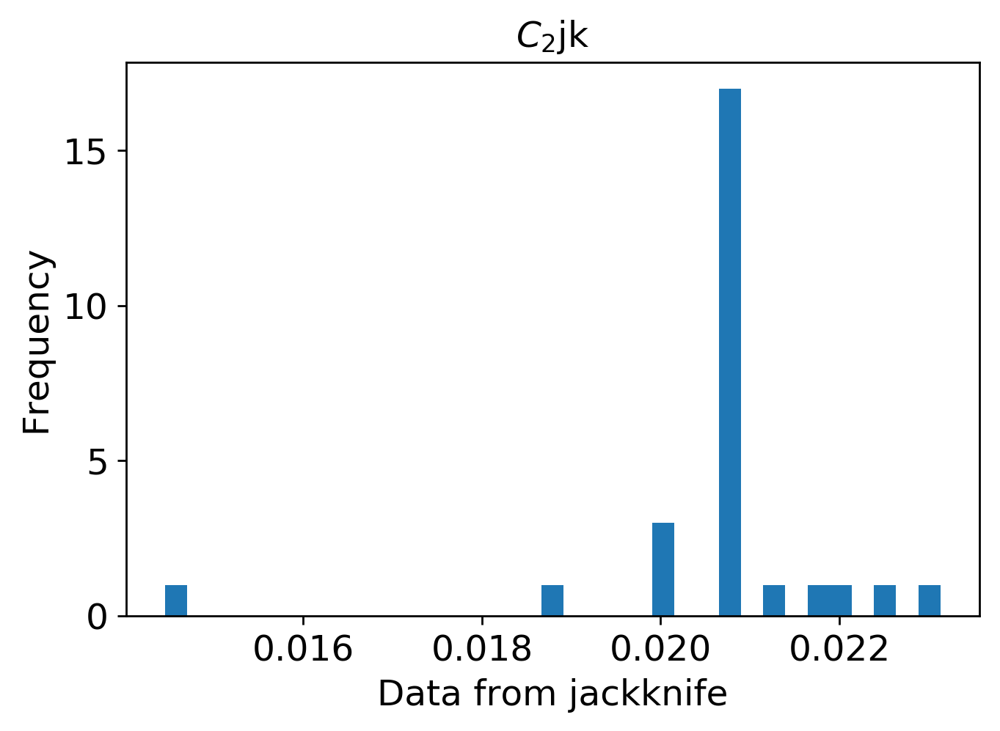

mean: 0.01915161107131465
jk_e: 0.0003044358718394657


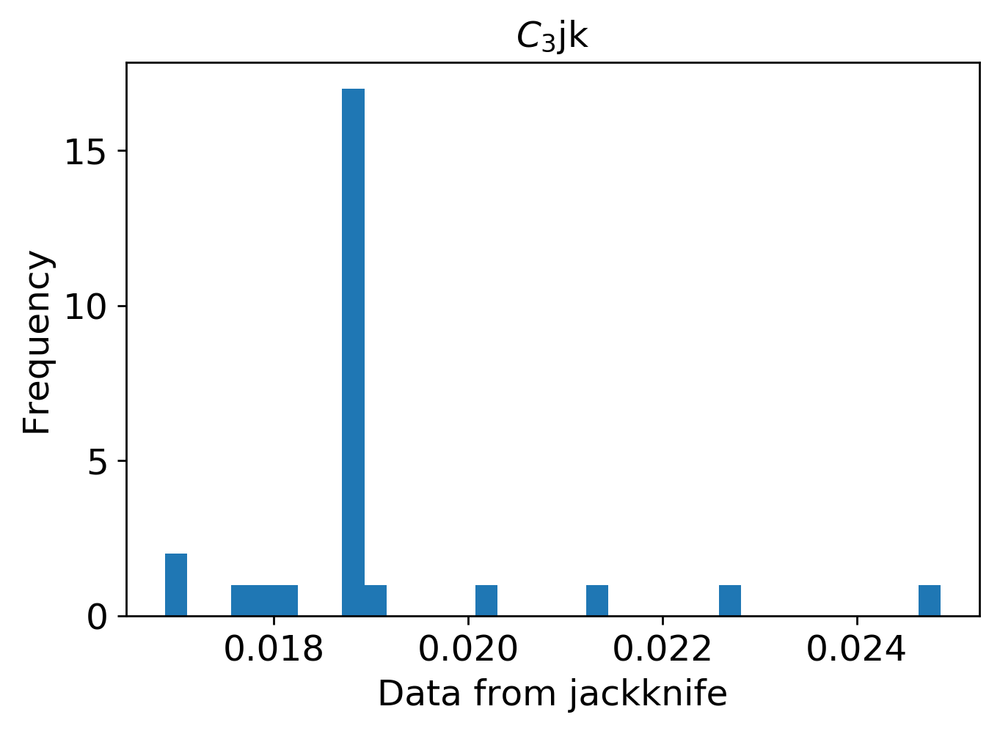

mean: 0.001675817721673951
jk_e: 7.398988657467815e-05


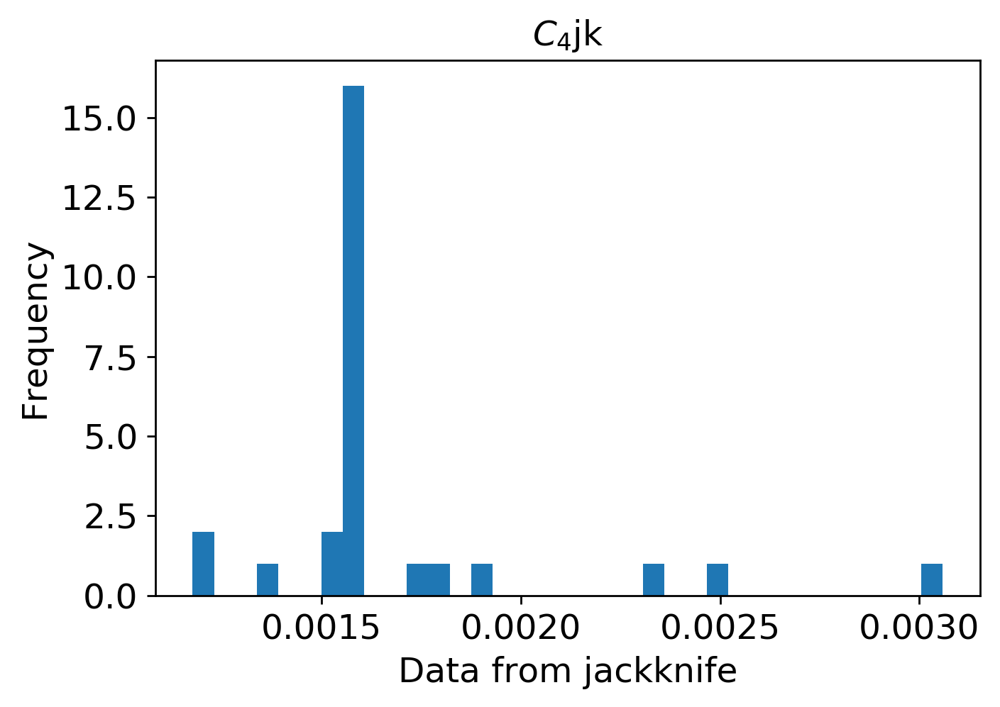

mean: 0.0019240647512069014
jk_e: 6.622208747274247e-05


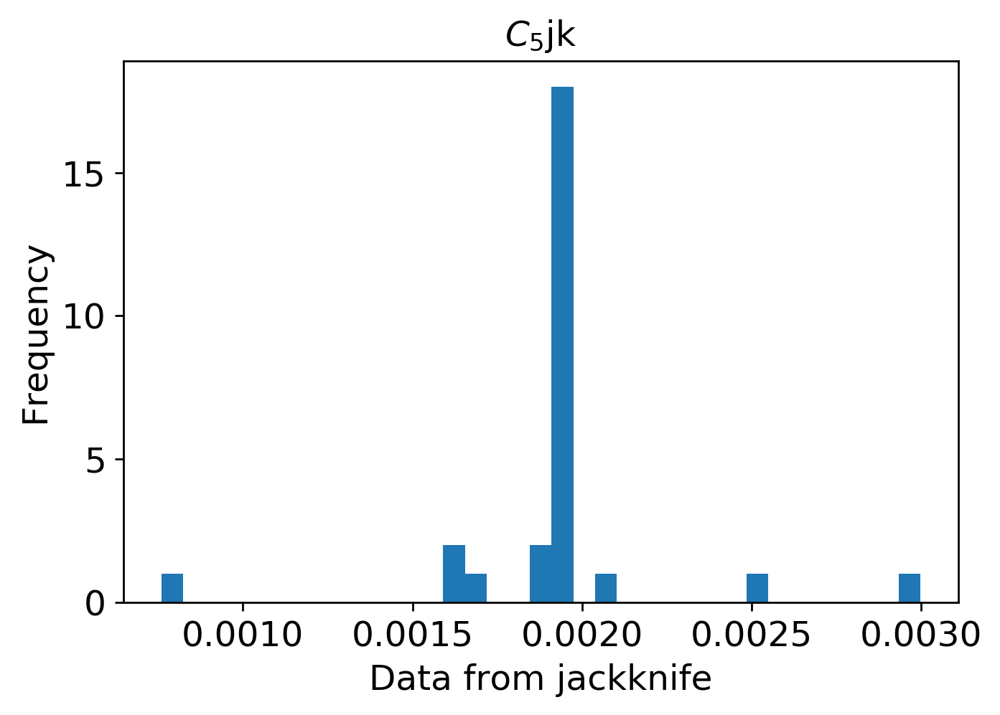

mean: 0.0008152386386428621
jk_e: 5.10408847120289e-05


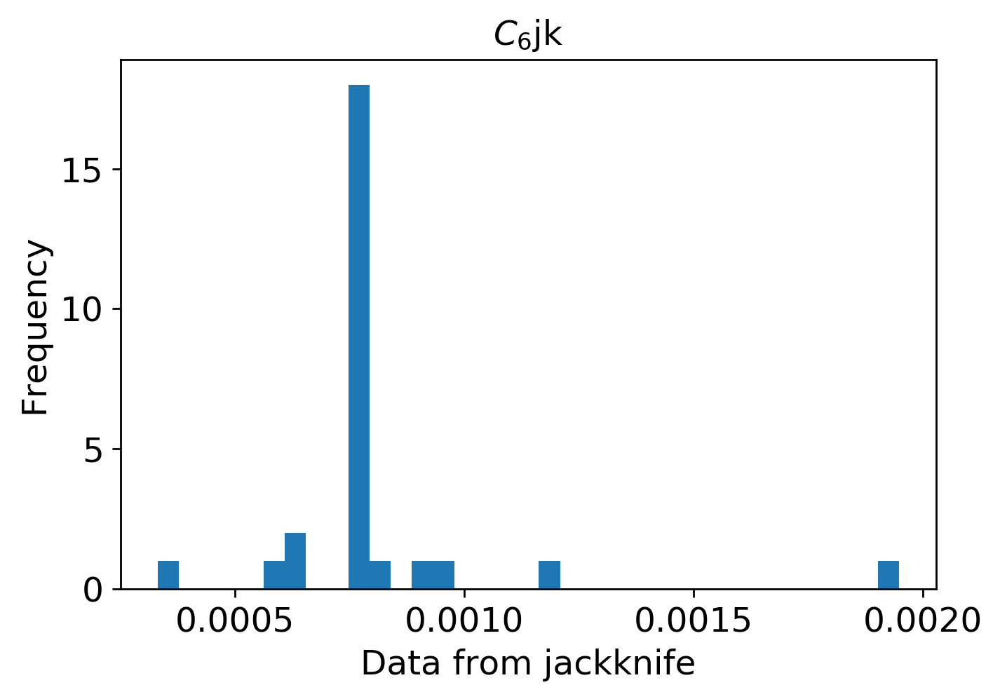

In [1]:
# Jackknife Method
import csv
import numpy as np
import pandas as pd
import math
from keras.models import load_model
from scipy.interpolate import interp1d
import matplotlib.pyplot as plt
%matplotlib inline

datadir = '/home/rimali2009/FITTNUSS-forward_training_DNN/data_g6_300grid_H_5000_20_11_roi1200/'
resdir = '/home/rimali2009/FITTNUSS-forward_training_DNN/result_g6_300grid_H_5000_20_11_roi1200/4500/'
# Initial setting
if not "model" in locals():
    model = load_model(resdir+'model3.hdf5')
gclass = 6
gclass_label = ["615 ${\mu}m$", "406 ${\mu}m$", "268 ${\mu}m$",
                "177 ${\mu}m$", "117 ${\mu}m$", "77 ${\mu}m$"]
topodx = 15.0
coord_num = int(model.layers[0].input_shape[1]/gclass)
min_x, max_x = np.loadtxt(datadir + 'x_minmax.txt', delimiter=',')
y_min = np.loadtxt(datadir + 'icond_min.txt', delimiter=',')
y_max = np.loadtxt(datadir + 'icond_max.txt', delimiter=',')


a = pd.read_csv(
    '../FITTNUSS-forward_training_DNN/sendai_increased_class_edit.csv', delimiter=',')
print(a)
y = pd.DataFrame()
output = []

with open('output_final_20_11_roi1200.csv', 'w') as outfile:

    # x=[]
    for index in range(len(a)):
        df = y.append(pd.read_csv(
            '../FITTNUSS-forward_training_DNN/sendai_increased_class_edit.csv', skiprows=[index+1]))
        print(df)
        df = df.sort_values('distance')
        thick_interp = np.zeros([1, coord_num*gclass])
        x = np.arange(0, coord_num*topodx, topodx)
        for j in range(gclass):
            # Interpolation function of jth granularity level
            f = interp1d(df['distance'], df.iloc[:, j+1],
                         kind="linear", bounds_error=False,fill_value='extrapolate')
            thick_interp[0, coord_num*j:coord_num*(j+1)] = f(x)
        thick_interp[thick_interp < 0] = 0
        thick_interp_norm = (thick_interp - min_x) / (max_x - min_x)
        test_result_outcrop = model.predict(thick_interp_norm)
        test_result_outcrop = test_result_outcrop * (y_max - y_min) + y_min
        print(test_result_outcrop.shape)
        print(test_result_outcrop)
    # output.append(test_result_outcrop)
        np.savetxt(outfile,test_result_outcrop, delimiter=',')
        # outfile.write('# New iteration\n')
hfont = {'fontname': 'Century Gothic'}
textcol = 'k'
resi = np.loadtxt('output_final_20_11_roi1200.csv', delimiter=',')
titlelabel = ['Max. Inundation Lengthjk','Flow Velocityjk', 'Max Flow depthjk',
              '$C_1$jk', '$C_2$jk', '$C_3$jk', '$C_4$jk', '$C_5$jk', '$C_6$jk']
jk_er=[]
with open('jk_e_roi1200.txt','wb') as ftext:
    for i in range(len(titlelabel)):
        plt.figure(num=None, dpi=250, facecolor='w', edgecolor='k')
        plt.hist(resi[:, i], bins=35)
        mean = sum(resi[:,i]) / len(resi[:,i])
        print("mean:",mean)
        var_jk  = sum(pow(x-mean,2) for x in resi[:,i]) / ((len(resi[:,i])-1)*(len(resi[:,i])))
        jk_e= math.sqrt(var_jk)
        print("jk_e:",jk_e)
        e=np.append(jk_e,jk_er)
        np.savetxt(ftext,e,delimiter=',')
        plt.title(titlelabel[i], color=textcol, size=14, **hfont)
        plt.xlabel('Data from jackknife', color=textcol, size=14, **hfont)
        plt.ylabel('Frequency', color=textcol, size=14, **hfont)
        plt.tick_params(labelsize=14, colors=textcol)
        plt.savefig(resdir+titlelabel[i] + 'jkhist' + '.eps')
        plt.show()


# ROI 1800

In [23]:
import numpy as np
import os
#import ipdb

def connect_dataset(file_list, icond_file_list, outputdir,
                    topodx=15, roi=2500, offset=5000,gclass_num=6,test_data_num=500):
    """
    複数のデータセットを連結する
    """
    #ipdb.set_trace()
    
    #Reading and combining files Decide start and end points of the learning area and convert them to grid numbers
    H = np.loadtxt(file_list[0], delimiter = ',')
    icond = np.loadtxt(icond_file_list[0], delimiter = ',')
    
    #Reading and combining files
    if len(file_list) > 1:
        for i in range(1, len(file_list)):
            H_temp = np.loadtxt(file_list[i], delimiter = ',')
            icond_temp = np.loadtxt(icond_file_list[i], delimiter = ',')
            H = np.concatenate((H,H_temp),axis=0)
            icond = np.concatenate((icond,icond_temp),axis = 0)
    
    roi_grids = int(roi / topodx)
    num_grids = int(H.shape[1] / gclass_num)
    H_subset = np.zeros([H.shape[0], roi_grids * gclass_num])
    for i in range(gclass_num):
        H_subset[:, i*roi_grids:(i+1)*roi_grids] = H[:, i*num_grids:(i*num_grids+roi_grids)]
    
    #Obtain the maximum and minimum values of data
    max_x = np.max(H_subset)
    min_x = np.min(H_subset)
    icond_max = np.max(icond, axis=0)
    icond_min = np.min(icond, axis=0)
    
    #Split the data into tests and training
    H_train = H_subset[0:-test_data_num,:]
    H_test = H_subset[H_subset.shape[0] - test_data_num:,:]
    icond_train = icond[0:-test_data_num,:]
    icond_test = icond[H.shape[0] - test_data_num:,:]
    
    #Save the data
    if not os.path.exists(outputdir):
        os.mkdir(outputdir)
    np.savetxt(outputdir + '/x_train.txt',H_train,delimiter = ',')
    np.savetxt(outputdir + '/x_test.txt',H_test,delimiter = ',')
    np.savetxt(outputdir + '/icond_train.txt',icond_train,delimiter = ',')
    np.savetxt(outputdir + '/icond_test.txt',icond_test,delimiter = ',')
    np.savetxt(outputdir + '/icond_min.txt',icond_min,delimiter = ',')
    np.savetxt(outputdir + '/icond_max.txt',icond_max,delimiter = ',')
    np.savetxt(outputdir + '/x_minmax.txt',[min_x, max_x],delimiter = ',')
    
    
if __name__=="__main__":
    original_data_dir = "/home/rimali2009/FITTNUSS-forward_training_DNN"
    parent_dir = "/home/rimali2009/FITTNUSS-forward_training_DNN"
    if not os.path.exists(parent_dir):
        os.mkdir(parent_dir)
    outputdir = parent_dir + "/data_g6_300grid_H_5000_20_11_roi1800"
    file_list = ['/home/rimali2009/FITTNUSS-forward_training_DNN/eta_5000_g6_300grid_19_11.csv']
    initial_conditions = ['/home/rimali2009/FITTNUSS-forward_training_DNN/start_param_random_5000_g6_300grid_19_11.csv']
connect_dataset(file_list, initial_conditions, outputdir, test_data_num=500, gclass_num=6, topodx=15., roi=1800)
        
        
    

Train on 3600 samples, validate on 900 samples
Epoch 1/2000
3600/3600 [==============================] - 2s 561us/step - loss: 0.0932 - mean_squared_error: 0.0932 - val_loss: 0.0705 - val_mean_squared_error: 0.0705
Epoch 2/2000
3600/3600 [==============================] - 1s 369us/step - loss: 0.0649 - mean_squared_error: 0.0649 - val_loss: 0.0575 - val_mean_squared_error: 0.0575
Epoch 3/2000
3600/3600 [==============================] - 1s 359us/step - loss: 0.0562 - mean_squared_error: 0.0562 - val_loss: 0.0494 - val_mean_squared_error: 0.0494
Epoch 4/2000
3600/3600 [==============================] - 1s 372us/step - loss: 0.0498 - mean_squared_error: 0.0498 - val_loss: 0.0440 - val_mean_squared_error: 0.0440
Epoch 5/2000
3600/3600 [==============================] - 1s 357us/step - loss: 0.0448 - mean_squared_error: 0.0448 - val_loss: 0.0387 - val_mean_squared_error: 0.0387
Epoch 6/2000
3600/3600 [==============================] - 1s 370us/step - loss: 0.0405 - mean_squared_error: 0.04

3600/3600 [==============================] - 1s 355us/step - loss: 0.0117 - mean_squared_error: 0.0117 - val_loss: 0.0094 - val_mean_squared_error: 0.0094
Epoch 98/2000
3600/3600 [==============================] - 1s 361us/step - loss: 0.0118 - mean_squared_error: 0.0118 - val_loss: 0.0100 - val_mean_squared_error: 0.0100
Epoch 99/2000
3600/3600 [==============================] - 1s 366us/step - loss: 0.0119 - mean_squared_error: 0.0119 - val_loss: 0.0096 - val_mean_squared_error: 0.0096
Epoch 100/2000
3600/3600 [==============================] - 1s 352us/step - loss: 0.0117 - mean_squared_error: 0.0117 - val_loss: 0.0089 - val_mean_squared_error: 0.0089
Epoch 101/2000
3600/3600 [==============================] - 1s 376us/step - loss: 0.0115 - mean_squared_error: 0.0115 - val_loss: 0.0095 - val_mean_squared_error: 0.0095
Epoch 102/2000
3600/3600 [==============================] - 1s 359us/step - loss: 0.0117 - mean_squared_error: 0.0117 - val_loss: 0.0096 - val_mean_squared_error: 0.00

3600/3600 [==============================] - 1s 361us/step - loss: 0.0088 - mean_squared_error: 0.0088 - val_loss: 0.0062 - val_mean_squared_error: 0.0062
Epoch 194/2000
3600/3600 [==============================] - 1s 347us/step - loss: 0.0089 - mean_squared_error: 0.0089 - val_loss: 0.0063 - val_mean_squared_error: 0.0063
Epoch 195/2000
3600/3600 [==============================] - 1s 360us/step - loss: 0.0089 - mean_squared_error: 0.0089 - val_loss: 0.0062 - val_mean_squared_error: 0.0062
Epoch 196/2000
3600/3600 [==============================] - 1s 379us/step - loss: 0.0089 - mean_squared_error: 0.0089 - val_loss: 0.0059 - val_mean_squared_error: 0.0059
Epoch 197/2000
3600/3600 [==============================] - 1s 344us/step - loss: 0.0088 - mean_squared_error: 0.0088 - val_loss: 0.0062 - val_mean_squared_error: 0.0062
Epoch 198/2000
3600/3600 [==============================] - 1s 355us/step - loss: 0.0089 - mean_squared_error: 0.0089 - val_loss: 0.0062 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 360us/step - loss: 0.0077 - mean_squared_error: 0.0077 - val_loss: 0.0047 - val_mean_squared_error: 0.0047
Epoch 290/2000
3600/3600 [==============================] - 1s 375us/step - loss: 0.0076 - mean_squared_error: 0.0076 - val_loss: 0.0047 - val_mean_squared_error: 0.0047
Epoch 291/2000
3600/3600 [==============================] - 1s 388us/step - loss: 0.0075 - mean_squared_error: 0.0075 - val_loss: 0.0042 - val_mean_squared_error: 0.0042
Epoch 292/2000
3600/3600 [==============================] - 1s 368us/step - loss: 0.0076 - mean_squared_error: 0.0076 - val_loss: 0.0044 - val_mean_squared_error: 0.0044
Epoch 293/2000
3600/3600 [==============================] - 1s 365us/step - loss: 0.0076 - mean_squared_error: 0.0076 - val_loss: 0.0043 - val_mean_squared_error: 0.0043
Epoch 294/2000
3600/3600 [==============================] - 1s 357us/step - loss: 0.0076 - mean_squared_error: 0.0076 - val_loss: 0.0047 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 361us/step - loss: 0.0068 - mean_squared_error: 0.0068 - val_loss: 0.0050 - val_mean_squared_error: 0.0050
Epoch 386/2000
3600/3600 [==============================] - 1s 360us/step - loss: 0.0068 - mean_squared_error: 0.0068 - val_loss: 0.0038 - val_mean_squared_error: 0.0038
Epoch 387/2000
3600/3600 [==============================] - 1s 366us/step - loss: 0.0068 - mean_squared_error: 0.0068 - val_loss: 0.0040 - val_mean_squared_error: 0.0040
Epoch 388/2000
3600/3600 [==============================] - 1s 362us/step - loss: 0.0067 - mean_squared_error: 0.0067 - val_loss: 0.0038 - val_mean_squared_error: 0.0038
Epoch 389/2000
3600/3600 [==============================] - 1s 370us/step - loss: 0.0068 - mean_squared_error: 0.0068 - val_loss: 0.0040 - val_mean_squared_error: 0.0040
Epoch 390/2000
3600/3600 [==============================] - 1s 371us/step - loss: 0.0068 - mean_squared_error: 0.0068 - val_loss: 0.0043 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 350us/step - loss: 0.0062 - mean_squared_error: 0.0062 - val_loss: 0.0030 - val_mean_squared_error: 0.0030
Epoch 482/2000
3600/3600 [==============================] - 1s 373us/step - loss: 0.0063 - mean_squared_error: 0.0063 - val_loss: 0.0035 - val_mean_squared_error: 0.0035
Epoch 483/2000
3600/3600 [==============================] - 1s 358us/step - loss: 0.0063 - mean_squared_error: 0.0063 - val_loss: 0.0028 - val_mean_squared_error: 0.0028
Epoch 484/2000
3600/3600 [==============================] - 1s 354us/step - loss: 0.0062 - mean_squared_error: 0.0062 - val_loss: 0.0039 - val_mean_squared_error: 0.0039
Epoch 485/2000
3600/3600 [==============================] - 1s 359us/step - loss: 0.0062 - mean_squared_error: 0.0062 - val_loss: 0.0036 - val_mean_squared_error: 0.0036
Epoch 486/2000
3600/3600 [==============================] - 1s 377us/step - loss: 0.0064 - mean_squared_error: 0.0064 - val_loss: 0.0039 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 367us/step - loss: 0.0059 - mean_squared_error: 0.0059 - val_loss: 0.0033 - val_mean_squared_error: 0.0033
Epoch 578/2000
3600/3600 [==============================] - 1s 416us/step - loss: 0.0060 - mean_squared_error: 0.0060 - val_loss: 0.0038 - val_mean_squared_error: 0.0038
Epoch 579/2000
3600/3600 [==============================] - 1s 374us/step - loss: 0.0058 - mean_squared_error: 0.0058 - val_loss: 0.0035 - val_mean_squared_error: 0.0035
Epoch 580/2000
3600/3600 [==============================] - 1s 372us/step - loss: 0.0059 - mean_squared_error: 0.0059 - val_loss: 0.0029 - val_mean_squared_error: 0.0029
Epoch 581/2000
3600/3600 [==============================] - 1s 359us/step - loss: 0.0059 - mean_squared_error: 0.0059 - val_loss: 0.0031 - val_mean_squared_error: 0.0031
Epoch 582/2000
3600/3600 [==============================] - 1s 377us/step - loss: 0.0060 - mean_squared_error: 0.0060 - val_loss: 0.0037 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 381us/step - loss: 0.0056 - mean_squared_error: 0.0056 - val_loss: 0.0034 - val_mean_squared_error: 0.0034
Epoch 674/2000
3600/3600 [==============================] - 1s 364us/step - loss: 0.0055 - mean_squared_error: 0.0055 - val_loss: 0.0030 - val_mean_squared_error: 0.0030
Epoch 675/2000
3600/3600 [==============================] - 1s 354us/step - loss: 0.0056 - mean_squared_error: 0.0056 - val_loss: 0.0027 - val_mean_squared_error: 0.0027
Epoch 676/2000
3600/3600 [==============================] - 1s 359us/step - loss: 0.0056 - mean_squared_error: 0.0056 - val_loss: 0.0030 - val_mean_squared_error: 0.0030
Epoch 677/2000
3600/3600 [==============================] - 1s 359us/step - loss: 0.0056 - mean_squared_error: 0.0056 - val_loss: 0.0030 - val_mean_squared_error: 0.0030
Epoch 678/2000
3600/3600 [==============================] - 1s 361us/step - loss: 0.0056 - mean_squared_error: 0.0056 - val_loss: 0.0034 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 374us/step - loss: 0.0053 - mean_squared_error: 0.0053 - val_loss: 0.0035 - val_mean_squared_error: 0.0035
Epoch 770/2000
3600/3600 [==============================] - 1s 353us/step - loss: 0.0054 - mean_squared_error: 0.0054 - val_loss: 0.0032 - val_mean_squared_error: 0.0032
Epoch 771/2000
3600/3600 [==============================] - 1s 378us/step - loss: 0.0053 - mean_squared_error: 0.0053 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 772/2000
3600/3600 [==============================] - 1s 367us/step - loss: 0.0054 - mean_squared_error: 0.0054 - val_loss: 0.0029 - val_mean_squared_error: 0.0029
Epoch 773/2000
3600/3600 [==============================] - 1s 362us/step - loss: 0.0054 - mean_squared_error: 0.0054 - val_loss: 0.0031 - val_mean_squared_error: 0.0031
Epoch 774/2000
3600/3600 [==============================] - 1s 365us/step - loss: 0.0054 - mean_squared_error: 0.0054 - val_loss: 0.0030 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 370us/step - loss: 0.0052 - mean_squared_error: 0.0052 - val_loss: 0.0030 - val_mean_squared_error: 0.0030
Epoch 866/2000
3600/3600 [==============================] - 1s 380us/step - loss: 0.0052 - mean_squared_error: 0.0052 - val_loss: 0.0025 - val_mean_squared_error: 0.0025
Epoch 867/2000
3600/3600 [==============================] - 1s 391us/step - loss: 0.0052 - mean_squared_error: 0.0052 - val_loss: 0.0025 - val_mean_squared_error: 0.0025
Epoch 868/2000
3600/3600 [==============================] - 1s 345us/step - loss: 0.0052 - mean_squared_error: 0.0052 - val_loss: 0.0030 - val_mean_squared_error: 0.0030
Epoch 869/2000
3600/3600 [==============================] - 1s 362us/step - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0024 - val_mean_squared_error: 0.0024
Epoch 870/2000
3600/3600 [==============================] - 1s 375us/step - loss: 0.0052 - mean_squared_error: 0.0052 - val_loss: 0.0031 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 376us/step - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0028 - val_mean_squared_error: 0.0028
Epoch 962/2000
3600/3600 [==============================] - 1s 384us/step - loss: 0.0050 - mean_squared_error: 0.0050 - val_loss: 0.0025 - val_mean_squared_error: 0.0025
Epoch 963/2000
3600/3600 [==============================] - 1s 357us/step - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0031 - val_mean_squared_error: 0.0031
Epoch 964/2000
3600/3600 [==============================] - 1s 368us/step - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0026 - val_mean_squared_error: 0.0026
Epoch 965/2000
3600/3600 [==============================] - 1s 370us/step - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 966/2000
3600/3600 [==============================] - 1s 342us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0024 - val_mean_squared_error: 0.

3600/3600 [==============================] - 1s 359us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0028 - val_mean_squared_error: 0.0028
Epoch 1058/2000
3600/3600 [==============================] - 1s 376us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0029 - val_mean_squared_error: 0.0029
Epoch 1059/2000
3600/3600 [==============================] - 1s 356us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0025 - val_mean_squared_error: 0.0025
Epoch 1060/2000
3600/3600 [==============================] - 1s 396us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0025 - val_mean_squared_error: 0.0025
Epoch 1061/2000
3600/3600 [==============================] - 1s 389us/step - loss: 0.0050 - mean_squared_error: 0.0050 - val_loss: 0.0025 - val_mean_squared_error: 0.0025
Epoch 1062/2000
3600/3600 [==============================] - 1s 351us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0028 - val_mean_squared_erro

3600/3600 [==============================] - 1s 375us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0025 - val_mean_squared_error: 0.0025
Epoch 1106/2000
3600/3600 [==============================] - 1s 373us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0026 - val_mean_squared_error: 0.0026
Epoch 1107/2000
3600/3600 [==============================] - 1s 377us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 1108/2000
3600/3600 [==============================] - 1s 367us/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 1109/2000
3600/3600 [==============================] - 1s 358us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0027 - val_mean_squared_error: 0.0027
Epoch 1110/2000
3600/3600 [==============================] - 1s 377us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0023 - val_mean_squared_erro

3600/3600 [==============================] - 1s 342us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 1154/2000
3600/3600 [==============================] - 1s 341us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 1155/2000
3600/3600 [==============================] - 1s 358us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 1156/2000
3600/3600 [==============================] - 1s 355us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 1157/2000
3600/3600 [==============================] - 1s 355us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0027 - val_mean_squared_error: 0.0027
Epoch 1158/2000
3600/3600 [==============================] - 1s 362us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0024 - val_mean_squared_erro

3600/3600 [==============================] - 1s 358us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0027 - val_mean_squared_error: 0.0027
Epoch 1202/2000
3600/3600 [==============================] - 1s 369us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0028 - val_mean_squared_error: 0.0028
Epoch 1203/2000
3600/3600 [==============================] - 1s 364us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0027 - val_mean_squared_error: 0.0027
Epoch 1204/2000
3600/3600 [==============================] - 1s 370us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0025 - val_mean_squared_error: 0.0025
Epoch 1205/2000
3600/3600 [==============================] - 1s 391us/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0026 - val_mean_squared_error: 0.0026
Epoch 1206/2000
3600/3600 [==============================] - 1s 369us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0022 - val_mean_squared_erro

3600/3600 [==============================] - 1s 356us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0026 - val_mean_squared_error: 0.0026
Epoch 1250/2000
3600/3600 [==============================] - 1s 391us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0027 - val_mean_squared_error: 0.0027
Epoch 1251/2000
3600/3600 [==============================] - 1s 377us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0027 - val_mean_squared_error: 0.0027
Epoch 1252/2000
3600/3600 [==============================] - 1s 364us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 1253/2000
3600/3600 [==============================] - 1s 364us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0024 - val_mean_squared_error: 0.0024
Epoch 1254/2000
3600/3600 [==============================] - 1s 369us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0022 - val_mean_squared_erro

3600/3600 [==============================] - 1s 372us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 1298/2000
3600/3600 [==============================] - 1s 357us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 1299/2000
3600/3600 [==============================] - 1s 364us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0026 - val_mean_squared_error: 0.0026
Epoch 1300/2000
3600/3600 [==============================] - 1s 370us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0029 - val_mean_squared_error: 0.0029
Epoch 1301/2000
3600/3600 [==============================] - 1s 362us/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0024 - val_mean_squared_error: 0.0024
Epoch 1302/2000
3600/3600 [==============================] - 1s 362us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0024 - val_mean_squared_erro

3600/3600 [==============================] - 1s 362us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 1346/2000
3600/3600 [==============================] - 1s 363us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0025 - val_mean_squared_error: 0.0025
Epoch 1347/2000
3600/3600 [==============================] - 1s 354us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 1348/2000
3600/3600 [==============================] - 1s 388us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 1349/2000
3600/3600 [==============================] - 1s 352us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 1350/2000
3600/3600 [==============================] - 1s 350us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0023 - val_mean_squared_erro

3600/3600 [==============================] - 1s 361us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0027 - val_mean_squared_error: 0.0027
Epoch 1394/2000
3600/3600 [==============================] - 1s 369us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 1395/2000
3600/3600 [==============================] - 1s 363us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0027 - val_mean_squared_error: 0.0027
Epoch 1396/2000
3600/3600 [==============================] - 1s 377us/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 1397/2000
3600/3600 [==============================] - 1s 380us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 1398/2000
3600/3600 [==============================] - 1s 368us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0020 - val_mean_squared_erro

3600/3600 [==============================] - 1s 345us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 1442/2000
3600/3600 [==============================] - 1s 368us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 1443/2000
3600/3600 [==============================] - 1s 363us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 1444/2000
3600/3600 [==============================] - 1s 363us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0025 - val_mean_squared_error: 0.0025
Epoch 1445/2000
3600/3600 [==============================] - 1s 358us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 1446/2000
3600/3600 [==============================] - 1s 390us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0023 - val_mean_squared_erro

3600/3600 [==============================] - 1s 381us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 1490/2000
3600/3600 [==============================] - 1s 381us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 1491/2000
3600/3600 [==============================] - 1s 360us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 1492/2000
3600/3600 [==============================] - 1s 365us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 1493/2000
3600/3600 [==============================] - 1s 346us/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 1494/2000
3600/3600 [==============================] - 1s 352us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0019 - val_mean_squared_erro

3600/3600 [==============================] - 1s 369us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 1538/2000
3600/3600 [==============================] - 1s 355us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 1539/2000
3600/3600 [==============================] - 1s 358us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 1540/2000
3600/3600 [==============================] - 1s 381us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 1541/2000
3600/3600 [==============================] - 1s 360us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 1542/2000
3600/3600 [==============================] - 1s 363us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0021 - val_mean_squared_erro

3600/3600 [==============================] - 1s 372us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 1586/2000
3600/3600 [==============================] - 1s 374us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 1587/2000
3600/3600 [==============================] - 1s 361us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 1588/2000
3600/3600 [==============================] - 1s 362us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 1589/2000
3600/3600 [==============================] - 1s 352us/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0025 - val_mean_squared_error: 0.0025
Epoch 1590/2000
3600/3600 [==============================] - 1s 369us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0020 - val_mean_squared_erro

3600/3600 [==============================] - 1s 355us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 1634/2000
3600/3600 [==============================] - 1s 362us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0024 - val_mean_squared_error: 0.0024
Epoch 1635/2000
3600/3600 [==============================] - 1s 377us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 1636/2000
3600/3600 [==============================] - 1s 360us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0024 - val_mean_squared_error: 0.0024
Epoch 1637/2000
3600/3600 [==============================] - 1s 358us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0026 - val_mean_squared_error: 0.0026
Epoch 1638/2000
3600/3600 [==============================] - 1s 372us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0028 - val_mean_squared_erro

3600/3600 [==============================] - 1s 364us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 1682/2000
3600/3600 [==============================] - 1s 355us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0025 - val_mean_squared_error: 0.0025
Epoch 1683/2000
3600/3600 [==============================] - 1s 381us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 1684/2000
3600/3600 [==============================] - 1s 355us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 1685/2000
3600/3600 [==============================] - 1s 391us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 1686/2000
3600/3600 [==============================] - 1s 358us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0020 - val_mean_squared_erro

3600/3600 [==============================] - 1s 394us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 1730/2000
3600/3600 [==============================] - 1s 374us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 1731/2000
3600/3600 [==============================] - 1s 376us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0025 - val_mean_squared_error: 0.0025
Epoch 1732/2000
3600/3600 [==============================] - 1s 358us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 1733/2000
3600/3600 [==============================] - 1s 358us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 1734/2000
3600/3600 [==============================] - 1s 361us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0024 - val_mean_squared_erro

3600/3600 [==============================] - 1s 385us/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 1778/2000
3600/3600 [==============================] - 1s 371us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 1779/2000
3600/3600 [==============================] - 1s 364us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 1780/2000
3600/3600 [==============================] - 1s 370us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 1781/2000
3600/3600 [==============================] - 1s 366us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 1782/2000
3600/3600 [==============================] - 1s 371us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0023 - val_mean_squared_erro

3600/3600 [==============================] - 1s 362us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 1826/2000
3600/3600 [==============================] - 1s 371us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 1827/2000
3600/3600 [==============================] - 1s 362us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0028 - val_mean_squared_error: 0.0028
Epoch 1828/2000
3600/3600 [==============================] - 1s 370us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 1829/2000
3600/3600 [==============================] - 1s 346us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 1830/2000
3600/3600 [==============================] - 1s 372us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0019 - val_mean_squared_erro

3600/3600 [==============================] - 1s 368us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 1874/2000
3600/3600 [==============================] - 1s 361us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1875/2000
3600/3600 [==============================] - 1s 352us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 1876/2000
3600/3600 [==============================] - 1s 348us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 1877/2000
3600/3600 [==============================] - 1s 408us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0023 - val_mean_squared_error: 0.0023
Epoch 1878/2000
3600/3600 [==============================] - 1s 355us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0019 - val_mean_squared_erro

3600/3600 [==============================] - 1s 394us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1922/2000
3600/3600 [==============================] - 1s 351us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 1923/2000
3600/3600 [==============================] - 1s 368us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 1924/2000
3600/3600 [==============================] - 1s 383us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1925/2000
3600/3600 [==============================] - 1s 372us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1926/2000
3600/3600 [==============================] - 1s 356us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0016 - val_mean_squared_erro

3600/3600 [==============================] - 1s 367us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0021 - val_mean_squared_error: 0.0021
Epoch 1970/2000
3600/3600 [==============================] - 1s 357us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0018 - val_mean_squared_error: 0.0018
Epoch 1971/2000
3600/3600 [==============================] - 1s 386us/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 1972/2000
3600/3600 [==============================] - 1s 364us/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 1973/2000
3600/3600 [==============================] - 1s 370us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 1974/2000
3600/3600 [==============================] - 1s 350us/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0022 - val_mean_squared_erro

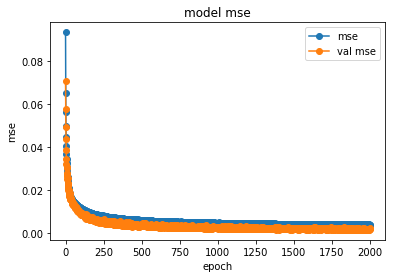

save the model


In [24]:
# -*- coding: utf-8 -*-
"""
Created on Tue Mar  7 15:43:18 2017

@author: hanar
"""
import time
import numpy as np
import os
from keras.utils import np_utils
from keras.models import Sequential
from keras.layers import Dense, Activation, Dropout
from keras.optimizers import SGD
from keras.optimizers import RMSprop
from keras.optimizers import Adagrad
from keras.optimizers import Adadelta
from keras.optimizers import Adam
from keras.optimizers import Adamax
from keras.optimizers import Nadam
from keras.callbacks import ModelCheckpoint
from keras.callbacks import EarlyStopping
from keras.callbacks import TensorBoard
from keras.models import load_model
#from keras.utils.visualize_util import plot
import matplotlib.pyplot as plt
import keras.callbacks
import keras.backend.tensorflow_backend as KTF
import tensorflow as tf

#Global variables for normalizing parameters
max_x = 1.0
min_x = 0.0
max_y = 1.0
min_y = 0.0


def deep_learning_tsunami(resdir, X_train_raw, y_train_raw, X_test_raw, y_test_raw,
                            _lr=0.02, _decay=0,
                            _validation_split=0.2, _batch_size=32,
                            _momentum=0.9, _nesterov=True,
                            num_layers=4, dropout=0.5,
                            node_num = 2500,
                            _epochs=2000):
    """
    Creating the inversion model of turbidity currents by deep learning
    """
    #Normalizing dataset
    X_train = get_normalized_data(X_train_raw, min_x, max_x)
    X_test = get_normalized_data(X_test_raw, min_x, max_x)
    y_train = get_normalized_data(y_train_raw, min_y, max_y)
    y_test = get_normalized_data(y_test_raw, min_y, max_y)
    
    #Generation of neural network model
    model = Sequential()
    model.add(Dense(node_num, input_dim=X_train.shape[1], activation='relu', kernel_initializer ='glorot_uniform'))#1st layer
    model.add(Dropout(dropout))
    for i in range(num_layers - 2):
        model.add(Dense(node_num, activation='relu', kernel_initializer ='glorot_uniform'))#2nd layer
        model.add(Dropout(dropout))
    model.add(Dense(y_train.shape[1], activation = 'relu', kernel_initializer ='glorot_uniform')) #last layer
    
    #Compiling the model
    model.compile(loss="mean_squared_error", 
              optimizer=SGD(lr=_lr, decay=_decay, momentum=_momentum, nesterov=_nesterov),
              #optimizer=Adadelta(),
              metrics=["mean_squared_error"])    
    
    #Perform learning
    t = time.time()
    check = ModelCheckpoint("model3.hdf5")
    #es_cb = EarlyStopping(monitor='val_loss', patience=5, verbose=0, mode='auto')
    #tb_cb = TensorBoard(log_dir=resdir, histogram_freq=2, write_graph=True, write_images=True)
    history = model.fit(X_train, y_train, epochs=_epochs, 
                    validation_split=_validation_split, batch_size=_batch_size,
                    callbacks=[check])
    
    #Evaluate learning result
    loss_and_metrics = model.evaluate(X_test,y_test)
    print("\nloss:{} mse:{}".format(loss_and_metrics[0],loss_and_metrics[1]))
    
    print("Elapsed time: {:.1f} sec.".format(time.time()-t))
    
    #Visualize learning result   
    #plot(model, to_file="model.png", show_shapes=True, show_layer_names=True)

    # model The state of change when letting you learnplot
    plot_history(history)
    
    return model, history

def apply_model(model, X, min_x, max_x, min_y, max_y):
    """
    Apply model
    Maximum and minimum values ​​of X and Y are required to normalize
    """
    X_norm =  (X - min_x) / (max_x - min_x)
    Y_norm = model.predict(X_norm)
    Y = Y_norm*(max_y - min_y)+min_y
    return Y

def plot_history(history):
    # Plot accuracy history
    plt.plot(history.history['mean_squared_error'],"o-",label="mse")
    plt.plot(history.history['val_mean_squared_error'],"o-",label="val mse")
    plt.title('model mse')
    plt.xlabel('epoch')
    plt.ylabel('mse')
    plt.legend(loc="upper right")
    plt.show()

#    # 損失の履歴をプロット
#    plt.plot(history.history['loss'],"o-",label="loss",)
#    plt.plot(history.history['val_loss'],"o-",label="val_loss")
#    plt.title('model loss')
#    plt.xlabel('epoch')
#    plt.ylabel('loss')
#    plt.legend(loc='upper right')
#    plt.show()

def test_model(model, x_test):
    #Test the results
    
    x_test_norm = get_normalized_data(x_test, min_x, max_x)
    test_result_norm = model.predict(x_test_norm)
    test_result = get_raw_data(test_result_norm, min_y, max_y)
    
    return test_result


def save_result(savedir, model, history, test_result):
    
    
    np.savetxt(savedir + 'test_result.txt',test_result,delimiter=',')
    np.savetxt(savedir+'loss.txt',history.history.get('loss'),delimiter=',')
    np.savetxt(savedir+'val_loss.txt',history.history.get('val_loss'),delimiter=',')
    
    #Serialize model and save
    print('save the model')
    model.save(savedir + 'model3.hdf5')

def load_data(datadir):
    """
    This function load training and test data sets, and returns variables
    """
    global min_x, max_x, min_y, max_y
    
    x_train = np.loadtxt(datadir + 'x_train.txt',delimiter=',')
    x_test = np.loadtxt(datadir + 'x_test.txt',delimiter=',')
    y_train = np.loadtxt(datadir + 'icond_train.txt',delimiter=',')
    y_test = np.loadtxt(datadir + 'icond_test.txt',delimiter=',')
    min_y = np.loadtxt(datadir + 'icond_min.txt',delimiter=',')
    max_y = np.loadtxt(datadir + 'icond_max.txt',delimiter=',')
    [min_x, max_x] = np.loadtxt(datadir + 'x_minmax.txt',delimiter=',')
    
    return x_train, y_train, x_test, y_test

def set_minmax_data(_min_x, _max_x, _min_y, _max_y):
    global min_x, max_x, min_y, max_y
    
    min_x, max_x, min_y, max_y = _min_x, _max_x, _min_y, _max_y
    return
    


def get_normalized_data(x, min_val, max_val):
    """
    Normalizing the training and test dataset
    """
    x_norm = (x - min_val) / (max_val - min_val)
    
    return x_norm

def get_raw_data(x_norm, min_val, max_val):
    """
    Get raw data from the normalized dataset
    """
    x = x_norm * (max_val - min_val) + min_val
    
    return x

if __name__ == "__main__":
    
    #Reading data  
    datadir = '/home/rimali2009/FITTNUSS-forward_training_DNN/data_g6_300grid_H_5000_20_11_roi1800/'
    resdir = '/home/rimali2009/FITTNUSS-forward_training_DNN/result_g6_300grid_H_5000_20_11_roi1800/'
    if not os.path.exists(resdir):
        os.mkdir(resdir)
    
    x_train, y_train, x_test, y_test = load_data(datadir)
    
     
    #Execution of learning
    testcases = [4500]
    for i in range(len(testcases)):
        resdir_case = resdir + '{}/'.format(testcases[i])        
        if not os.path.exists(resdir_case):
            os.mkdir(resdir_case)
        x_train_sub = x_train[0:testcases[i],:]
        y_train_sub = y_train[0:testcases[i],:]
        model, history = deep_learning_tsunami(resdir_case, x_train_sub, y_train_sub, x_test, y_test, num_layers=5)
        #Verify and save results
        result = test_model(model, x_test)
        save_result(resdir_case,model,history,result)




(500, 9)


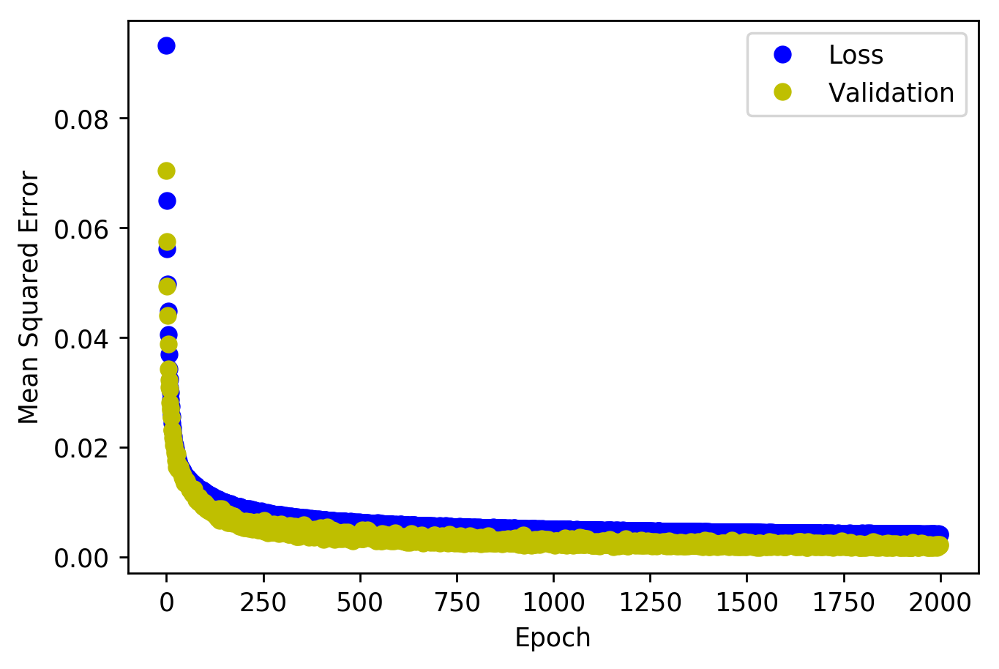

<Figure size 432x288 with 0 Axes>

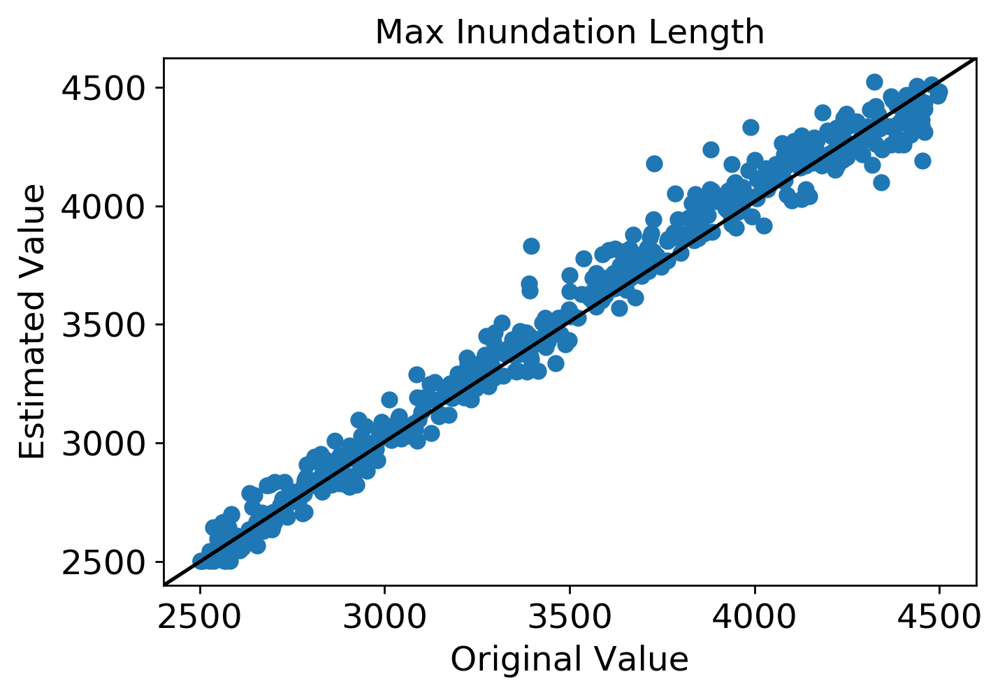

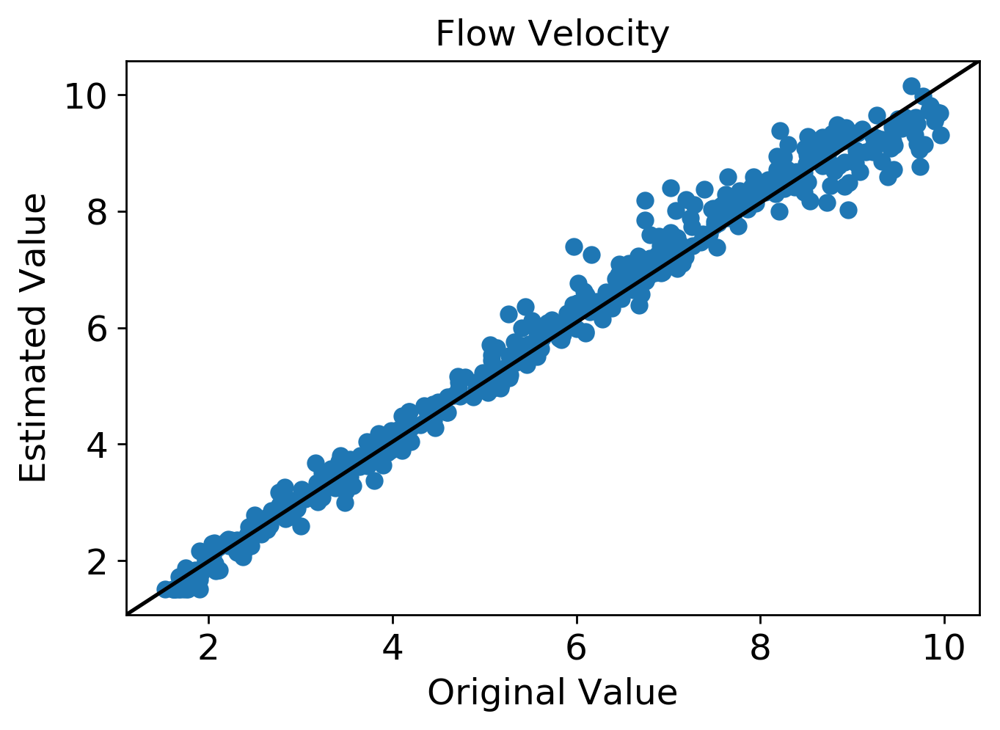

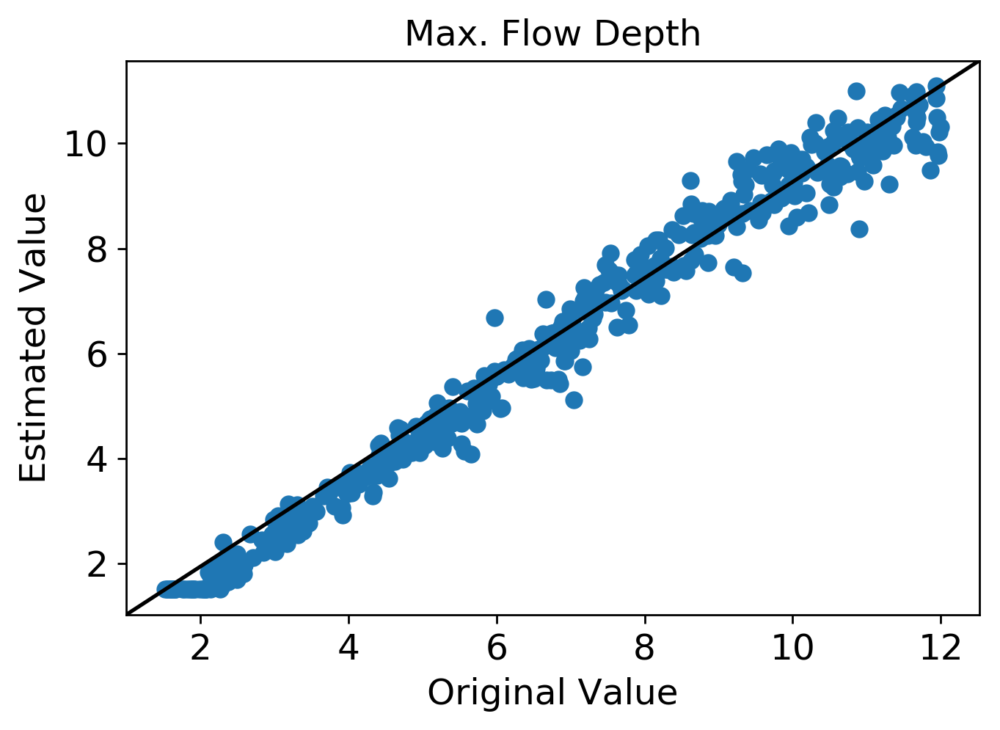

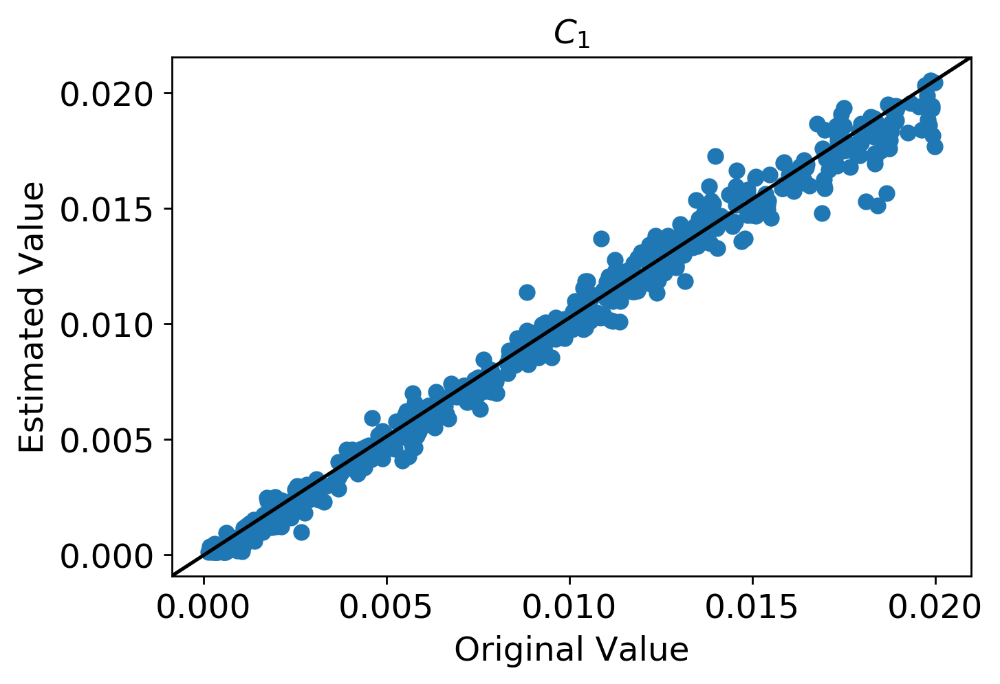

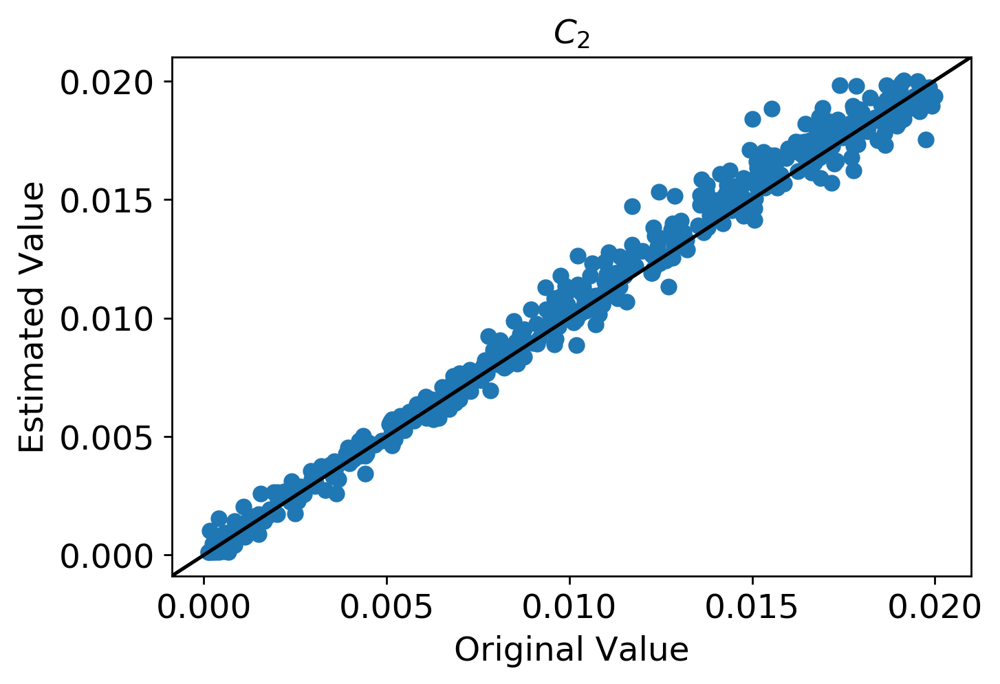

...

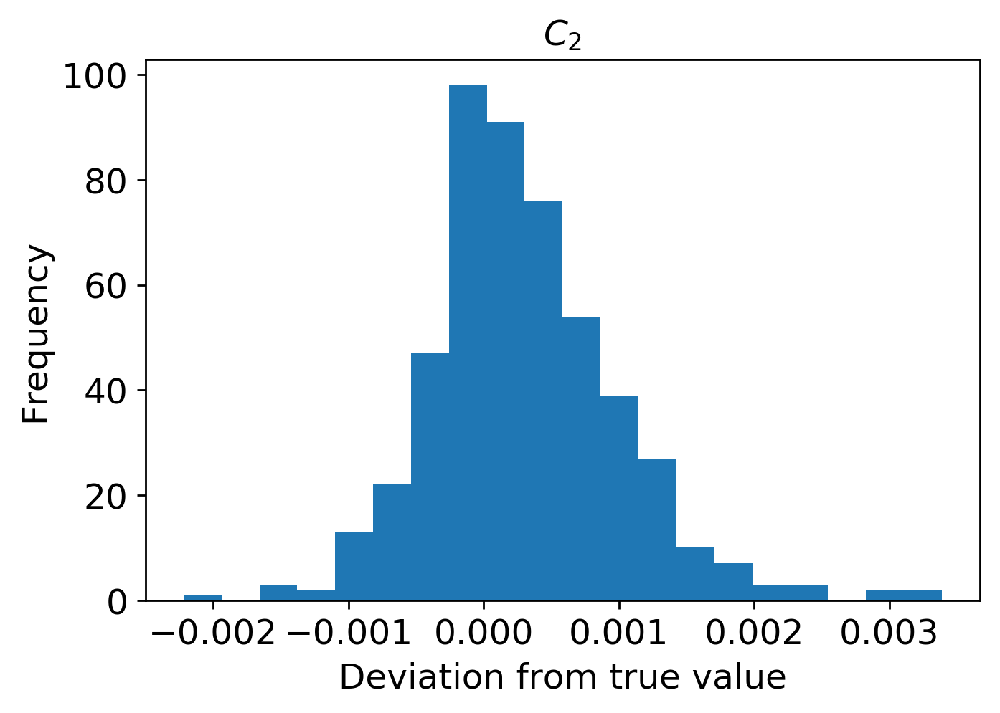

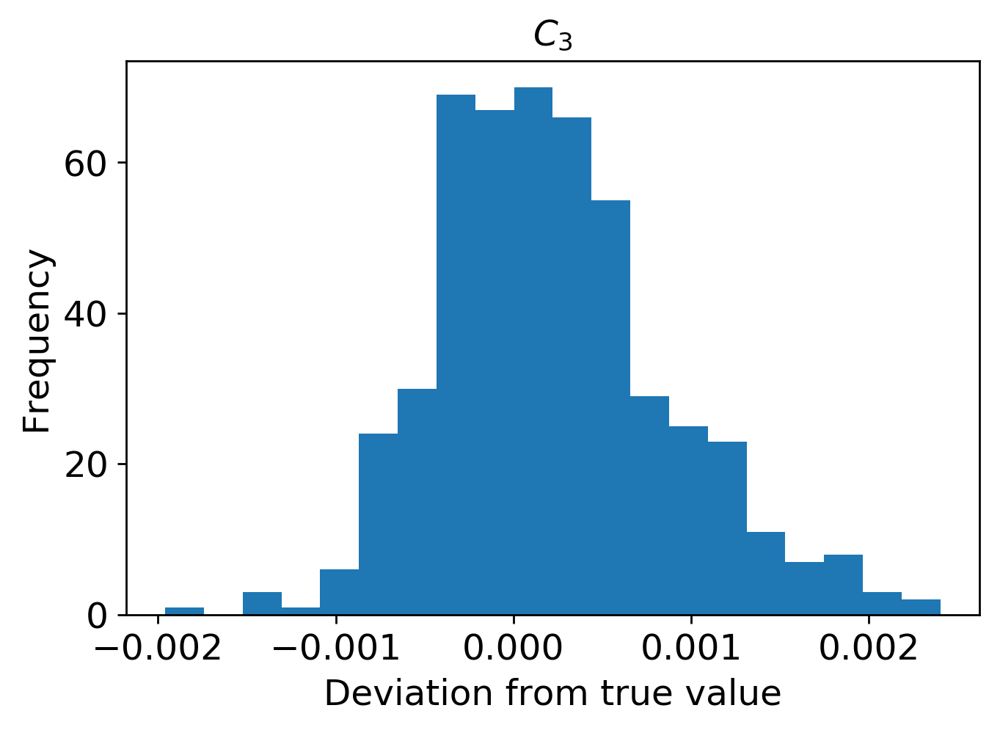

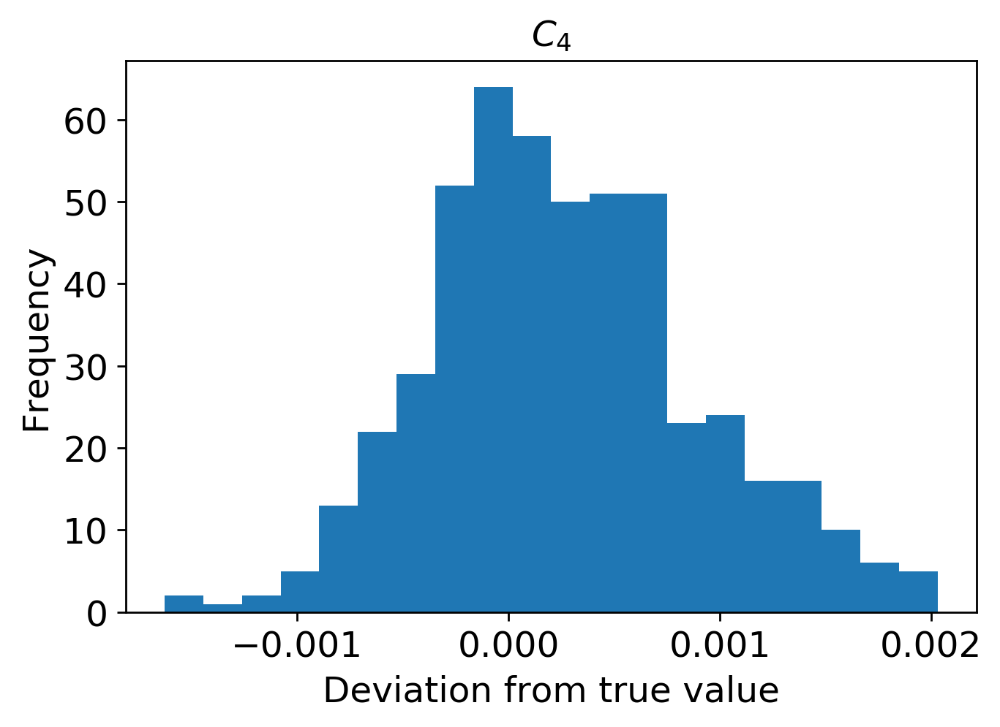

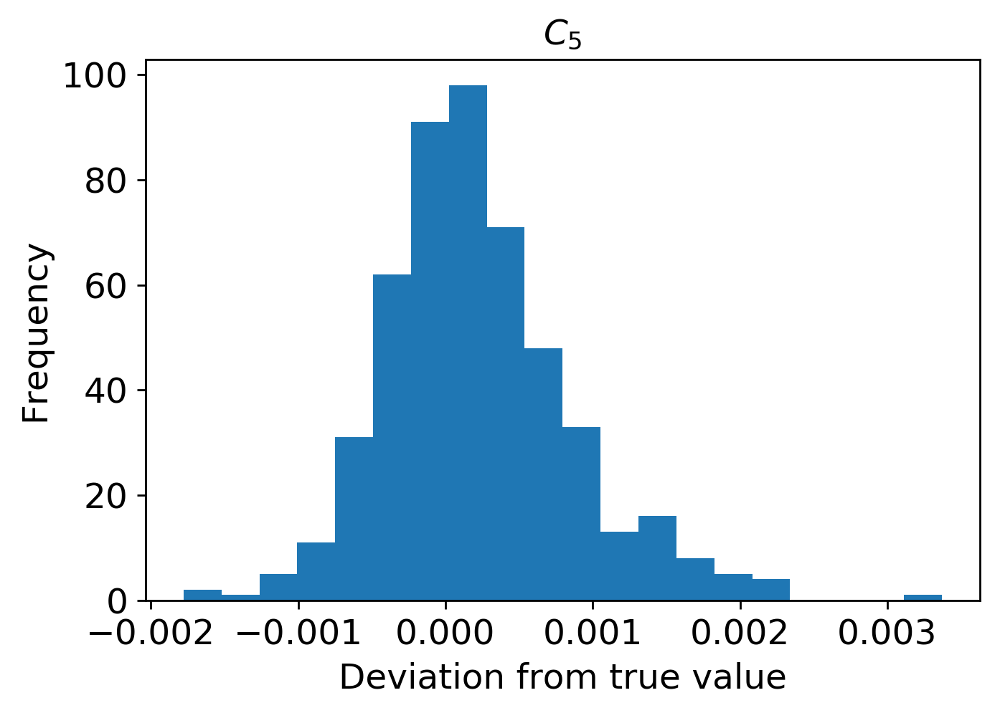

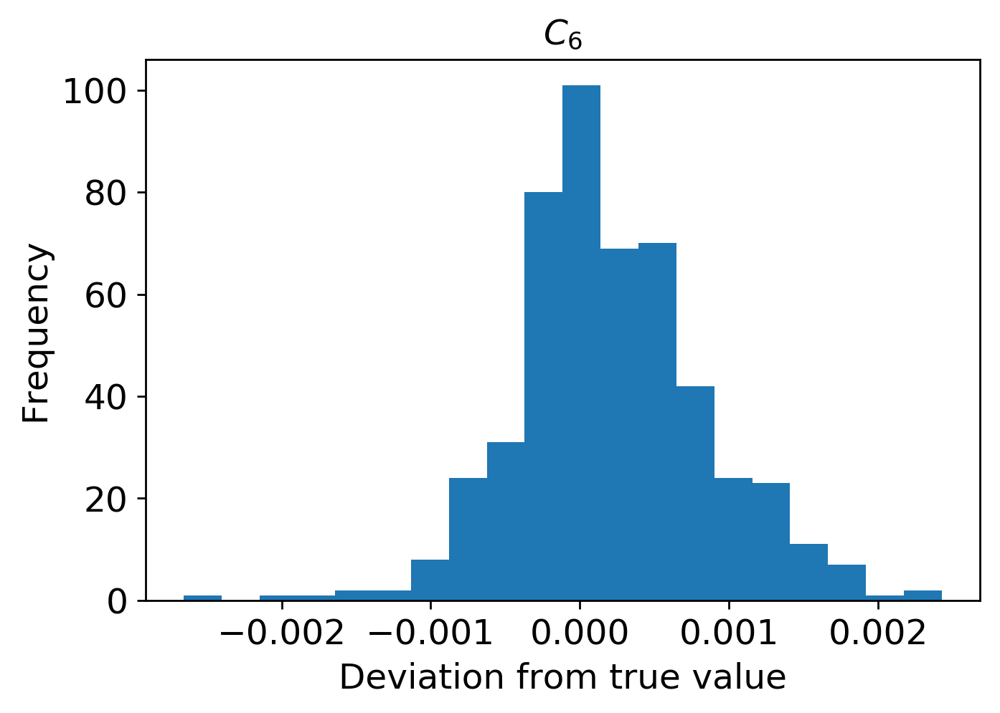

In [25]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

datadir = '/home/rimali2009/FITTNUSS-forward_training_DNN/data_g6_300grid_H_5000_20_11_roi1800/'
resdir = '/home/rimali2009/FITTNUSS-forward_training_DNN/result_g6_300grid_H_5000_20_11_roi1800/4500/'

test_result = np.loadtxt(resdir + 'test_result.txt',delimiter=',')
icond = np.loadtxt(datadir + 'icond_test.txt',delimiter=',')
print(icond.shape)
loss = np.loadtxt(resdir+'loss.txt',delimiter=',')
epoch = range(0,2000)
vloss = np.loadtxt(resdir+'val_loss.txt',delimiter=',')
resi = test_result - icond

fig = plt.figure(num=None,dpi=250, facecolor='w', edgecolor='k')
plt.plot(epoch, loss, 'bo',label='Loss')
plt.plot(epoch, vloss, 'yo',label='Validation')
plt.xlabel('Epoch')
plt.ylabel('Mean Squared Error')
plt.legend(loc="upper right")
plt.savefig(resdir+ 'mse.eps')
plt.show()

fig2 = plt.figure()
hfont = {'fontname':'Century Gothic'}
textcol = 'k'
titlelabel = ['Max Inundation Length','Flow Velocity', 'Max. Flow Depth', '$C_1$', '$C_2$', '$C_3$', '$C_4$','$C_5$','$C_6$']


    
for i in range(len(titlelabel)):
    plt.figure(num=None,dpi=250, facecolor='w', edgecolor='k')
    plt.plot(icond[:,i],test_result[:,i],"o")
    x=icond[:,i]
    y=test_result[:,i]
    y_lim = plt.ylim()
    x_lim = plt.xlim()
    plt.plot(x_lim, y_lim, 'k-', color = 'k')
    plt.ylim(y_lim)
    plt.xlim(x_lim)
    plt.xlabel('Original Value',color=textcol,size=14,**hfont)
    plt.ylabel('Estimated Value',color=textcol,size=14,**hfont)
    plt.title(titlelabel[i],color=textcol,size=14,**hfont)
    plt.tick_params(labelsize=14,colors=textcol)
    plt.savefig(resdir+titlelabel[i] + '.eps')
    #plt.show()

for i in range(len(titlelabel)):
    plt.figure(num=None,dpi=250, facecolor='w', edgecolor='k')
    plt.hist(resi[:,i],bins=20)
    plt.title(titlelabel[i],color=textcol,size=14,**hfont)
    plt.xlabel('Deviation from true value',color=textcol,size=14,**hfont)
    plt.ylabel('Frequency',color=textcol,size=14,**hfont)
    plt.tick_params(labelsize=14,colors=textcol)
    plt.savefig(resdir+titlelabel[i] + 'hist' + '.eps')
    plt.show()

       distance        g1        g2        g3        g4        g5        g6
0      0.000000  0.036771  0.167260  0.114845  0.008449  0.002190  0.005161
1    103.794102  0.000000  0.075200  0.153283  0.013753  0.001885  0.000442
2    171.620654  0.002130  0.051171  0.084309  0.006218  0.001867  0.002843
3    397.112167  0.003115  0.016359  0.078858  0.011466  0.000597  0.000054
4    595.912969  0.000732  0.016896  0.028720  0.002661  0.000914  0.000000
5    707.625749  0.000143  0.002228  0.005502  0.000900  0.000187  0.000104
6    796.435078  0.000236  0.004337  0.021204  0.003169  0.000309  0.000080
7    895.065500  0.001688  0.016059  0.081413  0.020284  0.006824  0.004628
8    988.394177  0.004567  0.008166  0.074658  0.016913  0.002424  0.001580
9   1081.819325  0.001567  0.016305  0.060234  0.011086  0.004165  0.001994
10  1195.756993  0.001022  0.002370  0.017565  0.004194  0.000567  0.000142
11  1290.372534  0.000000  0.004121  0.057974  0.014565  0.000426  0.000213
12  1400.896

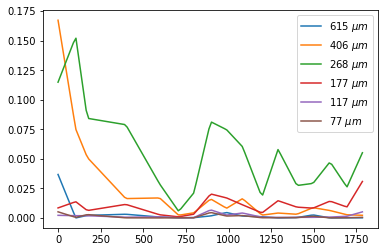

In [5]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model
from scipy import stats
from scipy.interpolate import interp1d 
import pandas as pd
from pykrige import OrdinaryKriging as OK
import ipdb


datadir = '/home/rimali2009/FITTNUSS-forward_training_DNN/data_g6_300grid_H_5000_20_11_roi1800/'
resdir = '/home/rimali2009/FITTNUSS-forward_training_DNN/result_g6_300grid_H_5000_20_11_roi1800/4500/'
#Initial setting
if not "model" in locals(): 
    model = load_model(resdir+'model3.hdf5')
#gclass = 3
#gclass_label = ["500 $\mu$m","125 $\mu$m","63 $\mu$m"]
gclass = 6
gclass_label = ["615 ${\mu}m$","406 ${\mu}m$","268 ${\mu}m$","177 ${\mu}m$", "117 ${\mu}m$","77 ${\mu}m$"]
topodx = 15.0
coord_num = int(model.layers[0].input_shape[1]/gclass)

#Acquires a value for normalizing input data to [0, 1]
min_x, max_x = np.loadtxt(datadir + 'x_minmax.txt',delimiter=',')
y_min = np.loadtxt(datadir + 'icond_min.txt',delimiter=',')
y_max = np.loadtxt(datadir + 'icond_max.txt',delimiter=',')

#Read outcrop data
#dist_max = 22000. #Distance of distal end of learning data
outcrop = pd.read_csv('../FITTNUSS-forward_training_DNN/sendai_increased_class_edit.csv')
#outcrop = pd.read_csv('../DeepLearningTurbidite_Fukuda/GA_naruse_v2.csv')
#outcrop = outcrop.append(pd.DataFrame([[0,'Loc0',0,0,0],[dist_max,'LocE',0,0,0]], columns=outcrop.columns))
outcrop = outcrop.sort_values('distance')
outcrop['distance'] = outcrop['distance'] - 0
#d = pd.DataFrame(np.zeros((1, 7)),columns=['distance', 'g1','g2','g3','g4','g5','g6'])
#print(d)
#v=np.concatenate((outcrop, d))
#print(v)
#outcrop=pd.DataFrame(v,columns=['distance', 'g1','g2','g3','g4','g5','g6'])
#outcrop['distance'].iloc[-1]=4000
#outcrop = outcrop.append(pd.DataFrame([[0,'Loc0',0,0,0,0]], columns=outcrop.columns))
print(outcrop)

#Preparation under interpolation
thick_interp = np.zeros([1,coord_num*gclass])#補間されたサンプル厚さデータ
outcrop_x_id = np.round(outcrop['distance']/topodx).astype(np.int32) #逆解析システムでのサンプリング地点のindex番号
x = np.arange(0,coord_num*topodx,topodx)

#Complement data
for j in range(gclass):
    f = interp1d(outcrop['distance'],outcrop.iloc[:,j+1], kind="linear",bounds_error=False,fill_value='extrapolate')
    #f = interp1d(outcrop['distance'],outcrop.iloc[:,j+2], kind="linear",bounds_error=False,fill_value='extrapolate') 
    #Interpolation function of jth granularity level
    thick_interp[0,coord_num*j:coord_num*(j+1)] = f(x) #Supplemented data

#ipdb.set_trace()
#Kriging Interpolation by
#vparams = np.array([[0.035, 10000., 0.001],[0.006, 10000., 0.002],[0.005, 10000., 0.002],[0.035, 10000., 0.001]])
#for j in range(gclass):
    #okip = OK(outcrop['distance'],np.zeros(outcrop['distance'].shape),outcrop.iloc[:,j+1],variogram_model='gaussian',)
    #okip.display_variogram_model()
    #ipdata, ipstd = okip.execute('grid',x,np.array([0.]))
    #ipdata = np.squeeze(ipdata)
    #thick_interp[0,coord_num*j:coord_num*(j+1)] = ipdata #Assign complemented d

#Normalize data
thick_interp[thick_interp < 0] = 0
thick_interp_norm =  (thick_interp - min_x) / (max_x - min_x)

#Perform inverse analysis
test_result_outcrop = model.predict(thick_interp_norm)
test_result_outcrop = test_result_outcrop * (y_max - y_min) + y_min
print(test_result_outcrop)
#add=np.array(3000)
#test_result_outcrop_add=np.concatenate((add,test_result_outcrop), axis=None)
#Output results
#print(test_result_outcrop_add)
np.savetxt('outcrop_result_g6_g300_H_5000_20_11_roi1800.txt',test_result_outcrop, delimiter=',')
for i in range(len(gclass_label)):
    plt.plot(x,thick_interp[0,coord_num * i:coord_num * (i+1)],label=gclass_label[i])
plt.legend()
plt.show()



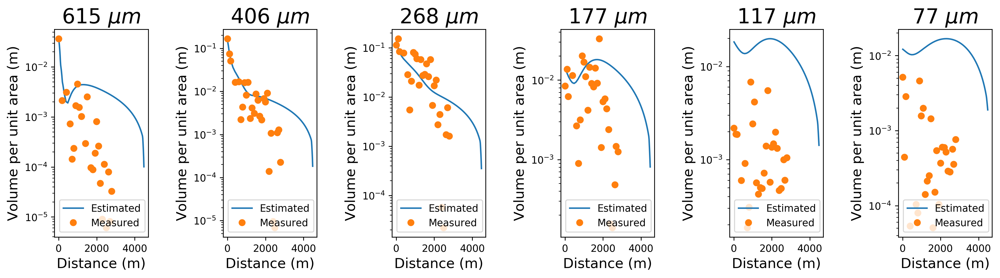

In [27]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import Forward_model_modified_FITTNUSS_5000_g6_300grid_19_11_case2 as fmodel
import time
import ipdb
%matplotlib inline

#Basic setting

#dist_max = 3000.
gclass = 6
topodx=15.0
gclass_name = ['615microm','406microm','268microm','177microm','117microm','77microm']
#gclass_name = ['500micron', '125micron', '63micron']
gname_tex = ["615 ${\mu}m$","406 ${\mu}m$","268 ${\mu}m$","177 ${\mu}m$", "117 ${\mu}m$","77 ${\mu}m$"]
#gname_tex = ['500 $\mu$m','125 $\mu$m','63 $\mu$m']
#calcdir = 'home/rimali2009/FITTNUSS-forward_training_DNN/'
#calcdir = '/home/naruse/Documents/Documents/MATLAB/TCtrainData_forML/TCModel_for_MLTEST/test_output_otadai07/'

#Load estimate
#H1 = np.loadtxt(calcdir + 'H1.txt',delimiter=',')
#H2 = np.loadtxt(calcdir + 'H2.txt',delimiter=',')
#H3 = np.loadtxt(calcdir + 'H3.txt',delimiter=',')
#H4 = np.loadtxt(calcdir + 'H4.txt',delimiter=',')
#Ht = np.loadtxt(calcdir + 'Ht.txt',delimiter=',')
#U = np.loadtxt(calcdir + 'U.txt',delimiter=',')
#xi = np.loadtxt(calcdir + 'xi.txt',delimiter=',')
#x = np.loadtxt(calcdir + 'x.txt',delimiter=',')
#x_bed = np.loadtxt(calcdir + 'x_init.txt',delimiter=',')
#eta_init = np.loadtxt(calcdir + 'eta_init.txt',delimiter=',')
#Ct = np.loadtxt(calcdir + 'Ct.txt',delimiter=',')
#time = np.loadtxt(calcdir + 'time.txt',delimiter=',')
estimated_icond=np.loadtxt('outcrop_result_g6_g300_H_5000_20_11_roi1800.txt', delimiter=',')
start = time.time()
fmodel.read_setfile("config_g6_300grid_19_11_case2.ini")
(x,C,x_dep,deposit) = fmodel.forward(estimated_icond)
np.savetxt('eta_estimated_thickness_5K_g6_TC4_Rwcnst_H_5000_20_11_roi1800.csv', deposit, delimiter=',')
np.savetxt('eta_estimated_Distance_5K_g6_TC4_Rwcnst_H_5000_20_11_roi1800.csv', x_dep,delimiter=',')
estimated_dep_thickness_5000=np.transpose(np.loadtxt('/home/rimali2009/FITTNUSS-forward_training_DNN/'+'eta_estimated_thickness_5K_g6_TC4_Rwcnst_H_5000_20_11_roi1800.csv', delimiter=','))
estimated_dep_thickness_5000=pd.DataFrame(estimated_dep_thickness_5000,columns=['615microm','406microm','268microm','177microm','117microm','77microm'])
estimated_dep_distance_5000=np.transpose(np.loadtxt('/home/rimali2009/FITTNUSS-forward_training_DNN/'+'eta_estimated_Distance_5K_g6_TC4_Rwcnst_H_5000_20_11_roi1800.csv', delimiter=','))
estimated_dep_distance_5000=pd.DataFrame(estimated_dep_distance_5000,columns=['distance'])
estimated_dep_5000=pd.concat([estimated_dep_distance_5000,estimated_dep_thickness_5000],axis=1)
np.savetxt('estimated_dep_5K_g6_TC4_Rwcnst_H_5000_20_11_roi1800.csv',estimated_dep_5000,delimiter=',')
#data_estim=pd.DataFrame(estimated_dep_5000,columns=['distance','1.5phi','2.5phi','3.5phi','4.5phi'])

#Formatting the loaded data
#estimated_dep_df = pd.DataFrame(estimated_dep,columns=['distance','1.5phi','2.5phi','3.5phi','4.5phi'])
#estimated_dep = pd.DataFrame(np.array([x_bed - dist_offset,H1[-1,:],H2[-1,:],H3[-1,:]]).T,columns=['distance','500micron','125micron','63micron'])
estimated_dep_5000= estimated_dep_5000.query('distance > 0')
#estimated_dep_5000 = estimated_dep_5000.query('distance < {}'.format(dist_max))

#Read original data
outcrop = pd.read_csv('../FITTNUSS-forward_training_DNN/sendai_increased_class.csv')
outcrop= pd.DataFrame(outcrop,columns=['distance','615microm','406microm','268microm','177microm','117microm','77microm'])
#outcrop = pd.read_csv('../DeepLearningTurbidite_Fukuda/GA_naruse_v2.csv')
#outcrop = outcrop.append(pd.DataFrame([[0,'Loc0',0,0,0],[dist_max,'LocE',0,0,0]], columns=outcrop.columns))
#outcrop = outcrop.sort_values('distance')
#outcrop['distance'] = outcrop['distance'] - 1000

#Plot
plt.figure(num=None, figsize=(17, 4), dpi=250, facecolor='w', edgecolor='g')
hfont = {'fontname':'Sans'}
plt.subplots_adjust(bottom=0.15, wspace=0.8)

for i in range(gclass):
    plt.subplot(1,gclass,i+1)
    plt.plot(estimated_dep_5000['distance'],estimated_dep_5000[gclass_name[i]],'-', label='Estimated')
    plt.plot(outcrop['distance'], outcrop[gclass_name[i]],'o', label='Measured')
    plt.yscale('log')
    plt.title(gname_tex[i], size=21,**hfont)
    plt.xlabel('Distance (m)', size = 14, **hfont)
    plt.ylabel('Volume per unit area (m)', size = 14, **hfont)
    plt.legend(fontsize=10)
    plt.savefig("thickness_distance_curve_5000_g6_300grid_H_5000_20_11_roi1800.png")
    plt.savefig("thickness_distance_curve_5000_g6_300grid_H_5000_20_11_roi1800.eps")
plt.show()



Using TensorFlow backend.


       distance        g1        g2        g3        g4        g5        g6
0      0.000000  0.036771  0.167260  0.114845  0.008449  0.002190  0.005161
1    103.794102  0.000000  0.075200  0.153283  0.013753  0.001885  0.000442
2    171.620654  0.002130  0.051171  0.084309  0.006218  0.001867  0.002843
3    397.112167  0.003115  0.016359  0.078858  0.011466  0.000597  0.000054
4    595.912969  0.000732  0.016896  0.028720  0.002661  0.000914  0.000000
5    707.625749  0.000143  0.002228  0.005502  0.000900  0.000187  0.000104
6    796.435078  0.000236  0.004337  0.021204  0.003169  0.000309  0.000080
7    895.065500  0.001688  0.016059  0.081413  0.020284  0.006824  0.004628
8    988.394177  0.004567  0.008166  0.074658  0.016913  0.002424  0.001580
9   1081.819325  0.001567  0.016305  0.060234  0.011086  0.004165  0.001994
10  1195.756993  0.001022  0.002370  0.017565  0.004194  0.000567  0.000142
11  1290.372534  0.000000  0.004121  0.057974  0.014565  0.000426  0.000213
12  1400.896

(1, 9)
[[4.52725126e+03 5.44546184e+00 4.32004720e+00 4.95261233e-03
  2.14444906e-02 1.93299424e-02 1.72101067e-03 2.16957608e-03
  1.46994081e-03]]
       distance        g1        g2        g3        g4        g5        g6
0      0.000000  0.036771  0.167260  0.114845  0.008449  0.002190  0.005161
1    103.794102  0.000000  0.075200  0.153283  0.013753  0.001885  0.000442
2    171.620654  0.002130  0.051171  0.084309  0.006218  0.001867  0.002843
3    397.112167  0.003115  0.016359  0.078858  0.011466  0.000597  0.000054
4    595.912969  0.000732  0.016896  0.028720  0.002661  0.000914  0.000000
5    707.625749  0.000143  0.002228  0.005502  0.000900  0.000187  0.000104
6    796.435078  0.000236  0.004337  0.021204  0.003169  0.000309  0.000080
7    988.394177  0.004567  0.008166  0.074658  0.016913  0.002424  0.001580
8   1081.819325  0.001567  0.016305  0.060234  0.011086  0.004165  0.001994
9   1195.756993  0.001022  0.002370  0.017565  0.004194  0.000567  0.000142
10  1290.37253

/home/rimali2009/anaconda3/envs/test3/lib/python3.6/site-packages/matplotlib/font_manager.py:1241: UserWarning: findfont: Font family ['Century Gothic'] not found. Falling back to DejaVu Sans.
  (prop.get_family(), self.defaultFamily[fontext]))


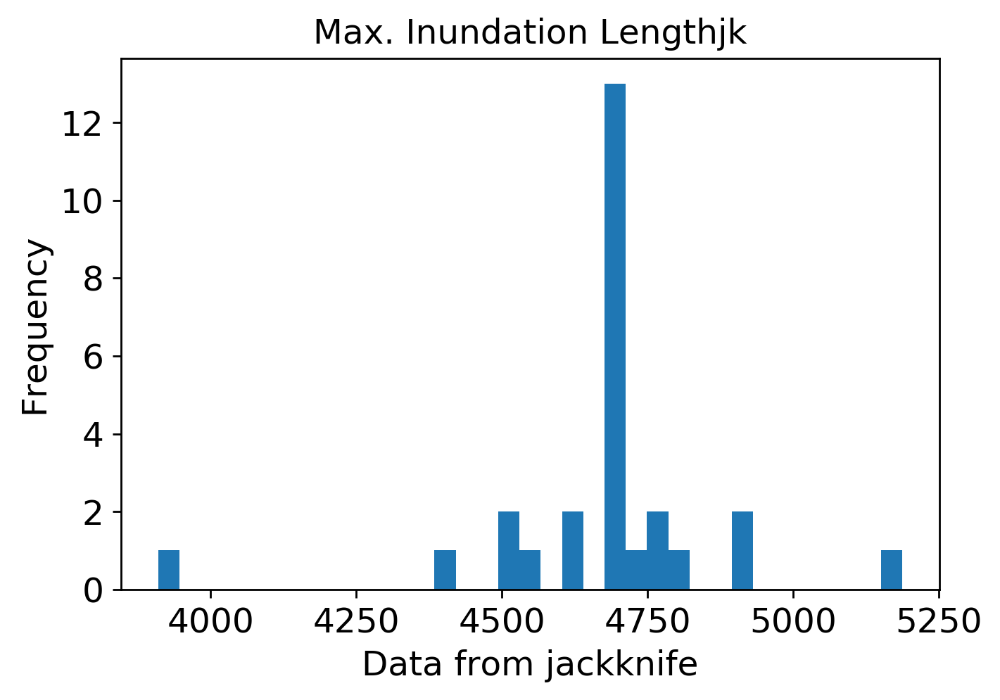

mean: 5.424411122873462
jk_e: 0.07024769974839465


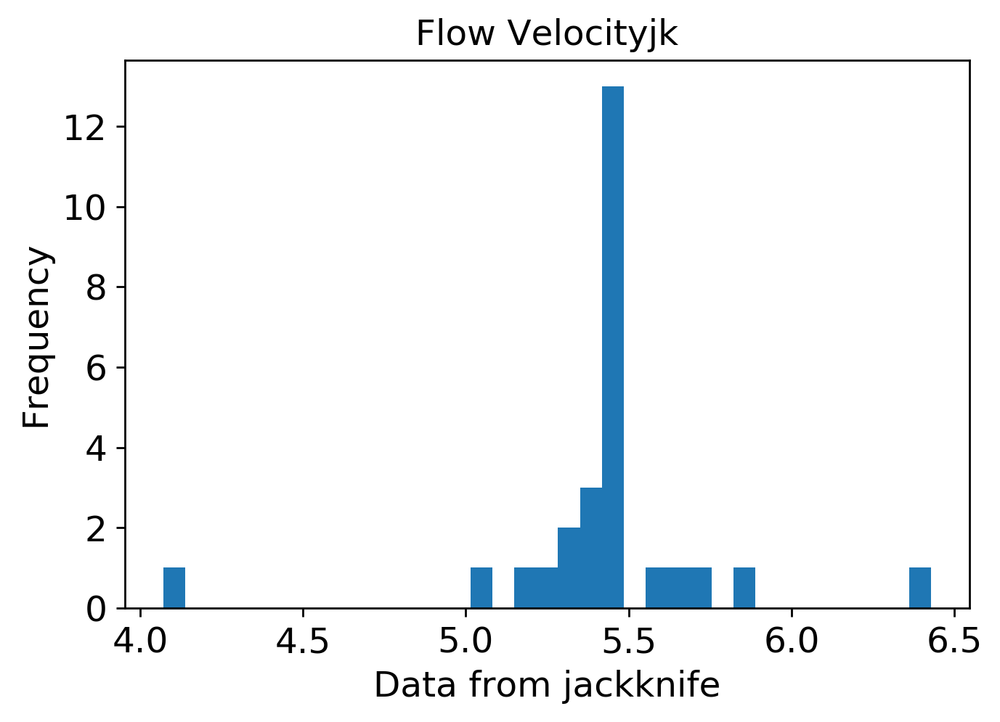

mean: 4.165788127726437
jk_e: 0.050637920592813315


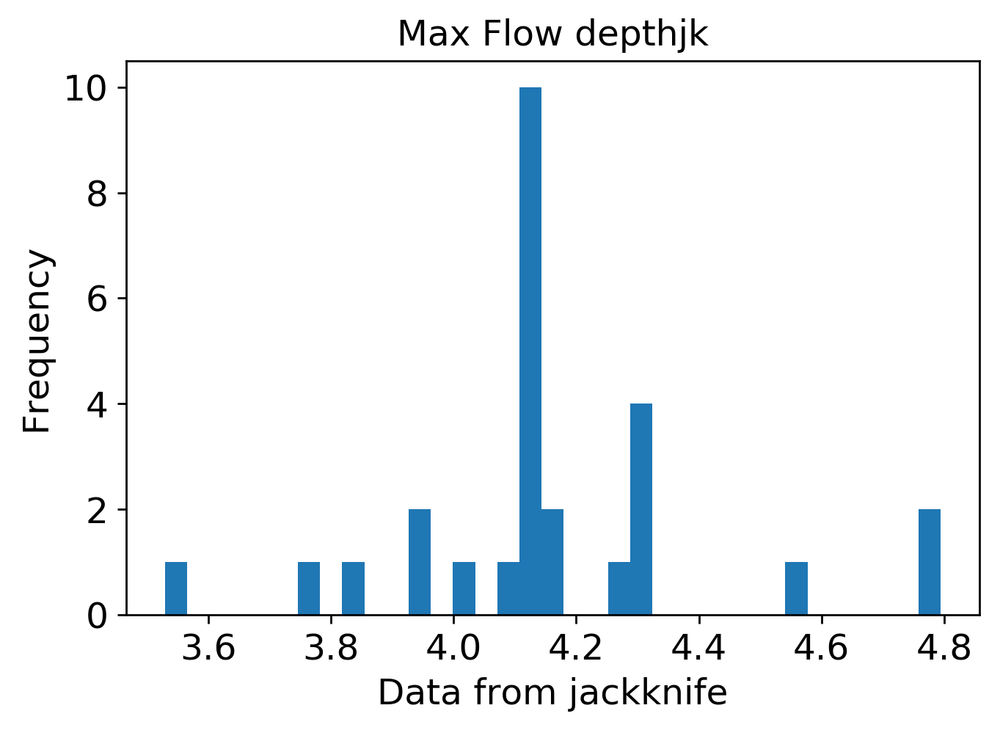

mean: 0.004980423955577962
jk_e: 0.0001868125326090023


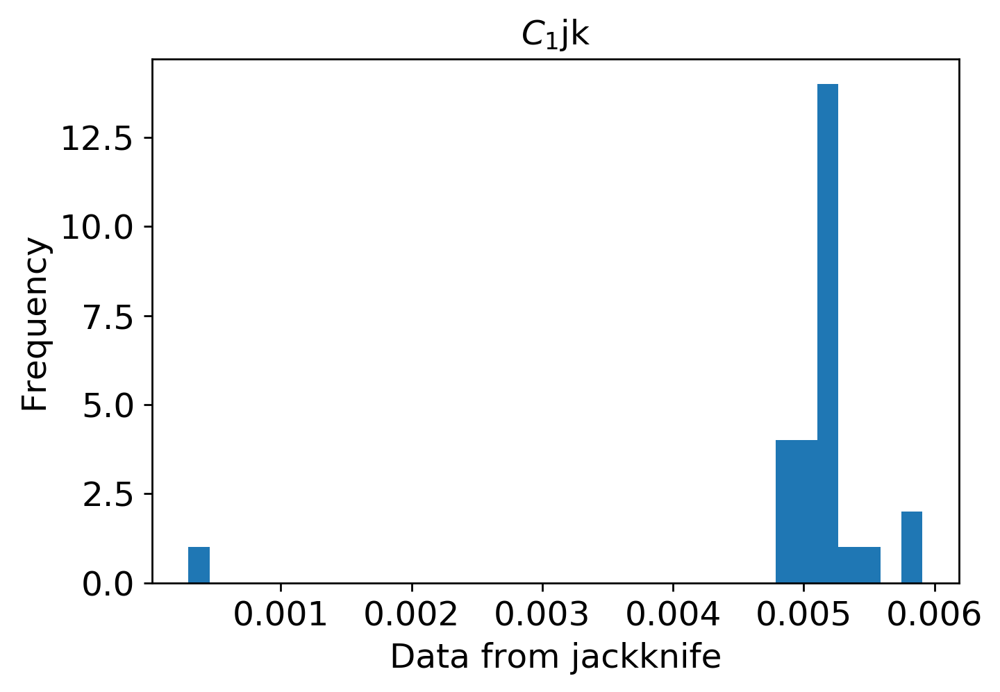

mean: 0.02157482498527186
jk_e: 0.0002448346353801604


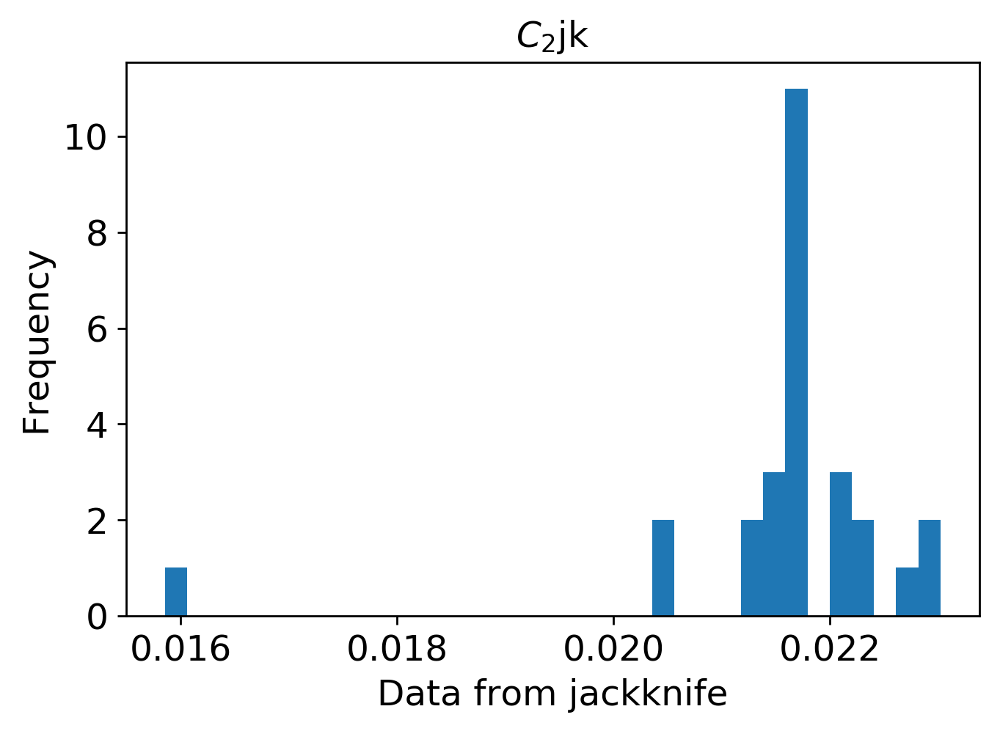

mean: 0.020450745414749012
jk_e: 0.0003010308758779255


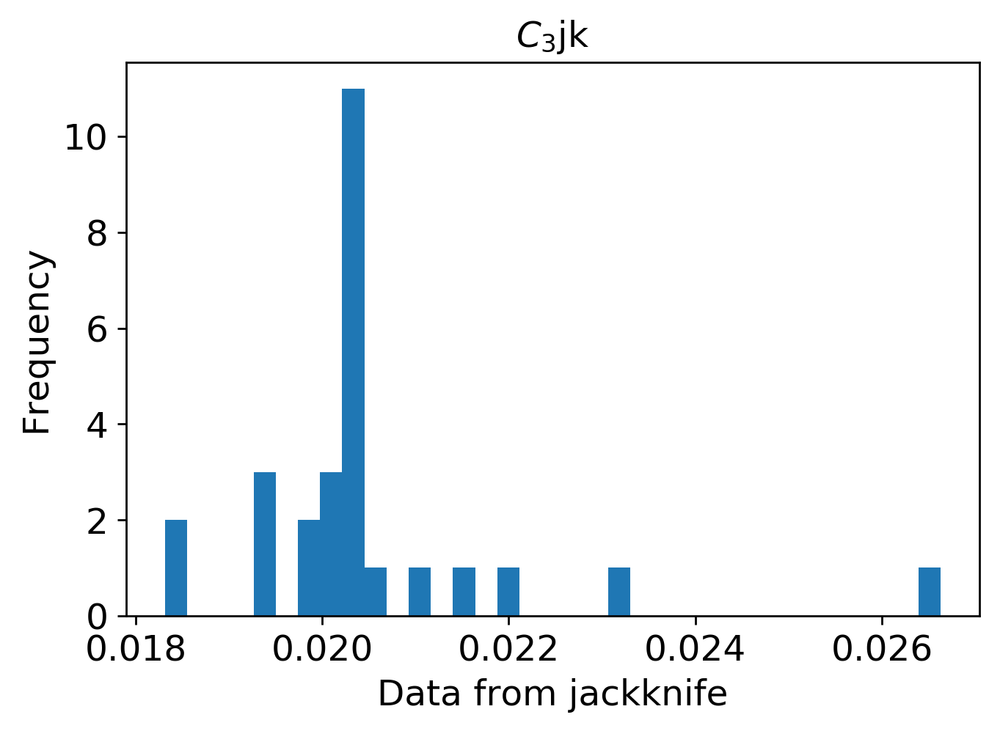

mean: 0.002121728692567502
jk_e: 8.173483832759471e-05


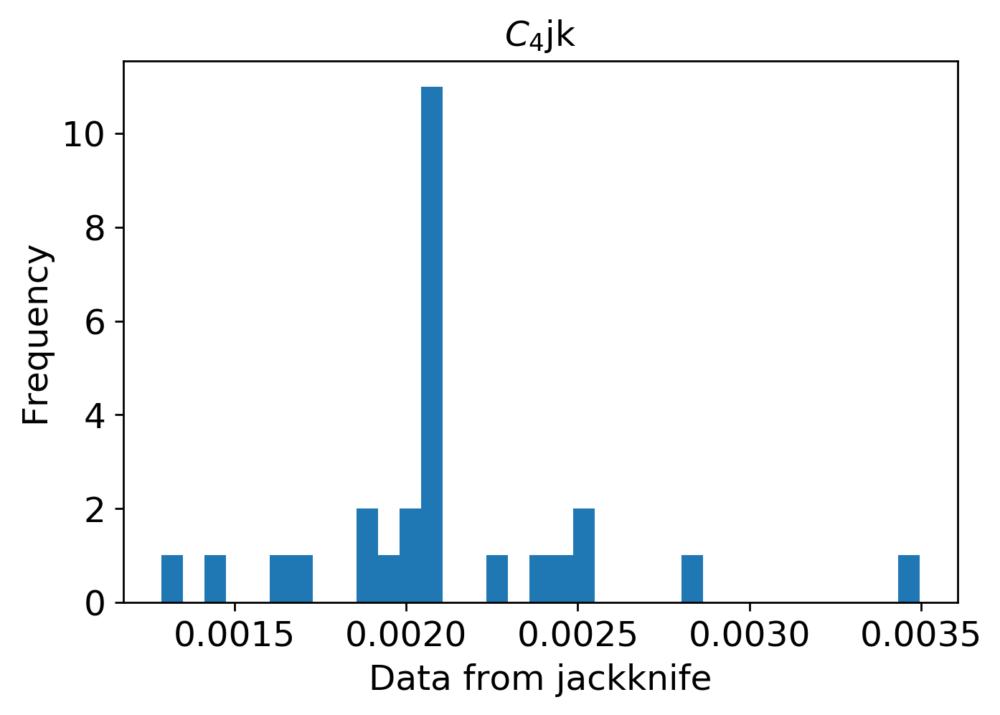

mean: 0.0026417836508715775
jk_e: 0.00010028768985861985


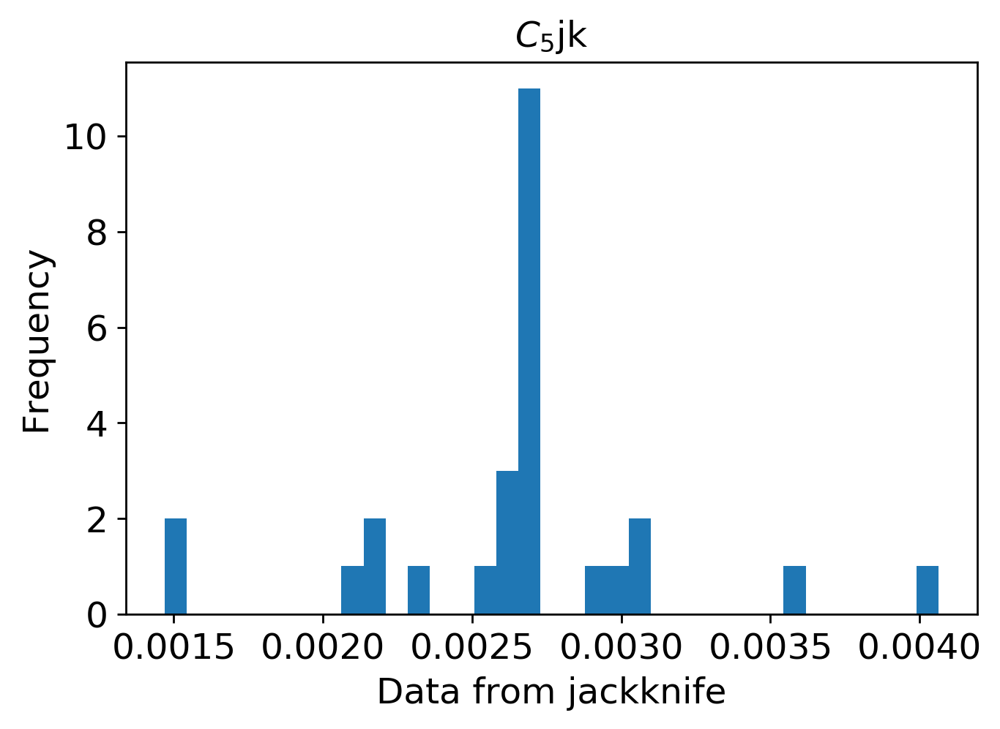

mean: 0.0017791109643837762
jk_e: 6.541641832867816e-05


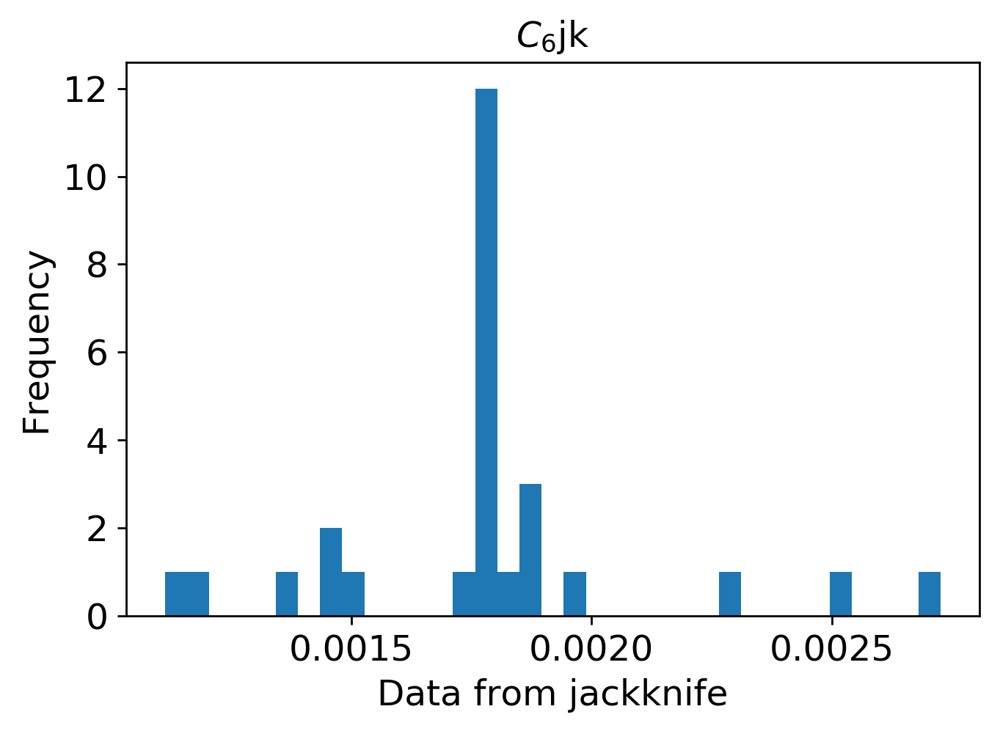

In [1]:
# Jackknife Method
import csv
import numpy as np
import pandas as pd
import math
from keras.models import load_model
from scipy.interpolate import interp1d
import matplotlib.pyplot as plt
%matplotlib inline

datadir = '/home/rimali2009/FITTNUSS-forward_training_DNN/data_g6_300grid_H_5000_20_11_roi1800/'
resdir = '/home/rimali2009/FITTNUSS-forward_training_DNN/result_g6_300grid_H_5000_20_11_roi1800/4500/'
# Initial setting
if not "model" in locals():
    model = load_model(resdir+'model3.hdf5')
gclass = 6
gclass_label = ["615 ${\mu}m$", "406 ${\mu}m$", "268 ${\mu}m$",
                "177 ${\mu}m$", "117 ${\mu}m$", "77 ${\mu}m$"]
topodx = 15.0
coord_num = int(model.layers[0].input_shape[1]/gclass)
min_x, max_x = np.loadtxt(datadir + 'x_minmax.txt', delimiter=',')
y_min = np.loadtxt(datadir + 'icond_min.txt', delimiter=',')
y_max = np.loadtxt(datadir + 'icond_max.txt', delimiter=',')


a = pd.read_csv(
    '../FITTNUSS-forward_training_DNN/sendai_increased_class_edit.csv', delimiter=',')
print(a)
y = pd.DataFrame()
output = []

with open('output_final_20_11_roi1800.csv', 'w') as outfile:

    # x=[]
    for index in range(len(a)):
        df = y.append(pd.read_csv(
            '../FITTNUSS-forward_training_DNN/sendai_increased_class_edit.csv', skiprows=[index+1]))
        print(df)
        df = df.sort_values('distance')
        thick_interp = np.zeros([1, coord_num*gclass])
        x = np.arange(0, coord_num*topodx, topodx)
        for j in range(gclass):
            # Interpolation function of jth granularity level
            f = interp1d(df['distance'], df.iloc[:, j+1],
                         kind="linear", bounds_error=False,fill_value='extrapolate')
            thick_interp[0, coord_num*j:coord_num*(j+1)] = f(x)
        thick_interp[thick_interp < 0] = 0
        thick_interp_norm = (thick_interp - min_x) / (max_x - min_x)
        test_result_outcrop = model.predict(thick_interp_norm)
        test_result_outcrop = test_result_outcrop * (y_max - y_min) + y_min
        print(test_result_outcrop.shape)
        print(test_result_outcrop)
    # output.append(test_result_outcrop)
        np.savetxt(outfile,test_result_outcrop, delimiter=',')
        # outfile.write('# New iteration\n')
hfont = {'fontname': 'Century Gothic'}
textcol = 'k'
resi = np.loadtxt('output_final_20_11_roi1800.csv', delimiter=',')
titlelabel = ['Max. Inundation Lengthjk','Flow Velocityjk', 'Max Flow depthjk',
              '$C_1$jk', '$C_2$jk', '$C_3$jk', '$C_4$jk', '$C_5$jk', '$C_6$jk']
jk_er=[]
with open('jk_e_roi1800.txt','wb') as ftext:
    for i in range(len(titlelabel)):
        plt.figure(num=None, dpi=250, facecolor='w', edgecolor='k')
        plt.hist(resi[:, i], bins=35)
        mean = sum(resi[:,i]) / len(resi[:,i])
        print("mean:",mean)
        var_jk  = sum(pow(x-mean,2) for x in resi[:,i]) / ((len(resi[:,i])-1)*(len(resi[:,i])))
        jk_e= math.sqrt(var_jk)
        print("jk_e:",jk_e)
        e=np.append(jk_e,jk_er)
        np.savetxt(ftext,e,delimiter=',')
        plt.title(titlelabel[i], color=textcol, size=14, **hfont)
        plt.xlabel('Data from jackknife', color=textcol, size=14, **hfont)
        plt.ylabel('Frequency', color=textcol, size=14, **hfont)
        plt.tick_params(labelsize=14, colors=textcol)
        plt.savefig(resdir+titlelabel[i] + 'jkhist' + '.eps')
        plt.show()
